In [2]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
from utils import constants as cnst
from eod import msg
from utils import u_grid, u_interpolate as u_int, u_darrays as uda, u_arrays as ua
import datetime
import matplotlib.colors as mcolors
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
from utils import u_plot as uplot
import salem
import numpy.ma as ma
from scipy import stats, ndimage
import warnings
from scipy.ndimage.measurements import label
import pickle as pkl
import matplotlib.patches as patches


pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

In [1]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


In [3]:
fpath = cnst.network_data + 'figs/HUARAZ/'

In [4]:
def readERA(var):

    u200orig = xr.open_dataset('/media/ck/Elements/SouthAmerica/ERA5/hourly/'+var+'_15UTC_1981-2019_peru_big.nc')
    u200orig = uda.flip_lat(u200orig)
    datetimes = pd.to_datetime(u200orig.time.values)
    newtimes = []
    for t in datetimes:
        newtimes.append(t.replace(hour=0))
    u200orig['time'] = ('time', newtimes)
    return u200orig

In [5]:
era = readERA('u200')
era = era.sel(latitude=slice(-25,0), longitude=slice(-81,-65))

In [6]:
era850 = readERA('v850')
era850 = era850.sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()

In [7]:
topo = xr.open_dataarray(cnst.TOPO_1MIN).sel(lon=slice(-81,-65), lat=slice(-25,0))
topo_on_g = era850.salem.lookup_transform(topo)

In [8]:
tir_on_era = xr.open_mfdataset('/home/ck/DIR/mymachine/GRIDSAT/MCS18_peru/daily_-15ALLkm2_UTC_DAY_onBIGERA/*.nc',
                                combine='nested', concat_dim='time')
tir_doypick = tir_on_era['tir'].sel(time=((tir_on_era['time.year']>=1985)&(tir_on_era['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-65))
tir_monthly = tir_doypick.resample(time = '1m').mean()

In [9]:
ch_on_era = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/CHIRPS/SA_daily_onERA/CHIRPS_daily_onERA_*.nc')
chirps_doypick = ch_on_era['precip'].sel(time=((ch_on_era['time.year']>=1985)&(ch_on_era['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-65)).where(topo_on_g>=2000)
chirps_bimod = chirps_doypick#.rolling(time=30, min_periods=3, center=True).mean()#.where((chirps_doypick['time.month']!=8))
chirps_monthly = chirps_doypick.resample(time = '1m').mean()

In [10]:
regions = {
'equatorial' : [(-5,0)],
'transition' : [(-8,-5)],
'central' : [(-12,-8)],
'southern' : [(-18,-15)]}
h = 2000
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)
sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)

In [11]:
corrdic = pkl.load(open(cnst.network_data + 'data/HUARAZ/saves/corr_GRIDSAT-15_start_end.p', "rb"))

In [12]:
corr_start = corrdic['start_3d']
corr_end = corrdic['end_5d']

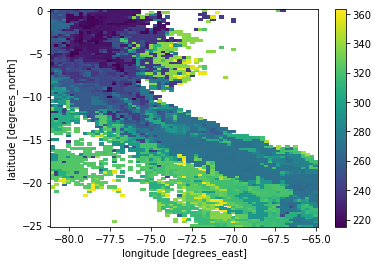

In [13]:
corr_start.plot()

In [14]:
wet_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/wet_spells_1mm_3-7days_StartOfSpell.nc')
#wet_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/wet_spells_1mm_3-4_5-6_7-8_days_StartOfSpell.nc')

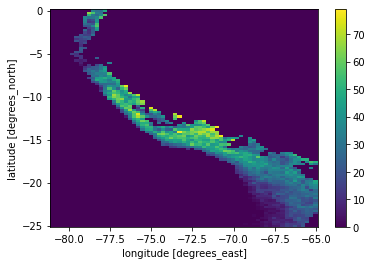

In [15]:
wet_test.where(wet_test==7).count('time').plot()

In [16]:
dry_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/dry_spells_1mm_3-7days_StartOfSpell.nc')
#wet_spells_1mm_3-4_5-6_7-8_days_StartOfSpell.nc
#dry_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/dry_spells_1mm_3-4_5-6_7-8_days_StartOfSpell.nc')
alls = regions['central']

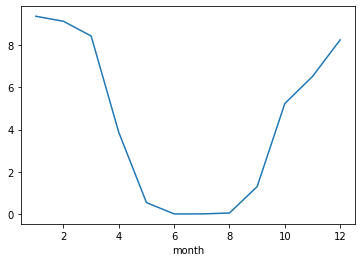

In [17]:
wet_test.where(wet_test>=3).sel(latitude=slice(alls[0][0], alls[0][1])).count(['latitude','longitude']).groupby('time.month').mean().plot()

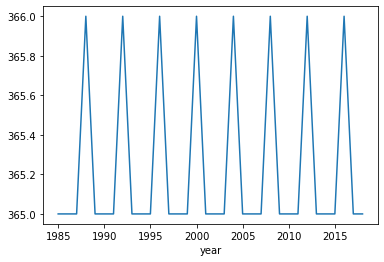

In [18]:
dry_test.where(dry_test>=7).sel(latitude=slice(alls[0][0], alls[0][1])).count(['latitude','longitude']).groupby(wet_test['time.year']).count().plot()

In [19]:
vvod = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/VOD/onERA/*.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()

In [141]:
vvod['vod']

<xarray.DataArray 'vod' (time: 6940, latitude: 101, longitude: 65)>
array([[[       nan,        nan,        nan, ..., 0.55380059,
         0.55380059, 0.56117244],
        [       nan,        nan,        nan, ..., 0.55380059,
         0.55380059, 0.56117244],
        [       nan,        nan,        nan, ..., 0.52502376,
         0.52502376, 0.55570449],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan, 0.53744384],
        [       nan,        nan,        nan, ...,        nan,
                nan, 0.53744384],
        [       nan,        nan,        nan, ..., 0.61876898,
         0.61876898, 0.63603199]],

       [[       nan,        nan,        nan, ..., 0.48215789,
         0.48215789, 0.62915856],
        [       nan,        nan,        nan, ..., 0.48215789,
         0.48215789, 0.62915856],
        [       nan,        nan,        nan, ..., 0.55896395,
         0.55896395, 0.51484111],
...
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan]],

       [[       nan,        nan,        nan, ..., 0.5450001 ,
         0.5450001 , 0.66142699],
        [       nan,        nan,        nan, ..., 0.5450001 ,
         0.5450001 , 0.66142699],
        [       nan,        nan,        nan, ..., 0.50358424,
         0.50358424, 0.5807718 ],
        ...,
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ..., 0.60782905,
         0.60782905, 0.64985664]]])
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T12:00:00 ... 2018-12-31T12:00:00
  * longitude  (longitude) float32 -81.0 -80.75 -80.5 ... -65.5 -65.25 -65.0
  * latitude   (latitude) float32 -25.0 -24.75 -24.5 -24.25 ... -0.5 -0.25 0.0
Attributes:
    long_name:   Vegetation optical depth
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

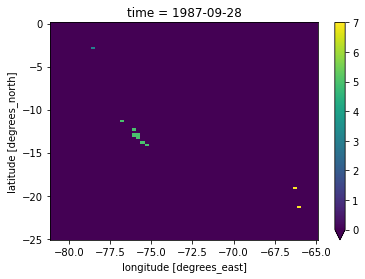

In [20]:
dry_test.isel(time=1000).plot(vmin=0)

In [21]:
ndvi = xr.open_dataset('/media/ck/Elements/SouthAmerica/NDVI/onERA/NDVI_all_times.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65))

In [22]:
sm = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/SM_CSI_ESA/onERA/*.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()
sm = sm['sm'].where(sm<999)

In [23]:
cutd = dry_test # spell
datdry = cutd.where(cutd>0)#.sel(time=cut['time.year']>=2000)

cutw = wet_test # spell
datwet = cutw.where(cutw>0)#.sel(time=cut['time.year']>=2000)

chdat = chirps_doypick
chclim = chdat.groupby('time.dayofyear').mean('time').load().rolling(dayofyear=20, min_periods=1, center=True).mean()#.sel(time=cut['time.year']>=2000)
vod_clim = vvod['vod'].groupby('time.dayofyear').mean('time').rolling(dayofyear=20, min_periods=1, center=True).mean()
ndvi_clim = ndvi['precip'].groupby('time.dayofyear').mean('time').rolling(dayofyear=3, min_periods=1, center=True).mean()
vod = vvod['vod'].rolling(time=3, min_periods=1, center=True).mean()
vod_diff = vod_clim.max('dayofyear')-vod_clim.min('dayofyear')

sm_clim = sm.groupby('time.dayofyear').mean('time').rolling(dayofyear=20, min_periods=1, center=True).mean()

/home/ck/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


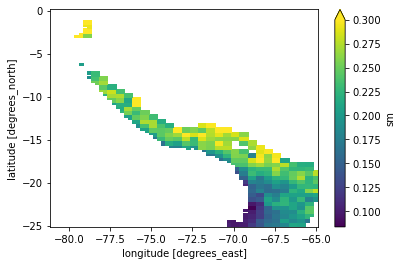

In [24]:
sm_clim['sm'].where(topo_on_g > 2000).mean('dayofyear').plot(vmax=0.3)

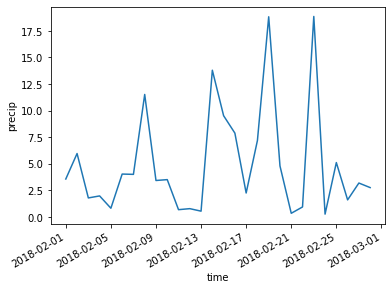

In [72]:
chdat.sel(time='2018-02', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude']).plot()

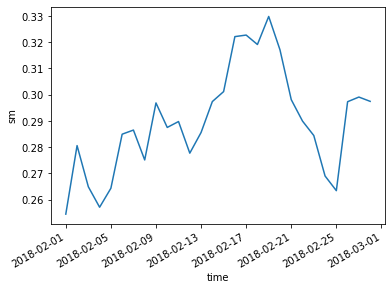

In [69]:
sm['sm'].sel(time='2018-02', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude']).plot()

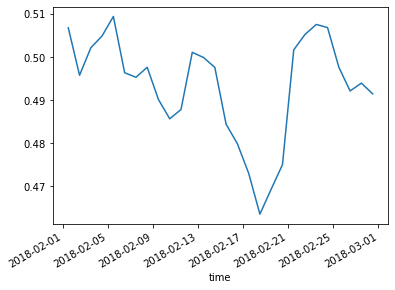

In [73]:
vod.sel(time='2018-02', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude']).plot()

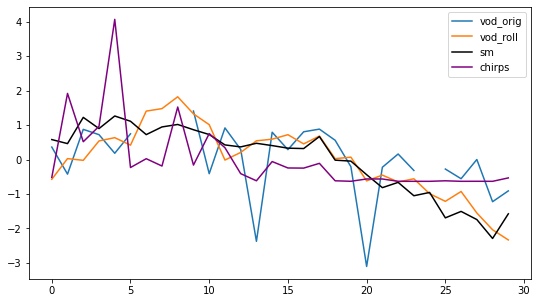

In [139]:
f = plt.figure(figsize=(9,5))
vvvvod = vvod['vod'].rolling(time=3, min_periods=1, center=True).mean().sel(time='2013-04', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
vvvod = vvod['vod'].sel(time='2013-04', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
sssm = sm['sm'].sel(time='2013-04', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
chtest = chdat.sel(time='2013-04', latitude=slice(regions['central'][0][0],regions['central'][0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
plt.plot((vvvod-np.mean(vvvod))/np.std(vvvod)*-1, label='vod_orig')
plt.plot((vvvvod-np.mean(vvvvod))/np.std(vvvvod)*-1, label='vod_roll')
plt.plot((sssm-np.mean(sssm))/np.std(sssm), label='sm', color='k')
plt.plot((chtest-np.mean(chtest))/np.std(chtest), label='chirps', color='purple')
plt.legend()

In [25]:
vmonth = vvod['vod'].groupby('time.month').mean('time')

In [26]:
vmonth = vmonth.fillna(0)

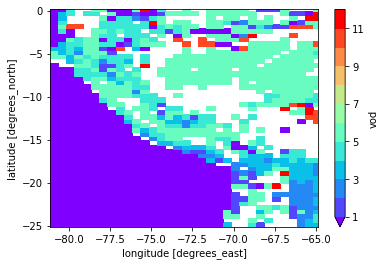

In [27]:
monthmax = vmonth.argmax(dim='month',skipna=True)
monthmax.where((monthmax < 6) | (monthmax > 9)).plot(cmap='rainbow', levels=np.arange(1,13))

In [28]:
vodmask = (monthmax < 6) | (monthmax > 9)

In [29]:
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)
sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)

In [30]:
lat_pick = vvod.latitude.values
regions = {
#'equatorial' : [(-5,0)],
#'transition' : [(-8,-5)],
'central' : [(-12,-8)],
'southern' : [(-18,-15)],
'northern' : [(-8,0)],
'RioSanta' : [sdf]}
h = 2000

In [31]:
regions['central'][0][0]

-12

In [32]:
rdic = pkl.load(open("/home/ck/DIR/cornkle/data/HUARAZ/saves/corr_GRIDSAT-15_start_end_regionMean.p", "rb"))
for r in regions.keys():
    if r == "RioSanta":
        #ipdb.set_trace()
        regions[r].append(rdic['central'][1])
    elif r == "northern":
        regions[r].append(rdic['transition'][1])    
    else:
        regions[r].append(rdic[r][1])

In [33]:
rdic

{'equatorial': [(-5, 0), (array(248.08674304), array(149.39627329))],
 'transition': [(-8, -5), (array(262.92270531), array(130.59796438))],
 'central': [(-12, -8), (array(265.49667406), array(109.66184971))],
 'southern': [(-18, -15), (array(291.06322795), array(71.85625))]}

In [34]:
regions

{'central': [(-12, -8), (array(265.49667406), array(109.66184971))],
 'southern': [(-18, -15), (array(291.06322795), array(71.85625))],
 'northern': [(-8, 0), (array(262.92270531), array(130.59796438))],
 'RioSanta': [   COUNT       FLAECHE  RIOSAN      max_x     max_y      min_x      min_y  \
  0  113.0  4.421497e+09       1 -77.020021 -8.633822 -77.998542 -10.235552   
  
                                              geometry  
  0  POLYGON ((-77.90790 -8.72631, -77.90828 -8.725...  ,
  (array(265.49667406), array(109.66184971))]}

Text(0.5, 1.0, 'Climatological seasonal cycle (2000-2018), Huaraz pixel')

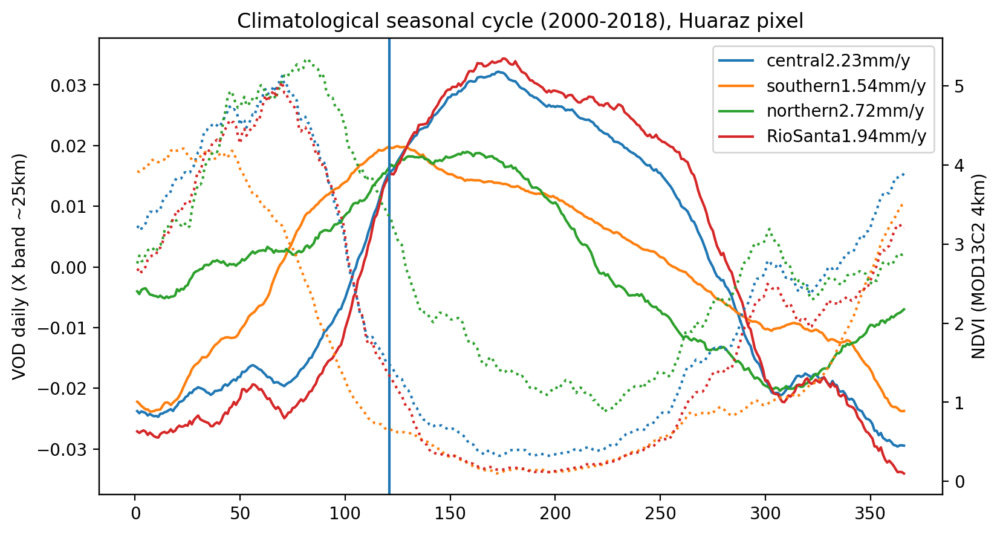

In [35]:
f = plt.figure(figsize=(9,5),dpi=200)
ax = f.add_subplot(111)
ax1 = ax.twinx()
smclim_collect = {}
vodclim_collect = {}
for region in regions:
    alls = regions[region]
    if region == 'RioSanta':
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        nclims = chclim.where(topo_on_g>h).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        
    else:        
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
        nclims = chclim.sel(latitude=slice(alls[0][0], alls[0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
    ax.plot(vod_clim.dayofyear, clims - np.mean(clims), label=region+str(np.round(np.mean(nclims.values),2))+'mm/y')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'))
    ax.set_ylabel('VOD daily (X band ~25km)')
    ax1.plot(sm_clim.dayofyear, nclims, label=region, linestyle='dotted')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'), color='g')

    
# ax1.plot(ndvi_clim.dayofyear, ndvi_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest'), color='k')
# ax.plot(vod_clim.dayofyear, vod_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest')-0.7, color='k')
ax1.set_ylabel('NDVI (MOD13C2 4km)')
ax.legend()
ax.axvline(121)
ax.set_title('Climatological seasonal cycle (2000-2018), Huaraz pixel')

Text(0.5, 1.0, 'Climatological seasonal cycle (2000-2018), Huaraz pixel')

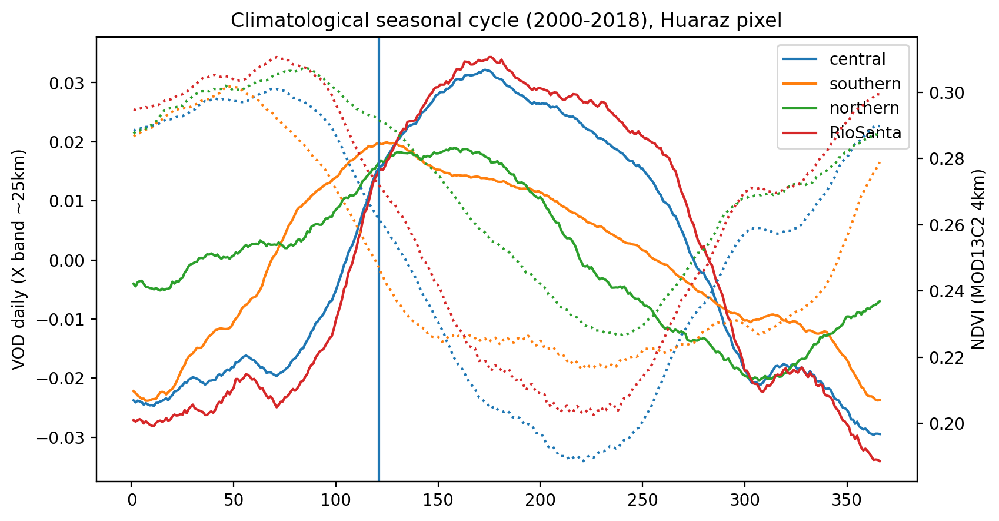

In [36]:
f = plt.figure(figsize=(9,5),dpi=200)
ax = f.add_subplot(111)
ax1 = ax.twinx()
smclim_collect = {}
vodclim_collect = {}
for region in regions:
    alls = regions[region]
    if region == 'RioSanta':
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        nclims = sm_clim['sm'].where(topo_on_g>h).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        
    else:        
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
        nclims = sm_clim['sm'].sel(latitude=slice(alls[0][0], alls[0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
    ax.plot(vod_clim.dayofyear, clims - np.mean(clims), label=region)#.sel(latitude=-9.3, longitude=-77.5, method='nearest'))
    ax.set_ylabel('VOD daily (X band ~25km)')
    ax1.plot(sm_clim.dayofyear, nclims, label=region, linestyle='dotted')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'), color='g')
    
#     if region == 'southern':
#         ipdb.set_trace()

    smclim_collect[region] = nclims.max()-nclims.min()
    vodclim_collect[region] = clims.max()-clims.min()
    
# ax1.plot(ndvi_clim.dayofyear, ndvi_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest'), color='k')
# ax.plot(vod_clim.dayofyear, vod_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest')-0.7, color='k')
ax1.set_ylabel('NDVI (MOD13C2 4km)')
ax.legend()
ax.axvline(121)
ax.set_title('Climatological seasonal cycle (2000-2018), Huaraz pixel')

KeyError: 0

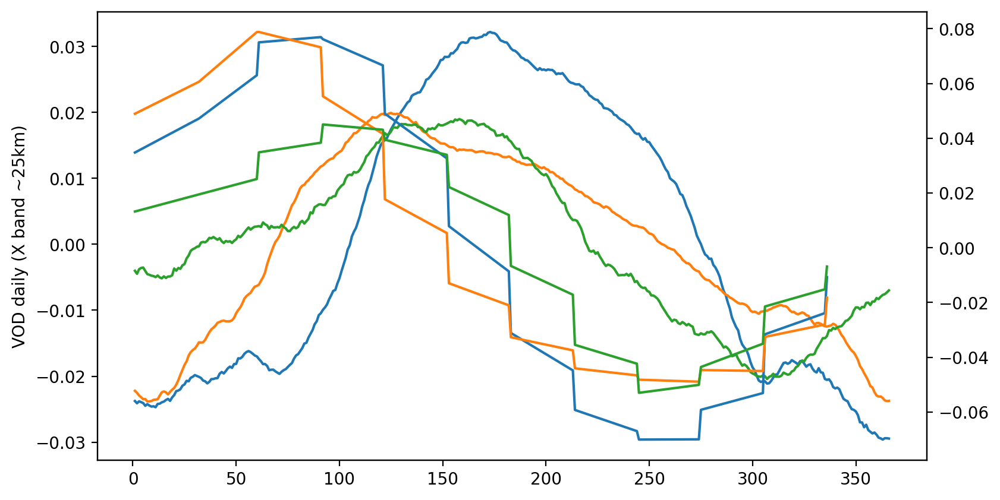

In [37]:
f = plt.figure(figsize=(9,5),dpi=200)
ax = f.add_subplot(111)
ax1 = ax.twinx()
for region in regions:
    alls = regions[region]
    clims = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
    ax.plot(vod_clim.dayofyear, clims - np.mean(clims), label=region)#.sel(latitude=-9.3, longitude=-77.5, method='nearest'))
    ax.set_ylabel('VOD daily (X band ~25km)')
    nclims = ndvi_clim.sel(latitude=slice(alls[0][0], alls[0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
    ax1.plot(ndvi_clim.dayofyear, nclims - np.mean(nclims), label=region)#.sel(latitude=-9.3, longitude=-77.5, method='nearest'), color='g')
# ax1.plot(ndvi_clim.dayofyear, ndvi_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest'), color='k')
# ax.plot(vod_clim.dayofyear, vod_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest')-0.7, color='k')
ax1.set_ylabel('NDVI (MOD13C2 4km)')
ax.legend()
ax.axvline(121)
ax.set_title('Climatological seasonal cycle (2000-2018), Huaraz pixel')

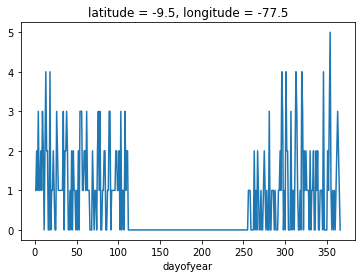

In [38]:
wet_test.where(wet_test==3).groupby('time.dayofyear').count('time').sel(latitude=-9.5, longitude=-77.5, method='nearest').plot()

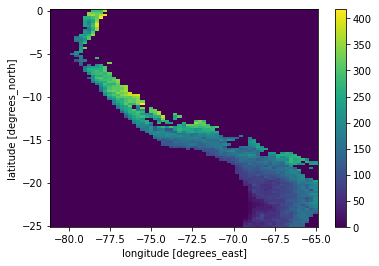

In [39]:
wet_test.where(wet_test==3).count('time').plot()

In [40]:
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)
sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)

In [41]:
wet_test

<xarray.DataArray (time: 12418, latitude: 101, longitude: 65)>
array([[[0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.],
        ...,
        [0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.]],

       [[0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.],
        ...,
        [0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.]],

       ...,

       [[0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.],
        ...,
        [0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.]],

       [[0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.],
        ...,
        [0., 0., ..., 0., 0.],
        [0., 0., ..., 0., 0.]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 1985-01-01 1985-01-02 ... 2018-12-31
  * latitude   (latitude) float32 -25.0 -24.75 -24.5 -24.25 ... -0.5 -0.25 0.0
  * longitude  (longitude) float32 -81.0 -80.75 -80.5 ... -65.5 -65.25 -65.0

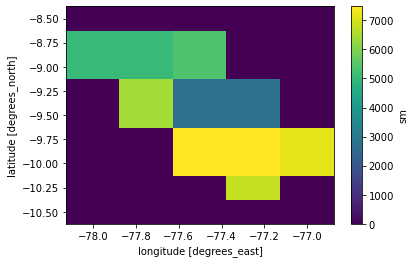

In [42]:
sm['sm'].salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77), time=wet_test.time).count('time').plot()

In [43]:
def vod_composite(spell_dat, vod, vod_clim, chirps, spell_length, topo, region='central', syear=2000, datatag='vod'):
    
    regions = {
    'equatorial' : [(-5,0)],
    'transition' : [(-8,-5)],
    'central' : [(-12,-8)],
    'southern' : [(-18,-15)],
    'northern' : [(-8,0)]}
    h = 2000

#     alls = regions[r]
#     doys_s = np.round(alls[1][0])
#     doys_e = np.round(alls[1][1])
    
    
    if region == 'RioSanta':
        fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
        sdf = salem.read_shapefile(fname)
        sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)
        sp = spell_dat.where((topo>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77)) #& ((spell_dat['time.month']>=12) | (spell_dat['time.month']<=3)
        #sp = spell_dat.where((topo>h) & ((spell_dat['time.dayofyear']>=doys_s) | (spell_dat['time.dayofyear']<=doys_e))).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        chirp = chirps.where(topo>h).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77)).load()
        
        vo_clim = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        vo = vod.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        vo_diff = vod_diff.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))

    else:
    
        alls = regions[region]

        sp = spell_dat.where((topo>h)).sel(latitude=slice(alls[0][0], alls[0][1])) #& ((spell_dat['time.month']>=12) | (spell_dat['time.month']<=3)
        #sp = spell_dat.where((topo>h) & ((spell_dat['time.dayofyear']>=doys_s) | (spell_dat['time.dayofyear']<=doys_e))).sel(latitude=slice(alls[0][0], alls[0][1]))
        chirp = chirps.where(topo>h).sel(latitude=slice(alls[0][0], alls[0][1])).load()

        vo = vod.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
        vo_clim = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
        vo_diff = vod_diff.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
    
    ns = 30
    chllist = np.arange(ns)*0 #0
    chcnt = np.arange(ns)*0

    llist = np.arange(ns)*0 #0
    cnt = np.arange(ns)*0

    llist_clim = np.arange(ns)*0 #0
    cnt_clim = np.arange(ns)*0
    
    llist_diff = np.arange(ns)*0 #0
    cnt_diff = np.arange(ns)*0
    isnb = 0
    np.nan #
    #lnorm = np.arange(ns)*0
    
    errlistv = None
    errlistc = None
    
    for ix, x in enumerate(sp.longitude):
        for iy, y in enumerate(sp.latitude):
                print('Doing', x.values, y.values)
                dates = sp.sel(time=sp['time.year']>=syear, latitude=y, longitude=x, method='nearest') # chirps
                
                if np.sum(np.isnan(dates.values)) == dates.shape: # if entire timeseries in nan, go to next pixel
                    print('Allnan, continue')
                    continue
                    
                d3 = dates[(dates==spell_length)]
                
                for dd in d3.time:

                    dd = pd.Timestamp(dd.values)
                    if datatag == 'vod':
                        dtime = dd.replace(hour=12)
                    else:
                        dtime = dd
                        
                    dtime2 = dtime + pd.Timedelta('28 days')
                    dtime1 = dtime - pd.Timedelta('1 days')
                    chdtime1 =  dtime - pd.Timedelta('2 days') # because chirps hour is 00 and vod hour is 12, dtime (at 12) - 1day is missing 12 hours if not day+1 is removed for chirps
                    
                    if datatag =='vod':
                        chdtime1 =  dtime - pd.Timedelta('2 days')
                    else:
                        chdtime1 = dtime1
                        
                    if dtime2.dayofyear - dtime1.dayofyear < 0:
                        print('doy error')
                        continue
                
                    ntime = vo.sel(time=slice(dtime1,dtime2)).sel(latitude=y, longitude=x)
                    #ntime.values[ntime.values==0] = np.nan
                    #ipdb.set_trace()
#                     if 0 in ntime.values:
#                         print('Is zero, continue')
#                         continue
                    chtime = chirp.sel(time=slice(chdtime1,dtime2)).sel(latitude=y, longitude=x)
                    nclim = vo_clim.sel(dayofyear=slice(dtime1.dayofyear,dtime2.dayofyear)).sel(latitude=y, longitude=x)
                    ndiff = vo_diff.sel(latitude=y, longitude=x)
                   
                    cnt = cnt+np.isfinite(ntime.values).astype(int)

                    try:
                        cnt_clim = cnt_clim+np.isfinite(nclim.values).astype(int)
                    except:
                        ipdb.set_trace()
                        
                    cnt_diff = cnt_diff+np.isfinite(ndiff.values).astype(int)
                    chcnt = chcnt+np.isfinite(chtime.values).astype(int)

                    norm = (ntime - ntime.min()) / ndiff

                    if errlistv is not None:
                        errlistv = np.vstack((errlistv,ntime.values)) 
                    else:
                        errlistv = norm.values


                    if errlistc is not None:
                        errlistc = np.vstack((errlistc,chtime.values))
                    else:
                        errlistc = chtime.values 

                    ntime = ntime.where(np.isfinite(ntime), other=0).values
                    chtime = chtime.where(np.isfinite(chtime), other=0).values
                    nclim = nclim.where(np.isfinite(nclim), other=0).values
                    ndiff = ndiff.where(np.isfinite(ndiff), other=0).values

                    llist = llist+ntime
                    llist_clim = llist_clim+nclim
                    llist_diff = llist_diff+ndiff
                    chllist = chllist+chtime
#                     except:
#                         ipdb.set_trace()
#                         print('something wrong')
#                         continue
                        
                    #try:

                    #except:
                        #ipdb.set_trace()
                                          
                    print('Doing', isnb)
                    isnb +=1
                               
    return chllist, chcnt, llist, cnt, llist_clim, llist_diff, cnt_clim, cnt_diff, errlistv, errlistc

In [44]:
ch3sm_hua, chcnt3sm_hua, sm3_hua, smcnt3_hua, smclim3_hua, smdiff3_hua, smclimcnt3_hua, smdiffcnt3_hua, smerrv3_hua, smerrc3_hua = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='RioSanta', syear=1985)
ch5sm_hua, chcnt5sm_hua, sm5_hua, smcnt5_hua, smclim5_hua, smdiff5_hua, smclimcnt5_hua, smdiffcnt5_hua, smerrv5_hua, smerrc5_hua = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='RioSanta', syear=1985)
ch7sm_hua, chcnt7sm_hua, sm7_hua, smcnt7_hua, smclim7_hua, smdiff7_hua, smclimcnt7_hua, smdiffcnt7_hua, smerrv7_hua, smerrc7_hua = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='RioSanta', syear=1985)

Doing -78.0 -10.5
Allnan, continue
Doing -78.0 -10.25
Allnan, continue
Doing -78.0 -10.0
Allnan, continue
Doing -78.0 -9.75
Allnan, continue
Doing -78.0 -9.5
Allnan, continue
Doing -78.0 -9.25
Allnan, continue
Doing -78.0 -9.0
Doing 0
Doing 1
Doing 2
Doing 3
Doing 4
Doing 5
Doing 6
Doing 7
Doing 8
Doing 9
Doing 10
Doing 11
Doing 12
Doing 13
Doing 14
Doing 15
Doing 16
Doing 17
Doing 18
Doing 19
Doing 20
Doing 21
Doing 22
doy error
doy error
doy error
Doing 23
Doing 24
Doing 25
Doing 26
Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing 36
Doing 37
Doing 38
Doing 39
Doing 40
Doing 41
Doing 42
doy error
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
doy error
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
doy error
Doing 72
Doing 73
Doing 74
Doing 75
doy error
Doing 76
Doing 77
Doing 78
Do

Doing 691
Doing 692
Doing 693
doy error
Doing 694
Doing 695
Doing 696
Doing 697
Doing 698
Doing 699
Doing 700
Doing 701
Doing 702
Doing 703
Doing 704
Doing 705
Doing 706
Doing 707
doy error
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
Doing 718
Doing 719
Doing 720
Doing 721
doy error
Doing 722
Doing 723
Doing 724
Doing 725
doy error
Doing 726
Doing 727
Doing 728
Doing 729
Doing 730
doy error
Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743
Doing 744
doy error
doy error
Doing 745
Doing 746
Doing 747
Doing 748
Doing 749
Doing 750
Doing 751
Doing 752
Doing 753
Doing 754
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing 760
Doing 761
Doing 762
doy error
doy error
doy error
Doing 763
Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
doy error
doy error
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
doy error
doy error
Doing 776


Doing 1373
Doing 1374
Doing 1375
Doing 1376
Doing 1377
Doing 1378
Doing 1379
Doing 1380
Doing 1381
Doing 1382
Doing 1383
Doing 1384
Doing 1385
Doing 1386
Doing 1387
Doing 1388
Doing 1389
Doing 1390
Doing 1391
Doing 1392
Doing 1393
Doing 1394
Doing 1395
Doing 1396
Doing 1397
doy error
doy error
Doing 1398
Doing 1399
Doing 1400
Doing 1401
Doing 1402
Doing 1403
Doing 1404
Doing 1405
Doing 1406
Doing 1407
Doing 1408
Doing 1409
Doing 1410
Doing 1411
Doing 1412
Doing 1413
Doing 1414
Doing 1415
Doing 1416
Doing 1417
Doing 1418
Doing 1419
Doing 1420
doy error
Doing 1421
Doing 1422
Doing 1423
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
Doing 1429
Doing 1430
Doing 1431
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
doy error
Doing 1440
Doing 1441
Doing 1442
Doing 1443
Doing 1444
doy error
doy error
Doing 1445
doy error
doy error
Doing 1446
Doing 1447
Doing 1448
Doing 1449
Doing 1450
doy error
Doing 1451
Doing 1452
Doing 1453
Doing 1454
Doing 14

Doing 2060
Doing 2061
Doing 2062
Doing 2063
Doing 2064
Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
doy error
Doing 2071
Doing 2072
Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
Doing 2078
Doing 2079
Doing 2080
Doing 2081
Doing 2082
doy error
doy error
Doing 2083
Doing 2084
Doing 2085
Doing 2086
Doing 2087
Doing 2088
Doing 2089
doy error
doy error
Doing 2090
Doing 2091
Doing 2092
Doing 2093
Doing 2094
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107
doy error
doy error
doy error
doy error
Doing 2108
Doing 2109
doy error
doy error
Doing 2110
Doing 2111
Doing 2112
Doing 2113
Doing 2114
Doing 2115
Doing 2116
Doing 2117
Doing 2118
doy error
Doing 2119
Doing 2120
Doing 2121
Doing 2122
Doing 2123
Doing 2124
Doing 2125
Doing 2126
Doing 2127
Doing 2128
Doing 2129
Doing 2130
Doing 2131
Doing 2132
Doing 2133
doy error
Doing 2134
Doing 2135
Doing 2136
Doing 2137
Doing 2138
D

Doing 2722
Doing 2723
doy error
Doing 2724
Doing 2725
Doing 2726
Doing 2727
Doing 2728
Doing 2729
Doing 2730
Doing 2731
doy error
doy error
Doing 2732
Doing 2733
Doing 2734
Doing 2735
Doing 2736
Doing 2737
Doing 2738
Doing 2739
doy error
doy error
Doing -77.5 -8.5
Allnan, continue
Doing -77.25 -10.5
Allnan, continue
Doing -77.25 -10.25
Doing 2740
Doing 2741
Doing 2742
Doing 2743
Doing 2744
Doing 2745
Doing 2746
doy error
Doing 2747
Doing 2748
Doing 2749
Doing 2750
Doing 2751
Doing 2752
Doing 2753
Doing 2754
Doing 2755
Doing 2756
Doing 2757
Doing 2758
Doing 2759
Doing 2760
Doing 2761
Doing 2762
Doing 2763
Doing 2764
Doing 2765
Doing 2766
Doing 2767
doy error
Doing 2768
Doing 2769
Doing 2770
Doing 2771
Doing 2772
Doing 2773
Doing 2774
doy error
doy error
Doing 2775
Doing 2776
Doing 2777
Doing 2778
Doing 2779
Doing 2780
Doing 2781
Doing 2782
Doing 2783
Doing 2784
Doing 2785
Doing 2786
Doing 2787
doy error
doy error
Doing 2788
Doing 2789
Doing 2790
Doing 2791
Doing 2792
Doing 2793
Doing 27

Doing 3384
Doing 3385
Doing 3386
Doing 3387
Doing 3388
Doing 3389
Doing 3390
Doing 3391
Doing 3392
Doing 3393
Doing 3394
Doing 3395
Doing 3396
Doing 3397
Doing 3398
doy error
Doing 3399
Doing 3400
Doing 3401
Doing 3402
Doing 3403
Doing 3404
Doing 3405
Doing 3406
Doing 3407
doy error
Doing 3408
Doing 3409
Doing 3410
Doing 3411
Doing 3412
Doing 3413
Doing 3414
Doing 3415
Doing 3416
Doing 3417
Doing 3418
Doing 3419
Doing 3420
Doing 3421
Doing 3422
Doing 3423
Doing 3424
Doing 3425
Doing 3426
doy error
Doing 3427
Doing 3428
Doing 3429
Doing 3430
Doing 3431
Doing 3432
doy error
Doing 3433
Doing 3434
Doing 3435
Doing 3436
Doing 3437
Doing 3438
Doing 3439
doy error
doy error
Doing 3440
Doing 3441
Doing 3442
Doing 3443
Doing 3444
Doing 3445
Doing 3446
Doing 3447
Doing 3448
Doing 3449
Doing 3450
doy error
Doing 3451
Doing 3452
Doing 3453
Doing 3454
Doing 3455
Doing 3456
doy error
doy error
doy error
Doing 3457
Doing 3458
Doing 3459
Doing 3460
Doing 3461
Doing 3462
doy error
doy error
Doing 3463


Doing 4023
Doing 4024
Doing 4025
Doing 4026
Doing 4027
doy error
Doing -77.0 -9.75
Doing 4028
Doing 4029
Doing 4030
Doing 4031
Doing 4032
doy error
Doing 4033
Doing 4034
Doing 4035
Doing 4036
Doing 4037
Doing 4038
Doing 4039
Doing 4040
Doing 4041
Doing 4042
Doing 4043
Doing 4044
Doing 4045
doy error
doy error
Doing 4046
Doing 4047
Doing 4048
Doing 4049
Doing 4050
Doing 4051
Doing 4052
Doing 4053
Doing 4054
Doing 4055
Doing 4056
Doing 4057
Doing 4058
Doing 4059
Doing 4060
Doing 4061
Doing 4062
Doing 4063
doy error
Doing 4064
Doing 4065
Doing 4066
Doing 4067
Doing 4068
Doing 4069
Doing 4070
Doing 4071
Doing 4072
Doing 4073
doy error
Doing 4074
Doing 4075
Doing 4076
Doing 4077
Doing 4078
Doing 4079
Doing 4080
Doing 4081
Doing 4082
Doing 4083
Doing 4084
Doing 4085
Doing 4086
Doing 4087
Doing 4088
doy error
doy error
Doing 4089
Doing 4090
Doing 4091
Doing 4092
Doing 4093
Doing 4094
Doing 4095
Doing 4096
Doing 4097
Doing 4098
Doing 4099
Doing 4100
Doing 4101
doy error
doy error
doy error
Doi

Doing 402
doy error
Doing 403
doy error
doy error
doy error
Doing 404
Doing 405
Doing 406
Doing 407
Doing -77.75 -9.0
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
doy error
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
doy error
doy error
Doing 425
Doing 426
Doing 427
Doing 428
Doing 429
doy error
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
doy error
Doing 437
doy error
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing 446
Doing 447
Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
Doing 455
Doing 456
doy error
Doing 457
Doing 458
Doing 459
Doing 460
doy error
Doing 461
Doing 462
doy error
Doing 463
Doing 464
Doing 465
Doing 466
doy error
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
Doing 473
Doing 474
Doing 475
Doing 476
Doing 477
doy error
Doing 478
doy error
Doing 479
Doing 480
doy error
Doing 481
Doing 482
Do

Doing 1116
Doing 1117
Doing 1118
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
Doing -77.5 -8.75
Doing 1129
Doing 1130
Doing 1131
Doing 1132
doy error
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
Doing 1145
Doing 1146
Doing 1147
Doing 1148
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing 1153
Doing 1154
doy error
Doing 1155
Doing 1156
Doing 1157
Doing 1158
Doing 1159
Doing 1160
Doing 1161
Doing 1162
Doing 1163
doy error
doy error
Doing 1164
Doing 1165
Doing 1166
Doing 1167
Doing 1168
Doing 1169
Doing 1170
Doing 1171
Doing 1172
Doing 1173
doy error
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
doy error
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
doy error
doy error
Doing 1186
doy error
Doing 1187
doy error
Doing 1188
Doing 1189
Doing 1190
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Do

Doing 1775
Doing 1776
Doing 1777
Doing 1778
Doing 1779
Doing 1780
Doing 1781
Doing 1782
Doing 1783
Doing 1784
Doing 1785
doy error
Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing 1794
Doing -77.0 -9.75
Doing 1795
Doing 1796
Doing 1797
doy error
Doing 1798
Doing 1799
Doing 1800
Doing 1801
doy error
Doing 1802
Doing 1803
Doing 1804
doy error
Doing 1805
doy error
doy error
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
doy error
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing 1836
Doing 1837
Doing 1838
Doing 1839
doy error
Doing 1840
Doing 1841
Doing 1842
Doing 1843
Doing 1844
Doing 1845
Doing 1846
Doing 1847
Doing 1848
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing 1855
Doing 1856


Doing 572
doy error
Doing 573
Doing 574
Doing 575
Doing 576
doy error
Doing 577
Doing 578
Doing 579
Doing 580
Doing 581
Doing 582
doy error
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing 588
Doing 589
Doing 590
doy error
Doing 591
Doing 592
Doing 593
Doing 594
doy error
Doing 595
Doing 596
Doing 597
Doing 598
Doing 599
Doing 600
Doing 601
Doing -77.5 -9.25
Doing 602
Doing 603
Doing 604
Doing 605
Doing 606
doy error
Doing 607
Doing 608
Doing 609
Doing 610
Doing 611
Doing 612
Doing 613
Doing 614
Doing 615
Doing 616
Doing 617
Doing 618
Doing 619
Doing 620
Doing 621
Doing 622
Doing 623
Doing 624
Doing 625
Doing 626
doy error
Doing 627
Doing 628
doy error
Doing 629
Doing 630
Doing 631
Doing 632
doy error
Doing 633
doy error
Doing 634
Doing 635
Doing 636
Doing 637
Doing 638
Doing 639
Doing 640
Doing 641
Doing 642
Doing 643
Doing 644
Doing 645
Doing 646
Doing 647
Doing 648
Doing 649
Doing 650
Doing 651
Doing 652
Doing 653
Doing 654
Doing 655
doy error
Doing 656
Doing 657
Doing 658
do

In [45]:
ch3sm, chcnt3sm, sm3, smcnt3, smclim3, smdiff3, smclimcnt3, smdiffcnt3, smerrv3, smerrc3 = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='central', syear=1985)
ch5sm, chcnt5sm, sm5, smcnt5, smclim5, smdiff5, smclimcnt5, smdiffcnt5, smerrv5, smerrc5 = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='central', syear=1985)
ch7sm, chcnt7sm, sm7, smcnt7, smclim7, smdiff7, smclimcnt7, smdiffcnt7, smerrv7, smerrc7 = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='central', syear=1985)

Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doing -80.75 -11.25
Allnan, continue
Doing -80.75 -11.0
Allnan, continue
Doing -80.75 -10.75
Allnan, continue
Doing -80.75 -10.5
Allnan, continue
Doing -80.75 -10.25
Allnan, continue
Doing -80.75 -10.0
Allnan, continue
Doing -80.75 -9.75
Allnan, continue
Doing -80.75 -9.5
Allnan, continue
Doing 

Doing 159
Doing 160
Doing 161
Doing 162
doy error
doy error
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
doy error
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
doy error
doy error
Doing -78.5 -8.0
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
doy error
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doing 223
Doing 224
Doing 225
doy error
doy error
doy error
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing 233
Doing 234
Doing 235
Doing 236
Doing 237
Doing 238
Doing 239
Doing 240
Doing 241
doy error
doy error
Doing 242
Doing 243
doy error
doy error
doy

Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
doy error
doy error
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
doy error
Doing 866
Doing 867
Doing 868
doy error
doy error
Doing -78.25 -8.0
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
doy error
doy error
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
doy error
doy error
doy error
Doing 920
Doing 921
Doing 922
Doing 923
doy error
doy error
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Do

Doing 1489
Doing 1490
Doing 1491
Doing 1492
Doing 1493
Doing 1494
Doing 1495
Doing 1496
doy error
doy error
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
doy error
doy error
Doing -78.0 -8.75
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
doy error
doy error
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
doy error
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
doy error
doy error
Doing 1549
Doing 1550
Doing 1551
doy error
doy error
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
doy error
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doin

Doing 2149
Doing 2150
doy error
Doing 2151
Doing 2152
Doing 2153
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158
Doing 2159
Doing 2160
Doing 2161
Doing 2162
Doing 2163
Doing 2164
Doing 2165
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
doy error
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
doy error
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
doy error
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
doy error
doy error
doy error
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
doy error
doy error
Doing -78.0 -8.0
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
doy error
doy error
Doing 2225
Doing 2226
Doing 2227
Doin

Doing 2791
Doing 2792
Doing 2793
Doing 2794
Doing 2795
Doing 2796
doy error
Doing 2797
Doing 2798
Doing 2799
Doing 2800
doy error
Doing 2801
Doing 2802
Doing 2803
Doing 2804
doy error
Doing 2805
Doing 2806
Doing 2807
Doing 2808
Doing 2809
doy error
doy error
Doing 2810
Doing 2811
Doing 2812
Doing 2813
Doing 2814
Doing 2815
Doing 2816
Doing 2817
Doing 2818
Doing 2819
Doing 2820
doy error
Doing 2821
Doing 2822
Doing 2823
Doing 2824
Doing 2825
Doing 2826
Doing 2827
doy error
doy error
Doing 2828
Doing 2829
Doing 2830
Doing 2831
Doing 2832
Doing 2833
Doing 2834
doy error
doy error
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
doy error
doy error
Doing 2840
Doing 2841
Doing 2842
doy error
doy error
Doing 2843
Doing 2844
Doing 2845
Doing 2846
Doing 2847
Doing 2848
Doing 2849
doy error
Doing 2850
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
doy error
doy error
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
doy error
doy error
Doing 2862
Doing 2863
Doing 2

Doing 3450
Doing 3451
doy error
Doing 3452
Doing 3453
Doing 3454
Doing 3455
Doing 3456
Doing 3457
Doing 3458
Doing 3459
doy error
Doing 3460
Doing 3461
Doing 3462
Doing 3463
Doing 3464
Doing 3465
Doing 3466
Doing 3467
Doing 3468
Doing 3469
Doing 3470
Doing 3471
doy error
Doing 3472
Doing 3473
Doing 3474
Doing 3475
doy error
Doing 3476
Doing 3477
Doing 3478
Doing 3479
Doing 3480
doy error
doy error
Doing 3481
Doing 3482
Doing 3483
Doing 3484
Doing 3485
Doing 3486
Doing 3487
Doing 3488
doy error
doy error
doy error
doy error
Doing 3489
Doing 3490
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
doy error
doy error
Doing 3498
Doing 3499
Doing 3500
Doing 3501
Doing 3502
doy error
doy error
Doing 3503
Doing 3504
Doing 3505
Doing 3506
Doing 3507
Doing 3508
Doing 3509
Doing 3510
Doing 3511
Doing 3512
Doing 3513
Doing 3514
Doing 3515
Doing 3516
Doing 3517
Doing 3518
Doing 3519
Doing 3520
Doing 3521
Doing 3522
Doing 3523
Doing 3524
Doing 3525
Doing 3526
doy error
Doi

Doing 4110
Doing 4111
Doing 4112
Doing 4113
Doing 4114
Doing 4115
doy error
doy error
Doing 4116
Doing 4117
Doing 4118
Doing 4119
Doing 4120
Doing 4121
Doing 4122
Doing 4123
Doing 4124
Doing 4125
doy error
doy error
Doing -77.75 -8.0
Doing 4126
Doing 4127
Doing 4128
Doing 4129
Doing 4130
Doing 4131
Doing 4132
Doing 4133
Doing 4134
Doing 4135
Doing 4136
Doing 4137
Doing 4138
Doing 4139
Doing 4140
Doing 4141
Doing 4142
Doing 4143
Doing 4144
Doing 4145
Doing 4146
Doing 4147
Doing 4148
Doing 4149
doy error
Doing 4150
Doing 4151
Doing 4152
Doing 4153
Doing 4154
Doing 4155
Doing 4156
Doing 4157
Doing 4158
Doing 4159
Doing 4160
Doing 4161
Doing 4162
Doing 4163
Doing 4164
Doing 4165
Doing 4166
Doing 4167
Doing 4168
doy error
Doing 4169
Doing 4170
Doing 4171
Doing 4172
Doing 4173
Doing 4174
Doing 4175
Doing 4176
doy error
Doing 4177
Doing 4178
Doing 4179
Doing 4180
Doing 4181
doy error
Doing 4182
Doing 4183
Doing 4184
Doing 4185
Doing 4186
Doing 4187
Doing 4188
Doing 4189
Doing 4190
Doing 4191


Doing 4744
Doing 4745
Doing 4746
Doing 4747
doy error
doy error
Doing 4748
Doing 4749
Doing 4750
Doing 4751
Doing 4752
Doing 4753
doy error
Doing 4754
Doing 4755
Doing 4756
Doing 4757
Doing 4758
doy error
doy error
doy error
Doing 4759
Doing 4760
Doing 4761
Doing 4762
Doing 4763
Doing 4764
Doing 4765
Doing 4766
Doing 4767
Doing 4768
Doing 4769
Doing 4770
Doing 4771
doy error
doy error
Doing 4772
Doing 4773
Doing 4774
Doing 4775
doy error
Doing 4776
Doing 4777
Doing 4778
Doing 4779
Doing 4780
Doing 4781
Doing 4782
doy error
Doing -77.5 -9.75
Doing 4783
Doing 4784
Doing 4785
Doing 4786
Doing 4787
Doing 4788
doy error
doy error
Doing 4789
Doing 4790
Doing 4791
Doing 4792
Doing 4793
Doing 4794
Doing 4795
Doing 4796
Doing 4797
Doing 4798
Doing 4799
Doing 4800
Doing 4801
Doing 4802
Doing 4803
Doing 4804
Doing 4805
Doing 4806
Doing 4807
Doing 4808
Doing 4809
Doing 4810
Doing 4811
Doing 4812
Doing 4813
Doing 4814
doy error
doy error
Doing 4815
Doing 4816
Doing 4817
Doing 4818
Doing 4819
Doing 

Doing 5427
Doing 5428
Doing 5429
Doing 5430
Doing 5431
Doing 5432
Doing 5433
Doing 5434
Doing 5435
Doing 5436
Doing 5437
Doing 5438
Doing 5439
Doing 5440
Doing 5441
Doing 5442
Doing 5443
Doing 5444
Doing 5445
Doing 5446
Doing 5447
Doing 5448
doy error
Doing 5449
Doing 5450
Doing 5451
Doing 5452
Doing 5453
Doing 5454
Doing 5455
Doing 5456
Doing 5457
Doing 5458
Doing 5459
doy error
Doing 5460
Doing 5461
Doing 5462
Doing 5463
doy error
Doing 5464
Doing 5465
Doing 5466
Doing 5467
Doing 5468
Doing 5469
Doing 5470
Doing 5471
doy error
Doing 5472
Doing 5473
Doing 5474
Doing 5475
Doing 5476
Doing 5477
Doing 5478
Doing 5479
Doing 5480
Doing 5481
Doing 5482
doy error
Doing 5483
Doing 5484
Doing 5485
Doing 5486
Doing 5487
Doing 5488
Doing 5489
Doing 5490
Doing 5491
Doing 5492
Doing 5493
Doing 5494
Doing 5495
Doing 5496
Doing 5497
Doing 5498
Doing 5499
Doing 5500
Doing 5501
Doing 5502
Doing 5503
doy error
doy error
Doing 5504
Doing 5505
Doing 5506
Doing 5507
Doing 5508
Doing 5509
Doing 5510
Doing 

Doing 6096
Doing 6097
Doing 6098
Doing 6099
Doing 6100
Doing 6101
Doing 6102
Doing 6103
Doing 6104
Doing 6105
Doing 6106
Doing 6107
Doing 6108
doy error
doy error
Doing 6109
Doing 6110
Doing 6111
Doing 6112
Doing 6113
Doing 6114
Doing 6115
Doing 6116
Doing 6117
Doing 6118
Doing 6119
Doing 6120
Doing 6121
Doing 6122
Doing 6123
Doing 6124
doy error
doy error
Doing 6125
Doing 6126
Doing 6127
Doing 6128
Doing 6129
Doing 6130
Doing 6131
Doing 6132
Doing 6133
Doing 6134
doy error
Doing 6135
Doing 6136
Doing 6137
Doing 6138
Doing 6139
Doing 6140
doy error
Doing 6141
Doing 6142
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
doy error
doy error
Doing 6148
Doing 6149
Doing 6150
Doing 6151
Doing 6152
Doing 6153
Doing 6154
Doing 6155
doy error
Doing 6156
Doing 6157
Doing 6158
Doing 6159
Doing 6160
Doing 6161
Doing 6162
Doing 6163
Doing 6164
Doing 6165
Doing 6166
Doing 6167
Doing 6168
Doing 6169
Doing 6170
Doing 6171
Doing 6172
Doing 6173
Doing 6174
Doing 6175
Doing 6176
Doing 6177
Doing 61

Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
doy error
Doing 6783
Doing 6784
Doing 6785
Doing 6786
doy error
Doing 6787
Doing 6788
Doing 6789
Doing 6790
Doing 6791
Doing 6792
Doing 6793
Doing 6794
Doing 6795
Doing 6796
Doing 6797
Doing 6798
doy error
Doing 6799
Doing 6800
Doing 6801
Doing 6802
Doing 6803
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
doy error
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
Doing 6814
Doing 6815
doy error
doy error
Doing 6816
Doing 6817
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
doy error
Doing 6823
Doing 6824
Doing 6825
Doing 6826
Doing 6827
Doing 6828
Doing 6829
Doing 6830
Doing 6831
Doing 6832
Doing 6833
Doing 6834
Doing 6835
doy error
Doing 6836
Doing 6837
Doing 6838
Doing 6839
doy error
Doing 6840
Doing 6841
Doing 6842
Doing 6843
Doing 6844
doy error
Doing 684

Doing 7407
Doing 7408
Doing 7409
Doing 7410
Doing 7411
Doing 7412
Doing 7413
Doing 7414
doy error
Doing 7415
Doing 7416
Doing 7417
Doing 7418
doy error
Doing 7419
Doing 7420
Doing 7421
Doing 7422
Doing 7423
doy error
Doing 7424
Doing 7425
Doing 7426
Doing 7427
Doing 7428
Doing 7429
Doing 7430
Doing 7431
doy error
Doing 7432
Doing 7433
Doing 7434
Doing 7435
Doing 7436
Doing 7437
Doing 7438
Doing 7439
Doing 7440
Doing 7441
doy error
Doing 7442
Doing 7443
Doing 7444
Doing 7445
Doing 7446
Doing 7447
Doing 7448
Doing 7449
doy error
doy error
Doing 7450
Doing 7451
Doing 7452
Doing 7453
Doing 7454
Doing 7455
Doing 7456
doy error
doy error
Doing 7457
Doing 7458
Doing 7459
Doing 7460
Doing 7461
Doing 7462
Doing 7463
Doing 7464
Doing 7465
Doing 7466
Doing 7467
Doing 7468
Doing 7469
doy error
Doing 7470
Doing 7471
Doing 7472
Doing 7473
Doing 7474
Doing 7475
Doing 7476
Doing 7477
Doing 7478
Doing 7479
Doing 7480
Doing 7481
Doing 7482
Doing 7483
Doing 7484
Doing 7485
Doing 7486
Doing 7487
Doing 748

Doing 8065
Doing 8066
Doing 8067
Doing 8068
Doing 8069
Doing 8070
Doing 8071
Doing 8072
Doing 8073
Doing 8074
Doing 8075
Doing 8076
Doing 8077
Doing 8078
Doing 8079
Doing 8080
Doing 8081
doy error
Doing 8082
Doing 8083
Doing 8084
Doing 8085
Doing 8086
doy error
doy error
Doing 8087
Doing 8088
Doing 8089
Doing 8090
Doing 8091
Doing 8092
Doing 8093
Doing 8094
Doing 8095
Doing 8096
Doing 8097
Doing 8098
Doing 8099
Doing 8100
Doing 8101
Doing 8102
Doing 8103
Doing 8104
Doing 8105
Doing 8106
Doing 8107
Doing 8108
doy error
Doing 8109
Doing 8110
Doing 8111
Doing 8112
Doing 8113
Doing 8114
Doing 8115
Doing 8116
Doing 8117
Doing 8118
Doing 8119
Doing 8120
Doing 8121
Doing 8122
Doing 8123
Doing 8124
Doing 8125
Doing 8126
Doing 8127
Doing 8128
Doing 8129
Doing 8130
Doing 8131
Doing 8132
Doing 8133
Doing 8134
Doing 8135
Doing 8136
Doing 8137
Doing 8138
Doing 8139
Doing 8140
Doing 8141
Doing 8142
Doing 8143
doy error
Doing 8144
Doing 8145
Doing 8146
Doing 8147
Doing 8148
Doing 8149
Doing 8150
doy 

Doing 8735
Doing 8736
doy error
Doing 8737
Doing 8738
Doing 8739
Doing 8740
Doing 8741
Doing 8742
Doing 8743
Doing 8744
Doing 8745
doy error
Doing 8746
Doing 8747
Doing 8748
Doing 8749
Doing 8750
Doing 8751
Doing 8752
doy error
doy error
Doing -77.25 -8.5
Doing 8753
Doing 8754
Doing 8755
Doing 8756
Doing 8757
Doing 8758
Doing 8759
doy error
doy error
Doing 8760
Doing 8761
Doing 8762
Doing 8763
Doing 8764
Doing 8765
Doing 8766
Doing 8767
Doing 8768
Doing 8769
Doing 8770
Doing 8771
Doing 8772
Doing 8773
Doing 8774
Doing 8775
Doing 8776
Doing 8777
Doing 8778
Doing 8779
Doing 8780
Doing 8781
Doing 8782
Doing 8783
Doing 8784
Doing 8785
Doing 8786
Doing 8787
doy error
doy error
Doing 8788
Doing 8789
Doing 8790
Doing 8791
Doing 8792
Doing 8793
Doing 8794
Doing 8795
doy error
Doing 8796
Doing 8797
Doing 8798
Doing 8799
Doing 8800
Doing 8801
Doing 8802
doy error
doy error
doy error
Doing 8803
Doing 8804
Doing 8805
Doing 8806
Doing 8807
Doing 8808
Doing 8809
Doing 8810
Doing 8811
Doing 8812
Doin

Doing 9404
Doing 9405
Doing 9406
doy error
doy error
Doing 9407
Doing 9408
Doing 9409
Doing 9410
Doing 9411
Doing 9412
Doing 9413
Doing 9414
doy error
doy error
Doing 9415
Doing 9416
Doing 9417
Doing 9418
Doing 9419
Doing 9420
Doing 9421
Doing 9422
Doing 9423
Doing 9424
Doing 9425
Doing 9426
Doing 9427
Doing 9428
Doing 9429
Doing 9430
Doing 9431
Doing 9432
Doing 9433
doy error
Doing 9434
Doing 9435
Doing 9436
Doing 9437
Doing 9438
Doing 9439
Doing 9440
Doing 9441
Doing 9442
Doing 9443
doy error
doy error
Doing 9444
Doing 9445
Doing 9446
Doing 9447
Doing 9448
Doing 9449
Doing 9450
Doing 9451
Doing 9452
Doing 9453
Doing 9454
Doing 9455
Doing 9456
Doing 9457
Doing 9458
Doing 9459
Doing 9460
Doing 9461
Doing 9462
Doing 9463
Doing 9464
Doing 9465
Doing 9466
Doing 9467
Doing 9468
doy error
Doing 9469
Doing 9470
Doing 9471
Doing 9472
Doing 9473
Doing 9474
Doing 9475
Doing 9476
Doing 9477
Doing 9478
Doing 9479
Doing 9480
Doing 9481
Doing 9482
Doing 9483
Doing 9484
Doing 9485
Doing 9486
Doing 9

Doing 10032
Doing 10033
Doing 10034
Doing 10035
Doing 10036
Doing 10037
Doing 10038
Doing 10039
Doing 10040
Doing 10041
Doing 10042
Doing 10043
Doing 10044
doy error
Doing 10045
Doing 10046
Doing 10047
Doing 10048
Doing 10049
Doing 10050
Doing 10051
Doing 10052
Doing 10053
Doing 10054
Doing 10055
Doing 10056
Doing 10057
Doing 10058
doy error
Doing 10059
Doing 10060
Doing 10061
Doing 10062
Doing 10063
Doing 10064
Doing 10065
doy error
Doing 10066
Doing 10067
Doing 10068
Doing 10069
doy error
Doing 10070
Doing 10071
Doing 10072
Doing 10073
Doing 10074
Doing 10075
Doing 10076
Doing 10077
Doing 10078
Doing 10079
Doing 10080
Doing 10081
Doing 10082
Doing 10083
doy error
Doing 10084
Doing 10085
Doing 10086
Doing 10087
Doing 10088
Doing 10089
Doing 10090
Doing 10091
doy error
Doing 10092
Doing 10093
Doing 10094
Doing 10095
Doing 10096
Doing 10097
Doing 10098
Doing 10099
Doing 10100
Doing 10101
Doing 10102
Doing 10103
Doing 10104
Doing 10105
Doing 10106
Doing 10107
Doing 10108
Doing 10109
Doin

Doing 10638
Doing 10639
Doing 10640
Doing 10641
Doing 10642
Doing 10643
Doing 10644
Doing 10645
doy error
doy error
doy error
Doing 10646
Doing 10647
Doing 10648
Doing 10649
Doing 10650
Doing 10651
Doing 10652
Doing 10653
Doing 10654
Doing 10655
Doing 10656
Doing 10657
doy error
Doing 10658
Doing 10659
Doing 10660
doy error
Doing 10661
Doing 10662
Doing 10663
Doing 10664
Doing 10665
Doing 10666
Doing 10667
Doing 10668
Doing 10669
Doing 10670
doy error
doy error
doy error
Doing 10671
Doing 10672
Doing 10673
Doing 10674
Doing 10675
Doing 10676
doy error
Doing 10677
Doing 10678
Doing 10679
Doing 10680
Doing 10681
Doing 10682
Doing 10683
doy error
Doing 10684
Doing 10685
Doing 10686
Doing 10687
Doing 10688
Doing 10689
Doing 10690
Doing 10691
Doing 10692
Doing 10693
doy error
Doing 10694
Doing 10695
Doing 10696
Doing 10697
doy error
Doing 10698
Doing 10699
Doing 10700
Doing 10701
Doing 10702
Doing 10703
doy error
doy error
Doing 10704
Doing 10705
Doing 10706
Doing 10707
Doing 10708
Doing 10

Doing 11256
Doing 11257
Doing 11258
Doing 11259
Doing 11260
Doing 11261
Doing 11262
Doing 11263
Doing 11264
doy error
Doing 11265
Doing 11266
Doing 11267
Doing 11268
Doing 11269
Doing 11270
Doing 11271
Doing 11272
Doing 11273
Doing 11274
Doing 11275
Doing 11276
Doing 11277
Doing 11278
Doing 11279
Doing 11280
Doing 11281
Doing 11282
Doing 11283
Doing 11284
Doing 11285
Doing 11286
Doing 11287
Doing 11288
doy error
doy error
Doing 11289
Doing 11290
Doing 11291
Doing 11292
Doing 11293
Doing 11294
Doing 11295
Doing 11296
Doing 11297
Doing 11298
doy error
Doing 11299
Doing 11300
Doing 11301
Doing 11302
Doing 11303
Doing 11304
Doing 11305
Doing 11306
Doing 11307
doy error
Doing 11308
Doing 11309
Doing 11310
Doing 11311
Doing 11312
Doing 11313
Doing 11314
Doing 11315
Doing 11316
doy error
Doing 11317
Doing 11318
Doing 11319
Doing 11320
Doing 11321
Doing 11322
doy error
Doing 11323
Doing 11324
Doing 11325
Doing 11326
Doing 11327
Doing 11328
Doing 11329
doy error
Doing -77.0 -9.25
Doing 11330
Do

Doing 11883
Doing 11884
Doing 11885
Doing 11886
Doing 11887
Doing 11888
Doing 11889
doy error
doy error
Doing 11890
Doing 11891
Doing 11892
Doing 11893
Doing 11894
Doing 11895
Doing 11896
Doing 11897
doy error
Doing -77.0 -8.75
doy error
Doing 11898
Doing 11899
Doing 11900
Doing 11901
Doing 11902
Doing 11903
Doing 11904
Doing 11905
Doing 11906
Doing 11907
Doing 11908
Doing 11909
Doing 11910
Doing 11911
Doing 11912
Doing 11913
doy error
Doing 11914
Doing 11915
Doing 11916
Doing 11917
Doing 11918
Doing 11919
Doing 11920
Doing 11921
doy error
doy error
Doing 11922
Doing 11923
Doing 11924
Doing 11925
Doing 11926
Doing 11927
Doing 11928
Doing 11929
Doing 11930
Doing 11931
Doing 11932
Doing 11933
Doing 11934
Doing 11935
Doing 11936
Doing 11937
Doing 11938
Doing 11939
Doing 11940
Doing 11941
Doing 11942
Doing 11943
doy error
Doing 11944
Doing 11945
Doing 11946
Doing 11947
Doing 11948
Doing 11949
Doing 11950
Doing 11951
Doing 11952
Doing 11953
Doing 11954
doy error
Doing 11955
Doing 11956
Doin

Doing 12509
Doing 12510
Doing 12511
Doing 12512
Doing 12513
Doing 12514
Doing 12515
Doing 12516
Doing 12517
Doing 12518
Doing 12519
Doing 12520
Doing 12521
Doing 12522
Doing 12523
doy error
Doing 12524
Doing 12525
Doing 12526
Doing 12527
Doing 12528
doy error
Doing 12529
Doing 12530
Doing 12531
Doing 12532
Doing 12533
Doing 12534
Doing 12535
Doing 12536
Doing 12537
Doing 12538
Doing 12539
Doing 12540
doy error
Doing 12541
Doing 12542
Doing 12543
Doing 12544
Doing 12545
Doing 12546
Doing 12547
Doing 12548
Doing 12549
Doing 12550
Doing 12551
doy error
Doing 12552
Doing 12553
Doing 12554
Doing 12555
Doing 12556
Doing 12557
doy error
doy error
Doing 12558
Doing 12559
Doing 12560
Doing 12561
Doing 12562
Doing 12563
Doing 12564
doy error
doy error
Doing 12565
Doing 12566
Doing 12567
Doing 12568
Doing 12569
Doing 12570
Doing 12571
doy error
Doing 12572
Doing 12573
Doing 12574
Doing 12575
Doing 12576
Doing 12577
Doing 12578
Doing 12579
Doing 12580
Doing 12581
doy error
Doing 12582
Doing 12583


Doing 13122
Doing 13123
doy error
Doing 13124
Doing 13125
Doing 13126
Doing 13127
Doing 13128
doy error
Doing 13129
Doing 13130
Doing 13131
doy error
Doing 13132
Doing 13133
Doing 13134
Doing 13135
Doing 13136
Doing 13137
Doing 13138
Doing 13139
Doing 13140
Doing 13141
Doing 13142
Doing 13143
Doing 13144
Doing 13145
doy error
doy error
Doing 13146
Doing 13147
Doing 13148
Doing 13149
Doing 13150
Doing 13151
Doing 13152
doy error
doy error
doy error
Doing 13153
Doing 13154
Doing 13155
Doing 13156
doy error
Doing 13157
Doing 13158
Doing 13159
Doing 13160
Doing 13161
Doing 13162
doy error
doy error
doy error
Doing 13163
Doing 13164
Doing 13165
doy error
doy error
Doing 13166
Doing 13167
Doing 13168
Doing 13169
Doing 13170
Doing 13171
Doing 13172
Doing 13173
Doing 13174
Doing 13175
Doing 13176
Doing 13177
Doing 13178
Doing 13179
doy error
doy error
doy error
doy error
Doing 13180
Doing 13181
Doing 13182
Doing 13183
Doing 13184
Doing 13185
doy error
doy error
doy error
doy error
Doing 13186


Doing 13701
Doing 13702
Doing 13703
doy error
doy error
Doing 13704
Doing 13705
Doing 13706
Doing 13707
Doing 13708
Doing 13709
Doing 13710
Doing 13711
Doing 13712
Doing 13713
Doing 13714
doy error
Doing 13715
Doing 13716
Doing 13717
Doing 13718
Doing 13719
Doing 13720
Doing 13721
Doing 13722
Doing 13723
doy error
doy error
doy error
Doing 13724
Doing 13725
Doing 13726
Doing 13727
doy error
doy error
doy error
Doing 13728
Doing 13729
Doing 13730
Doing 13731
Doing 13732
Doing 13733
Doing 13734
Doing -76.75 -10.75
Doing 13735
Doing 13736
Doing 13737
Doing 13738
doy error
doy error
Doing 13739
Doing 13740
Doing 13741
Doing 13742
Doing 13743
Doing 13744
Doing 13745
Doing 13746
Doing 13747
Doing 13748
Doing 13749
Doing 13750
Doing 13751
Doing 13752
Doing 13753
Doing 13754
Doing 13755
doy error
Doing 13756
Doing 13757
Doing 13758
Doing 13759
Doing 13760
doy error
doy error
Doing 13761
Doing 13762
Doing 13763
Doing 13764
Doing 13765
Doing 13766
Doing 13767
Doing 13768
Doing 13769
Doing 13770


Doing 14315
doy error
Doing 14316
Doing 14317
Doing 14318
Doing 14319
Doing 14320
doy error
Doing 14321
Doing 14322
Doing 14323
doy error
Doing 14324
Doing 14325
Doing 14326
doy error
Doing 14327
Doing 14328
Doing 14329
Doing 14330
Doing 14331
Doing 14332
Doing 14333
Doing 14334
Doing 14335
Doing 14336
Doing 14337
Doing 14338
Doing 14339
Doing 14340
Doing 14341
Doing 14342
Doing 14343
doy error
Doing 14344
Doing 14345
Doing 14346
Doing 14347
Doing 14348
Doing 14349
doy error
doy error
Doing 14350
Doing 14351
Doing 14352
Doing 14353
Doing 14354
Doing 14355
Doing 14356
Doing 14357
Doing 14358
doy error
Doing 14359
Doing 14360
Doing 14361
Doing 14362
Doing 14363
Doing 14364
Doing 14365
Doing 14366
Doing 14367
Doing 14368
doy error
Doing 14369
Doing 14370
doy error
Doing 14371
Doing 14372
Doing 14373
Doing 14374
Doing -76.75 -10.0
Doing 14375
Doing 14376
Doing 14377
Doing 14378
Doing 14379
Doing 14380
Doing 14381
doy error
Doing 14382
Doing 14383
Doing 14384
Doing 14385
Doing 14386
Doing 1

Doing 14929
Doing 14930
Doing 14931
Doing 14932
doy error
doy error
Doing 14933
Doing 14934
Doing 14935
Doing 14936
Doing 14937
Doing 14938
Doing 14939
doy error
doy error
Doing 14940
Doing 14941
Doing 14942
Doing 14943
Doing 14944
Doing 14945
Doing 14946
Doing 14947
Doing 14948
Doing 14949
doy error
doy error
Doing 14950
Doing 14951
Doing 14952
Doing 14953
Doing 14954
Doing 14955
Doing 14956
Doing 14957
doy error
Doing 14958
Doing 14959
Doing 14960
Doing 14961
Doing 14962
Doing 14963
Doing 14964
Doing 14965
Doing 14966
Doing 14967
Doing 14968
doy error
doy error
Doing 14969
Doing 14970
Doing 14971
Doing 14972
Doing 14973
Doing 14974
Doing 14975
Doing 14976
doy error
doy error
Doing 14977
Doing 14978
Doing 14979
Doing 14980
Doing 14981
Doing 14982
Doing 14983
Doing 14984
Doing 14985
Doing 14986
Doing 14987
Doing 14988
Doing 14989
Doing 14990
Doing 14991
Doing 14992
Doing 14993
Doing 14994
Doing 14995
Doing 14996
Doing 14997
Doing 14998
Doing 14999
Doing 15000
Doing 15001
doy error
Doin

Doing 15556
Doing 15557
Doing 15558
Doing 15559
Doing 15560
Doing 15561
Doing 15562
doy error
Doing 15563
Doing 15564
Doing 15565
Doing 15566
Doing 15567
Doing 15568
Doing 15569
Doing 15570
Doing 15571
Doing 15572
Doing 15573
Doing 15574
Doing 15575
doy error
Doing 15576
Doing 15577
Doing 15578
Doing 15579
Doing 15580
Doing 15581
Doing 15582
Doing 15583
Doing 15584
doy error
Doing 15585
Doing 15586
Doing 15587
Doing 15588
Doing 15589
Doing 15590
Doing 15591
Doing 15592
Doing 15593
Doing 15594
Doing 15595
Doing 15596
doy error
doy error
doy error
Doing 15597
Doing 15598
Doing 15599
Doing 15600
Doing 15601
Doing 15602
doy error
Doing 15603
Doing 15604
Doing 15605
Doing 15606
Doing 15607
Doing 15608
Doing 15609
Doing 15610
Doing 15611
Doing 15612
Doing 15613
Doing 15614
Doing 15615
Doing 15616
Doing 15617
Doing 15618
Doing 15619
Doing 15620
doy error
Doing 15621
Doing 15622
Doing 15623
Doing 15624
Doing 15625
Doing 15626
Doing 15627
Doing 15628
Doing 15629
doy error
Doing 15630
Doing 1563

Doing 16183
Doing 16184
Doing 16185
Doing 16186
doy error
Doing 16187
Doing 16188
Doing 16189
Doing 16190
Doing 16191
Doing 16192
Doing 16193
doy error
Doing 16194
Doing 16195
Doing 16196
Doing 16197
Doing 16198
Doing 16199
doy error
Doing 16200
Doing 16201
Doing 16202
Doing 16203
Doing 16204
Doing 16205
Doing 16206
doy error
doy error
Doing 16207
Doing 16208
Doing 16209
Doing 16210
Doing 16211
Doing 16212
Doing 16213
Doing 16214
Doing 16215
Doing -76.5 -11.75
Doing 16216
Doing 16217
Doing 16218
Doing 16219
doy error
Doing 16220
Doing 16221
Doing 16222
Doing 16223
Doing 16224
doy error
Doing 16225
Doing 16226
doy error
doy error
Doing 16227
Doing 16228
Doing 16229
Doing 16230
Doing 16231
Doing 16232
Doing 16233
Doing 16234
Doing 16235
Doing 16236
Doing 16237
Doing 16238
Doing 16239
Doing 16240
Doing 16241
Doing 16242
Doing 16243
doy error
doy error
Doing 16244
Doing 16245
Doing 16246
Doing 16247
Doing 16248
Doing 16249
Doing 16250
Doing 16251
Doing 16252
Doing 16253
Doing 16254
Doing 1

Doing 16802
Doing 16803
doy error
Doing 16804
Doing 16805
Doing 16806
Doing 16807
Doing 16808
Doing 16809
Doing 16810
Doing 16811
Doing 16812
Doing 16813
Doing 16814
Doing 16815
Doing 16816
doy error
Doing 16817
Doing 16818
Doing 16819
Doing 16820
Doing 16821
doy error
doy error
Doing 16822
Doing 16823
Doing 16824
Doing 16825
Doing 16826
Doing 16827
Doing 16828
Doing -76.5 -11.0
Doing 16829
Doing 16830
Doing 16831
Doing 16832
Doing 16833
Doing 16834
doy error
Doing 16835
Doing 16836
Doing 16837
Doing 16838
Doing 16839
Doing 16840
Doing 16841
doy error
Doing 16842
Doing 16843
Doing 16844
Doing 16845
Doing 16846
Doing 16847
Doing 16848
Doing 16849
doy error
Doing 16850
Doing 16851
Doing 16852
Doing 16853
Doing 16854
Doing 16855
Doing 16856
doy error
Doing 16857
Doing 16858
Doing 16859
Doing 16860
Doing 16861
Doing 16862
Doing 16863
Doing 16864
doy error
Doing 16865
Doing 16866
Doing 16867
Doing 16868
Doing 16869
Doing 16870
Doing 16871
Doing 16872
Doing 16873
Doing 16874
Doing 16875
Doin

Doing 17431
Doing 17432
Doing 17433
Doing 17434
Doing 17435
doy error
doy error
Doing 17436
Doing 17437
Doing 17438
Doing 17439
Doing 17440
doy error
Doing 17441
Doing 17442
Doing 17443
Doing 17444
Doing 17445
Doing 17446
Doing 17447
Doing 17448
Doing 17449
Doing 17450
Doing 17451
Doing 17452
Doing 17453
Doing 17454
Doing 17455
Doing 17456
Doing 17457
Doing 17458
Doing 17459
Doing 17460
Doing 17461
Doing 17462
doy error
Doing 17463
Doing 17464
Doing 17465
Doing 17466
Doing 17467
Doing 17468
Doing 17469
Doing 17470
Doing 17471
Doing 17472
Doing 17473
Doing 17474
Doing 17475
Doing 17476
Doing 17477
Doing 17478
Doing 17479
Doing 17480
doy error
Doing 17481
Doing 17482
Doing 17483
Doing 17484
doy error
Doing 17485
Doing 17486
Doing 17487
doy error
Doing -76.5 -10.25
Doing 17488
Doing 17489
Doing 17490
Doing 17491
doy error
Doing 17492
Doing 17493
Doing 17494
Doing 17495
Doing 17496
doy error
Doing 17497
Doing 17498
Doing 17499
Doing 17500
Doing 17501
Doing 17502
Doing 17503
doy error
doy e

Doing 18045
Doing 18046
Doing 18047
Doing 18048
Doing 18049
doy error
Doing 18050
Doing 18051
Doing 18052
Doing 18053
Doing 18054
doy error
Doing 18055
Doing 18056
Doing 18057
Doing 18058
Doing 18059
Doing 18060
Doing 18061
doy error
Doing 18062
Doing 18063
Doing 18064
Doing 18065
Doing 18066
Doing 18067
Doing 18068
Doing 18069
Doing 18070
Doing 18071
doy error
doy error
Doing 18072
Doing 18073
Doing 18074
Doing 18075
Doing 18076
Doing 18077
Doing 18078
Doing 18079
Doing 18080
Doing 18081
Doing 18082
Doing 18083
Doing 18084
Doing 18085
Doing 18086
Doing 18087
Doing 18088
Doing 18089
Doing 18090
Doing 18091
Doing 18092
doy error
Doing 18093
Doing 18094
Doing 18095
Doing 18096
Doing 18097
Doing 18098
Doing 18099
Doing 18100
Doing 18101
Doing 18102
Doing 18103
Doing 18104
Doing 18105
Doing 18106
doy error
doy error
Doing 18107
Doing 18108
Doing 18109
Doing 18110
Doing 18111
Doing 18112
Doing 18113
Doing 18114
doy error
Doing 18115
Doing 18116
Doing 18117
Doing 18118
Doing 18119
Doing 1812

Doing 18680
Doing 18681
Doing 18682
Doing 18683
Doing 18684
Doing 18685
Doing 18686
Doing 18687
Doing 18688
Doing 18689
Doing 18690
Doing 18691
Doing 18692
Doing 18693
Doing 18694
Doing 18695
Doing 18696
Doing 18697
Doing 18698
Doing 18699
Doing 18700
Doing 18701
Doing 18702
Doing 18703
Doing 18704
doy error
Doing 18705
Doing 18706
Doing 18707
Doing 18708
Doing 18709
Doing 18710
Doing 18711
Doing 18712
Doing 18713
Doing 18714
Doing 18715
Doing 18716
Doing 18717
Doing 18718
Doing 18719
Doing 18720
Doing 18721
Doing 18722
Doing 18723
Doing 18724
Doing 18725
Doing 18726
Doing 18727
Doing 18728
Doing 18729
Doing 18730
doy error
Doing 18731
Doing 18732
Doing 18733
Doing 18734
Doing 18735
Doing 18736
Doing 18737
Doing 18738
Doing 18739
doy error
Doing 18740
Doing 18741
Doing 18742
Doing 18743
Doing 18744
Doing 18745
Doing 18746
Doing 18747
Doing 18748
Doing 18749
doy error
Doing 18750
Doing 18751
Doing 18752
Doing 18753
Doing 18754
Doing 18755
Doing 18756
Doing 18757
Doing 18758
Doing 18759


Doing 19314
Doing 19315
Doing 19316
Doing 19317
Doing 19318
Doing 19319
Doing 19320
Doing 19321
Doing 19322
Doing 19323
Doing 19324
Doing 19325
doy error
doy error
doy error
Doing 19326
Doing 19327
Doing 19328
Doing 19329
Doing 19330
Doing 19331
Doing 19332
Doing 19333
Doing 19334
doy error
doy error
Doing 19335
Doing 19336
Doing 19337
Doing 19338
Doing 19339
Doing 19340
Doing 19341
Doing 19342
Doing 19343
Doing 19344
Doing 19345
Doing 19346
Doing 19347
Doing 19348
Doing 19349
Doing 19350
Doing 19351
Doing 19352
Doing 19353
Doing 19354
Doing 19355
Doing 19356
Doing 19357
Doing 19358
Doing 19359
Doing 19360
doy error
doy error
Doing 19361
Doing 19362
Doing 19363
Doing 19364
Doing 19365
Doing 19366
doy error
doy error
Doing 19367
Doing 19368
Doing 19369
Doing 19370
Doing 19371
Doing 19372
doy error
Doing 19373
Doing 19374
Doing 19375
Doing 19376
Doing 19377
Doing 19378
Doing 19379
Doing 19380
doy error
Doing 19381
Doing 19382
Doing 19383
Doing 19384
Doing 19385
doy error
Doing 19386
Doin

Doing 19951
Doing 19952
Doing 19953
Doing 19954
Doing 19955
Doing 19956
Doing 19957
Doing 19958
Doing 19959
Doing 19960
Doing 19961
Doing 19962
Doing 19963
Doing 19964
Doing 19965
Doing 19966
Doing 19967
Doing 19968
Doing 19969
Doing 19970
doy error
Doing 19971
Doing 19972
Doing 19973
Doing 19974
Doing 19975
Doing 19976
doy error
Doing 19977
Doing 19978
Doing 19979
Doing 19980
doy error
Doing 19981
Doing 19982
Doing 19983
Doing 19984
Doing 19985
Doing 19986
Doing 19987
Doing 19988
Doing 19989
Doing 19990
Doing 19991
Doing 19992
Doing 19993
Doing 19994
Doing 19995
Doing 19996
Doing 19997
Doing 19998
Doing 19999
doy error
Doing 20000
Doing 20001
Doing 20002
Doing 20003
Doing 20004
Doing 20005
Doing 20006
doy error
Doing 20007
Doing 20008
Doing 20009
Doing 20010
Doing 20011
Doing 20012
Doing 20013
Doing 20014
Doing 20015
Doing 20016
Doing 20017
Doing 20018
Doing 20019
Doing 20020
Doing 20021
Doing 20022
Doing 20023
Doing 20024
Doing 20025
Doing 20026
Doing 20027
Doing 20028
Doing 20029
Do

Doing 20563
Doing 20564
Doing 20565
Doing 20566
Doing 20567
Doing 20568
Doing 20569
Doing 20570
Doing 20571
Doing 20572
Doing 20573
Doing 20574
Doing 20575
Doing 20576
doy error
Doing 20577
Doing 20578
Doing 20579
Doing 20580
Doing 20581
Doing 20582
Doing 20583
Doing 20584
Doing 20585
Doing 20586
Doing 20587
doy error
Doing 20588
Doing 20589
Doing 20590
Doing 20591
Doing 20592
Doing 20593
Doing 20594
Doing 20595
Doing 20596
Doing 20597
Doing 20598
Doing 20599
doy error
doy error
doy error
Doing 20600
Doing 20601
Doing 20602
Doing 20603
Doing 20604
Doing 20605
Doing 20606
doy error
Doing 20607
Doing 20608
Doing 20609
doy error
Doing 20610
Doing 20611
Doing 20612
Doing 20613
Doing 20614
Doing 20615
Doing 20616
Doing 20617
Doing 20618
Doing 20619
Doing 20620
Doing 20621
Doing 20622
Doing 20623
Doing 20624
Doing 20625
Doing 20626
Doing 20627
Doing 20628
Doing 20629
Doing 20630
Doing 20631
Doing 20632
Doing 20633
doy error
Doing 20634
Doing 20635
Doing 20636
Doing 20637
Doing 20638
Doing 20

Doing 21179
Doing 21180
Doing 21181
doy error
Doing 21182
Doing 21183
Doing 21184
Doing 21185
Doing 21186
Doing 21187
Doing 21188
Doing 21189
doy error
Doing 21190
Doing 21191
Doing 21192
Doing 21193
Doing 21194
Doing 21195
Doing 21196
doy error
Doing 21197
Doing 21198
Doing 21199
Doing 21200
Doing 21201
Doing 21202
Doing 21203
Doing 21204
Doing 21205
doy error
Doing 21206
Doing 21207
Doing 21208
Doing 21209
Doing 21210
Doing 21211
Doing 21212
Doing 21213
Doing 21214
Doing 21215
Doing 21216
Doing 21217
Doing 21218
Doing 21219
Doing 21220
Doing 21221
doy error
doy error
Doing 21222
Doing 21223
Doing 21224
Doing 21225
doy error
Doing 21226
Doing 21227
Doing 21228
Doing 21229
Doing 21230
Doing 21231
Doing 21232
doy error
doy error
Doing 21233
Doing 21234
Doing 21235
Doing 21236
Doing 21237
Doing 21238
Doing -76.25 -9.75
Doing 21239
Doing 21240
Doing 21241
Doing 21242
Doing 21243
Doing 21244
Doing 21245
Doing 21246
Doing 21247
Doing 21248
Doing 21249
Doing 21250
doy error
doy error
Doing 2

Doing 21804
Doing 21805
Doing 21806
Doing 21807
Doing 21808
doy error
Doing 21809
Doing 21810
Doing 21811
Doing 21812
Doing 21813
Doing 21814
doy error
doy error
Doing 21815
Doing 21816
Doing 21817
Doing 21818
Doing 21819
Doing 21820
Doing 21821
Doing 21822
doy error
Doing 21823
Doing 21824
Doing 21825
Doing 21826
Doing 21827
Doing 21828
Doing 21829
Doing 21830
doy error
doy error
Doing 21831
Doing 21832
Doing 21833
Doing 21834
Doing 21835
Doing 21836
Doing 21837
Doing 21838
doy error
Doing 21839
Doing 21840
Doing 21841
Doing 21842
Doing 21843
doy error
doy error
Doing 21844
Doing 21845
Doing 21846
Doing 21847
Doing 21848
Doing 21849
Doing 21850
Doing 21851
Doing 21852
Doing 21853
doy error
Doing 21854
Doing 21855
Doing 21856
Doing 21857
Doing 21858
Doing 21859
Doing 21860
Doing 21861
Doing 21862
Doing 21863
Doing 21864
Doing 21865
Doing 21866
Doing 21867
Doing 21868
Doing 21869
Doing 21870
Doing 21871
Doing 21872
Doing 21873
Doing 21874
Doing 21875
doy error
doy error
doy error
Doing 

Doing 22424
Doing 22425
Doing 22426
doy error
Doing -76.0 -11.25
Allnan, continue
Doing -76.0 -11.0
Allnan, continue
Doing -76.0 -10.75
Doing 22427
Doing 22428
Doing 22429
Doing 22430
Doing 22431
Doing 22432
doy error
Doing 22433
Doing 22434
Doing 22435
Doing 22436
doy error
doy error
doy error
Doing 22437
Doing 22438
Doing 22439
Doing 22440
Doing 22441
Doing 22442
Doing 22443
Doing 22444
Doing 22445
Doing 22446
Doing 22447
Doing 22448
Doing 22449
Doing 22450
Doing 22451
doy error
doy error
Doing 22452
Doing 22453
Doing 22454
Doing 22455
Doing 22456
Doing 22457
Doing 22458
doy error
doy error
Doing 22459
Doing 22460
Doing 22461
Doing 22462
Doing 22463
Doing 22464
doy error
Doing 22465
Doing 22466
Doing 22467
Doing 22468
Doing 22469
Doing 22470
Doing 22471
Doing 22472
Doing 22473
Doing 22474
Doing 22475
Doing 22476
Doing 22477
Doing 22478
Doing 22479
Doing 22480
Doing 22481
Doing 22482
Doing 22483
Doing 22484
Doing 22485
Doing 22486
Doing 22487
Doing 22488
Doing 22489
Doing 22490
doy er

Doing 23027
Doing 23028
doy error
Doing 23029
Doing 23030
Doing 23031
Doing 23032
Doing 23033
Doing 23034
Doing 23035
doy error
Doing 23036
Doing 23037
Doing 23038
Doing 23039
Doing 23040
Doing 23041
doy error
Doing 23042
Doing 23043
Doing 23044
Doing 23045
Doing 23046
Doing 23047
doy error
Doing 23048
Doing 23049
Doing 23050
Doing 23051
Doing 23052
doy error
Doing 23053
Doing 23054
Doing 23055
Doing 23056
Doing 23057
Doing 23058
Doing 23059
Doing 23060
Doing 23061
Doing 23062
Doing 23063
Doing 23064
Doing 23065
Doing 23066
Doing 23067
doy error
Doing 23068
Doing 23069
Doing 23070
Doing 23071
Doing 23072
Doing 23073
Doing 23074
Doing 23075
Doing 23076
Doing 23077
Doing 23078
Doing 23079
Doing 23080
Doing 23081
Doing 23082
Doing 23083
Doing 23084
doy error
doy error
Doing 23085
Doing 23086
Doing 23087
Doing 23088
Doing 23089
doy error
Doing 23090
Doing 23091
Doing 23092
Doing 23093
Doing 23094
Doing 23095
Doing 23096
Doing 23097
Doing 23098
doy error
doy error
Doing -76.0 -10.0
Doing 23

Doing 23640
Doing 23641
Doing 23642
Doing 23643
Doing 23644
Doing 23645
Doing 23646
Doing 23647
Doing 23648
Doing 23649
Doing 23650
Doing 23651
doy error
doy error
Doing 23652
Doing 23653
Doing 23654
Doing 23655
Doing 23656
Doing 23657
Doing 23658
Doing 23659
doy error
doy error
Doing 23660
Doing 23661
Doing 23662
Doing 23663
Doing 23664
Doing 23665
doy error
doy error
Doing 23666
Doing 23667
Doing 23668
Doing 23669
Doing 23670
Doing 23671
Doing 23672
Doing 23673
Doing 23674
Doing 23675
Doing 23676
Doing 23677
doy error
doy error
Doing 23678
Doing 23679
Doing 23680
Doing 23681
Doing 23682
Doing 23683
Doing 23684
Doing 23685
Doing 23686
Doing 23687
Doing 23688
Doing 23689
Doing 23690
Doing 23691
Doing 23692
Doing 23693
Doing 23694
Doing 23695
Doing 23696
Doing 23697
Doing 23698
Doing 23699
Doing 23700
Doing 23701
Doing 23702
Doing 23703
Doing 23704
Doing 23705
Doing 23706
Doing 23707
Doing 23708
Doing 23709
Doing 23710
Doing 23711
Doing 23712
Doing 23713
Doing 23714
Doing 23715
Doing 23

Doing 24228
doy error
doy error
Doing 24229
Doing 24230
doy error
Doing 24231
Doing 24232
doy error
Doing 24233
Doing 24234
Doing 24235
Doing 24236
Doing 24237
doy error
doy error
doy error
Doing 24238
Doing 24239
Doing 24240
Doing 24241
Doing 24242
Doing 24243
Doing 24244
Doing 24245
doy error
Doing 24246
Doing 24247
doy error
doy error
Doing 24248
Doing 24249
Doing 24250
doy error
doy error
Doing 24251
Doing 24252
Doing 24253
Doing 24254
Doing 24255
Doing 24256
Doing 24257
Doing 24258
Doing 24259
doy error
Doing 24260
doy error
doy error
Doing 24261
Doing 24262
Doing 24263
doy error
Doing 24264
Doing 24265
Doing 24266
doy error
Doing 24267
Doing 24268
Doing 24269
Doing 24270
Doing 24271
doy error
doy error
Doing 24272
Doing 24273
doy error
doy error
doy error
Doing 24274
Doing 24275
Doing 24276
doy error
doy error
Doing 24277
doy error
Doing 24278
Doing 24279
Doing 24280
Doing 24281
Doing 24282
Doing 24283
Doing 24284
Doing 24285
doy error
Doing 24286
Doing 24287
Doing 24288
Doing 24

Doing 24830
Doing 24831
Doing 24832
Doing 24833
Doing 24834
Doing 24835
Doing 24836
Doing 24837
Doing 24838
Doing 24839
Doing 24840
Doing 24841
Doing 24842
doy error
Doing 24843
Doing 24844
Doing 24845
Doing 24846
Doing 24847
Doing 24848
Doing 24849
Doing 24850
Doing 24851
Doing 24852
Doing 24853
Doing 24854
Doing 24855
Doing 24856
Doing 24857
Doing 24858
Doing 24859
Doing 24860
Doing 24861
Doing 24862
Doing 24863
Doing 24864
Doing 24865
Doing 24866
Doing 24867
doy error
Doing 24868
Doing 24869
Doing 24870
Doing 24871
doy error
Doing 24872
Doing 24873
Doing 24874
Doing 24875
Doing 24876
Doing 24877
Doing 24878
doy error
Doing 24879
Doing 24880
Doing 24881
Doing 24882
Doing 24883
Doing 24884
Doing 24885
Doing 24886
Doing 24887
Doing 24888
Doing 24889
Doing 24890
Doing 24891
doy error
Doing 24892
Doing 24893
Doing 24894
Doing 24895
Doing 24896
Doing 24897
Doing 24898
Doing 24899
Doing 24900
Doing 24901
Doing 24902
Doing 24903
Doing 24904
Doing 24905
Doing 24906
Doing 24907
Doing 24908
Do

Doing 25450
Doing 25451
Doing 25452
Doing 25453
Doing 25454
Doing 25455
doy error
Doing 25456
Doing 25457
Doing 25458
Doing 25459
Doing 25460
doy error
Doing 25461
Doing 25462
Doing 25463
Doing 25464
Doing 25465
Doing 25466
Doing 25467
Doing 25468
doy error
doy error
doy error
Doing 25469
Doing 25470
Doing 25471
Doing 25472
Doing 25473
Doing 25474
Doing 25475
Doing 25476
Doing 25477
Doing 25478
Doing 25479
Doing 25480
Doing 25481
Doing 25482
Doing 25483
Doing 25484
Doing 25485
Doing 25486
Doing 25487
doy error
Doing 25488
Doing 25489
Doing 25490
Doing 25491
Doing 25492
Doing 25493
Doing 25494
Doing 25495
doy error
doy error
Doing 25496
Doing 25497
Doing 25498
Doing 25499
Doing 25500
Doing 25501
Doing 25502
Doing 25503
Doing 25504
Doing 25505
Doing 25506
Doing 25507
Doing 25508
Doing 25509
Doing 25510
Doing 25511
Doing 25512
Doing 25513
Doing 25514
Doing 25515
Doing 25516
Doing 25517
Doing 25518
Doing 25519
Doing 25520
Doing 25521
Doing 25522
Doing 25523
Doing 25524
Doing 25525
Doing 25

Doing 26052
Doing 26053
doy error
doy error
Doing 26054
Doing 26055
Doing 26056
Doing 26057
Doing 26058
Doing 26059
doy error
doy error
Doing 26060
Doing 26061
Doing 26062
Doing 26063
Doing 26064
Doing 26065
doy error
doy error
Doing 26066
Doing 26067
Doing 26068
Doing 26069
Doing 26070
Doing 26071
Doing 26072
Doing 26073
doy error
Doing 26074
Doing 26075
Doing 26076
Doing 26077
doy error
Doing 26078
Doing 26079
Doing 26080
Doing 26081
Doing 26082
Doing 26083
Doing 26084
Doing 26085
Doing 26086
doy error
Doing 26087
Doing 26088
Doing 26089
Doing 26090
Doing 26091
doy error
doy error
Doing 26092
Doing 26093
Doing 26094
Doing 26095
Doing 26096
Doing 26097
Doing 26098
Doing 26099
Doing 26100
Doing 26101
Doing 26102
Doing 26103
Doing 26104
Doing 26105
doy error
doy error
Doing 26106
Doing 26107
Doing 26108
Doing 26109
Doing 26110
Doing 26111
Doing 26112
Doing 26113
Doing 26114
Doing 26115
Doing 26116
Doing 26117
Doing 26118
doy error
Doing 26119
Doing 26120
Doing 26121
Doing 26122
Doing 26

Doing 26659
doy error
Doing 26660
Doing 26661
Doing 26662
Doing 26663
Doing 26664
Doing 26665
Doing 26666
Doing 26667
Doing 26668
Doing 26669
Doing 26670
Doing 26671
Doing 26672
Doing 26673
Doing 26674
Doing 26675
Doing 26676
Doing 26677
Doing 26678
Doing 26679
doy error
doy error
doy error
Doing 26680
Doing 26681
Doing 26682
Doing 26683
Doing 26684
Doing 26685
Doing 26686
Doing 26687
Doing 26688
Doing 26689
Doing 26690
Doing 26691
Doing 26692
Doing 26693
Doing 26694
Doing 26695
Doing 26696
doy error
doy error
Doing 26697
Doing 26698
Doing 26699
Doing 26700
Doing 26701
Doing 26702
Doing 26703
Doing 26704
Doing 26705
Doing 26706
doy error
Doing 26707
Doing 26708
Doing 26709
Doing 26710
Doing 26711
Doing 26712
Doing 26713
Doing 26714
Doing 26715
Doing 26716
Doing 26717
Doing -75.5 -10.5
Doing 26718
Doing 26719
Doing 26720
Doing 26721
Doing 26722
Doing 26723
Doing 26724
Doing 26725
Doing 26726
doy error
Doing 26727
Doing 26728
Doing 26729
Doing 26730
Doing 26731
doy error
doy error
Doing 

Doing 27176
Doing 27177
Doing 27178
doy error
Doing 27179
Doing 27180
Doing 27181
Doing 27182
Doing 27183
Doing 27184
Doing 27185
Doing 27186
Doing 27187
Doing 27188
doy error
Doing 27189
Doing 27190
Doing 27191
Doing 27192
Doing 27193
Doing 27194
Doing 27195
Doing 27196
Doing 27197
Doing 27198
Doing 27199
doy error
doy error
Doing 27200
Doing 27201
Doing 27202
Doing 27203
Doing 27204
Doing 27205
Doing 27206
Doing 27207
Doing 27208
Doing 27209
Doing 27210
Doing 27211
Doing 27212
Doing 27213
Doing 27214
Doing 27215
Doing 27216
Doing 27217
Doing 27218
Doing 27219
Doing 27220
Doing 27221
doy error
doy error
Doing 27222
Doing 27223
Doing 27224
Doing 27225
Doing 27226
Doing 27227
Doing 27228
Doing 27229
Doing 27230
Doing 27231
doy error
doy error
Doing 27232
Doing 27233
Doing 27234
Doing 27235
Doing 27236
Doing 27237
Doing 27238
Doing 27239
Doing 27240
Doing 27241
Doing 27242
Doing 27243
Doing 27244
Doing 27245
Doing 27246
Doing 27247
Doing 27248
Doing 27249
Doing 27250
Doing 27251
Doing 27

Doing 27760
Doing 27761
doy error
Doing 27762
Doing 27763
Doing 27764
Doing 27765
Doing 27766
doy error
Doing 27767
Doing 27768
Doing 27769
Doing 27770
doy error
doy error
Doing 27771
Doing 27772
Doing 27773
Doing 27774
Doing 27775
Doing 27776
Doing 27777
Doing 27778
doy error
Doing 27779
Doing 27780
Doing 27781
Doing 27782
Doing 27783
Doing 27784
doy error
Doing 27785
Doing 27786
Doing 27787
Doing 27788
Doing 27789
doy error
Doing 27790
Doing 27791
Doing 27792
Doing 27793
Doing 27794
doy error
Doing 27795
Doing 27796
Doing 27797
Doing 27798
Doing 27799
Doing 27800
Doing 27801
Doing 27802
Doing 27803
Doing 27804
Doing 27805
Doing 27806
Doing 27807
Doing 27808
Doing 27809
Doing 27810
Doing 27811
Doing 27812
Doing 27813
doy error
Doing 27814
Doing 27815
Doing 27816
Doing 27817
Doing 27818
Doing 27819
Doing 27820
Doing 27821
Doing 27822
Doing 27823
Doing 27824
Doing 27825
Doing 27826
Doing 27827
Doing 27828
Doing 27829
doy error
Doing 27830
Doing 27831
Doing 27832
Doing 27833
Doing 27834


Doing 28341
Doing 28342
Doing 28343
Doing 28344
Doing 28345
Doing 28346
doy error
doy error
Doing 28347
Doing 28348
Doing 28349
Doing 28350
Doing 28351
Doing 28352
Doing 28353
doy error
Doing 28354
Doing 28355
Doing 28356
Doing 28357
Doing 28358
Doing 28359
Doing 28360
Doing 28361
Doing 28362
Doing 28363
Doing 28364
Doing 28365
doy error
doy error
Doing 28366
Doing 28367
Doing 28368
Doing 28369
Doing 28370
Doing 28371
Doing 28372
Doing 28373
Doing 28374
doy error
Doing 28375
Doing 28376
Doing 28377
Doing 28378
Doing 28379
Doing 28380
Doing 28381
doy error
doy error
doy error
Doing 28382
Doing 28383
Doing 28384
Doing 28385
Doing 28386
Doing 28387
Doing 28388
Doing 28389
Doing 28390
doy error
Doing 28391
Doing 28392
Doing 28393
Doing 28394
Doing 28395
Doing 28396
doy error
Doing 28397
Doing 28398
Doing 28399
Doing 28400
Doing 28401
Doing 28402
Doing 28403
doy error
Doing 28404
Doing 28405
Doing 28406
Doing 28407
Doing 28408
doy error
doy error
Doing 28409
Doing 28410
Doing 28411
Doing 28

Doing 28789
Doing 28790
Doing 28791
doy error
doy error
Doing 28792
Doing 28793
Doing 28794
Doing 28795
Doing 28796
Doing 28797
Doing 28798
Doing 28799
Doing 28800
Doing 28801
Doing 28802
doy error
Doing 28803
Doing 28804
Doing 28805
Doing 28806
Doing 28807
Doing 28808
Doing 28809
Doing 28810
Doing 28811
Doing 28812
Doing 28813
doy error
Doing 28814
Doing 28815
Doing 28816
Doing 28817
Doing 28818
Doing 28819
Doing 28820
doy error
Doing 28821
Doing 28822
Doing 28823
Doing 28824
Doing 28825
Doing 28826
Doing 28827
Doing 28828
Doing 28829
doy error
Doing 28830
Doing 28831
Doing 28832
Doing 28833
Doing 28834
Doing 28835
Doing 28836
Doing 28837
Doing 28838
doy error
Doing 28839
Doing 28840
Doing 28841
Doing 28842
Doing 28843
Doing 28844
Doing 28845
Doing 28846
Doing 28847
Doing 28848
Doing 28849
Doing 28850
Doing 28851
Doing 28852
Doing 28853
doy error
Doing 28854
Doing 28855
Doing 28856
Doing 28857
Doing 28858
Doing 28859
Doing 28860
Doing 28861
Doing 28862
Doing 28863
doy error
Doing 2886

Allnan, continue
Doing -70.5 -9.5
Allnan, continue
Doing -70.5 -9.25
Allnan, continue
Doing -70.5 -9.0
Allnan, continue
Doing -70.5 -8.75
Allnan, continue
Doing -70.5 -8.5
Allnan, continue
Doing -70.5 -8.25
Allnan, continue
Doing -70.5 -8.0
Allnan, continue
Doing -70.25 -12.0
Allnan, continue
Doing -70.25 -11.75
Allnan, continue
Doing -70.25 -11.5
Allnan, continue
Doing -70.25 -11.25
Allnan, continue
Doing -70.25 -11.0
Allnan, continue
Doing -70.25 -10.75
Allnan, continue
Doing -70.25 -10.5
Allnan, continue
Doing -70.25 -10.25
Allnan, continue
Doing -70.25 -10.0
Allnan, continue
Doing -70.25 -9.75
Allnan, continue
Doing -70.25 -9.5
Allnan, continue
Doing -70.25 -9.25
Allnan, continue
Doing -70.25 -9.0
Allnan, continue
Doing -70.25 -8.75
Allnan, continue
Doing -70.25 -8.5
Allnan, continue
Doing -70.25 -8.25
Allnan, continue
Doing -70.25 -8.0
Allnan, continue
Doing -70.0 -12.0
Allnan, continue
Doing -70.0 -11.75
Allnan, continue
Doing -70.0 -11.5
Allnan, continue
Doing -70.0 -11.25
Allna

Allnan, continue
Doing -66.75 -10.25
Allnan, continue
Doing -66.75 -10.0
Allnan, continue
Doing -66.75 -9.75
Allnan, continue
Doing -66.75 -9.5
Allnan, continue
Doing -66.75 -9.25
Allnan, continue
Doing -66.75 -9.0
Allnan, continue
Doing -66.75 -8.75
Allnan, continue
Doing -66.75 -8.5
Allnan, continue
Doing -66.75 -8.25
Allnan, continue
Doing -66.75 -8.0
Allnan, continue
Doing -66.5 -12.0
Allnan, continue
Doing -66.5 -11.75
Allnan, continue
Doing -66.5 -11.5
Allnan, continue
Doing -66.5 -11.25
Allnan, continue
Doing -66.5 -11.0
Allnan, continue
Doing -66.5 -10.75
Allnan, continue
Doing -66.5 -10.5
Allnan, continue
Doing -66.5 -10.25
Allnan, continue
Doing -66.5 -10.0
Allnan, continue
Doing -66.5 -9.75
Allnan, continue
Doing -66.5 -9.5
Allnan, continue
Doing -66.5 -9.25
Allnan, continue
Doing -66.5 -9.0
Allnan, continue
Doing -66.5 -8.75
Allnan, continue
Doing -66.5 -8.5
Allnan, continue
Doing -66.5 -8.25
Allnan, continue
Doing -66.5 -8.0
Allnan, continue
Doing -66.25 -12.0
Allnan, cont

Doing -79.5 -8.25
Allnan, continue
Doing -79.5 -8.0
Allnan, continue
Doing -79.25 -12.0
Allnan, continue
Doing -79.25 -11.75
Allnan, continue
Doing -79.25 -11.5
Allnan, continue
Doing -79.25 -11.25
Allnan, continue
Doing -79.25 -11.0
Allnan, continue
Doing -79.25 -10.75
Allnan, continue
Doing -79.25 -10.5
Allnan, continue
Doing -79.25 -10.25
Allnan, continue
Doing -79.25 -10.0
Allnan, continue
Doing -79.25 -9.75
Allnan, continue
Doing -79.25 -9.5
Allnan, continue
Doing -79.25 -9.25
Allnan, continue
Doing -79.25 -9.0
Allnan, continue
Doing -79.25 -8.75
Allnan, continue
Doing -79.25 -8.5
Allnan, continue
Doing -79.25 -8.25
Allnan, continue
Doing -79.25 -8.0
Allnan, continue
Doing -79.0 -12.0
Allnan, continue
Doing -79.0 -11.75
Allnan, continue
Doing -79.0 -11.5
Allnan, continue
Doing -79.0 -11.25
Allnan, continue
Doing -79.0 -11.0
Allnan, continue
Doing -79.0 -10.75
Allnan, continue
Doing -79.0 -10.5
Allnan, continue
Doing -79.0 -10.25
Allnan, continue
Doing -79.0 -10.0
Allnan, continue


Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
doy error
Doing 473
Doing 474
Doing -78.25 -8.0
Doing 475
Doing 476
Doing 477
Doing 478
Doing 479
doy error
Doing 480
Doing 481
Doing 482
Doing 483
Doing 484
Doing 485
Doing 486
Doing 487
Doing 488
Doing 489
Doing 490
Doing 491
Doing 492
Doing 493
Doing 494
Doing 495
Doing 496
Doing 497
Doing 498
Doing 499
Doing 500
Doing 501
Doing 502
doy error
Doing 503
Doing 504
Doing 505
doy error
Doing 506
Doing 507
Doing 508
Doing 509
Doing 510
Doing 511
Doing 512
doy error
doy error
Doing 513
Doing 514
Doing 515
Doing 516
Doing 517
Doing 518
Doing 519
Doing 520
Doing 521
Doing 522
Doing 523
Doing 524
Doing 525
Doing 526
Doing 527
Doing 528
Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
Doing 536
Doing 537
Doing 538
doy error
Doing 539
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
Doing 547
doy error
doy error
Doing 548
doy error
Doing 549
Doing 550
Doing 551
doy error
Doing 552
Doing 553
Do

Doing 1112
Doing -78.0 -8.0
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117
Doing 1118
Doing 1119
doy error
doy error
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
doy error
Doing 1129
Doing 1130
Doing 1131
Doing 1132
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
doy error
Doing 1139
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
Doing 1145
Doing 1146
Doing 1147
Doing 1148
Doing 1149
Doing 1150
doy error
doy error
Doing 1151
Doing 1152
Doing 1153
Doing 1154
Doing 1155
Doing 1156
Doing 1157
Doing 1158
Doing 1159
Doing 1160
Doing 1161
Doing 1162
Doing 1163
doy error
Doing 1164
Doing 1165
doy error
Doing 1166
Doing 1167
Doing 1168
doy error
Doing 1169
Doing 1170
Doing 1171
Doing 1172
Doing 1173
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
doy error
doy error
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing 1189
Doing 1190
doy 

Doing 1744
Doing 1745
Doing 1746
Doing 1747
doy error
Doing 1748
Doing 1749
Doing 1750
Doing 1751
Doing 1752
Doing 1753
Doing 1754
Doing 1755
Doing 1756
Doing 1757
Doing 1758
Doing 1759
doy error
Doing 1760
Doing 1761
Doing 1762
Doing 1763
Doing 1764
Doing 1765
Doing 1766
Doing 1767
Doing 1768
Doing -77.75 -8.5
Doing 1769
Doing 1770
Doing 1771
Doing 1772
Doing 1773
doy error
Doing 1774
Doing 1775
Doing 1776
Doing 1777
Doing 1778
Doing 1779
Doing 1780
Doing 1781
Doing 1782
Doing 1783
Doing 1784
Doing 1785
Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing 1794
Doing 1795
doy error
Doing 1796
Doing 1797
Doing 1798
Doing 1799
Doing 1800
doy error
doy error
Doing 1801
Doing 1802
Doing 1803
Doing 1804
Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
doy error
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
doy error
Doing 1821
doy error
Doing 1822
doy error
Doing 1823
Do

Doing 2377
Doing 2378
Doing 2379
Doing 2380
doy error
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing -77.5 -9.5
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
doy error
Doing 2393
Doing 2394
Doing 2395
Doing 2396
doy error
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing 2408
Doing 2409
Doing 2410
Doing 2411
doy error
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
doy error
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing 2431
doy error
Doing 2432
Doing 2433
Doing 2434
Doing 2435
doy error
Doing 2436
Doing 2437
Doing 2438
Doing 2439
Doing 2440
Doing 2441
doy error
Doing 2442
Doing 2443
doy error
Doing 2444
Doing 2445
Doing 2446
Doing 2447
Doing 2448
doy error
doy error
Doing 2449
Doing 2450
Doing 2451
Doing 2452
doy error
Doing 2453
Doing 2454
Doing

Doing 3056
Doing 3057
Doing 3058
Doing 3059
Doing 3060
doy error
Doing 3061
Doing 3062
Doing 3063
Doing 3064
doy error
Doing 3065
Doing 3066
Doing 3067
Doing 3068
Doing 3069
Doing 3070
Doing 3071
doy error
Doing 3072
Doing 3073
Doing 3074
Doing 3075
Doing 3076
Doing 3077
Doing 3078
Doing 3079
Doing 3080
Doing 3081
doy error
Doing 3082
Doing 3083
Doing 3084
Doing 3085
Doing 3086
Doing 3087
Doing 3088
Doing 3089
Doing 3090
Doing 3091
Doing 3092
Doing 3093
Doing -77.5 -8.0
Doing 3094
Doing 3095
Doing 3096
Doing 3097
Doing 3098
Doing 3099
Doing 3100
Doing 3101
doy error
doy error
Doing 3102
Doing 3103
Doing 3104
doy error
doy error
Doing 3105
Doing 3106
Doing 3107
Doing 3108
Doing 3109
Doing 3110
Doing 3111
Doing 3112
Doing 3113
Doing 3114
Doing 3115
Doing 3116
Doing 3117
doy error
doy error
Doing 3118
Doing 3119
Doing 3120
Doing 3121
Doing 3122
doy error
Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
doy error
Doing 3132
Doing 3133
Doing

Doing 3681
Doing 3682
Doing 3683
Doing 3684
Doing 3685
doy error
Doing 3686
Doing 3687
Doing 3688
Doing 3689
Doing 3690
Doing 3691
doy error
doy error
Doing 3692
Doing 3693
Doing 3694
Doing 3695
Doing 3696
Doing 3697
Doing 3698
Doing 3699
Doing 3700
Doing 3701
doy error
Doing 3702
Doing 3703
Doing 3704
Doing 3705
Doing 3706
Doing 3707
Doing 3708
Doing 3709
Doing 3710
Doing 3711
Doing 3712
Doing 3713
Doing 3714
Doing 3715
Doing 3716
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
Doing 3730
doy error
Doing 3731
Doing 3732
Doing 3733
Doing 3734
Doing 3735
doy error
Doing 3736
Doing 3737
Doing 3738
Doing 3739
doy error
Doing 3740
Doing 3741
Doing -77.25 -9.25
Doing 3742
Doing 3743
doy error
doy error
Doing 3744
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing 3761


Doing 4369
doy error
Doing 4370
Doing 4371
Doing 4372
Doing 4373
Doing 4374
Doing 4375
Doing 4376
Doing 4377
Doing 4378
Doing 4379
Doing 4380
Doing 4381
Doing 4382
Doing 4383
Doing 4384
Doing 4385
Doing 4386
doy error
doy error
doy error
Doing 4387
Doing 4388
doy error
Doing 4389
Doing 4390
Doing 4391
Doing 4392
doy error
doy error
doy error
Doing 4393
Doing 4394
Doing 4395
Doing 4396
Doing 4397
Doing 4398
Doing 4399
Doing 4400
Doing 4401
Doing 4402
Doing 4403
doy error
Doing 4404
Doing 4405
Doing 4406
Doing 4407
Doing 4408
Doing 4409
Doing 4410
Doing 4411
Doing 4412
Doing 4413
Doing 4414
Doing 4415
Doing 4416
Doing 4417
Doing 4418
doy error
Doing 4419
Doing 4420
Doing 4421
Doing 4422
Doing 4423
Doing 4424
Doing 4425
Doing 4426
Doing 4427
Doing 4428
Doing 4429
Doing 4430
Doing 4431
Doing 4432
Doing 4433
Doing 4434
Doing 4435
Doing 4436
Doing 4437
Doing 4438
Doing 4439
Doing 4440
Doing 4441
Doing 4442
Doing 4443
Doing 4444
Doing 4445
Doing 4446
Doing 4447
Doing 4448
Doing 4449
Doing 445

Doing 5013
Doing 5014
Doing 5015
Doing 5016
Doing 5017
doy error
Doing 5018
Doing 5019
Doing 5020
Doing 5021
Doing 5022
Doing 5023
Doing 5024
Doing 5025
Doing 5026
Doing -77.0 -9.75
Doing 5027
Doing 5028
Doing 5029
doy error
Doing 5030
Doing 5031
Doing 5032
Doing 5033
doy error
Doing 5034
Doing 5035
Doing 5036
doy error
Doing 5037
doy error
doy error
Doing 5038
Doing 5039
Doing 5040
Doing 5041
Doing 5042
Doing 5043
Doing 5044
Doing 5045
Doing 5046
Doing 5047
Doing 5048
Doing 5049
Doing 5050
Doing 5051
Doing 5052
Doing 5053
Doing 5054
Doing 5055
Doing 5056
Doing 5057
Doing 5058
Doing 5059
Doing 5060
Doing 5061
Doing 5062
Doing 5063
doy error
Doing 5064
Doing 5065
Doing 5066
Doing 5067
Doing 5068
Doing 5069
Doing 5070
Doing 5071
doy error
Doing 5072
Doing 5073
Doing 5074
Doing 5075
Doing 5076
Doing 5077
Doing 5078
Doing 5079
Doing 5080
Doing 5081
Doing 5082
Doing 5083
Doing 5084
Doing 5085
Doing 5086
Doing 5087
Doing 5088
Doing 5089
Doing 5090
Doing 5091
Doing 5092
Doing 5093
Doing 5094


Doing 5696
Doing 5697
Doing 5698
Doing 5699
Doing 5700
Doing 5701
Doing 5702
Doing 5703
Doing 5704
Doing 5705
Doing 5706
Doing 5707
Doing 5708
Doing 5709
Doing 5710
Doing 5711
Doing 5712
Doing 5713
Doing 5714
doy error
doy error
doy error
Doing 5715
Doing 5716
Doing 5717
Doing 5718
Doing -77.0 -8.25
Doing 5719
Doing 5720
Doing 5721
Doing 5722
Doing 5723
Doing 5724
Doing 5725
Doing 5726
Doing 5727
Doing 5728
Doing 5729
Doing 5730
Doing 5731
Doing 5732
Doing 5733
Doing 5734
Doing 5735
Doing 5736
Doing 5737
Doing 5738
doy error
doy error
Doing 5739
Doing 5740
Doing 5741
doy error
Doing 5742
Doing 5743
Doing 5744
Doing 5745
Doing 5746
doy error
Doing 5747
Doing 5748
Doing 5749
Doing 5750
Doing 5751
Doing 5752
Doing 5753
Doing 5754
doy error
Doing 5755
Doing 5756
Doing 5757
Doing 5758
Doing 5759
Doing 5760
Doing 5761
Doing 5762
Doing 5763
Doing 5764
Doing 5765
Doing 5766
doy error
Doing 5767
Doing 5768
Doing 5769
Doing 5770
Doing 5771
Doing 5772
Doing 5773
Doing 5774
Doing 5775
Doing 5776
D

Doing 6364
Doing 6365
Doing 6366
Doing 6367
Doing 6368
Doing 6369
Doing 6370
Doing 6371
Doing 6372
Doing 6373
Doing 6374
doy error
Doing 6375
Doing 6376
Doing 6377
doy error
Doing 6378
Doing 6379
Doing 6380
Doing 6381
Doing 6382
Doing 6383
Doing 6384
Doing 6385
Doing 6386
Doing 6387
doy error
Doing 6388
Doing 6389
Doing 6390
Doing 6391
Doing 6392
Doing 6393
doy error
doy error
Doing 6394
Doing 6395
Doing 6396
Doing 6397
Doing 6398
Doing 6399
Doing 6400
Doing 6401
Doing 6402
Doing -76.75 -10.5
Doing 6403
Doing 6404
Doing 6405
Doing 6406
Doing 6407
Doing 6408
Doing 6409
doy error
Doing 6410
Doing 6411
Doing 6412
doy error
Doing 6413
doy error
Doing 6414
Doing 6415
Doing 6416
Doing 6417
Doing 6418
Doing 6419
Doing 6420
Doing 6421
Doing 6422
Doing 6423
Doing 6424
Doing 6425
Doing 6426
Doing 6427
Doing 6428
Doing 6429
Doing 6430
Doing 6431
Doing 6432
Doing 6433
Doing 6434
Doing 6435
Doing 6436
Doing 6437
doy error
Doing 6438
Doing 6439
doy error
Doing 6440
Doing 6441
Doing 6442
Doing 6443
D

Doing 7047
Doing 7048
Doing 7049
Doing 7050
Doing 7051
doy error
Doing 7052
Doing 7053
Doing 7054
Doing 7055
Doing 7056
doy error
Doing 7057
Doing 7058
Doing 7059
Doing 7060
Doing 7061
Doing 7062
Doing 7063
Doing 7064
Doing 7065
Doing 7066
Doing 7067
Doing 7068
Doing 7069
Doing 7070
Doing 7071
Doing 7072
Doing 7073
Doing 7074
Doing 7075
Doing 7076
Doing 7077
Doing 7078
Doing 7079
Doing 7080
Doing 7081
Doing 7082
Doing 7083
doy error
Doing 7084
Doing 7085
Doing 7086
Doing 7087
Doing 7088
Doing 7089
doy error
doy error
Doing 7090
Doing 7091
Doing 7092
Doing 7093
Doing 7094
Doing 7095
Doing 7096
Doing 7097
Doing 7098
Doing 7099
Doing 7100
Doing 7101
Doing 7102
Doing 7103
Doing 7104
Doing 7105
Doing 7106
Doing 7107
Doing 7108
Doing 7109
Doing 7110
Doing 7111
Doing 7112
Doing 7113
Doing 7114
Doing 7115
Doing 7116
Doing 7117
Doing 7118
Doing 7119
Doing 7120
Doing 7121
Doing 7122
Doing 7123
doy error
Doing 7124
Doing 7125
Doing 7126
Doing 7127
Doing 7128
Doing 7129
Doing 7130
Doing 7131
Doing

Doing 7703
Doing 7704
Doing 7705
doy error
Doing 7706
Doing 7707
Doing 7708
Doing 7709
Doing 7710
Doing 7711
Doing 7712
doy error
Doing 7713
Doing 7714
doy error
Doing 7715
Doing 7716
doy error
Doing 7717
Doing 7718
Doing 7719
Doing 7720
Doing 7721
Doing 7722
Doing 7723
Doing 7724
Doing 7725
Doing 7726
Doing 7727
Doing 7728
Doing 7729
Doing 7730
Doing 7731
Doing 7732
Doing 7733
Doing 7734
Doing 7735
Doing 7736
Doing 7737
Doing 7738
doy error
Doing 7739
Doing 7740
Doing 7741
Doing 7742
Doing 7743
Doing 7744
Doing 7745
Doing 7746
Doing 7747
doy error
doy error
Doing 7748
Doing 7749
Doing 7750
Doing 7751
Doing 7752
Doing 7753
doy error
Doing 7754
Doing 7755
Doing 7756
Doing 7757
Doing 7758
Doing 7759
doy error
Doing 7760
doy error
Doing 7761
Doing 7762
Doing 7763
Doing 7764
Doing 7765
Doing 7766
Doing 7767
Doing 7768
Doing 7769
Doing 7770
Doing 7771
Doing 7772
Doing 7773
Doing 7774
Doing 7775
Doing 7776
Doing 7777
Doing 7778
Doing 7779
Doing 7780
Doing 7781
Doing 7782
Doing 7783
Doing 778

Doing 8382
Doing 8383
Doing 8384
Doing 8385
Doing 8386
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
doy error
Doing 8396
Doing -76.5 -9.0
Doing 8397
Doing 8398
Doing 8399
Doing 8400
Doing 8401
Doing 8402
Doing 8403
Doing 8404
Doing 8405
Doing 8406
doy error
Doing 8407
Doing 8408
Doing 8409
Doing 8410
Doing 8411
Doing 8412
Doing 8413
Doing 8414
Doing 8415
Doing 8416
Doing 8417
Doing 8418
doy error
Doing 8419
Doing 8420
Doing 8421
Doing 8422
Doing 8423
Doing 8424
doy error
Doing 8425
Doing 8426
Doing 8427
Doing 8428
Doing 8429
doy error
Doing 8430
Doing 8431
Doing 8432
Doing 8433
Doing 8434
Doing 8435
Doing 8436
doy error
Doing 8437
Doing 8438
Doing 8439
Doing 8440
Doing 8441
Doing 8442
Doing 8443
Doing 8444
Doing 8445
Doing 8446
Doing 8447
Doing 8448
Doing 8449
Doing 8450
doy error
Doing 8451
doy error
Doing 8452
Doing 8453
Doing 8454
Doing 8455
Doing 8456
Doing 8457
Doing 8458
doy error
Doing 8459
Doing 8460
Doing 8461
Doing 8462
Do

Doing 9040
Doing 9041
Doing 9042
Doing 9043
doy error
Doing 9044
Doing 9045
Doing 9046
Doing 9047
Doing 9048
Doing 9049
doy error
Doing 9050
Doing 9051
Doing 9052
Doing 9053
Doing 9054
Doing 9055
Doing 9056
Doing 9057
Doing 9058
Doing 9059
Doing 9060
Doing 9061
Doing 9062
Doing 9063
Doing 9064
Doing 9065
Doing 9066
Doing 9067
Doing 9068
Doing 9069
Doing 9070
Doing 9071
Doing 9072
Doing 9073
Doing 9074
Doing 9075
Doing 9076
doy error
Doing 9077
Doing 9078
Doing 9079
Doing 9080
Doing 9081
Doing 9082
Doing 9083
Doing -76.25 -10.5
Doing 9084
Doing 9085
Doing 9086
Doing 9087
Doing 9088
Doing 9089
Doing 9090
Doing 9091
Doing 9092
Doing 9093
Doing 9094
Doing 9095
Doing 9096
Doing 9097
doy error
Doing 9098
Doing 9099
Doing 9100
Doing 9101
Doing 9102
Doing 9103
Doing 9104
Doing 9105
Doing 9106
Doing 9107
Doing 9108
Doing 9109
doy error
Doing 9110
Doing 9111
Doing 9112
Doing 9113
Doing 9114
Doing 9115
doy error
doy error
Doing 9116
Doing 9117
Doing 9118
Doing 9119
Doing 9120
Doing 9121
Doing 912

Doing 9701
doy error
Doing 9702
Doing 9703
Doing 9704
Doing 9705
Doing 9706
Doing 9707
Doing 9708
doy error
Doing 9709
Doing 9710
Doing 9711
Doing 9712
Doing 9713
Doing 9714
Doing 9715
Doing 9716
Doing 9717
doy error
Doing 9718
Doing 9719
Doing 9720
Doing 9721
Doing 9722
doy error
Doing 9723
Doing 9724
Doing 9725
doy error
Doing 9726
doy error
Doing 9727
Doing 9728
Doing 9729
doy error
Doing 9730
Doing 9731
Doing 9732
doy error
Doing 9733
Doing 9734
Doing 9735
Doing 9736
Doing 9737
Doing 9738
Doing 9739
Doing 9740
Doing 9741
Doing 9742
Doing 9743
Doing 9744
Doing 9745
doy error
Doing 9746
Doing 9747
doy error
Doing 9748
Doing 9749
Doing 9750
Doing 9751
Doing 9752
Doing 9753
Doing 9754
Doing 9755
Doing 9756
Doing 9757
Doing 9758
Doing 9759
Doing 9760
Doing 9761
Doing 9762
Doing 9763
Doing 9764
doy error
Doing 9765
Doing 9766
Doing 9767
Doing 9768
Doing 9769
doy error
Doing 9770
Doing 9771
Doing 9772
Doing 9773
Doing -76.0 -11.5
Doing 9774
Doing 9775
Doing 9776
Doing 9777
Doing 9778
Doin

Doing 10358
Doing 10359
Doing 10360
Doing 10361
Doing 10362
Doing 10363
Doing 10364
Doing 10365
Doing 10366
Doing 10367
doy error
Doing -76.0 -9.5
Allnan, continue
Doing -76.0 -9.25
Allnan, continue
Doing -76.0 -9.0
Allnan, continue
Doing -76.0 -8.75
Allnan, continue
Doing -76.0 -8.5
Allnan, continue
Doing -76.0 -8.25
Allnan, continue
Doing -76.0 -8.0
Allnan, continue
Doing -75.75 -12.0
Doing 10368
doy error
Doing 10369
Doing 10370
doy error
Doing 10371
Doing 10372
Doing 10373
Doing 10374
Doing 10375
doy error
Doing 10376
Doing 10377
doy error
Doing 10378
Doing 10379
Doing 10380
Doing 10381
Doing 10382
Doing 10383
Doing 10384
Doing 10385
Doing 10386
doy error
doy error
Doing 10387
Doing 10388
Doing 10389
Doing 10390
Doing 10391
Doing 10392
Doing 10393
Doing 10394
Doing 10395
doy error
doy error
Doing 10396
Doing 10397
Doing 10398
Doing 10399
Doing 10400
doy error
Doing 10401
Doing 10402
Doing 10403
Doing 10404
Doing 10405
Doing 10406
Doing 10407
Doing 10408
Doing 10409
Doing 10410
doy 

Doing 10962
Doing 10963
Doing 10964
Doing 10965
Doing 10966
Doing 10967
Doing 10968
Doing 10969
Doing 10970
Doing 10971
Doing 10972
Doing 10973
Doing 10974
Doing 10975
Doing 10976
Doing 10977
Doing 10978
Doing 10979
Doing 10980
doy error
Doing 10981
Doing -75.75 -10.0
Doing 10982
Doing 10983
Doing 10984
Doing 10985
doy error
Doing 10986
Doing 10987
Doing 10988
Doing 10989
Doing 10990
Doing 10991
Doing 10992
Doing 10993
Doing 10994
Doing 10995
Doing 10996
Doing 10997
Doing 10998
Doing 10999
Doing 11000
Doing 11001
Doing 11002
Doing 11003
Doing 11004
Doing 11005
Doing 11006
Doing 11007
Doing 11008
Doing 11009
doy error
Doing 11010
Doing 11011
Doing 11012
Doing 11013
Doing 11014
Doing 11015
Doing 11016
Doing 11017
Doing 11018
Doing 11019
Doing 11020
Doing 11021
Doing 11022
Doing 11023
Doing 11024
Doing 11025
Doing 11026
Doing 11027
Doing 11028
Doing 11029
Doing 11030
Doing 11031
Doing 11032
Doing 11033
doy error
Doing 11034
Doing 11035
Doing 11036
Doing 11037
Doing 11038
Doing 11039
Doing

Doing 11574
Doing 11575
Doing 11576
Doing 11577
Doing 11578
Doing 11579
Doing 11580
Doing 11581
Doing 11582
Doing 11583
Doing 11584
Doing 11585
Doing 11586
Doing 11587
Doing 11588
Doing 11589
Doing 11590
Doing 11591
Doing 11592
Doing 11593
Doing 11594
Doing 11595
Doing 11596
Doing 11597
Doing 11598
Doing 11599
Doing 11600
Doing 11601
Doing 11602
Doing 11603
Doing 11604
Doing 11605
Doing 11606
Doing 11607
Doing 11608
Doing 11609
Doing 11610
Doing 11611
Doing 11612
Doing 11613
Doing 11614
Doing 11615
Doing 11616
Doing 11617
doy error
Doing 11618
Doing 11619
Doing 11620
doy error
Doing 11621
Doing 11622
Doing 11623
Doing 11624
Doing 11625
Doing 11626
Doing 11627
Doing 11628
Doing 11629
Doing 11630
Doing 11631
Doing 11632
Doing 11633
Doing 11634
Doing 11635
Doing 11636
Doing 11637
Doing 11638
Doing 11639
Doing 11640
doy error
Doing 11641
Doing 11642
Doing 11643
Doing 11644
Doing 11645
Doing 11646
Doing 11647
Doing 11648
Doing 11649
Doing 11650
Doing 11651
Doing 11652
Doing 11653
Doing 1165

Doing 12083
Doing 12084
Doing 12085
Doing 12086
Doing 12087
Doing 12088
Doing 12089
Doing -74.75 -11.5
doy error
Doing 12090
Doing 12091
Doing 12092
Doing 12093
Doing 12094
Doing 12095
Doing 12096
doy error
Doing 12097
Doing 12098
Doing 12099
Doing 12100
Doing 12101
Doing 12102
Doing 12103
Doing 12104
Doing 12105
Doing 12106
Doing 12107
Doing 12108
Doing 12109
Doing 12110
Doing 12111
Doing 12112
Doing 12113
Doing 12114
Doing 12115
Doing 12116
Doing 12117
Doing 12118
Doing 12119
Doing 12120
Doing 12121
Doing 12122
Doing 12123
doy error
Doing 12124
Doing 12125
Doing 12126
Doing 12127
Doing 12128
Doing 12129
Doing 12130
Doing 12131
Doing 12132
Doing 12133
Doing 12134
Doing 12135
Doing 12136
Doing 12137
Doing 12138
Doing 12139
doy error
Doing 12140
Doing 12141
Doing 12142
Doing 12143
Doing 12144
Doing 12145
Doing 12146
Doing 12147
Doing 12148
Doing 12149
Doing -74.75 -11.25
Allnan, continue
Doing -74.75 -11.0
Allnan, continue
Doing -74.75 -10.75
Allnan, continue
Doing -74.75 -10.5
Allnan, 

Allnan, continue
Doing -72.75 -9.75
Allnan, continue
Doing -72.75 -9.5
Allnan, continue
Doing -72.75 -9.25
Allnan, continue
Doing -72.75 -9.0
Allnan, continue
Doing -72.75 -8.75
Allnan, continue
Doing -72.75 -8.5
Allnan, continue
Doing -72.75 -8.25
Allnan, continue
Doing -72.75 -8.0
Allnan, continue
Doing -72.5 -12.0
Allnan, continue
Doing -72.5 -11.75
Allnan, continue
Doing -72.5 -11.5
Allnan, continue
Doing -72.5 -11.25
Allnan, continue
Doing -72.5 -11.0
Allnan, continue
Doing -72.5 -10.75
Allnan, continue
Doing -72.5 -10.5
Allnan, continue
Doing -72.5 -10.25
Allnan, continue
Doing -72.5 -10.0
Allnan, continue
Doing -72.5 -9.75
Allnan, continue
Doing -72.5 -9.5
Allnan, continue
Doing -72.5 -9.25
Allnan, continue
Doing -72.5 -9.0
Allnan, continue
Doing -72.5 -8.75
Allnan, continue
Doing -72.5 -8.5
Allnan, continue
Doing -72.5 -8.25
Allnan, continue
Doing -72.5 -8.0
Allnan, continue
Doing -72.25 -12.0
Allnan, continue
Doing -72.25 -11.75
Allnan, continue
Doing -72.25 -11.5
Allnan, cont

Allnan, continue
Doing -69.25 -11.0
Allnan, continue
Doing -69.25 -10.75
Allnan, continue
Doing -69.25 -10.5
Allnan, continue
Doing -69.25 -10.25
Allnan, continue
Doing -69.25 -10.0
Allnan, continue
Doing -69.25 -9.75
Allnan, continue
Doing -69.25 -9.5
Allnan, continue
Doing -69.25 -9.25
Allnan, continue
Doing -69.25 -9.0
Allnan, continue
Doing -69.25 -8.75
Allnan, continue
Doing -69.25 -8.5
Allnan, continue
Doing -69.25 -8.25
Allnan, continue
Doing -69.25 -8.0
Allnan, continue
Doing -69.0 -12.0
Allnan, continue
Doing -69.0 -11.75
Allnan, continue
Doing -69.0 -11.5
Allnan, continue
Doing -69.0 -11.25
Allnan, continue
Doing -69.0 -11.0
Allnan, continue
Doing -69.0 -10.75
Allnan, continue
Doing -69.0 -10.5
Allnan, continue
Doing -69.0 -10.25
Allnan, continue
Doing -69.0 -10.0
Allnan, continue
Doing -69.0 -9.75
Allnan, continue
Doing -69.0 -9.5
Allnan, continue
Doing -69.0 -9.25
Allnan, continue
Doing -69.0 -9.0
Allnan, continue
Doing -69.0 -8.75
Allnan, continue
Doing -69.0 -8.5
Allnan, 

Allnan, continue
Doing -65.25 -11.5
Allnan, continue
Doing -65.25 -11.25
Allnan, continue
Doing -65.25 -11.0
Allnan, continue
Doing -65.25 -10.75
Allnan, continue
Doing -65.25 -10.5
Allnan, continue
Doing -65.25 -10.25
Allnan, continue
Doing -65.25 -10.0
Allnan, continue
Doing -65.25 -9.75
Allnan, continue
Doing -65.25 -9.5
Allnan, continue
Doing -65.25 -9.25
Allnan, continue
Doing -65.25 -9.0
Allnan, continue
Doing -65.25 -8.75
Allnan, continue
Doing -65.25 -8.5
Allnan, continue
Doing -65.25 -8.25
Allnan, continue
Doing -65.25 -8.0
Allnan, continue
Doing -65.0 -12.0
Allnan, continue
Doing -65.0 -11.75
Allnan, continue
Doing -65.0 -11.5
Allnan, continue
Doing -65.0 -11.25
Allnan, continue
Doing -65.0 -11.0
Allnan, continue
Doing -65.0 -10.75
Allnan, continue
Doing -65.0 -10.5
Allnan, continue
Doing -65.0 -10.25
Allnan, continue
Doing -65.0 -10.0
Allnan, continue
Doing -65.0 -9.75
Allnan, continue
Doing -65.0 -9.5
Allnan, continue
Doing -65.0 -9.25
Allnan, continue
Doing -65.0 -9.0
Alln

Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing 72
Doing -78.5 -8.0
Doing 73
Doing 74
Doing 75
doy error
Doing 76
Doing 77
Doing 78
Doing 79
Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing 89
Doing 90
Doing 91
Doing 92
Doing 93
Doing 94
Doing 95
Doing 96
Doing 97
Doing 98
Doing 99
Doing 100
doy error
Doing 101
Doing 102
Doing 103
Doing 104
Doing 105
doy error
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
doy error
Doing 114
Doing 115
Doing 116
Doing 117
doy error
Doing 118
Doing 119
Doing 120
doy error
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
doy error
doy error
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 

Doing 704
Doing 705
Doing 706
doy error
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
doy error
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
Doing 718
Doing 719
Doing 720
Doing 721
Doing 722
Doing 723
Doing 724
Doing 725
Doing 726
Doing 727
Doing 728
Doing 729
Doing 730
Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743
Doing 744
Doing 745
Doing -78.0 -8.0
Doing 746
Doing 747
Doing 748
Doing 749
Doing 750
Doing 751
Doing 752
Doing 753
Doing 754
doy error
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing 760
Doing 761
Doing 762
Doing 763
Doing 764
doy error
Doing 765
Doing 766
Doing 767
doy error
Doing 768
Doing 769
Doing 770
doy error
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
doy error
Doing 776
Doing 777
Doing 778
Doing 779
doy error
Doing 780
Doing 781
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing 788
Doing 789
Doing 790
Doing 791
Doing 792
Doing 793
Doi

Doing 1370
Doing 1371
Doing 1372
Doing 1373
Doing 1374
Doing 1375
Doing 1376
Doing 1377
Doing 1378
Doing 1379
Doing 1380
Doing 1381
Doing 1382
Doing 1383
Doing 1384
Doing 1385
doy error
Doing 1386
doy error
Doing 1387
Doing 1388
Doing 1389
Doing 1390
Doing 1391
doy error
doy error
Doing 1392
Doing 1393
Doing 1394
Doing 1395
Doing 1396
doy error
Doing 1397
Doing 1398
Doing 1399
doy error
Doing 1400
Doing 1401
Doing 1402
Doing 1403
Doing 1404
doy error
Doing 1405
Doing 1406
Doing 1407
doy error
Doing 1408
Doing 1409
Doing -77.5 -10.0
Doing 1410
Doing 1411
Doing 1412
Doing 1413
Doing 1414
Doing 1415
Doing 1416
Doing 1417
Doing 1418
Doing 1419
Doing 1420
Doing 1421
Doing 1422
Doing 1423
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
Doing 1429
Doing 1430
Doing 1431
doy error
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
Doing 1440
Doing 1441
doy error
Doing 1442
Doing 1443
Doing 1444
Doing 1445
Doing 1446
Doing 1447
Doing 1448
Doing 1449
Do

Doing 2036
Doing 2037
Doing 2038
Doing 2039
Doing 2040
doy error
doy error
doy error
doy error
Doing 2041
doy error
Doing 2042
Doing 2043
Doing 2044
Doing -77.25 -10.5
Doing 2045
Doing 2046
Doing 2047
Doing 2048
Doing 2049
Doing 2050
Doing 2051
doy error
Doing 2052
Doing 2053
Doing 2054
Doing 2055
Doing 2056
Doing 2057
Doing 2058
Doing 2059
Doing 2060
Doing 2061
Doing 2062
Doing 2063
doy error
Doing 2064
Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
Doing 2071
Doing 2072
Doing 2073
doy error
Doing 2074
Doing 2075
Doing 2076
Doing 2077
doy error
Doing 2078
Doing 2079
doy error
doy error
Doing 2080
Doing 2081
Doing 2082
Doing 2083
doy error
Doing 2084
doy error
Doing 2085
Doing 2086
Doing 2087
Doing 2088
Doing 2089
Doing 2090
Doing 2091
doy error
Doing 2092
Doing 2093
Doing -77.25 -10.25
Doing 2094
doy error
doy error
Doing 2095
Doing 2096
Doing 2097
doy error
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107

Doing 2711
Doing 2712
Doing 2713
doy error
Doing 2714
doy error
Doing 2715
Doing 2716
Doing 2717
doy error
Doing 2718
Doing 2719
Doing 2720
Doing 2721
Doing 2722
Doing 2723
doy error
Doing 2724
Doing 2725
Doing 2726
Doing 2727
Doing 2728
Doing 2729
Doing 2730
Doing 2731
Doing 2732
doy error
doy error
Doing 2733
doy error
Doing 2734
Doing 2735
Doing 2736
Doing 2737
Doing 2738
doy error
Doing 2739
Doing 2740
Doing -77.0 -11.0
Doing 2741
Doing 2742
Doing 2743
Doing 2744
Doing 2745
doy error
Doing 2746
doy error
Doing 2747
Doing 2748
doy error
Doing 2749
Doing 2750
doy error
Doing 2751
Doing 2752
Doing 2753
Doing 2754
Doing 2755
Doing 2756
Doing 2757
doy error
Doing 2758
Doing 2759
Doing 2760
Doing 2761
Doing 2762
Doing 2763
Doing 2764
doy error
Doing 2765
Doing 2766
doy error
Doing 2767
Doing 2768
Doing 2769
Doing 2770
Doing 2771
Doing 2772
Doing 2773
Doing -77.0 -10.75
Doing 2774
Doing 2775
Doing 2776
doy error
Doing 2777
Doing 2778
doy error
Doing 2779
Doing 2780
Doing 2781
Doing 2782
D

Doing 3394
Doing 3395
Doing 3396
Doing 3397
Doing 3398
Doing 3399
Doing 3400
Doing 3401
Doing 3402
Doing 3403
Doing 3404
Doing 3405
Doing 3406
Doing 3407
Doing 3408
Doing 3409
Doing 3410
Doing 3411
Doing 3412
Doing 3413
Doing 3414
Doing 3415
Doing 3416
Doing 3417
Doing 3418
Doing 3419
Doing 3420
Doing 3421
Doing 3422
Doing 3423
Doing 3424
doy error
Doing 3425
Doing 3426
Doing 3427
Doing 3428
Doing 3429
Doing 3430
Doing 3431
doy error
Doing 3432
Doing 3433
Doing 3434
Doing 3435
Doing 3436
Doing 3437
Doing 3438
Doing 3439
Doing 3440
Doing 3441
Doing 3442
Doing 3443
Doing 3444
Doing 3445
Doing 3446
Doing 3447
Doing 3448
Doing 3449
Doing 3450
Doing 3451
Doing 3452
Doing 3453
Doing 3454
Doing 3455
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 3456
Doing 3457
Doing 3458
Doing 3459
Doing 3460
Doing 3461
Doing 3462
Doing 3463
Doing 3464
doy error
Doing 3465
Doing 3466
Doing 3467
Doing 3468
Doing 3469
Doing 3470
doy error
doy error
Doing 3471
Doing 3472
Doing 3473
Doing 3474
Doi

Doing 4061
Doing 4062
Doing 4063
Doing 4064
Doing 4065
Doing 4066
Doing 4067
doy error
Doing 4068
Doing 4069
Doing 4070
Doing 4071
Doing 4072
Doing 4073
Doing 4074
Doing 4075
Doing 4076
Doing 4077
Doing 4078
Doing 4079
Doing 4080
Doing 4081
Doing 4082
Doing 4083
Doing 4084
Doing 4085
doy error
Doing 4086
Doing 4087
Doing 4088
Doing 4089
Doing 4090
Doing -76.75 -8.75
Doing 4091
Doing 4092
Doing 4093
Doing 4094
doy error
Doing 4095
Doing 4096
Doing 4097
Doing 4098
Doing 4099
Doing 4100
Doing 4101
Doing 4102
Doing 4103
Doing 4104
Doing 4105
Doing 4106
Doing 4107
doy error
doy error
Doing 4108
Doing 4109
Doing 4110
Doing 4111
Doing 4112
Doing 4113
Doing 4114
Doing 4115
doy error
Doing 4116
Doing 4117
Doing 4118
Doing 4119
Doing 4120
Doing 4121
Doing 4122
Doing 4123
Doing 4124
Doing 4125
Doing 4126
Doing 4127
Doing 4128
Doing 4129
Doing 4130
Doing 4131
Doing 4132
Doing 4133
Doing 4134
Doing 4135
Doing 4136
Doing 4137
Doing 4138
doy error
Doing 4139
Doing 4140
Doing 4141
Doing 4142
Doing 414

Doing 4748
Doing 4749
Doing 4750
Doing 4751
Doing 4752
Doing 4753
Doing 4754
Doing 4755
Doing 4756
Doing 4757
Doing 4758
Doing 4759
Doing 4760
Doing 4761
Doing 4762
Doing 4763
doy error
Doing 4764
Doing 4765
Doing 4766
Doing 4767
Doing -76.5 -8.75
Doing 4768
Doing 4769
Doing 4770
Doing 4771
Doing 4772
Doing 4773
Doing 4774
Doing 4775
Doing 4776
Doing 4777
Doing 4778
Doing 4779
Doing 4780
Doing 4781
Doing 4782
Doing 4783
Doing 4784
doy error
Doing 4785
Doing 4786
doy error
Doing 4787
Doing 4788
Doing 4789
Doing 4790
Doing 4791
Doing 4792
Doing 4793
Doing 4794
Doing 4795
Doing 4796
doy error
Doing 4797
Doing 4798
Doing 4799
Doing 4800
Doing 4801
Doing 4802
Doing 4803
doy error
Doing 4804
Doing 4805
Doing -76.5 -8.5
Allnan, continue
Doing -76.5 -8.25
Allnan, continue
Doing -76.5 -8.0
Allnan, continue
Doing -76.25 -12.0
Doing 4806
Doing 4807
Doing 4808
doy error
Doing 4809
Doing 4810
Doing 4811
Doing 4812
Doing 4813
Doing 4814
Doing 4815
Doing 4816
Doing 4817
Doing 4818
Doing 4819
Doing 48

Doing 5401
Doing 5402
Doing 5403
Doing 5404
Doing 5405
Doing 5406
Doing 5407
Doing 5408
Doing 5409
Doing 5410
Doing 5411
Doing 5412
Doing 5413
Doing 5414
Doing 5415
Doing -76.0 -11.5
Doing 5416
Doing 5417
Doing 5418
Doing 5419
doy error
Doing 5420
doy error
Doing 5421
Doing 5422
Doing 5423
Doing 5424
Doing 5425
Doing 5426
Doing 5427
Doing 5428
Doing 5429
Doing 5430
doy error
Doing 5431
Doing 5432
Doing 5433
Doing 5434
Doing 5435
Doing 5436
Doing 5437
Doing 5438
Doing 5439
Doing 5440
Doing 5441
Doing 5442
Doing 5443
Doing 5444
Doing 5445
Doing 5446
Doing 5447
Doing 5448
Doing 5449
Doing 5450
Doing 5451
Doing 5452
Doing 5453
Doing 5454
Doing 5455
Doing 5456
Doing 5457
Doing 5458
Doing 5459
Doing 5460
Doing 5461
Doing 5462
Doing 5463
Doing 5464
Doing -76.0 -11.25
Allnan, continue
Doing -76.0 -11.0
Allnan, continue
Doing -76.0 -10.75
Doing 5465
Doing 5466
Doing 5467
Doing 5468
Doing 5469
Doing 5470
Doing 5471
Doing 5472
Doing 5473
Doing 5474
Doing 5475
Doing 5476
Doing 5477
Doing 5478
Doin

Doing 6084
Doing 6085
Doing 6086
Doing 6087
Doing 6088
Doing 6089
Doing 6090
Doing 6091
Doing 6092
Doing 6093
Doing 6094
Doing 6095
Doing 6096
Doing 6097
Doing 6098
doy error
Doing 6099
Doing 6100
Doing 6101
Doing 6102
Doing 6103
Doing 6104
Doing -75.75 -9.5
Allnan, continue
Doing -75.75 -9.25
Allnan, continue
Doing -75.75 -9.0
Allnan, continue
Doing -75.75 -8.75
Allnan, continue
Doing -75.75 -8.5
Allnan, continue
Doing -75.75 -8.25
Allnan, continue
Doing -75.75 -8.0
Allnan, continue
Doing -75.5 -12.0
Doing 6105
Doing 6106
Doing 6107
Doing 6108
Doing 6109
doy error
Doing 6110
Doing 6111
Doing 6112
Doing 6113
Doing 6114
Doing 6115
Doing 6116
Doing 6117
Doing 6118
Doing 6119
Doing 6120
Doing 6121
Doing 6122
Doing 6123
Doing 6124
Doing 6125
Doing 6126
Doing 6127
Doing 6128
Doing 6129
Doing 6130
Doing 6131
Doing -75.5 -11.75
Doing 6132
Doing 6133
Doing 6134
Doing 6135
Doing 6136
Doing 6137
doy error
Doing 6138
Doing 6139
Doing 6140
Doing 6141
doy error
Doing 6142
Doing 6143
Doing 6144
Doin

Allnan, continue
Doing -74.25 -11.75
Allnan, continue
Doing -74.25 -11.5
Allnan, continue
Doing -74.25 -11.25
Allnan, continue
Doing -74.25 -11.0
Allnan, continue
Doing -74.25 -10.75
Allnan, continue
Doing -74.25 -10.5
Allnan, continue
Doing -74.25 -10.25
Allnan, continue
Doing -74.25 -10.0
Allnan, continue
Doing -74.25 -9.75
Allnan, continue
Doing -74.25 -9.5
Allnan, continue
Doing -74.25 -9.25
Allnan, continue
Doing -74.25 -9.0
Allnan, continue
Doing -74.25 -8.75
Allnan, continue
Doing -74.25 -8.5
Allnan, continue
Doing -74.25 -8.25
Allnan, continue
Doing -74.25 -8.0
Allnan, continue
Doing -74.0 -12.0
Allnan, continue
Doing -74.0 -11.75
Allnan, continue
Doing -74.0 -11.5
Allnan, continue
Doing -74.0 -11.25
Allnan, continue
Doing -74.0 -11.0
Allnan, continue
Doing -74.0 -10.75
Allnan, continue
Doing -74.0 -10.5
Allnan, continue
Doing -74.0 -10.25
Allnan, continue
Doing -74.0 -10.0
Allnan, continue
Doing -74.0 -9.75
Allnan, continue
Doing -74.0 -9.5
Allnan, continue
Doing -74.0 -9.25
A

Allnan, continue
Doing -70.5 -10.25
Allnan, continue
Doing -70.5 -10.0
Allnan, continue
Doing -70.5 -9.75
Allnan, continue
Doing -70.5 -9.5
Allnan, continue
Doing -70.5 -9.25
Allnan, continue
Doing -70.5 -9.0
Allnan, continue
Doing -70.5 -8.75
Allnan, continue
Doing -70.5 -8.5
Allnan, continue
Doing -70.5 -8.25
Allnan, continue
Doing -70.5 -8.0
Allnan, continue
Doing -70.25 -12.0
Allnan, continue
Doing -70.25 -11.75
Allnan, continue
Doing -70.25 -11.5
Allnan, continue
Doing -70.25 -11.25
Allnan, continue
Doing -70.25 -11.0
Allnan, continue
Doing -70.25 -10.75
Allnan, continue
Doing -70.25 -10.5
Allnan, continue
Doing -70.25 -10.25
Allnan, continue
Doing -70.25 -10.0
Allnan, continue
Doing -70.25 -9.75
Allnan, continue
Doing -70.25 -9.5
Allnan, continue
Doing -70.25 -9.25
Allnan, continue
Doing -70.25 -9.0
Allnan, continue
Doing -70.25 -8.75
Allnan, continue
Doing -70.25 -8.5
Allnan, continue
Doing -70.25 -8.25
Allnan, continue
Doing -70.25 -8.0
Allnan, continue
Doing -70.0 -12.0
Allnan

Allnan, continue
Doing -66.75 -8.25
Allnan, continue
Doing -66.75 -8.0
Allnan, continue
Doing -66.5 -12.0
Allnan, continue
Doing -66.5 -11.75
Allnan, continue
Doing -66.5 -11.5
Allnan, continue
Doing -66.5 -11.25
Allnan, continue
Doing -66.5 -11.0
Allnan, continue
Doing -66.5 -10.75
Allnan, continue
Doing -66.5 -10.5
Allnan, continue
Doing -66.5 -10.25
Allnan, continue
Doing -66.5 -10.0
Allnan, continue
Doing -66.5 -9.75
Allnan, continue
Doing -66.5 -9.5
Allnan, continue
Doing -66.5 -9.25
Allnan, continue
Doing -66.5 -9.0
Allnan, continue
Doing -66.5 -8.75
Allnan, continue
Doing -66.5 -8.5
Allnan, continue
Doing -66.5 -8.25
Allnan, continue
Doing -66.5 -8.0
Allnan, continue
Doing -66.25 -12.0
Allnan, continue
Doing -66.25 -11.75
Allnan, continue
Doing -66.25 -11.5
Allnan, continue
Doing -66.25 -11.25
Allnan, continue
Doing -66.25 -11.0
Allnan, continue
Doing -66.25 -10.75
Allnan, continue
Doing -66.25 -10.5
Allnan, continue
Doing -66.25 -10.25
Allnan, continue
Doing -66.25 -10.0
Allnan

In [46]:
ch3sm_eq, chcnt3sm_eq, sm3_eq, smcnt3_eq, smclim3_eq, smdiff3_eq, smclimcnt3_eq, smdiffcnt3_eq, smerrv3_eq, smerrc3_eq = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='northern', syear=1985)
ch5sm_eq, chcnt5sm_eq, sm5_eq, smcnt5_eq, smclim5_eq, smdiff5_eq, smclimcnt5_eq, smdiffcnt5_eq, smerrv5_eq, smerrc5_eq = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='northern', syear=1985)
ch7sm_eq, chcnt7sm_eq, sm7_eq, smcnt7_eq, smclim7_eq, smdiff7_eq, smclimcnt7_eq, smdiffcnt7_eq, smerrv7_eq, smerrc7_eq = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='northern', syear=1985)

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing -79.75 -4.75
Allnan, continue
Doing -79.75 -4.5
Allnan, continue
Doing -79.75 -4.25
Allnan, continue
Doing -79.75 -4.0
Allnan, continue
Doing -79.75 -3.75
Allnan, continue
Doing -79.75 -3.5
Allnan, continue
Doing -79.75 -3.25
Allnan, continue
Doing -79.75 -3.0
Allnan, continue
Doing -79.75 -2.75
Allnan, continue
Doing -79.75 -2.5
Allnan, continue
Doing -79.75 -2.25
Allnan, continue
Doing -79.75 -2.0
Allnan, continue
Doing -79.75 -1.75
Allnan, continue
Doing -79.75 -1.5
Allnan, continue
Doing -79.75 -1.25
Allnan, continue
Doing -79.75 -1.0
Allnan, continue
Doing -79.75 -0.75
Allnan, continue
Doing -79.75 -0.5
Allnan, continue
Doing -79.75 -0.25
Allnan, continue
Doing -79.75 0.0
Allnan, continue
Doing -79.5 -8.0
Allnan, continue
Doing -79.5 -7.75
Allnan, continue
Doing -79.5 -7.5
Allnan, continue
Doing -79.5 -7.25
Allnan, continue
Doing -79.5 -7.0
Allnan, continue
Doing -79.5 -6.75
Allnan, continue
Doing -79.5 -6

Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
doy error
Doing -79.5 -4.75
doy error
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
doy error
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
doy error
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
doy error
doy error
doy error
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
doy error
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
doy error
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
doy error
doy error
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
Doing 920
doy error
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Do

Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
doy error
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
doy error
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
doy error
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
doy error
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 1580
Doing 1581
Doing 1582
Doing 1583
Doing 1584
Doing 1585
doy error
doy error
Doing 1586
Doing 1587
Doing 1588
Doing 1589
Doing 1590
Doing 1591
Doing 1592
doy error
doy error
doy error
Doing 1593
Doing 1594
Doing 1595
doy error
Doing 1596
Doing 1597
Doing 1598
Doing 1599
Doing 1600
doy error
doy error
Doing 1601


Doing 2143
doy error
Doing 2144
Doing 2145
Doing 2146
Doing 2147
Doing 2148
Doing 2149
Doing 2150
doy error
Doing 2151
Doing 2152
Doing 2153
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158
doy error
doy error
Doing 2159
Doing 2160
Doing 2161
Doing 2162
Doing 2163
Doing 2164
Doing 2165
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
doy error
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
doy error
doy error
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
doy error
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
doy error
Doing 2224
Doing 22

Doing 2816
Doing 2817
Doing 2818
Doing 2819
Doing 2820
Doing 2821
Doing 2822
Doing 2823
Doing 2824
Doing 2825
Doing 2826
Doing 2827
Doing 2828
Doing 2829
Doing 2830
Doing 2831
doy error
doy error
Doing -79.25 -5.25
doy error
Doing 2832
Doing 2833
Doing 2834
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
Doing 2840
Doing 2841
doy error
Doing 2842
Doing 2843
Doing 2844
Doing 2845
Doing 2846
Doing 2847
Doing 2848
Doing 2849
Doing 2850
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
doy error
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
doy error
doy error
Doing 2866
Doing 2867
Doing 2868
Doing 2869
Doing 2870
Doing 2871
Doing 2872
doy error
doy error
Doing 2873
Doing 2874
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing 2886
Doing 2887
Doing 2888
Doing 2889
Doing 2890
Doing 2891
Doing 2892
Doing 2893
Doing 2894
Doing 2895
Doing 2896


Doing 3480
Doing 3481
doy error
Doing 3482
Doing 3483
Doing 3484
Doing 3485
Doing 3486
Doing 3487
Doing 3488
Doing 3489
Doing 3490
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
Doing 3498
Doing 3499
doy error
doy error
Doing 3500
Doing 3501
Doing 3502
Doing 3503
Doing 3504
Doing 3505
Doing 3506
doy error
Doing 3507
Doing 3508
Doing 3509
Doing 3510
Doing 3511
Doing 3512
Doing 3513
Doing 3514
Doing 3515
Doing 3516
Doing 3517
Doing 3518
Doing 3519
Doing 3520
Doing 3521
Doing 3522
Doing 3523
Doing 3524
Doing 3525
Doing 3526
Doing 3527
Doing 3528
Doing 3529
Doing 3530
Doing 3531
Doing 3532
Doing 3533
doy error
doy error
Doing 3534
Doing 3535
Doing 3536
Doing 3537
Doing 3538
Doing 3539
Doing 3540
Doing 3541
Doing 3542
Doing 3543
Doing 3544
Doing 3545
Doing 3546
Doing 3547
Doing 3548
Doing 3549
Doing 3550
Doing 3551
Doing 3552
Doing 3553
doy error
Doing 3554
Doing 3555
Doing 3556
Doing 3557
Doing 3558
Doing 3559
Doing 3560
Doing 3561
Doing 3562
Doing 3563
Doing 

Doing 4170
Doing 4171
Doing 4172
Doing 4173
Doing 4174
Doing 4175
Doing 4176
Doing 4177
Doing 4178
Doing 4179
Doing 4180
Doing 4181
Doing 4182
Doing 4183
doy error
Doing 4184
Doing 4185
Doing 4186
Doing 4187
Doing 4188
Doing 4189
Doing 4190
Doing 4191
Doing 4192
Doing 4193
doy error
doy error
Doing 4194
Doing 4195
Doing 4196
Doing 4197
Doing 4198
Doing 4199
Doing 4200
Doing 4201
Doing 4202
Doing 4203
Doing 4204
Doing 4205
Doing 4206
Doing 4207
Doing 4208
Doing 4209
Doing 4210
Doing 4211
Doing 4212
Doing 4213
Doing 4214
Doing 4215
Doing 4216
Doing 4217
Doing 4218
doy error
doy error
doy error
Doing 4219
Doing 4220
Doing 4221
Doing 4222
Doing 4223
Doing 4224
Doing 4225
Doing 4226
Doing 4227
Doing 4228
Doing 4229
Doing 4230
Doing 4231
Doing 4232
Doing 4233
Doing 4234
Doing 4235
doy error
Doing 4236
Doing 4237
Doing 4238
Doing 4239
doy error
Doing 4240
Doing 4241
Doing 4242
Doing 4243
Doing 4244
Doing 4245
doy error
Doing 4246
Doing 4247
doy error
Doing 4248
Doing 4249
Doing 4250
Doing 425

Doing 4871
Doing 4872
Doing 4873
Doing 4874
Doing 4875
Doing 4876
doy error
Doing 4877
Doing 4878
Doing 4879
Doing 4880
Doing 4881
Doing 4882
Doing 4883
Doing 4884
Doing 4885
doy error
doy error
Doing 4886
Doing 4887
Doing 4888
Doing 4889
Doing 4890
Doing 4891
Doing 4892
Doing 4893
Doing 4894
Doing 4895
Doing 4896
Doing 4897
Doing 4898
Doing 4899
Doing 4900
Doing 4901
doy error
Doing 4902
Doing 4903
Doing 4904
Doing 4905
Doing 4906
Doing 4907
Doing 4908
Doing 4909
doy error
Doing 4910
Doing 4911
Doing 4912
Doing 4913
Doing 4914
Doing 4915
doy error
doy error
Doing 4916
Doing 4917
Doing 4918
Doing 4919
Doing 4920
Doing 4921
Doing 4922
Doing 4923
Doing 4924
Doing 4925
Doing 4926
Doing 4927
Doing 4928
Doing 4929
Doing 4930
Doing 4931
Doing 4932
Doing 4933
Doing 4934
Doing 4935
Doing 4936
Doing 4937
Doing 4938
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
Doing 4951
Doing 4952
Doing 4953
Doing 4954
Doing 

Doing 5548
Doing 5549
Doing 5550
Doing 5551
Doing 5552
Doing 5553
Doing 5554
Doing 5555
Doing 5556
Doing 5557
Doing 5558
Doing 5559
Doing 5560
Doing 5561
Doing 5562
Doing 5563
Doing 5564
Doing 5565
Doing 5566
Doing 5567
Doing 5568
Doing 5569
Doing 5570
Doing 5571
Doing 5572
Doing 5573
Doing 5574
Doing 5575
doy error
doy error
doy error
Doing 5576
Doing 5577
Doing 5578
Doing 5579
Doing 5580
Doing 5581
Doing 5582
Doing 5583
Doing 5584
Doing 5585
Doing 5586
Doing 5587
Doing 5588
Doing 5589
Doing 5590
Doing 5591
Doing 5592
Doing 5593
Doing 5594
doy error
Doing 5595
Doing 5596
Doing 5597
Doing 5598
Doing 5599
Doing 5600
Doing 5601
Doing 5602
Doing 5603
Doing 5604
Doing 5605
Doing 5606
Doing 5607
Doing 5608
Doing 5609
Doing 5610
Doing 5611
Doing 5612
Doing 5613
Doing 5614
Doing 5615
Doing 5616
Doing 5617
Doing 5618
Doing 5619
Doing 5620
Doing 5621
Doing 5622
doy error
Doing 5623
Doing 5624
Doing 5625
Doing 5626
Doing 5627
Doing 5628
Doing 5629
Doing 5630
Doing 5631
Doing 5632
Doing 5633
Doin

Doing 6194
Doing 6195
Doing 6196
Doing 6197
Doing 6198
Doing 6199
Doing 6200
Doing 6201
Doing 6202
Doing 6203
Doing 6204
Doing 6205
Doing 6206
Doing 6207
Doing 6208
Doing 6209
doy error
Doing 6210
Doing 6211
Doing 6212
Doing 6213
Doing 6214
Doing 6215
Doing 6216
Doing 6217
Doing 6218
Doing 6219
Doing 6220
Doing 6221
Doing 6222
Doing 6223
Doing 6224
doy error
Doing 6225
Doing 6226
Doing 6227
Doing 6228
Doing 6229
Doing 6230
Doing 6231
Doing 6232
Doing 6233
Doing 6234
doy error
Doing 6235
Doing 6236
Doing 6237
Doing 6238
Doing 6239
Doing 6240
Doing 6241
doy error
Doing 6242
Doing 6243
Doing 6244
Doing 6245
Doing 6246
Doing 6247
Doing 6248
Doing 6249
Doing 6250
Doing 6251
doy error
Doing 6252
Doing 6253
Doing 6254
Doing 6255
Doing 6256
Doing 6257
Doing 6258
doy error
doy error
doy error
Doing 6259
Doing 6260
Doing 6261
Doing 6262
Doing 6263
Doing 6264
Doing 6265
Doing 6266
Doing 6267
Doing 6268
Doing 6269
Doing 6270
Doing 6271
Doing 6272
Doing 6273
doy error
doy error
doy error
Doing 6274

Doing 6882
Doing 6883
Doing 6884
Doing 6885
Doing 6886
Doing 6887
Doing 6888
Doing 6889
Doing 6890
Doing 6891
Doing 6892
Doing 6893
doy error
Doing 6894
Doing 6895
Doing 6896
Doing 6897
Doing 6898
Doing 6899
Doing 6900
Doing 6901
Doing 6902
doy error
doy error
Doing 6903
Doing 6904
Doing 6905
Doing 6906
Doing 6907
Doing 6908
Doing 6909
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
doy error
doy error
Doing 6927
Doing 6928
Doing 6929
Doing 6930
Doing 6931
Doing 6932
Doing 6933
Doing 6934
Doing 6935
Doing 6936
Doing 6937
Doing 6938
Doing 6939
Doing 6940
Doing 6941
Doing 6942
Doing 6943
Doing 6944
Doing 6945
Doing 6946
Doing 6947
doy error
doy error
Doing -79.0 -5.5
Allnan, continue
Doing -79.0 -5.25
Allnan, continue
Doing -79.0 -5.0
Allnan, continue
Doing -79.0 -4.75
Allnan, continue
Doing -79.0 -4.5
Allnan, continue
Doing -79.0 -4.25
Doing 6948
Doi

Doing 7546
Doing 7547
Doing 7548
Doing 7549
Doing 7550
Doing 7551
Doing 7552
Doing 7553
doy error
Doing 7554
Doing 7555
Doing 7556
Doing 7557
Doing 7558
Doing 7559
Doing 7560
Doing 7561
Doing 7562
doy error
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 7567
doy error
doy error
Doing 7568
Doing 7569
Doing 7570
Doing 7571
Doing 7572
Doing 7573
Doing 7574
Doing 7575
Doing 7576
Doing 7577
doy error
Doing 7578
Doing 7579
Doing 7580
Doing 7581
Doing 7582
Doing 7583
Doing 7584
Doing 7585
Doing 7586
Doing 7587
Doing 7588
Doing 7589
Doing 7590
doy error
doy error
Doing 7591
Doing 7592
Doing 7593
Doing 7594
Doing 7595
Doing 7596
Doing 7597
Doing 7598
Doing 7599
Doing 7600
Doing 7601
Doing 7602
Doing 7603
Doing 7604
Doing 7605
Doing 7606
Doing 7607
Doing 7608
Doing 7609
Doing 7610
Doing 7611
Doing 7612
Doing 7613
Doing 7614
Doing 7615
Doing 7616
Doing 7617
Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
doy error
doy error
Doing 7624
Doing 7625
Doing 7626
Doing 7627
Doing 76

Doing 8246
Doing 8247
Doing 8248
Doing 8249
Doing 8250
Doing 8251
Doing 8252
Doing 8253
Doing 8254
Doing 8255
Doing 8256
doy error
Doing 8257
Doing 8258
Doing 8259
Doing 8260
Doing 8261
Doing 8262
Doing 8263
Doing 8264
Doing 8265
Doing 8266
Doing 8267
Doing 8268
Doing 8269
Doing 8270
Doing 8271
Doing 8272
Doing 8273
Doing 8274
Doing 8275
Doing 8276
Doing 8277
Doing 8278
Doing 8279
Doing 8280
Doing 8281
doy error
doy error
Doing 8282
Doing 8283
Doing 8284
Doing 8285
Doing 8286
Doing 8287
Doing 8288
Doing 8289
Doing 8290
Doing 8291
Doing 8292
doy error
Doing 8293
Doing 8294
Doing 8295
Doing 8296
Doing 8297
Doing 8298
Doing 8299
Doing 8300
Doing 8301
Doing 8302
Doing 8303
Doing 8304
doy error
Doing 8305
Doing 8306
Doing 8307
Doing 8308
Doing 8309
Doing 8310
doy error
doy error
Doing 8311
Doing 8312
Doing 8313
Doing 8314
Doing 8315
Doing 8316
Doing 8317
Doing 8318
Doing 8319
doy error
Doing 8320
Doing 8321
Doing 8322
Doing 8323
Doing 8324
Doing 8325
Doing 8326
Doing 8327
Doing 8328
Doing 8

Doing 8938
Doing 8939
Doing 8940
Doing 8941
Doing 8942
Doing 8943
Doing 8944
doy error
Doing 8945
Doing 8946
Doing 8947
Doing 8948
Doing 8949
Doing 8950
Doing 8951
Doing 8952
Doing 8953
doy error
Doing 8954
Doing 8955
Doing 8956
Doing 8957
Doing 8958
Doing 8959
Doing 8960
Doing 8961
Doing 8962
Doing 8963
Doing 8964
Doing 8965
Doing 8966
doy error
doy error
doy error
Doing 8967
Doing 8968
Doing 8969
Doing 8970
Doing 8971
Doing 8972
Doing 8973
Doing 8974
Doing 8975
Doing 8976
Doing 8977
Doing 8978
Doing 8979
Doing 8980
Doing 8981
Doing 8982
Doing 8983
Doing 8984
Doing 8985
Doing 8986
Doing 8987
Doing 8988
Doing 8989
Doing 8990
Doing 8991
doy error
doy error
Doing 8992
Doing 8993
Doing 8994
Doing 8995
Doing 8996
Doing 8997
Doing 8998
Doing 8999
Doing 9000
Doing 9001
Doing 9002
Doing 9003
Doing 9004
Doing 9005
Doing 9006
Doing 9007
Doing 9008
Doing 9009
Doing 9010
Doing 9011
Doing 9012
Doing 9013
Doing 9014
Doing -79.0 -2.5
doy error
Doing 9015
Doing 9016
Doing 9017
Doing 9018
Doing 9019
D

Doing 9622
Doing 9623
Doing 9624
Doing 9625
Doing 9626
Doing 9627
Doing 9628
Doing 9629
Doing 9630
Doing 9631
Doing 9632
Doing 9633
Doing 9634
Doing 9635
Doing 9636
Doing 9637
Doing 9638
Doing 9639
Doing 9640
Doing 9641
Doing 9642
Doing 9643
Doing 9644
Doing 9645
Doing 9646
doy error
Doing 9647
Doing 9648
Doing 9649
Doing 9650
Doing 9651
Doing 9652
Doing 9653
Doing 9654
doy error
doy error
Doing 9655
Doing 9656
Doing 9657
Doing 9658
Doing 9659
Doing 9660
Doing 9661
Doing 9662
Doing 9663
Doing 9664
Doing 9665
Doing 9666
Doing 9667
Doing 9668
Doing 9669
Doing 9670
Doing 9671
Doing 9672
Doing 9673
Doing 9674
Doing 9675
Doing 9676
Doing 9677
Doing 9678
Doing 9679
Doing 9680
Doing 9681
Doing 9682
Doing 9683
Doing 9684
Doing 9685
Doing 9686
Doing 9687
Doing 9688
Doing 9689
Doing 9690
Doing 9691
doy error
doy error
Doing 9692
Doing 9693
Doing 9694
Doing 9695
Doing 9696
Doing 9697
Doing 9698
Doing 9699
Doing 9700
Doing 9701
Doing 9702
doy error
Doing 9703
Doing 9704
Doing 9705
Doing 9706
Doing

Doing 10290
doy error
doy error
Doing 10291
Doing 10292
Doing 10293
Doing 10294
Doing 10295
Doing 10296
Doing 10297
Doing 10298
Doing 10299
Doing 10300
Doing 10301
Doing 10302
Doing 10303
Doing 10304
Doing 10305
Doing 10306
Doing 10307
Doing 10308
Doing 10309
Doing 10310
Doing 10311
Doing 10312
Doing 10313
Doing 10314
Doing 10315
Doing 10316
doy error
Doing 10317
Doing 10318
Doing 10319
Doing 10320
Doing 10321
Doing 10322
Doing 10323
Doing 10324
Doing 10325
Doing 10326
Doing 10327
Doing 10328
Doing 10329
Doing 10330
Doing 10331
Doing 10332
Doing 10333
Doing 10334
Doing 10335
Doing 10336
Doing 10337
Doing 10338
Doing 10339
Doing 10340
Doing 10341
Doing 10342
Doing 10343
Doing 10344
Doing 10345
Doing 10346
Doing 10347
Doing 10348
Doing 10349
Doing 10350
Doing 10351
doy error
Doing 10352
Doing 10353
Doing 10354
Doing 10355
Doing 10356
Doing 10357
Doing 10358
Doing 10359
Doing 10360
Doing 10361
Doing 10362
Doing 10363
Doing 10364
Doing 10365
Doing 10366
Doing 10367
Doing 10368
Doing 10369


Doing 10917
Doing 10918
Doing 10919
Doing 10920
Doing 10921
Doing 10922
Doing 10923
Doing 10924
Doing 10925
doy error
doy error
Doing 10926
Doing 10927
Doing 10928
Doing 10929
Doing 10930
Doing 10931
Doing 10932
doy error
Doing 10933
Doing 10934
Doing 10935
Doing 10936
Doing 10937
Doing 10938
Doing 10939
Doing 10940
Doing 10941
Doing 10942
Doing 10943
doy error
Doing 10944
Doing 10945
Doing 10946
Doing 10947
Doing 10948
Doing 10949
Doing 10950
Doing 10951
doy error
doy error
Doing 10952
Doing 10953
Doing 10954
Doing 10955
Doing 10956
Doing 10957
Doing 10958
Doing 10959
Doing 10960
Doing 10961
Doing 10962
Doing 10963
Doing 10964
Doing 10965
Doing 10966
Doing 10967
Doing 10968
doy error
doy error
doy error
doy error
doy error
Doing 10969
Doing 10970
Doing 10971
Doing 10972
Doing 10973
Doing 10974
Doing 10975
Doing 10976
Doing 10977
Doing 10978
Doing 10979
Doing 10980
Doing 10981
Doing 10982
Doing 10983
Doing 10984
Doing 10985
Doing 10986
Doing 10987
doy error
Doing 10988
Doing 10989
Doin

Doing 11522
Doing 11523
doy error
Doing 11524
Doing 11525
Doing 11526
Doing 11527
Doing 11528
Doing 11529
Doing 11530
Doing 11531
Doing 11532
Doing 11533
Doing 11534
Doing 11535
doy error
Doing 11536
Doing 11537
Doing 11538
Doing 11539
Doing 11540
Doing 11541
Doing 11542
doy error
doy error
Doing 11543
Doing 11544
Doing 11545
Doing 11546
Doing 11547
Doing 11548
Doing 11549
Doing 11550
doy error
Doing 11551
Doing 11552
Doing 11553
Doing 11554
Doing 11555
Doing 11556
Doing 11557
Doing 11558
Doing 11559
Doing 11560
doy error
Doing 11561
Doing 11562
Doing 11563
Doing 11564
Doing 11565
doy error
Doing 11566
Doing 11567
Doing 11568
Doing 11569
Doing 11570
Doing 11571
Doing 11572
Doing 11573
Doing 11574
Doing 11575
Doing 11576
Doing 11577
Doing 11578
Doing 11579
Doing 11580
Doing 11581
Doing 11582
Doing 11583
Doing 11584
Doing 11585
Doing 11586
Doing 11587
Doing 11588
doy error
doy error
Doing 11589
Doing 11590
Doing 11591
Doing 11592
Doing 11593
Doing 11594
Doing 11595
Doing 11596
Doing 1159

Doing 12135
Doing 12136
doy error
doy error
Doing 12137
Doing 12138
Doing 12139
Doing 12140
Doing 12141
Doing 12142
Doing 12143
doy error
Doing 12144
Doing 12145
Doing 12146
Doing 12147
Doing 12148
Doing 12149
Doing 12150
Doing 12151
Doing 12152
Doing 12153
Doing 12154
Doing 12155
Doing 12156
Doing 12157
Doing 12158
Doing 12159
Doing 12160
Doing 12161
Doing 12162
Doing 12163
Doing 12164
Doing 12165
Doing 12166
Doing 12167
Doing 12168
Doing 12169
Doing 12170
Doing 12171
Doing 12172
Doing 12173
Doing 12174
Doing 12175
Doing 12176
doy error
doy error
Doing 12177
Doing 12178
Doing 12179
Doing 12180
Doing 12181
Doing 12182
Doing 12183
Doing 12184
doy error
doy error
Doing 12185
Doing 12186
Doing 12187
Doing 12188
Doing 12189
Doing 12190
Doing 12191
doy error
Doing 12192
Doing 12193
Doing 12194
Doing 12195
Doing 12196
Doing 12197
Doing 12198
Doing 12199
Doing 12200
Doing 12201
Doing 12202
Doing 12203
Doing 12204
Doing 12205
Doing 12206
Doing 12207
Doing 12208
Doing 12209
Doing 12210
doy erro

Doing 12733
Doing 12734
Doing 12735
Doing 12736
Doing 12737
Doing 12738
Doing 12739
Doing 12740
Doing 12741
Doing 12742
Doing 12743
Doing 12744
Doing 12745
Doing 12746
doy error
Doing 12747
Doing 12748
Doing 12749
Doing 12750
Doing 12751
Doing 12752
Doing 12753
Doing 12754
Doing 12755
Doing 12756
Doing 12757
Doing 12758
Doing 12759
Doing 12760
Doing 12761
Doing 12762
Doing 12763
Doing 12764
Doing 12765
Doing 12766
Doing 12767
Doing 12768
Doing 12769
Doing 12770
Doing 12771
Doing 12772
doy error
Doing 12773
Doing 12774
Doing 12775
Doing 12776
Doing 12777
Doing 12778
Doing 12779
Doing 12780
Doing 12781
Doing 12782
Doing 12783
Doing 12784
Doing 12785
Doing 12786
Doing 12787
Doing 12788
Doing 12789
Doing 12790
Doing 12791
Doing 12792
Doing 12793
Doing 12794
Doing 12795
Doing 12796
Doing 12797
Doing 12798
Doing 12799
Doing 12800
Doing 12801
Doing 12802
Doing 12803
Doing 12804
Doing 12805
Doing 12806
Doing 12807
Doing 12808
Doing 12809
Doing 12810
Doing 12811
Doing 12812
Doing 12813
Doing 12

Doing 13379
Doing 13380
Doing 13381
Doing 13382
doy error
doy error
doy error
doy error
Doing 13383
Doing 13384
Doing 13385
Doing 13386
Doing 13387
Doing 13388
Doing 13389
Doing 13390
Doing 13391
Doing 13392
Doing 13393
Doing 13394
Doing 13395
Doing 13396
Doing 13397
doy error
doy error
Doing 13398
Doing 13399
Doing 13400
Doing 13401
Doing 13402
Doing 13403
Doing 13404
Doing 13405
Doing 13406
Doing 13407
Doing 13408
Doing 13409
Doing 13410
Doing 13411
Doing 13412
Doing 13413
Doing 13414
Doing 13415
Doing 13416
Doing 13417
Doing 13418
Doing 13419
Doing 13420
Doing 13421
Doing 13422
Doing 13423
Doing 13424
Doing 13425
Doing 13426
Doing 13427
Doing 13428
Doing 13429
doy error
Doing 13430
Doing 13431
Doing 13432
Doing 13433
Doing 13434
Doing 13435
Doing 13436
doy error
doy error
Doing 13437
Doing 13438
Doing 13439
Doing 13440
Doing 13441
Doing 13442
Doing 13443
Doing 13444
Doing 13445
Doing 13446
Doing 13447
Doing 13448
Doing 13449
doy error
doy error
Doing 13450
Doing 13451
Doing 13452
Do

Doing 14024
Doing 14025
Doing 14026
Doing 14027
Doing 14028
Doing 14029
Doing 14030
Doing 14031
Doing 14032
Doing 14033
Doing 14034
Doing 14035
Doing 14036
Doing 14037
Doing 14038
Doing 14039
Doing 14040
Doing 14041
Doing 14042
Doing 14043
Doing 14044
Doing 14045
Doing 14046
Doing 14047
doy error
Doing -78.75 -2.25
doy error
Doing 14048
Doing 14049
Doing 14050
Doing 14051
Doing 14052
Doing 14053
Doing 14054
Doing 14055
Doing 14056
Doing 14057
doy error
doy error
doy error
Doing 14058
Doing 14059
Doing 14060
Doing 14061
Doing 14062
Doing 14063
doy error
doy error
Doing 14064
Doing 14065
Doing 14066
Doing 14067
Doing 14068
Doing 14069
Doing 14070
Doing 14071
Doing 14072
Doing 14073
Doing 14074
Doing 14075
Doing 14076
Doing 14077
doy error
Doing 14078
Doing 14079
Doing 14080
Doing 14081
Doing 14082
Doing 14083
Doing 14084
Doing 14085
Doing 14086
Doing 14087
Doing 14088
Doing 14089
Doing 14090
Doing 14091
Doing 14092
Doing 14093
Doing 14094
Doing 14095
Doing 14096
Doing 14097
Doing 14098
D

Doing 14681
doy error
Doing 14682
Doing 14683
Doing 14684
Doing 14685
Doing 14686
doy error
doy error
Doing 14687
Doing 14688
Doing 14689
Doing 14690
Doing 14691
Doing 14692
Doing 14693
Doing 14694
Doing 14695
Doing 14696
Doing 14697
Doing 14698
Doing 14699
Doing 14700
Doing 14701
Doing 14702
Doing 14703
Doing 14704
Doing 14705
Doing 14706
Doing 14707
Doing 14708
Doing 14709
Doing 14710
Doing 14711
doy error
doy error
Doing 14712
Doing 14713
Doing 14714
Doing 14715
Doing 14716
Doing 14717
Doing 14718
Doing 14719
Doing 14720
Doing 14721
Doing 14722
Doing 14723
doy error
Doing 14724
Doing 14725
Doing 14726
Doing 14727
Doing 14728
Doing 14729
Doing 14730
Doing 14731
Doing 14732
Doing 14733
Doing 14734
Doing 14735
Doing 14736
Doing 14737
Doing 14738
Doing 14739
Doing 14740
Doing 14741
Doing 14742
Doing 14743
Doing 14744
Doing 14745
doy error
doy error
Doing 14746
Doing 14747
Doing 14748
Doing 14749
Doing 14750
Doing 14751
Doing 14752
Doing 14753
Doing 14754
Doing 14755
Doing 14756
Doing 14

Doing 15345
Doing 15346
Doing 15347
Doing 15348
Doing 15349
Doing 15350
Doing 15351
Doing 15352
Doing 15353
Doing 15354
Doing 15355
Doing 15356
Doing 15357
Doing 15358
Doing 15359
Doing 15360
Doing 15361
Doing 15362
Doing 15363
Doing 15364
doy error
Doing 15365
Doing 15366
Doing 15367
Doing 15368
Doing 15369
doy error
doy error
Doing 15370
Doing 15371
Doing 15372
Doing 15373
Doing 15374
Doing 15375
Doing 15376
Doing 15377
Doing 15378
Doing 15379
doy error
Doing 15380
Doing 15381
Doing 15382
Doing 15383
Doing 15384
Doing 15385
Doing 15386
Doing 15387
Doing 15388
Doing 15389
Doing 15390
Doing 15391
Doing 15392
Doing 15393
doy error
Doing 15394
Doing 15395
Doing 15396
Doing 15397
Doing 15398
Doing 15399
Doing 15400
Doing 15401
Doing 15402
Doing 15403
Doing 15404
Doing 15405
Doing 15406
Doing 15407
Doing 15408
Doing 15409
doy error
Doing 15410
Doing 15411
Doing 15412
Doing 15413
Doing 15414
Doing 15415
Doing 15416
Doing 15417
Doing 15418
Doing 15419
Doing 15420
Doing 15421
Doing 15422
Doin

Doing 16002
Doing 16003
Doing 16004
Doing 16005
Doing 16006
doy error
Doing 16007
Doing 16008
Doing 16009
Doing 16010
Doing 16011
Doing 16012
Doing 16013
doy error
doy error
Doing 16014
Doing 16015
Doing 16016
Doing 16017
Doing 16018
Doing 16019
Doing 16020
Doing 16021
Doing 16022
Doing 16023
Doing 16024
Doing 16025
doy error
doy error
Doing 16026
Doing 16027
Doing 16028
Doing 16029
Doing 16030
Doing 16031
Doing 16032
doy error
Doing 16033
Doing 16034
Doing 16035
Doing 16036
Doing 16037
Doing 16038
Doing 16039
Doing 16040
Doing 16041
Doing 16042
Doing 16043
Doing 16044
Doing 16045
Doing 16046
Doing 16047
Doing 16048
Doing 16049
Doing 16050
Doing 16051
Doing 16052
Doing 16053
Doing 16054
Doing 16055
Doing 16056
Doing 16057
Doing 16058
Doing 16059
Doing 16060
Doing 16061
Doing 16062
Doing 16063
Doing 16064
doy error
Doing -78.75 -0.5
Doing 16065
Doing 16066
Doing 16067
Doing 16068
Doing 16069
Doing 16070
Doing 16071
Doing 16072
Doing 16073
doy error
doy error
Doing 16074
Doing 16075
Doin

Doing 16637
Doing 16638
Doing 16639
Doing 16640
Doing 16641
Doing 16642
Doing 16643
Doing 16644
Doing 16645
Doing 16646
doy error
Doing 16647
Doing 16648
Doing 16649
Doing 16650
Doing 16651
Doing 16652
Doing 16653
Doing 16654
Doing 16655
Doing 16656
Doing 16657
Doing 16658
doy error
Doing 16659
Doing 16660
Doing 16661
Doing 16662
Doing 16663
Doing 16664
Doing 16665
Doing 16666
Doing 16667
Doing 16668
Doing 16669
doy error
doy error
doy error
Doing 16670
Doing 16671
Doing 16672
Doing 16673
Doing 16674
Doing 16675
Doing 16676
Doing 16677
Doing 16678
Doing 16679
Doing 16680
Doing 16681
Doing 16682
Doing 16683
Doing 16684
Doing 16685
Doing 16686
Doing 16687
Doing 16688
Doing 16689
Doing 16690
Doing 16691
Doing 16692
doy error
Doing 16693
Doing 16694
Doing 16695
Doing 16696
Doing 16697
Doing 16698
Doing 16699
Doing 16700
Doing 16701
Doing 16702
Doing 16703
Doing 16704
Doing 16705
Doing 16706
Doing 16707
Doing 16708
Doing 16709
Doing 16710
doy error
Doing 16711
Doing 16712
Doing 16713
Doing 

Doing 17257
Doing 17258
Doing 17259
doy error
Doing 17260
Doing 17261
Doing 17262
Doing 17263
Doing 17264
Doing 17265
Doing 17266
Doing 17267
Doing 17268
Doing 17269
Doing 17270
Doing 17271
Doing 17272
Doing 17273
Doing 17274
Doing 17275
Doing 17276
Doing 17277
Doing 17278
Doing 17279
Doing 17280
Doing 17281
Doing 17282
Doing 17283
doy error
Doing 17284
Doing 17285
Doing 17286
Doing 17287
Doing 17288
doy error
doy error
doy error
Doing 17289
Doing 17290
Doing 17291
Doing 17292
Doing 17293
Doing 17294
Doing 17295
Doing 17296
Doing 17297
Doing 17298
Doing 17299
Doing 17300
Doing 17301
Doing 17302
Doing 17303
Doing 17304
Doing 17305
Doing 17306
Doing 17307
Doing 17308
Doing 17309
Doing 17310
Doing 17311
doy error
Doing 17312
Doing 17313
Doing 17314
Doing 17315
Doing 17316
Doing 17317
Doing 17318
Doing 17319
Doing 17320
Doing 17321
Doing 17322
doy error
doy error
Doing 17323
Doing 17324
Doing 17325
Doing 17326
Doing 17327
Doing 17328
Doing 17329
Doing 17330
Doing 17331
Doing 17332
Doing 17

Doing 17865
Doing 17866
Doing 17867
doy error
doy error
Doing 17868
Doing 17869
Doing 17870
Doing 17871
Doing 17872
Doing 17873
Doing 17874
Doing 17875
Doing 17876
Doing 17877
Doing 17878
Doing 17879
Doing 17880
Doing 17881
doy error
Doing 17882
Doing 17883
Doing 17884
Doing 17885
Doing 17886
Doing 17887
Doing 17888
Doing 17889
Doing 17890
Doing 17891
Doing 17892
Doing 17893
Doing 17894
Doing 17895
Doing 17896
Doing 17897
doy error
doy error
doy error
Doing 17898
Doing 17899
Doing 17900
Doing 17901
Doing 17902
Doing 17903
Doing 17904
Doing 17905
Doing 17906
Doing 17907
Doing 17908
Doing 17909
Doing 17910
Doing 17911
Doing 17912
Doing 17913
Doing 17914
Doing 17915
Doing 17916
Doing 17917
Doing 17918
doy error
Doing 17919
Doing 17920
Doing 17921
Doing 17922
Doing 17923
Doing 17924
Doing 17925
Doing 17926
Doing 17927
doy error
doy error
Doing 17928
Doing 17929
Doing 17930
Doing 17931
Doing 17932
Doing 17933
Doing 17934
Doing 17935
Doing 17936
Doing 17937
Doing 17938
doy error
Doing 17939


Doing 18489
Doing 18490
Doing 18491
Doing 18492
Doing 18493
doy error
Doing 18494
Doing 18495
Doing 18496
Doing 18497
Doing 18498
Doing 18499
Doing 18500
Doing 18501
Doing 18502
Doing 18503
Doing 18504
Doing 18505
Doing 18506
Doing 18507
Doing 18508
Doing 18509
Doing 18510
Doing 18511
doy error
Doing 18512
Doing 18513
Doing 18514
Doing 18515
Doing 18516
Doing 18517
Doing 18518
Doing 18519
Doing 18520
doy error
doy error
Doing 18521
Doing 18522
Doing 18523
Doing 18524
Doing 18525
Doing 18526
Doing 18527
Doing 18528
doy error
doy error
Doing 18529
Doing 18530
Doing 18531
Doing 18532
Doing 18533
Doing 18534
Doing 18535
Doing 18536
Doing 18537
Doing 18538
Doing 18539
Doing 18540
Doing 18541
Doing 18542
Doing 18543
Doing 18544
Doing 18545
Doing 18546
Doing 18547
Doing 18548
Doing 18549
Doing 18550
Doing 18551
Doing 18552
Doing 18553
doy error
doy error
doy error
doy error
Doing -78.5 -6.25
Allnan, continue
Doing -78.5 -6.0
Allnan, continue
Doing -78.5 -5.75
Allnan, continue
Doing -78.5 -5.5

Doing 19100
Doing 19101
Doing 19102
Doing 19103
Doing 19104
doy error
Doing 19105
Doing 19106
Doing 19107
Doing 19108
Doing 19109
Doing 19110
Doing 19111
Doing 19112
Doing 19113
Doing 19114
Doing 19115
Doing 19116
Doing 19117
Doing 19118
Doing 19119
Doing 19120
Doing 19121
Doing 19122
Doing 19123
Doing 19124
Doing 19125
Doing 19126
Doing 19127
Doing 19128
Doing 19129
Doing 19130
Doing 19131
Doing 19132
Doing 19133
Doing 19134
Doing 19135
Doing 19136
Doing 19137
Doing 19138
Doing 19139
Doing 19140
Doing 19141
Doing 19142
Doing 19143
Doing 19144
Doing 19145
Doing 19146
Doing 19147
Doing 19148
doy error
Doing 19149
Doing 19150
Doing 19151
Doing 19152
Doing 19153
Doing 19154
Doing 19155
Doing 19156
Doing 19157
Doing 19158
Doing 19159
Doing 19160
Doing 19161
Doing 19162
Doing 19163
Doing 19164
Doing 19165
Doing 19166
Doing 19167
Doing 19168
Doing 19169
Doing 19170
Doing 19171
Doing 19172
Doing 19173
Doing 19174
Doing 19175
Doing 19176
Doing 19177
Doing 19178
Doing 19179
Doing 19180
Doing 19

Doing 19755
Doing 19756
Doing 19757
Doing 19758
Doing 19759
Doing 19760
Doing 19761
Doing 19762
Doing 19763
Doing 19764
Doing 19765
Doing 19766
Doing 19767
Doing 19768
Doing 19769
Doing 19770
Doing 19771
Doing 19772
Doing 19773
Doing 19774
Doing 19775
Doing 19776
Doing 19777
Doing 19778
Doing 19779
Doing 19780
Doing 19781
Doing -78.5 -2.0
doy error
Doing 19782
Doing 19783
Doing 19784
Doing 19785
Doing 19786
Doing 19787
Doing 19788
Doing 19789
Doing 19790
Doing 19791
Doing 19792
Doing 19793
Doing 19794
Doing 19795
Doing 19796
Doing 19797
Doing 19798
Doing 19799
Doing 19800
doy error
doy error
Doing 19801
Doing 19802
Doing 19803
Doing 19804
Doing 19805
Doing 19806
Doing 19807
Doing 19808
Doing 19809
Doing 19810
Doing 19811
Doing 19812
Doing 19813
Doing 19814
Doing 19815
Doing 19816
Doing 19817
Doing 19818
Doing 19819
Doing 19820
Doing 19821
Doing 19822
Doing 19823
Doing 19824
Doing 19825
Doing 19826
Doing 19827
Doing 19828
doy error
Doing 19829
Doing 19830
Doing 19831
Doing 19832
Doing 1

Doing 20423
Doing 20424
Doing 20425
Doing 20426
Doing 20427
Doing 20428
Doing 20429
Doing 20430
Doing 20431
Doing 20432
Doing 20433
Doing 20434
Doing 20435
Doing 20436
Doing 20437
Doing 20438
Doing 20439
Doing 20440
Doing 20441
Doing 20442
Doing 20443
Doing 20444
Doing 20445
Doing 20446
Doing 20447
Doing 20448
Doing 20449
Doing 20450
Doing 20451
Doing 20452
Doing 20453
doy error
Doing 20454
Doing 20455
Doing 20456
Doing 20457
Doing 20458
Doing 20459
Doing 20460
Doing 20461
Doing 20462
doy error
Doing 20463
Doing 20464
Doing 20465
Doing 20466
Doing 20467
Doing 20468
Doing 20469
Doing 20470
Doing 20471
Doing 20472
Doing 20473
Doing 20474
Doing 20475
Doing 20476
Doing 20477
Doing 20478
Doing 20479
Doing 20480
doy error
Doing 20481
Doing 20482
Doing 20483
Doing 20484
Doing 20485
Doing 20486
Doing 20487
Doing 20488
Doing 20489
Doing 20490
Doing 20491
doy error
doy error
Doing 20492
Doing 20493
Doing 20494
Doing 20495
Doing 20496
Doing 20497
Doing 20498
Doing 20499
Doing 20500
doy error
doy 

Doing 21083
Doing 21084
Doing 21085
Doing 21086
Doing 21087
Doing 21088
Doing 21089
Doing 21090
Doing 21091
Doing 21092
doy error
doy error
Doing 21093
Doing 21094
Doing 21095
Doing 21096
Doing 21097
Doing 21098
Doing 21099
Doing 21100
Doing 21101
Doing 21102
Doing 21103
Doing 21104
Doing 21105
Doing 21106
Doing 21107
Doing 21108
Doing 21109
Doing 21110
doy error
doy error
Doing 21111
Doing 21112
Doing 21113
Doing 21114
Doing 21115
Doing 21116
Doing 21117
Doing 21118
Doing 21119
Doing 21120
Doing 21121
Doing 21122
doy error
Doing 21123
Doing 21124
Doing 21125
Doing 21126
Doing 21127
Doing 21128
Doing 21129
Doing 21130
Doing 21131
Doing 21132
Doing 21133
Doing 21134
Doing 21135
Doing 21136
Doing 21137
Doing 21138
Doing 21139
Doing 21140
Doing 21141
Doing 21142
Doing 21143
Doing 21144
Doing 21145
Doing 21146
Doing 21147
Doing 21148
Doing 21149
Doing 21150
Doing 21151
Doing 21152
Doing 21153
Doing 21154
Doing 21155
Doing 21156
Doing 21157
Doing 21158
Doing 21159
Doing 21160
Doing 21161
do

Doing 21739
Doing 21740
Doing 21741
Doing 21742
Doing 21743
Doing 21744
Doing 21745
Doing 21746
Doing 21747
Doing 21748
doy error
Doing 21749
Doing 21750
Doing 21751
Doing 21752
Doing 21753
Doing 21754
Doing 21755
Doing 21756
Doing 21757
Doing 21758
Doing 21759
doy error
Doing 21760
Doing 21761
Doing 21762
Doing 21763
Doing 21764
Doing 21765
Doing 21766
Doing 21767
Doing 21768
Doing 21769
Doing 21770
Doing 21771
Doing 21772
Doing 21773
Doing 21774
Doing 21775
doy error
Doing 21776
Doing 21777
Doing 21778
Doing 21779
Doing 21780
Doing 21781
Doing 21782
Doing 21783
Doing 21784
Doing 21785
Doing 21786
Doing 21787
Doing 21788
Doing 21789
Doing 21790
Doing 21791
Doing 21792
Doing 21793
Doing 21794
Doing 21795
Doing 21796
Doing 21797
Doing 21798
Doing 21799
Doing 21800
Doing 21801
Doing 21802
Doing 21803
Doing 21804
Doing 21805
Doing 21806
Doing 21807
Doing 21808
Doing 21809
Doing 21810
Doing 21811
Doing 21812
Doing 21813
Doing 21814
Doing 21815
Doing 21816
Doing 21817
Doing 21818
Doing 2181

Doing 22393
Doing 22394
Doing 22395
Doing 22396
Doing 22397
Doing 22398
doy error
Doing 22399
Doing 22400
Doing 22401
Doing 22402
Doing 22403
Doing 22404
Doing 22405
Doing 22406
Doing 22407
Doing 22408
doy error
doy error
Doing 22409
Doing 22410
Doing 22411
Doing 22412
Doing 22413
Doing 22414
Doing 22415
Doing 22416
Doing 22417
Doing 22418
Doing 22419
Doing 22420
Doing 22421
Doing 22422
Doing 22423
Doing 22424
doy error
Doing 22425
Doing 22426
Doing 22427
Doing 22428
Doing 22429
Doing 22430
Doing 22431
Doing 22432
Doing 22433
Doing 22434
Doing 22435
Doing 22436
Doing 22437
Doing 22438
Doing 22439
doy error
doy error
Doing 22440
Doing 22441
Doing 22442
Doing 22443
Doing 22444
Doing 22445
Doing 22446
Doing 22447
Doing 22448
Doing 22449
Doing 22450
Doing 22451
Doing 22452
Doing 22453
Doing 22454
Doing 22455
Doing 22456
Doing 22457
Doing 22458
Doing 22459
Doing 22460
Doing 22461
Doing 22462
Doing 22463
Doing 22464
Doing 22465
Doing 22466
Doing 22467
Doing 22468
Doing 22469
doy error
Doing 

Doing 23041
Doing 23042
Doing 23043
Doing 23044
Doing 23045
Doing 23046
Doing 23047
Doing 23048
Doing 23049
Doing 23050
Doing 23051
Doing 23052
Doing 23053
Doing 23054
Doing 23055
Doing 23056
Doing 23057
Doing 23058
Doing 23059
Doing 23060
Doing 23061
Doing 23062
Doing 23063
Doing 23064
Doing 23065
Doing 23066
Doing 23067
Doing -78.25 -8.0
Doing 23068
Doing 23069
Doing 23070
Doing 23071
Doing 23072
Doing 23073
Doing 23074
Doing 23075
Doing 23076
Doing 23077
Doing 23078
Doing 23079
Doing 23080
Doing 23081
Doing 23082
Doing 23083
Doing 23084
Doing 23085
Doing 23086
Doing 23087
Doing 23088
Doing 23089
Doing 23090
Doing 23091
Doing 23092
Doing 23093
Doing 23094
Doing 23095
Doing 23096
Doing 23097
Doing 23098
Doing 23099
Doing 23100
Doing 23101
doy error
doy error
Doing 23102
Doing 23103
Doing 23104
Doing 23105
Doing 23106
Doing 23107
Doing 23108
Doing 23109
Doing 23110
Doing 23111
Doing 23112
Doing 23113
Doing 23114
Doing 23115
Doing 23116
Doing 23117
Doing 23118
doy error
doy error
doy er

Doing 23659
Doing 23660
Doing 23661
Doing 23662
Doing 23663
Doing 23664
Doing 23665
Doing 23666
Doing 23667
Doing 23668
Doing 23669
Doing 23670
Doing 23671
Doing 23672
Doing 23673
Doing 23674
Doing 23675
Doing 23676
Doing 23677
Doing 23678
Doing 23679
Doing 23680
Doing 23681
Doing 23682
Doing 23683
Doing 23684
Doing 23685
Doing 23686
doy error
Doing 23687
Doing 23688
Doing 23689
Doing 23690
Doing 23691
Doing 23692
Doing 23693
Doing 23694
Doing 23695
Doing 23696
Doing 23697
doy error
Doing 23698
Doing 23699
Doing 23700
Doing 23701
Doing 23702
Doing 23703
doy error
Doing 23704
Doing 23705
Doing 23706
Doing 23707
Doing 23708
Doing 23709
Doing 23710
Doing 23711
Doing 23712
Doing 23713
Doing 23714
Doing 23715
Doing 23716
Doing 23717
Doing 23718
Doing 23719
Doing 23720
Doing 23721
Doing 23722
Doing 23723
Doing 23724
Doing 23725
Doing 23726
doy error
Doing 23727
Doing 23728
Doing 23729
Doing 23730
Doing 23731
Doing 23732
Doing 23733
Doing 23734
Doing 23735
Doing 23736
Doing 23737
Doing 23738


Doing 24273
Doing 24274
Doing 24275
Doing 24276
Doing 24277
Doing 24278
Doing 24279
Doing 24280
Doing 24281
Doing 24282
Doing 24283
Doing 24284
Doing 24285
Doing 24286
Doing 24287
Doing 24288
Doing 24289
Doing 24290
Doing 24291
Doing 24292
Doing 24293
Doing 24294
doy error
Doing 24295
Doing 24296
Doing 24297
Doing 24298
Doing 24299
Doing 24300
Doing 24301
doy error
doy error
Doing 24302
Doing 24303
Doing 24304
Doing 24305
Doing 24306
Doing 24307
Doing 24308
Doing 24309
Doing 24310
doy error
doy error
Doing 24311
Doing 24312
Doing 24313
Doing 24314
Doing 24315
Doing 24316
Doing 24317
Doing 24318
Doing 24319
Doing 24320
Doing 24321
doy error
doy error
Doing 24322
Doing 24323
doy error
doy error
doy error
doy error
doy error
Doing 24324
Doing 24325
Doing 24326
Doing 24327
Doing 24328
Doing 24329
Doing 24330
Doing 24331
Doing 24332
Doing 24333
Doing 24334
Doing 24335
Doing 24336
Doing 24337
Doing 24338
Doing 24339
Doing 24340
Doing 24341
Doing 24342
Doing 24343
Doing 24344
Doing 24345
doy 

Doing 24895
Doing 24896
Doing 24897
Doing 24898
Doing 24899
Doing 24900
Doing 24901
Doing 24902
Doing 24903
Doing 24904
Doing 24905
Doing 24906
Doing 24907
Doing 24908
Doing 24909
Doing 24910
Doing 24911
Doing 24912
Doing 24913
Doing 24914
Doing 24915
doy error
Doing 24916
Doing 24917
Doing 24918
Doing 24919
Doing 24920
Doing 24921
Doing 24922
Doing 24923
Doing 24924
Doing 24925
Doing 24926
Doing 24927
Doing 24928
Doing 24929
Doing 24930
Doing 24931
doy error
Doing 24932
Doing 24933
Doing 24934
Doing 24935
Doing 24936
Doing 24937
Doing 24938
Doing 24939
doy error
doy error
Doing 24940
Doing 24941
Doing 24942
Doing 24943
Doing 24944
doy error
Doing 24945
Doing 24946
Doing 24947
Doing 24948
Doing 24949
Doing 24950
Doing 24951
Doing 24952
Doing 24953
doy error
doy error
Doing 24954
Doing 24955
Doing 24956
Doing 24957
Doing 24958
Doing 24959
Doing 24960
doy error
doy error
Doing 24961
Doing 24962
Doing 24963
Doing 24964
Doing 24965
Doing 24966
Doing 24967
doy error
Doing 24968
Doing 24969


Doing 25516
Doing 25517
Doing 25518
Doing 25519
Doing 25520
Doing 25521
Doing 25522
Doing 25523
Doing 25524
Doing 25525
Doing 25526
doy error
doy error
Doing 25527
Doing 25528
Doing 25529
Doing 25530
Doing 25531
Doing 25532
Doing 25533
Doing 25534
Doing 25535
Doing 25536
Doing 25537
Doing 25538
Doing 25539
Doing 25540
Doing 25541
Doing 25542
Doing 25543
Doing 25544
Doing 25545
Doing 25546
Doing 25547
Doing 25548
Doing 25549
Doing 25550
Doing 25551
Doing 25552
Doing 25553
Doing 25554
Doing 25555
Doing 25556
Doing 25557
doy error
doy error
Doing 25558
Doing 25559
Doing 25560
Doing 25561
Doing 25562
Doing 25563
Doing 25564
Doing 25565
Doing 25566
Doing 25567
Doing 25568
Doing 25569
Doing 25570
Doing 25571
Doing 25572
doy error
doy error
doy error
Doing 25573
Doing 25574
Doing 25575
Doing 25576
Doing 25577
Doing 25578
Doing 25579
Doing 25580
Doing 25581
Doing 25582
doy error
doy error
Doing 25583
Doing 25584
Doing 25585
Doing 25586
Doing 25587
Doing 25588
Doing 25589
Doing 25590
Doing 2559

Doing 26123
Doing 26124
Doing 26125
Doing 26126
Doing 26127
Doing 26128
Doing 26129
Doing 26130
Doing 26131
Doing 26132
doy error
doy error
Doing 26133
Doing 26134
Doing 26135
Doing 26136
Doing 26137
Doing 26138
Doing 26139
Doing 26140
Doing 26141
Doing 26142
Doing 26143
Doing 26144
Doing 26145
Doing 26146
doy error
Doing 26147
Doing 26148
Doing 26149
Doing 26150
Doing 26151
Doing 26152
Doing 26153
Doing 26154
Doing 26155
Doing 26156
Doing 26157
Doing 26158
Doing 26159
Doing 26160
Doing 26161
Doing 26162
Doing 26163
Doing 26164
doy error
Doing 26165
Doing 26166
Doing 26167
Doing 26168
Doing 26169
Doing 26170
Doing 26171
Doing 26172
Doing 26173
Doing 26174
Doing 26175
Doing 26176
Doing 26177
Doing 26178
Doing 26179
Doing 26180
Doing 26181
Doing 26182
Doing 26183
Doing 26184
Doing 26185
Doing 26186
Doing 26187
Doing 26188
Doing 26189
Doing 26190
Doing 26191
Doing 26192
Doing 26193
Doing 26194
Doing 26195
Doing 26196
Doing 26197
Doing 26198
Doing 26199
Doing 26200
Doing 26201
doy error
do

Doing 26779
Doing 26780
Doing 26781
Doing 26782
Doing 26783
Doing 26784
Doing 26785
Doing 26786
Doing 26787
Doing 26788
Doing 26789
Doing 26790
Doing 26791
Doing 26792
doy error
doy error
Doing 26793
Doing 26794
Doing 26795
Doing 26796
Doing 26797
Doing 26798
Doing 26799
Doing 26800
Doing 26801
Doing 26802
Doing 26803
Doing 26804
doy error
Doing 26805
Doing 26806
Doing 26807
Doing 26808
Doing 26809
Doing 26810
Doing 26811
Doing 26812
Doing 26813
Doing 26814
Doing 26815
Doing 26816
Doing 26817
Doing 26818
Doing 26819
Doing 26820
Doing 26821
Doing 26822
Doing 26823
Doing 26824
Doing 26825
Doing 26826
Doing 26827
Doing 26828
Doing 26829
Doing 26830
Doing 26831
doy error
Doing 26832
Doing 26833
Doing 26834
Doing 26835
Doing 26836
Doing 26837
Doing 26838
Doing 26839
Doing 26840
Doing 26841
Doing 26842
Doing 26843
Doing 26844
Doing 26845
Doing 26846
Doing 26847
Doing 26848
Doing 26849
Doing 26850
Doing 26851
Doing 26852
Doing 26853
Doing 26854
Doing 26855
Doing 26856
Doing 26857
Doing 26858


Doing 27424
Doing 27425
doy error
Doing 27426
Doing 27427
Doing 27428
Doing 27429
Doing 27430
Doing 27431
Doing 27432
Doing 27433
Doing 27434
Doing 27435
Doing 27436
Doing 27437
Doing 27438
Doing 27439
Doing 27440
Doing 27441
Doing 27442
Doing 27443
Doing 27444
Doing 27445
Doing 27446
Doing 27447
doy error
Doing 27448
Doing 27449
Doing 27450
Doing 27451
Doing 27452
Doing 27453
Doing 27454
Doing 27455
Doing 27456
Doing 27457
Doing 27458
Doing 27459
Doing 27460
Doing 27461
Doing 27462
Doing 27463
Doing 27464
Doing 27465
doy error
doy error
Doing 27466
Doing 27467
Doing 27468
Doing 27469
Doing 27470
Doing 27471
Doing 27472
Doing 27473
doy error
Doing 27474
Doing 27475
Doing 27476
Doing 27477
Doing 27478
Doing 27479
Doing 27480
Doing 27481
Doing 27482
Doing 27483
doy error
doy error
Doing 27484
Doing 27485
Doing 27486
Doing 27487
Doing 27488
Doing 27489
Doing 27490
Doing 27491
Doing 27492
Doing 27493
Doing 27494
Doing 27495
Doing 27496
Doing 27497
Doing 27498
Doing 27499
Doing 27500
Doing 

Doing 28069
Doing 28070
Doing 28071
Doing 28072
Doing 28073
Doing 28074
Doing 28075
Doing 28076
Doing 28077
Doing 28078
Doing 28079
Doing 28080
Doing 28081
Doing 28082
Doing 28083
Doing 28084
Doing 28085
Doing 28086
Doing 28087
Doing 28088
Doing 28089
Doing 28090
Doing 28091
Doing 28092
Doing 28093
doy error
doy error
Doing 28094
Doing 28095
Doing 28096
Doing 28097
Doing 28098
Doing 28099
Doing 28100
Doing 28101
Doing 28102
Doing 28103
Doing 28104
Doing 28105
Doing 28106
Doing 28107
Doing 28108
Doing 28109
Doing 28110
Doing 28111
Doing 28112
Doing 28113
Doing 28114
Doing 28115
Doing 28116
Doing 28117
doy error
doy error
Doing 28118
Doing 28119
Doing 28120
Doing 28121
Doing 28122
Doing 28123
Doing 28124
Doing 28125
Doing 28126
Doing 28127
Doing 28128
Doing 28129
Doing 28130
Doing 28131
Doing 28132
Doing 28133
Doing 28134
Doing 28135
Doing 28136
Doing 28137
Doing 28138
Doing 28139
Doing 28140
Doing 28141
Doing 28142
Doing 28143
Doing -78.25 -0.75
doy error
Doing 28144
Doing 28145
Doing 2

Doing 28715
Doing 28716
Doing 28717
Doing 28718
Doing 28719
Doing 28720
Doing 28721
Doing 28722
Doing 28723
doy error
Doing 28724
Doing 28725
Doing 28726
Doing 28727
Doing 28728
Doing 28729
Doing 28730
doy error
doy error
Doing 28731
Doing 28732
Doing 28733
Doing 28734
Doing 28735
Doing 28736
doy error
Doing 28737
Doing 28738
Doing 28739
Doing 28740
Doing 28741
Doing 28742
Doing 28743
Doing 28744
Doing 28745
Doing 28746
Doing 28747
Doing 28748
Doing 28749
Doing 28750
Doing 28751
Doing 28752
Doing 28753
Doing 28754
Doing 28755
Doing 28756
Doing 28757
Doing 28758
Doing 28759
Doing 28760
doy error
doy error
Doing 28761
Doing 28762
Doing 28763
Doing 28764
Doing 28765
Doing 28766
Doing 28767
Doing 28768
Doing 28769
Doing 28770
Doing 28771
Doing 28772
Doing 28773
Doing 28774
Doing 28775
Doing 28776
Doing 28777
Doing 28778
doy error
Doing 28779
Doing 28780
Doing 28781
Doing 28782
Doing 28783
Doing 28784
Doing 28785
Doing 28786
Doing 28787
Doing 28788
Doing 28789
Doing 28790
Doing 28791
Doing 

Doing 29361
Doing 29362
doy error
Doing 29363
Doing 29364
Doing 29365
Doing 29366
Doing 29367
Doing 29368
Doing 29369
Doing 29370
Doing 29371
Doing 29372
Doing 29373
doy error
Doing 29374
Doing 29375
Doing 29376
Doing 29377
Doing 29378
Doing 29379
Doing 29380
Doing 29381
doy error
Doing 29382
Doing 29383
Doing 29384
Doing 29385
Doing 29386
Doing 29387
Doing 29388
Doing 29389
Doing 29390
Doing 29391
Doing 29392
Doing 29393
Doing 29394
Doing 29395
Doing 29396
Doing 29397
Doing 29398
doy error
doy error
Doing 29399
Doing 29400
Doing 29401
Doing 29402
Doing 29403
Doing 29404
Doing 29405
Doing 29406
Doing 29407
Doing 29408
Doing 29409
Doing 29410
Doing 29411
Doing 29412
Doing 29413
Doing 29414
doy error
Doing 29415
Doing 29416
Doing 29417
Doing 29418
Doing 29419
Doing 29420
Doing 29421
Doing 29422
Doing 29423
Doing 29424
Doing 29425
Doing 29426
Doing 29427
Doing 29428
Doing 29429
Doing 29430
Doing 29431
Doing 29432
Doing 29433
Doing 29434
Doing 29435
Doing 29436
Doing 29437
Doing 29438
Doin

Doing 29987
Doing 29988
Doing 29989
Doing 29990
Doing 29991
Doing 29992
Doing 29993
Doing 29994
Doing 29995
Doing 29996
Doing 29997
Doing 29998
Doing 29999
Doing 30000
Doing 30001
Doing 30002
Doing 30003
Doing 30004
Doing 30005
Doing 30006
Doing 30007
Doing 30008
Doing 30009
Doing 30010
Doing 30011
Doing 30012
Doing 30013
Doing 30014
Doing 30015
Doing 30016
Doing 30017
Doing 30018
doy error
doy error
Doing 30019
Doing 30020
Doing 30021
Doing 30022
Doing 30023
doy error
doy error
doy error
doy error
Doing 30024
Doing 30025
Doing 30026
Doing 30027
Doing 30028
Doing 30029
Doing 30030
Doing 30031
Doing 30032
Doing 30033
doy error
doy error
Doing 30034
Doing 30035
Doing 30036
Doing 30037
Doing 30038
Doing 30039
Doing 30040
doy error
doy error
Doing 30041
Doing 30042
Doing 30043
Doing 30044
Doing 30045
doy error
Doing 30046
Doing 30047
Doing 30048
Doing 30049
Doing 30050
Doing 30051
Doing 30052
doy error
Doing 30053
Doing 30054
Doing 30055
Doing 30056
Doing 30057
Doing 30058
Doing 30059
Doin

Doing 30602
Doing 30603
Doing 30604
Doing 30605
Doing 30606
Doing 30607
Doing 30608
Doing 30609
Doing 30610
Doing 30611
Doing 30612
Doing 30613
Doing 30614
Doing 30615
Doing 30616
Doing 30617
Doing 30618
Doing 30619
Doing 30620
Doing 30621
Doing 30622
Doing 30623
Doing 30624
Doing 30625
Doing 30626
doy error
Doing 30627
Doing 30628
Doing 30629
Doing 30630
Doing 30631
Doing 30632
Doing 30633
Doing 30634
Doing 30635
Doing 30636
Doing 30637
Doing 30638
Doing 30639
Doing 30640
Doing 30641
Doing 30642
Doing 30643
Doing 30644
Doing 30645
Doing 30646
Doing 30647
Doing 30648
doy error
doy error
Doing 30649
Doing 30650
Doing 30651
Doing 30652
Doing 30653
Doing 30654
doy error
doy error
doy error
Doing 30655
Doing 30656
Doing 30657
Doing 30658
Doing 30659
Doing 30660
doy error
Doing 30661
Doing 30662
Doing 30663
Doing 30664
Doing 30665
Doing 30666
Doing 30667
Doing 30668
Doing 30669
Doing 30670
doy error
doy error
Doing 30671
Doing 30672
Doing 30673
Doing 30674
Doing 30675
Doing 30676
Doing 3067

Doing 31210
Doing 31211
Doing 31212
Doing 31213
Doing 31214
Doing 31215
doy error
doy error
Doing 31216
Doing 31217
Doing 31218
Doing 31219
Doing 31220
Doing 31221
Doing 31222
Doing 31223
Doing 31224
doy error
doy error
doy error
Doing 31225
Doing 31226
Doing 31227
Doing 31228
Doing 31229
Doing 31230
Doing 31231
doy error
doy error
Doing -78.0 -6.5
Doing 31232
Doing 31233
Doing 31234
Doing 31235
Doing 31236
Doing 31237
Doing 31238
Doing 31239
Doing 31240
Doing 31241
Doing 31242
Doing 31243
Doing 31244
Doing 31245
Doing 31246
Doing 31247
Doing 31248
doy error
doy error
Doing 31249
Doing 31250
Doing 31251
Doing 31252
Doing 31253
Doing 31254
Doing 31255
Doing 31256
Doing 31257
Doing 31258
Doing 31259
doy error
Doing 31260
Doing 31261
Doing 31262
Doing 31263
Doing 31264
Doing 31265
Doing 31266
Doing 31267
Doing 31268
Doing 31269
Doing 31270
Doing 31271
Doing 31272
Doing 31273
Doing 31274
Doing 31275
Doing 31276
Doing 31277
Doing 31278
Doing 31279
Doing 31280
Doing 31281
Doing 31282
Doing 3

Doing 31827
Doing 31828
Doing 31829
Doing 31830
Doing 31831
Doing 31832
Doing 31833
Doing 31834
Doing 31835
Doing 31836
Doing 31837
Doing 31838
Doing 31839
Doing 31840
Doing 31841
Doing 31842
Doing 31843
Doing 31844
Doing 31845
doy error
Doing 31846
Doing 31847
Doing 31848
Doing 31849
Doing 31850
Doing 31851
Doing 31852
Doing 31853
Doing 31854
Doing 31855
doy error
doy error
Doing 31856
Doing 31857
Doing 31858
Doing 31859
Doing 31860
Doing 31861
Doing 31862
Doing 31863
Doing 31864
Doing 31865
Doing 31866
Doing 31867
Doing 31868
Doing 31869
Doing 31870
Doing 31871
Doing 31872
Doing 31873
Doing 31874
Doing 31875
Doing 31876
doy error
doy error
Doing -78.0 -6.0
Allnan, continue
Doing -78.0 -5.75
Allnan, continue
Doing -78.0 -5.5
Allnan, continue
Doing -78.0 -5.25
Allnan, continue
Doing -78.0 -5.0
Allnan, continue
Doing -78.0 -4.75
Allnan, continue
Doing -78.0 -4.5
Allnan, continue
Doing -78.0 -4.25
Allnan, continue
Doing -78.0 -4.0
Allnan, continue
Doing -78.0 -3.75
Allnan, continue
Doing

Doing 32417
Doing 32418
Doing 32419
Doing 32420
Doing 32421
Doing 32422
Doing 32423
Doing 32424
Doing 32425
Doing 32426
Doing 32427
Doing 32428
Doing 32429
doy error
doy error
doy error
Doing 32430
Doing 32431
Doing 32432
Doing 32433
Doing 32434
Doing 32435
Doing 32436
Doing 32437
Doing 32438
Doing 32439
Doing 32440
Doing 32441
Doing 32442
Doing 32443
Doing 32444
Doing 32445
Doing 32446
Doing 32447
Doing 32448
Doing 32449
doy error
Doing 32450
Doing 32451
Doing 32452
Doing 32453
Doing 32454
Doing 32455
Doing 32456
Doing 32457
Doing 32458
Doing 32459
Doing 32460
Doing 32461
Doing 32462
doy error
Doing 32463
Doing 32464
Doing 32465
Doing 32466
Doing 32467
Doing 32468
Doing 32469
Doing 32470
Doing 32471
doy error
doy error
doy error
Doing 32472
Doing 32473
Doing 32474
Doing 32475
Doing 32476
Doing 32477
Doing 32478
Doing 32479
Doing 32480
Doing 32481
Doing 32482
Doing 32483
Doing 32484
Doing 32485
Doing 32486
Doing 32487
Doing 32488
Doing 32489
Doing 32490
Doing 32491
Doing 32492
Doing 32

Doing 33059
Doing 33060
Doing 33061
Doing 33062
Doing 33063
Doing 33064
Doing 33065
Doing 33066
Doing 33067
Doing 33068
Doing 33069
Doing 33070
Doing 33071
Doing 33072
Doing 33073
Doing 33074
Doing 33075
Doing 33076
Doing 33077
Doing 33078
Doing 33079
Doing 33080
doy error
doy error
Doing 33081
Doing 33082
Doing 33083
Doing 33084
Doing 33085
Doing 33086
Doing 33087
Doing 33088
Doing 33089
Doing 33090
Doing 33091
Doing 33092
Doing 33093
Doing 33094
Doing 33095
Doing 33096
Doing 33097
Doing 33098
Doing 33099
Doing 33100
Doing 33101
Doing 33102
Doing 33103
Doing 33104
Doing 33105
Doing 33106
Doing 33107
Doing 33108
Doing 33109
Doing 33110
Doing 33111
Doing 33112
Doing 33113
Doing 33114
Doing 33115
Doing 33116
Doing 33117
doy error
Doing 33118
Doing 33119
Doing 33120
Doing 33121
Doing 33122
Doing 33123
Doing 33124
Doing 33125
Doing 33126
Doing 33127
Doing 33128
Doing 33129
Doing 33130
Doing -78.0 0.0
doy error
Doing 33131
Doing 33132
Doing 33133
Doing 33134
Doing 33135
Doing 33136
Doing 33

Doing 33696
Doing 33697
Doing 33698
doy error
doy error
Doing 33699
Doing 33700
Doing 33701
Doing 33702
Doing 33703
Doing 33704
Doing 33705
Doing 33706
doy error
Doing 33707
Doing 33708
Doing 33709
Doing 33710
Doing 33711
Doing 33712
Doing 33713
doy error
Doing 33714
Doing 33715
Doing 33716
Doing 33717
Doing 33718
Doing 33719
Doing 33720
doy error
Doing 33721
Doing 33722
Doing 33723
Doing 33724
Doing 33725
Doing 33726
Doing 33727
Doing 33728
Doing 33729
doy error
doy error
doy error
doy error
Doing 33730
Doing 33731
Doing 33732
Doing 33733
Doing 33734
Doing 33735
Doing 33736
Doing 33737
Doing 33738
doy error
Doing 33739
Doing 33740
Doing 33741
Doing 33742
Doing 33743
Doing 33744
Doing 33745
Doing 33746
Doing 33747
Doing 33748
Doing 33749
Doing 33750
Doing 33751
Doing 33752
Doing 33753
Doing 33754
Doing 33755
Doing 33756
doy error
doy error
doy error
Doing 33757
Doing 33758
Doing 33759
Doing 33760
Doing 33761
Doing 33762
Doing 33763
Doing 33764
doy error
Doing 33765
Doing 33766
Doing 33

Doing 34303
Doing 34304
Doing 34305
Doing 34306
Doing 34307
Doing 34308
Doing 34309
Doing 34310
Doing 34311
Doing 34312
Doing 34313
Doing 34314
Doing 34315
Doing 34316
Doing 34317
Doing 34318
doy error
Doing 34319
Doing 34320
Doing 34321
Doing 34322
Doing 34323
Doing 34324
Doing 34325
Doing 34326
Doing 34327
Doing 34328
doy error
doy error
Doing 34329
Doing 34330
Doing 34331
Doing 34332
Doing 34333
Doing 34334
doy error
doy error
doy error
Doing 34335
Doing 34336
Doing 34337
Doing 34338
Doing 34339
Doing 34340
Doing 34341
Doing 34342
Doing 34343
Doing 34344
Doing 34345
Doing 34346
Doing 34347
Doing 34348
Doing 34349
Doing 34350
Doing 34351
Doing 34352
Doing 34353
Doing 34354
Doing 34355
Doing 34356
Doing 34357
Doing 34358
Doing 34359
Doing 34360
doy error
Doing 34361
Doing 34362
Doing 34363
Doing 34364
Doing 34365
Doing 34366
Doing 34367
Doing 34368
Doing 34369
doy error
doy error
doy error
Doing 34370
Doing 34371
Doing 34372
Doing 34373
Doing 34374
Doing 34375
Doing 34376
doy error
do

Doing 34912
doy error
doy error
Doing -77.75 -6.75
doy error
Doing 34913
Doing 34914
Doing 34915
Doing 34916
Doing 34917
Doing 34918
Doing 34919
Doing 34920
Doing 34921
Doing 34922
Doing 34923
Doing 34924
Doing 34925
Doing 34926
Doing 34927
Doing 34928
doy error
Doing 34929
Doing 34930
Doing 34931
Doing 34932
Doing 34933
Doing 34934
Doing 34935
Doing 34936
Doing 34937
Doing 34938
Doing 34939
Doing 34940
Doing 34941
Doing 34942
Doing 34943
Doing 34944
Doing 34945
Doing 34946
Doing 34947
Doing 34948
Doing 34949
Doing 34950
doy error
Doing 34951
Doing 34952
Doing 34953
Doing 34954
Doing 34955
Doing 34956
Doing 34957
Doing 34958
Doing 34959
doy error
Doing 34960
Doing 34961
Doing 34962
Doing 34963
doy error
doy error
Doing 34964
Doing 34965
Doing 34966
Doing 34967
Doing 34968
Doing 34969
Doing 34970
Doing 34971
Doing 34972
doy error
Doing 34973
Doing 34974
Doing 34975
Doing 34976
Doing 34977
Doing 34978
Doing 34979
Doing 34980
Doing 34981
doy error
Doing 34982
Doing 34983
Doing 34984
Doing

Doing 35524
Doing 35525
Doing 35526
Doing 35527
Doing 35528
Doing 35529
doy error
doy error
Doing 35530
Doing 35531
Doing 35532
Doing 35533
Doing 35534
Doing 35535
Doing 35536
Doing 35537
Doing 35538
Doing 35539
Doing 35540
Doing 35541
Doing 35542
Doing 35543
doy error
doy error
Doing 35544
Doing 35545
Doing 35546
Doing 35547
Doing 35548
Doing 35549
Doing 35550
Doing 35551
Doing 35552
Doing 35553
Doing 35554
doy error
Doing 35555
Doing 35556
Doing 35557
Doing 35558
Doing 35559
Doing 35560
Doing 35561
doy error
doy error
Doing -77.75 -6.25
Allnan, continue
Doing -77.75 -6.0
Allnan, continue
Doing -77.75 -5.75
Allnan, continue
Doing -77.75 -5.5
Allnan, continue
Doing -77.75 -5.25
Allnan, continue
Doing -77.75 -5.0
Allnan, continue
Doing -77.75 -4.75
Allnan, continue
Doing -77.75 -4.5
Allnan, continue
Doing -77.75 -4.25
Allnan, continue
Doing -77.75 -4.0
Allnan, continue
Doing -77.75 -3.75
Allnan, continue
Doing -77.75 -3.5
Allnan, continue
Doing -77.75 -3.25
Allnan, continue
Doing -77.75

Doing 36094
Doing 36095
Doing 36096
Doing 36097
Doing 36098
Doing 36099
Doing 36100
Doing 36101
Doing 36102
Doing 36103
Doing 36104
Doing 36105
Doing 36106
Doing 36107
Doing 36108
Doing 36109
Doing 36110
Doing 36111
Doing 36112
Doing 36113
Doing 36114
Doing 36115
Doing 36116
Doing 36117
Doing 36118
Doing 36119
Doing 36120
Doing 36121
Doing 36122
doy error
Doing 36123
Doing 36124
Doing 36125
Doing 36126
Doing 36127
Doing 36128
Doing 36129
Doing 36130
Doing 36131
Doing 36132
Doing 36133
doy error
Doing 36134
Doing 36135
Doing 36136
Doing 36137
Doing 36138
Doing 36139
Doing 36140
Doing 36141
Doing 36142
Doing 36143
Doing 36144
Doing 36145
Doing 36146
Doing 36147
Doing 36148
Doing 36149
Doing 36150
Doing 36151
Doing 36152
Doing 36153
Doing 36154
Doing 36155
Doing 36156
Doing 36157
Doing 36158
Doing 36159
Doing 36160
Doing 36161
Doing 36162
Doing 36163
Doing 36164
Doing 36165
Doing 36166
Doing 36167
Doing 36168
Doing 36169
Doing 36170
doy error
Doing 36171
Doing 36172
Doing 36173
Doing 3617

Doing 36716
Doing 36717
Doing 36718
Doing 36719
Doing 36720
Doing 36721
Doing 36722
Doing 36723
Doing 36724
Doing 36725
Doing 36726
Doing 36727
Doing 36728
Doing 36729
Doing 36730
Doing 36731
Doing 36732
Doing 36733
Doing 36734
Doing 36735
Doing 36736
Doing 36737
Doing 36738
Doing 36739
Doing 36740
Doing 36741
Doing 36742
Doing 36743
Doing 36744
Doing 36745
Doing 36746
Doing 36747
Doing 36748
Doing 36749
Doing 36750
doy error
Doing 36751
Doing 36752
Doing 36753
Doing 36754
Doing 36755
Doing 36756
Doing 36757
Doing 36758
Doing 36759
Doing 36760
Doing 36761
Doing 36762
Doing 36763
Doing 36764
Doing 36765
Doing 36766
Doing 36767
Doing 36768
Doing 36769
doy error
doy error
Doing 36770
Doing 36771
Doing 36772
Doing 36773
Doing 36774
Doing 36775
doy error
Doing 36776
Doing 36777
Doing 36778
Doing 36779
Doing 36780
Doing 36781
Doing 36782
Doing 36783
Doing 36784
Doing 36785
Doing 36786
Doing 36787
Doing 36788
doy error
Doing 36789
Doing 36790
Doing 36791
Doing 36792
doy error
Doing 36793
Doin

Doing 37353
Doing 37354
Doing 37355
Doing 37356
Doing 37357
Doing 37358
Doing 37359
Doing 37360
Doing 37361
Doing 37362
Doing 37363
Doing 37364
Doing 37365
Doing 37366
Doing 37367
Doing 37368
Doing 37369
Doing 37370
Doing 37371
Doing 37372
Doing 37373
Doing 37374
Doing 37375
Doing 37376
Doing 37377
Doing 37378
Doing 37379
Doing 37380
Doing 37381
Doing 37382
Doing 37383
Doing 37384
Doing 37385
Doing 37386
Doing 37387
Doing 37388
Doing 37389
Doing 37390
Doing 37391
doy error
Doing 37392
Doing 37393
Doing 37394
Doing 37395
Doing 37396
Doing 37397
Doing 37398
Doing 37399
Doing 37400
Doing 37401
doy error
Doing 37402
Doing 37403
Doing 37404
Doing 37405
Doing 37406
Doing 37407
Doing 37408
doy error
doy error
Doing 37409
Doing 37410
Doing 37411
Doing 37412
Doing 37413
Doing 37414
Doing 37415
Doing 37416
Doing 37417
Doing 37418
Doing 37419
doy error
Doing 37420
Doing 37421
Doing 37422
doy error
doy error
Doing 37423
Doing 37424
Doing 37425
Doing 37426
Doing 37427
Doing 37428
Doing 37429
Doing 

Doing 37911
Doing 37912
Doing 37913
Doing 37914
Doing 37915
Doing 37916
Doing 37917
Doing 37918
Doing 37919
Doing 37920
Doing 37921
Doing 37922
Doing 37923
Doing 37924
Doing 37925
Doing 37926
Doing 37927
Doing 37928
Doing 37929
Doing 37930
Doing 37931
doy error
Doing 37932
Doing 37933
Doing 37934
Doing 37935
Doing 37936
Doing 37937
Doing 37938
Doing 37939
Doing 37940
Doing 37941
Doing 37942
Doing 37943
Doing 37944
Doing 37945
Doing 37946
Doing 37947
Doing 37948
Doing 37949
Doing 37950
Doing 37951
Doing 37952
Doing 37953
doy error
Doing 37954
Doing 37955
Doing 37956
Doing 37957
Doing 37958
Doing 37959
Doing 37960
Doing 37961
Doing 37962
doy error
doy error
Doing 37963
Doing 37964
Doing 37965
Doing 37966
Doing 37967
Doing 37968
Doing 37969
Doing 37970
Doing 37971
doy error
doy error
doy error
Doing 37972
Doing 37973
Doing 37974
Doing 37975
Doing 37976
Doing 37977
Doing 37978
Doing 37979
Doing 37980
Doing 37981
Doing 37982
Doing 37983
Doing 37984
Doing 37985
Doing 37986
Doing 37987
Doing 

Doing 38457
Doing 38458
Doing 38459
Doing 38460
Doing 38461
Doing 38462
Doing 38463
Doing 38464
Doing 38465
Doing 38466
Doing 38467
Doing 38468
Doing 38469
Doing 38470
Doing 38471
Doing 38472
Doing 38473
Doing 38474
doy error
doy error
Doing 38475
Doing 38476
Doing 38477
Doing 38478
Doing 38479
Doing 38480
Doing 38481
Doing 38482
Doing 38483
Doing 38484
doy error
doy error
doy error
Doing 38485
Doing 38486
Doing 38487
Doing 38488
Doing 38489
Doing 38490
Doing 38491
Doing 38492
Doing 38493
Doing 38494
Doing 38495
Doing 38496
Doing 38497
Doing 38498
Doing 38499
Doing 38500
doy error
Doing 38501
Doing 38502
Doing 38503
Doing 38504
Doing 38505
Doing 38506
Doing 38507
Doing 38508
Doing 38509
Doing 38510
doy error
doy error
Doing 38511
Doing 38512
Doing 38513
Doing 38514
Doing 38515
doy error
doy error
doy error
Doing 38516
Doing 38517
Doing 38518
Doing 38519
Doing 38520
Doing 38521
Doing 38522
Doing 38523
doy error
Doing 38524
Doing 38525
Doing 38526
Doing 38527
Doing 38528
Doing 38529
doy 

Allnan, continue
Doing -75.75 -1.25
Allnan, continue
Doing -75.75 -1.0
Allnan, continue
Doing -75.75 -0.75
Allnan, continue
Doing -75.75 -0.5
Allnan, continue
Doing -75.75 -0.25
Allnan, continue
Doing -75.75 0.0
Allnan, continue
Doing -75.5 -8.0
Allnan, continue
Doing -75.5 -7.75
Allnan, continue
Doing -75.5 -7.5
Allnan, continue
Doing -75.5 -7.25
Allnan, continue
Doing -75.5 -7.0
Allnan, continue
Doing -75.5 -6.75
Allnan, continue
Doing -75.5 -6.5
Allnan, continue
Doing -75.5 -6.25
Allnan, continue
Doing -75.5 -6.0
Allnan, continue
Doing -75.5 -5.75
Allnan, continue
Doing -75.5 -5.5
Allnan, continue
Doing -75.5 -5.25
Allnan, continue
Doing -75.5 -5.0
Allnan, continue
Doing -75.5 -4.75
Allnan, continue
Doing -75.5 -4.5
Allnan, continue
Doing -75.5 -4.25
Allnan, continue
Doing -75.5 -4.0
Allnan, continue
Doing -75.5 -3.75
Allnan, continue
Doing -75.5 -3.5
Allnan, continue
Doing -75.5 -3.25
Allnan, continue
Doing -75.5 -3.0
Allnan, continue
Doing -75.5 -2.75
Allnan, continue
Doing -75.5 

Allnan, continue
Doing -74.0 -0.25
Allnan, continue
Doing -74.0 0.0
Allnan, continue
Doing -73.75 -8.0
Allnan, continue
Doing -73.75 -7.75
Allnan, continue
Doing -73.75 -7.5
Allnan, continue
Doing -73.75 -7.25
Allnan, continue
Doing -73.75 -7.0
Allnan, continue
Doing -73.75 -6.75
Allnan, continue
Doing -73.75 -6.5
Allnan, continue
Doing -73.75 -6.25
Allnan, continue
Doing -73.75 -6.0
Allnan, continue
Doing -73.75 -5.75
Allnan, continue
Doing -73.75 -5.5
Allnan, continue
Doing -73.75 -5.25
Allnan, continue
Doing -73.75 -5.0
Allnan, continue
Doing -73.75 -4.75
Allnan, continue
Doing -73.75 -4.5
Allnan, continue
Doing -73.75 -4.25
Allnan, continue
Doing -73.75 -4.0
Allnan, continue
Doing -73.75 -3.75
Allnan, continue
Doing -73.75 -3.5
Allnan, continue
Doing -73.75 -3.25
Allnan, continue
Doing -73.75 -3.0
Allnan, continue
Doing -73.75 -2.75
Allnan, continue
Doing -73.75 -2.5
Allnan, continue
Doing -73.75 -2.25
Allnan, continue
Doing -73.75 -2.0
Allnan, continue
Doing -73.75 -1.75
Allnan, c

Allnan, continue
Doing -72.0 0.0
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.75 -7.75
Allnan, continue
Doing -71.75 -7.5
Allnan, continue
Doing -71.75 -7.25
Allnan, continue
Doing -71.75 -7.0
Allnan, continue
Doing -71.75 -6.75
Allnan, continue
Doing -71.75 -6.5
Allnan, continue
Doing -71.75 -6.25
Allnan, continue
Doing -71.75 -6.0
Allnan, continue
Doing -71.75 -5.75
Allnan, continue
Doing -71.75 -5.5
Allnan, continue
Doing -71.75 -5.25
Allnan, continue
Doing -71.75 -5.0
Allnan, continue
Doing -71.75 -4.75
Allnan, continue
Doing -71.75 -4.5
Allnan, continue
Doing -71.75 -4.25
Allnan, continue
Doing -71.75 -4.0
Allnan, continue
Doing -71.75 -3.75
Allnan, continue
Doing -71.75 -3.5
Allnan, continue
Doing -71.75 -3.25
Allnan, continue
Doing -71.75 -3.0
Allnan, continue
Doing -71.75 -2.75
Allnan, continue
Doing -71.75 -2.5
Allnan, continue
Doing -71.75 -2.25
Allnan, continue
Doing -71.75 -2.0
Allnan, continue
Doing -71.75 -1.75
Allnan, continue
Doing -71.75 -1.5
Allnan, c

Allnan, continue
Doing -70.0 -2.5
Allnan, continue
Doing -70.0 -2.25
Allnan, continue
Doing -70.0 -2.0
Allnan, continue
Doing -70.0 -1.75
Allnan, continue
Doing -70.0 -1.5
Allnan, continue
Doing -70.0 -1.25
Allnan, continue
Doing -70.0 -1.0
Allnan, continue
Doing -70.0 -0.75
Allnan, continue
Doing -70.0 -0.5
Allnan, continue
Doing -70.0 -0.25
Allnan, continue
Doing -70.0 0.0
Allnan, continue
Doing -69.75 -8.0
Allnan, continue
Doing -69.75 -7.75
Allnan, continue
Doing -69.75 -7.5
Allnan, continue
Doing -69.75 -7.25
Allnan, continue
Doing -69.75 -7.0
Allnan, continue
Doing -69.75 -6.75
Allnan, continue
Doing -69.75 -6.5
Allnan, continue
Doing -69.75 -6.25
Allnan, continue
Doing -69.75 -6.0
Allnan, continue
Doing -69.75 -5.75
Allnan, continue
Doing -69.75 -5.5
Allnan, continue
Doing -69.75 -5.25
Allnan, continue
Doing -69.75 -5.0
Allnan, continue
Doing -69.75 -4.75
Allnan, continue
Doing -69.75 -4.5
Allnan, continue
Doing -69.75 -4.25
Allnan, continue
Doing -69.75 -4.0
Allnan, continue
Do

Allnan, continue
Doing -68.0 -1.5
Allnan, continue
Doing -68.0 -1.25
Allnan, continue
Doing -68.0 -1.0
Allnan, continue
Doing -68.0 -0.75
Allnan, continue
Doing -68.0 -0.5
Allnan, continue
Doing -68.0 -0.25
Allnan, continue
Doing -68.0 0.0
Allnan, continue
Doing -67.75 -8.0
Allnan, continue
Doing -67.75 -7.75
Allnan, continue
Doing -67.75 -7.5
Allnan, continue
Doing -67.75 -7.25
Allnan, continue
Doing -67.75 -7.0
Allnan, continue
Doing -67.75 -6.75
Allnan, continue
Doing -67.75 -6.5
Allnan, continue
Doing -67.75 -6.25
Allnan, continue
Doing -67.75 -6.0
Allnan, continue
Doing -67.75 -5.75
Allnan, continue
Doing -67.75 -5.5
Allnan, continue
Doing -67.75 -5.25
Allnan, continue
Doing -67.75 -5.0
Allnan, continue
Doing -67.75 -4.75
Allnan, continue
Doing -67.75 -4.5
Allnan, continue
Doing -67.75 -4.25
Allnan, continue
Doing -67.75 -4.0
Allnan, continue
Doing -67.75 -3.75
Allnan, continue
Doing -67.75 -3.5
Allnan, continue
Doing -67.75 -3.25
Allnan, continue
Doing -67.75 -3.0
Allnan, continu

Allnan, continue
Doing -66.0 -1.75
Allnan, continue
Doing -66.0 -1.5
Allnan, continue
Doing -66.0 -1.25
Allnan, continue
Doing -66.0 -1.0
Allnan, continue
Doing -66.0 -0.75
Allnan, continue
Doing -66.0 -0.5
Allnan, continue
Doing -66.0 -0.25
Allnan, continue
Doing -66.0 0.0
Allnan, continue
Doing -65.75 -8.0
Allnan, continue
Doing -65.75 -7.75
Allnan, continue
Doing -65.75 -7.5
Allnan, continue
Doing -65.75 -7.25
Allnan, continue
Doing -65.75 -7.0
Allnan, continue
Doing -65.75 -6.75
Allnan, continue
Doing -65.75 -6.5
Allnan, continue
Doing -65.75 -6.25
Allnan, continue
Doing -65.75 -6.0
Allnan, continue
Doing -65.75 -5.75
Allnan, continue
Doing -65.75 -5.5
Allnan, continue
Doing -65.75 -5.25
Allnan, continue
Doing -65.75 -5.0
Allnan, continue
Doing -65.75 -4.75
Allnan, continue
Doing -65.75 -4.5
Allnan, continue
Doing -65.75 -4.25
Allnan, continue
Doing -65.75 -4.0
Allnan, continue
Doing -65.75 -3.75
Allnan, continue
Doing -65.75 -3.5
Allnan, continue
Doing -65.75 -3.25
Allnan, continu

Allnan, continue
Doing -80.0 -6.5
Allnan, continue
Doing -80.0 -6.25
Allnan, continue
Doing -80.0 -6.0
Allnan, continue
Doing -80.0 -5.75
Allnan, continue
Doing -80.0 -5.5
Allnan, continue
Doing -80.0 -5.25
Allnan, continue
Doing -80.0 -5.0
Allnan, continue
Doing -80.0 -4.75
Allnan, continue
Doing -80.0 -4.5
Allnan, continue
Doing -80.0 -4.25
Allnan, continue
Doing -80.0 -4.0
Allnan, continue
Doing -80.0 -3.75
Allnan, continue
Doing -80.0 -3.5
Allnan, continue
Doing -80.0 -3.25
Allnan, continue
Doing -80.0 -3.0
Allnan, continue
Doing -80.0 -2.75
Allnan, continue
Doing -80.0 -2.5
Allnan, continue
Doing -80.0 -2.25
Allnan, continue
Doing -80.0 -2.0
Allnan, continue
Doing -80.0 -1.75
Allnan, continue
Doing -80.0 -1.5
Allnan, continue
Doing -80.0 -1.25
Allnan, continue
Doing -80.0 -1.0
Allnan, continue
Doing -80.0 -0.75
Allnan, continue
Doing -80.0 -0.5
Allnan, continue
Doing -80.0 -0.25
Allnan, continue
Doing -80.0 0.0
Allnan, continue
Doing -79.75 -8.0
Allnan, continue
Doing -79.75 -7.75

Doing 507
Doing 508
Doing 509
doy error
Doing 510
Doing 511
Doing 512
doy error
doy error
Doing 513
Doing 514
Doing 515
Doing 516
Doing 517
Doing 518
Doing 519
doy error
doy error
Doing 520
Doing 521
Doing 522
Doing 523
Doing 524
Doing 525
doy error
doy error
Doing 526
Doing 527
Doing 528
Doing 529
Doing 530
Doing 531
doy error
doy error
Doing 532
Doing 533
doy error
Doing 534
Doing 535
Doing 536
Doing 537
Doing 538
Doing 539
doy error
doy error
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
Doing 547
Doing 548
Doing 549
Doing 550
Doing 551
doy error
Doing 552
Doing 553
Doing 554
Doing 555
Doing 556
doy error
Doing 557
Doing 558
Doing 559
Doing 560
doy error
doy error
Doing 561
Doing 562
Doing 563
Doing 564
Doing 565
Doing 566
Doing 567
doy error
Doing -79.5 -4.75
Doing 568
Doing 569
Doing 570
Doing 571
Doing 572
Doing 573
Doing 574
Doing 575
Doing 576
Doing 577
Doing 578
doy error
Doing 579
Doing 580
Doing 581
Doing 582
Doing 583
doy error
Doing 584
Doing 585
Do

Doing 1157
Doing 1158
Doing 1159
Doing 1160
Doing 1161
Doing 1162
Doing 1163
Doing 1164
doy error
doy error
doy error
Doing 1165
Doing 1166
Doing 1167
Doing 1168
Doing 1169
doy error
Doing 1170
Doing 1171
Doing 1172
Doing 1173
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing 1189
Doing 1190
doy error
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
doy error
doy error
Doing 1198
Doing 1199
Doing 1200
doy error
doy error
doy error
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing 1213
Doing 1214
doy error
Doing 1215
Doing 1216
Doing 1217
Doing 1218
Doing 1219
Doing 1220
doy error
Doing 1221
Doing 1222
Doing 1223
Doing 1224
Doing 1225
Doing 1226
Doing 1227
doy error
Doing 1228
Doing 1229
Doing 1230
Doing 1231
doy error
Doing 1232
Doing 1233
Doing 1234
Do

Doing 1811
doy error
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
doy error
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
doy error
Doing -79.25 -5.25
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing 1836
Doing 1837
doy error
Doing 1838
Doing 1839
Doing 1840
Doing 1841
Doing 1842
Doing 1843
doy error
Doing 1844
Doing 1845
Doing 1846
Doing 1847
Doing 1848
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
doy error
doy error
doy error
doy error
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
doy error
Doing 1882
Doing 1883
Doing 1884
Doing 1885
doy error
doy error
Doing 1886
Doing 1887
Doing 1888
Doi

Doing 2496
Doing 2497
Doing 2498
Doing 2499
Doing 2500
Doing 2501
Doing 2502
Doing 2503
Doing 2504
Doing 2505
Doing 2506
doy error
Doing 2507
Doing 2508
Doing 2509
Doing 2510
Doing 2511
Doing 2512
Doing 2513
Doing 2514
Doing 2515
Doing 2516
Doing 2517
Doing 2518
Doing 2519
Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doing 2524
Doing 2525
Doing 2526
doy error
doy error
Doing 2527
Doing 2528
Doing 2529
Doing 2530
doy error
Doing 2531
Doing 2532
Doing 2533
Doing 2534
doy error
doy error
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing -79.25 -4.0
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
doy error
doy error
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577


Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
doy error
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
doy error
Doing -79.25 -3.0
Doing 3218
Doing 3219
Doing 3220
Doing 3221
doy error
doy error
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
doy error
doy error
Doing 3242
Doing 3243
doy error
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
doy error
Doing 3251
Doing 3252
Doing 3253
Doing 3254
Doing 3255
Doing 3256


Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
Doing 3824
Doing 3825
Doing 3826
doy error
doy error
doy error
Doing 3827
Doing 3828
Doing 3829
doy error
doy error
Doing 3830
Doing 3831
Doing 3832
Doing 3833
Doing 3834
Doing 3835
doy error
Doing 3836
Doing 3837
Doing 3838
Doing 3839
doy error
Doing 3840
Doing 3841
Doing 3842
doy error
doy error
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
doy error
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing 3860
Doing 3861
doy error
Doing 3862
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
doy error
doy error
Doing 3880
Doing 3881
Doing 3882
Doing 3883
Doing 3884
Doing 3885
Doing 3886
doy error
Doing 3887
Doing 3888
Doing 3889
Doing 3890
Doing 3891
Doing 3892
Doing 3893
Doing 3894
Doing 3895
Do

Doing 4486
Doing 4487
Doing 4488
Doing 4489
Doing 4490
Doing 4491
Doing 4492
Doing 4493
Doing 4494
Doing 4495
Doing 4496
Doing 4497
Doing 4498
Doing 4499
Doing 4500
Doing 4501
doy error
Doing 4502
Doing 4503
Doing 4504
Doing 4505
Doing 4506
Doing 4507
Doing 4508
Doing 4509
Doing 4510
Doing 4511
Doing 4512
Doing 4513
Doing 4514
doy error
Doing 4515
Doing 4516
Doing 4517
Doing 4518
Doing 4519
Doing 4520
Doing 4521
Doing 4522
Doing 4523
Doing 4524
Doing 4525
Doing 4526
Doing 4527
Doing 4528
Doing 4529
doy error
Doing 4530
Doing 4531
Doing 4532
Doing 4533
Doing 4534
Doing 4535
Doing 4536
Doing 4537
Doing 4538
Doing 4539
Doing 4540
Doing 4541
Doing 4542
doy error
Doing 4543
Doing 4544
Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
doy error
Doing 4552
Doing 4553
Doing 4554
doy error
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
doy error
Doing 4562
Doing 4563
Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 

Doing 5160
Doing 5161
Doing 5162
Doing 5163
doy error
doy error
Doing 5164
Doing 5165
Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing 5170
Doing 5171
Doing 5172
Doing 5173
Doing 5174
Doing 5175
Doing 5176
Doing 5177
Doing 5178
Doing 5179
Doing 5180
doy error
Doing 5181
Doing 5182
Doing 5183
Doing 5184
Doing 5185
Doing 5186
Doing 5187
Doing 5188
Doing 5189
Doing 5190
Doing 5191
Doing 5192
Doing 5193
Doing 5194
Doing 5195
Doing 5196
Doing 5197
doy error
Doing 5198
Doing 5199
Doing 5200
Doing 5201
Doing 5202
Doing 5203
Doing 5204
Doing 5205
Doing 5206
Doing 5207
Doing 5208
Doing 5209
Doing 5210
Doing 5211
Doing 5212
Doing 5213
Doing 5214
Doing 5215
Doing 5216
Doing 5217
Doing 5218
Doing 5219
Doing 5220
Doing 5221
Doing 5222
Doing 5223
Doing 5224
Doing 5225
Doing 5226
Doing 5227
doy error
Doing -79.0 -2.75
Doing 5228
Doing 5229
Doing 5230
Doing 5231
doy error
Doing 5232
Doing 5233
Doing 5234
Doing 5235
Doing 5236
Doing 5237
doy error
doy error
Doing 5238
Doing 5239
Doing 5240
Doing 5241


Doing 5829
Doing 5830
Doing 5831
Doing 5832
Doing 5833
doy error
Doing 5834
Doing 5835
Doing 5836
Doing 5837
Doing 5838
Doing 5839
Doing 5840
Doing 5841
Doing 5842
Doing 5843
Doing 5844
Doing 5845
doy error
Doing 5846
Doing 5847
Doing 5848
Doing 5849
Doing 5850
Doing 5851
Doing 5852
Doing 5853
Doing 5854
Doing 5855
Doing 5856
Doing 5857
doy error
doy error
Doing 5858
Doing 5859
Doing 5860
Doing 5861
Doing 5862
Doing 5863
doy error
doy error
Doing 5864
Doing 5865
Doing 5866
doy error
doy error
Doing 5867
Doing 5868
Doing 5869
Doing 5870
Doing 5871
Doing 5872
Doing 5873
Doing 5874
Doing 5875
Doing 5876
Doing 5877
Doing 5878
Doing 5879
Doing 5880
Doing 5881
Doing 5882
Doing 5883
Doing 5884
Doing 5885
Doing 5886
Doing 5887
Doing 5888
Doing 5889
doy error
Doing 5890
Doing 5891
Doing 5892
Doing 5893
Doing 5894
Doing 5895
Doing 5896
Doing 5897
Doing 5898
Doing 5899
Doing 5900
Doing 5901
Doing 5902
Doing 5903
doy error
Doing 5904
Doing 5905
Doing 5906
Doing 5907
Doing 5908
Doing 5909
Doing 591

Doing 6503
Doing 6504
Doing 6505
Doing 6506
Doing 6507
Doing 6508
Doing 6509
Doing 6510
doy error
Doing 6511
Doing 6512
Doing 6513
doy error
doy error
Doing 6514
Doing 6515
doy error
doy error
Doing 6516
Doing 6517
Doing 6518
Doing 6519
Doing 6520
Doing 6521
Doing 6522
Doing 6523
Doing 6524
Doing 6525
Doing 6526
Doing 6527
Doing 6528
Doing 6529
Doing 6530
doy error
doy error
Doing 6531
Doing 6532
Doing 6533
Doing 6534
doy error
doy error
doy error
Doing 6535
Doing 6536
Doing 6537
Doing 6538
Doing 6539
Doing 6540
Doing 6541
Doing 6542
Doing 6543
Doing 6544
Doing 6545
Doing 6546
Doing 6547
doy error
Doing 6548
Doing 6549
Doing 6550
Doing 6551
Doing 6552
Doing 6553
Doing 6554
Doing 6555
Doing 6556
Doing 6557
Doing 6558
Doing 6559
Doing 6560
Doing 6561
Doing 6562
Doing 6563
Doing 6564
Doing 6565
Doing 6566
Doing 6567
Doing 6568
Doing 6569
Doing 6570
Doing 6571
doy error
Doing 6572
Doing 6573
Doing 6574
Doing 6575
Doing 6576
Doing 6577
Doing 6578
Doing 6579
Doing 6580
Doing 6581
Doing 6582


Doing 7156
Doing 7157
Doing 7158
Doing 7159
doy error
Doing 7160
Doing 7161
Doing 7162
Doing 7163
Doing 7164
Doing 7165
Doing 7166
Doing 7167
Doing 7168
Doing 7169
Doing 7170
doy error
Doing 7171
Doing 7172
Doing 7173
Doing 7174
Doing 7175
Doing 7176
doy error
Doing 7177
Doing 7178
Doing 7179
doy error
Doing 7180
Doing 7181
Doing 7182
Doing 7183
Doing 7184
Doing 7185
Doing 7186
Doing 7187
Doing 7188
Doing 7189
Doing 7190
Doing 7191
Doing 7192
Doing 7193
Doing 7194
Doing 7195
Doing 7196
Doing 7197
Doing 7198
Doing 7199
Doing 7200
Doing 7201
Doing 7202
Doing 7203
Doing 7204
doy error
Doing 7205
Doing 7206
Doing 7207
Doing 7208
Doing 7209
Doing 7210
Doing 7211
Doing 7212
Doing 7213
Doing 7214
Doing 7215
Doing 7216
Doing 7217
doy error
Doing 7218
Doing 7219
Doing 7220
Doing 7221
Doing 7222
Doing 7223
Doing 7224
Doing 7225
Doing 7226
Doing 7227
Doing 7228
Doing 7229
Doing 7230
Doing 7231
Doing 7232
Doing 7233
Doing 7234
Doing 7235
Doing 7236
Doing 7237
Doing 7238
Doing 7239
Doing 7240
Doing

Doing 7799
doy error
Doing 7800
Doing 7801
Doing 7802
Doing 7803
Doing 7804
Doing 7805
Doing 7806
Doing 7807
Doing 7808
doy error
Doing 7809
Doing 7810
Doing 7811
Doing 7812
Doing 7813
Doing 7814
Doing 7815
doy error
Doing 7816
Doing 7817
Doing 7818
Doing 7819
Doing 7820
Doing 7821
Doing 7822
Doing 7823
Doing 7824
Doing 7825
Doing 7826
Doing 7827
Doing 7828
Doing 7829
Doing 7830
doy error
Doing 7831
Doing 7832
Doing 7833
Doing 7834
Doing 7835
Doing 7836
Doing 7837
Doing 7838
Doing 7839
Doing 7840
Doing 7841
Doing 7842
Doing 7843
Doing 7844
Doing 7845
Doing 7846
Doing 7847
Doing 7848
Doing 7849
Doing 7850
Doing 7851
Doing 7852
Doing 7853
Doing 7854
Doing 7855
Doing 7856
Doing 7857
Doing 7858
Doing 7859
Doing 7860
Doing 7861
Doing 7862
Doing 7863
Doing 7864
Doing 7865
Doing 7866
doy error
Doing 7867
Doing 7868
Doing 7869
Doing 7870
Doing 7871
Doing 7872
Doing 7873
Doing 7874
Doing 7875
Doing 7876
Doing 7877
Doing 7878
Doing 7879
Doing 7880
Doing 7881
doy error
Doing 7882
Doing 7883
Doing

Doing 8473
Doing 8474
Doing 8475
Doing 8476
Doing 8477
doy error
Doing 8478
Doing 8479
Doing 8480
Doing 8481
Doing 8482
doy error
Doing 8483
Doing 8484
Doing 8485
Doing 8486
doy error
doy error
Doing 8487
Doing 8488
Doing 8489
Doing 8490
Doing 8491
Doing 8492
Doing 8493
Doing 8494
Doing 8495
Doing 8496
Doing 8497
Doing 8498
Doing 8499
Doing 8500
Doing 8501
Doing 8502
Doing 8503
Doing 8504
Doing 8505
Doing 8506
Doing 8507
Doing 8508
Doing 8509
Doing 8510
Doing 8511
Doing 8512
Doing 8513
Doing 8514
Doing 8515
Doing 8516
Doing 8517
Doing 8518
Doing 8519
Doing 8520
Doing 8521
Doing 8522
Doing 8523
Doing 8524
Doing 8525
Doing 8526
Doing 8527
Doing 8528
Doing 8529
Doing 8530
Doing 8531
Doing 8532
Doing 8533
Doing 8534
doy error
Doing 8535
Doing 8536
Doing 8537
Doing 8538
Doing 8539
Doing 8540
Doing 8541
Doing 8542
Doing 8543
Doing 8544
Doing 8545
Doing 8546
Doing 8547
Doing 8548
Doing 8549
Doing 8550
Doing 8551
Doing 8552
Doing 8553
Doing 8554
Doing 8555
Doing 8556
Doing 8557
Doing 8558
Doin

Doing 9149
Doing 9150
Doing 9151
Doing 9152
Doing 9153
doy error
Doing 9154
Doing 9155
Doing 9156
Doing 9157
doy error
Doing 9158
Doing 9159
Doing 9160
Doing 9161
Doing 9162
Doing 9163
doy error
doy error
Doing 9164
Doing 9165
Doing 9166
Doing 9167
Doing 9168
Doing 9169
Doing 9170
Doing 9171
Doing 9172
Doing 9173
Doing 9174
Doing 9175
Doing 9176
Doing 9177
Doing 9178
doy error
Doing -78.75 -0.5
Doing 9179
Doing 9180
Doing 9181
Doing 9182
Doing 9183
Doing 9184
Doing 9185
Doing 9186
Doing 9187
Doing 9188
Doing 9189
Doing 9190
doy error
Doing 9191
Doing 9192
Doing 9193
doy error
Doing 9194
Doing 9195
Doing 9196
Doing 9197
Doing 9198
Doing 9199
Doing 9200
Doing 9201
Doing 9202
Doing 9203
Doing 9204
Doing 9205
Doing 9206
Doing 9207
doy error
doy error
doy error
Doing 9208
Doing 9209
Doing 9210
Doing 9211
Doing 9212
Doing 9213
Doing 9214
Doing 9215
Doing 9216
Doing 9217
Doing 9218
Doing 9219
Doing 9220
Doing 9221
Doing 9222
Doing 9223
Doing 9224
Doing 9225
doy error
doy error
Doing 9226
Doin

Doing 9791
Doing 9792
Doing 9793
doy error
Doing 9794
Doing 9795
Doing 9796
Doing 9797
Doing 9798
Doing 9799
Doing 9800
Doing 9801
Doing 9802
doy error
Doing 9803
Doing 9804
Doing 9805
Doing 9806
Doing 9807
Doing 9808
Doing 9809
Doing 9810
Doing 9811
doy error
doy error
doy error
Doing 9812
Doing 9813
Doing 9814
Doing 9815
doy error
Doing 9816
Doing 9817
doy error
Doing 9818
Doing 9819
Doing 9820
Doing 9821
Doing 9822
Doing 9823
doy error
Doing 9824
Doing 9825
Doing 9826
doy error
Doing 9827
Doing 9828
doy error
Doing 9829
doy error
Doing 9830
Doing 9831
Doing 9832
Doing 9833
Doing 9834
doy error
Doing 9835
Doing 9836
Doing 9837
Doing 9838
Doing 9839
Doing 9840
Doing 9841
Doing 9842
Doing 9843
Doing 9844
Doing 9845
Doing 9846
Doing 9847
Doing 9848
Doing 9849
Doing 9850
Doing 9851
Doing 9852
Doing 9853
Doing 9854
doy error
Doing 9855
Doing 9856
Doing 9857
Doing 9858
doy error
Doing 9859
Doing 9860
doy error
Doing -78.5 -7.25
Doing 9861
Doing 9862
Doing 9863
Doing 9864
Doing 9865
Doing 9

Doing 10392
Doing 10393
Doing 10394
Doing 10395
Doing 10396
Doing 10397
Doing 10398
Doing 10399
Doing 10400
Doing 10401
Doing 10402
Doing 10403
Doing 10404
Doing 10405
Doing 10406
Doing 10407
Doing 10408
Doing 10409
Doing 10410
Doing 10411
Doing 10412
Doing 10413
Doing 10414
Doing 10415
Doing 10416
Doing 10417
doy error
Doing 10418
Doing 10419
Doing 10420
Doing 10421
doy error
doy error
Doing 10422
Doing 10423
Doing 10424
Doing 10425
Doing 10426
Doing 10427
doy error
doy error
doy error
Doing 10428
Doing 10429
doy error
doy error
doy error
Doing 10430
Doing 10431
Doing 10432
Doing 10433
Doing 10434
doy error
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing 10440
Doing 10441
Doing 10442
Doing 10443
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing 10448
Doing 10449
Doing 10450
Doing 10451
Doing 10452
doy error
Doing 10453
Doing 10454
Doing 10455
Doing 10456
Doing 10457
Doing 10458
Doing 10459
doy error
Doing 10460
Doing 10461
Doing 10462
Doing 10463
Doing 10464
Doin

Doing 10995
Doing 10996
Doing 10997
Doing 10998
Doing 10999
Doing 11000
doy error
Doing 11001
Doing 11002
Doing 11003
Doing 11004
Doing 11005
Doing 11006
Doing 11007
Doing 11008
Doing 11009
Doing 11010
Doing 11011
doy error
Doing 11012
Doing 11013
Doing 11014
Doing 11015
Doing 11016
Doing 11017
Doing 11018
Doing 11019
Doing 11020
Doing 11021
Doing 11022
doy error
Doing -78.5 -2.0
Doing 11023
Doing 11024
Doing 11025
Doing 11026
Doing 11027
Doing 11028
doy error
Doing 11029
Doing 11030
Doing 11031
Doing 11032
Doing 11033
Doing 11034
Doing 11035
Doing 11036
Doing 11037
Doing 11038
Doing 11039
Doing 11040
Doing 11041
Doing 11042
doy error
Doing 11043
Doing 11044
Doing 11045
Doing 11046
Doing 11047
Doing 11048
Doing 11049
Doing 11050
Doing 11051
Doing 11052
Doing 11053
Doing 11054
Doing 11055
Doing 11056
Doing 11057
Doing 11058
Doing 11059
Doing 11060
Doing 11061
Doing 11062
Doing 11063
Doing 11064
Doing 11065
Doing 11066
Doing 11067
Doing 11068
doy error
Doing 11069
Doing 11070
Doing 11071

Doing 11632
Doing 11633
Doing 11634
Doing 11635
doy error
doy error
Doing 11636
Doing 11637
Doing 11638
Doing 11639
Doing 11640
Doing 11641
doy error
Doing 11642
Doing 11643
Doing 11644
Doing 11645
Doing 11646
Doing 11647
Doing 11648
Doing 11649
Doing 11650
Doing 11651
Doing 11652
Doing 11653
Doing 11654
Doing 11655
Doing 11656
doy error
Doing 11657
Doing 11658
Doing 11659
Doing 11660
Doing 11661
Doing 11662
Doing 11663
Doing 11664
Doing 11665
Doing 11666
Doing 11667
Doing 11668
Doing 11669
Doing 11670
Doing 11671
Doing 11672
Doing 11673
Doing 11674
Doing 11675
Doing 11676
doy error
Doing 11677
Doing 11678
Doing 11679
Doing 11680
Doing 11681
Doing 11682
doy error
doy error
Doing 11683
Doing 11684
Doing 11685
Doing 11686
Doing 11687
Doing 11688
Doing 11689
Doing 11690
Doing 11691
Doing 11692
Doing 11693
Doing 11694
Doing 11695
Doing 11696
Doing 11697
Doing 11698
Doing 11699
Doing 11700
Doing 11701
Doing 11702
Doing 11703
Doing 11704
Doing 11705
Doing 11706
Doing 11707
Doing 11708
Doing 

Doing 12268
Doing 12269
Doing 12270
Doing 12271
Doing 12272
Doing 12273
Doing 12274
doy error
Doing 12275
Doing 12276
Doing 12277
Doing 12278
Doing 12279
Doing 12280
Doing 12281
Doing 12282
doy error
Doing 12283
Doing 12284
Doing 12285
Doing 12286
Doing 12287
Doing 12288
Doing 12289
Doing 12290
Doing 12291
Doing 12292
Doing 12293
Doing 12294
Doing 12295
doy error
Doing 12296
Doing 12297
doy error
Doing 12298
Doing 12299
Doing 12300
Doing 12301
Doing 12302
Doing 12303
Doing 12304
Doing 12305
Doing 12306
Doing 12307
doy error
doy error
Doing 12308
Doing 12309
Doing 12310
Doing 12311
Doing 12312
Doing 12313
Doing 12314
Doing 12315
doy error
Doing 12316
Doing 12317
Doing 12318
Doing 12319
Doing 12320
Doing 12321
Doing 12322
Doing 12323
doy error
Doing 12324
Doing 12325
Doing 12326
Doing 12327
doy error
doy error
Doing 12328
Doing 12329
doy error
Doing 12330
Doing 12331
Doing 12332
Doing 12333
doy error
doy error
Doing 12334
Doing 12335
Doing 12336
Doing 12337
Doing 12338
Doing 12339
Doing 

Doing 12880
Doing 12881
Doing 12882
Doing 12883
Doing 12884
Doing 12885
Doing 12886
Doing 12887
Doing 12888
Doing 12889
doy error
doy error
Doing 12890
Doing 12891
doy error
Doing 12892
Doing 12893
Doing 12894
Doing 12895
Doing 12896
Doing 12897
Doing 12898
doy error
Doing 12899
Doing 12900
Doing 12901
doy error
Doing 12902
Doing 12903
doy error
doy error
Doing 12904
Doing 12905
Doing 12906
Doing 12907
Doing 12908
doy error
Doing 12909
Doing 12910
Doing 12911
Doing 12912
Doing 12913
Doing 12914
Doing 12915
Doing 12916
Doing 12917
Doing 12918
doy error
Doing 12919
Doing 12920
doy error
Doing 12921
Doing 12922
Doing 12923
Doing 12924
Doing 12925
doy error
doy error
doy error
Doing 12926
Doing 12927
doy error
Doing 12928
Doing 12929
Doing 12930
Doing 12931
Doing 12932
Doing -78.25 -7.5
Doing 12933
Doing 12934
doy error
Doing 12935
Doing 12936
Doing 12937
Doing 12938
doy error
Doing 12939
Doing 12940
Doing 12941
Doing 12942
Doing 12943
Doing 12944
Doing 12945
Doing 12946
Doing 12947
Doing 

Doing 13473
Doing 13474
Doing 13475
Doing 13476
Doing 13477
Doing 13478
doy error
doy error
doy error
Doing 13479
Doing 13480
Doing 13481
Doing 13482
Doing 13483
Doing 13484
Doing 13485
Doing 13486
Doing 13487
doy error
Doing 13488
Doing 13489
Doing 13490
Doing 13491
Doing 13492
Doing 13493
Doing 13494
Doing 13495
Doing 13496
Doing 13497
Doing 13498
doy error
Doing -78.25 -6.5
Doing 13499
Doing 13500
Doing 13501
Doing 13502
Doing 13503
Doing 13504
Doing 13505
Doing 13506
Doing 13507
Doing 13508
Doing 13509
doy error
Doing 13510
Doing 13511
Doing 13512
Doing 13513
doy error
doy error
Doing 13514
Doing 13515
Doing 13516
Doing 13517
Doing 13518
Doing 13519
Doing 13520
Doing 13521
Doing 13522
Doing 13523
Doing 13524
Doing 13525
Doing 13526
Doing 13527
Doing 13528
Doing 13529
Doing 13530
Doing 13531
doy error
Doing 13532
Doing 13533
Doing 13534
Doing 13535
Doing 13536
Doing 13537
Doing 13538
Doing 13539
Doing 13540
Doing 13541
Doing 13542
Doing 13543
Doing 13544
Doing 13545
doy error
Doing 

Doing 14074
Doing 14075
Doing 14076
Doing 14077
Doing 14078
Doing 14079
Doing 14080
Doing 14081
Doing 14082
Doing 14083
Doing 14084
Doing 14085
Doing 14086
Doing 14087
Doing 14088
Doing 14089
Doing 14090
Doing 14091
Doing 14092
Doing 14093
Doing 14094
Doing 14095
Doing 14096
Doing 14097
Doing 14098
Doing 14099
Doing 14100
Doing 14101
Doing 14102
Doing 14103
Doing 14104
Doing 14105
Doing 14106
Doing 14107
doy error
doy error
Doing 14108
Doing 14109
Doing 14110
Doing 14111
Doing 14112
Doing 14113
Doing 14114
Doing 14115
Doing 14116
Doing 14117
Doing 14118
Doing 14119
Doing 14120
Doing 14121
Doing 14122
Doing 14123
Doing 14124
Doing 14125
Doing 14126
Doing 14127
Doing 14128
Doing 14129
Doing 14130
Doing 14131
Doing 14132
Doing 14133
Doing 14134
doy error
Doing 14135
Doing 14136
Doing 14137
Doing 14138
Doing 14139
Doing 14140
Doing 14141
Doing 14142
Doing 14143
Doing 14144
Doing 14145
Doing 14146
Doing 14147
Doing 14148
Doing 14149
Doing 14150
Doing 14151
Doing 14152
Doing 14153
Doing 1415

Doing 14720
Doing 14721
Doing 14722
Doing 14723
Doing 14724
Doing 14725
Doing 14726
Doing 14727
Doing 14728
Doing 14729
Doing 14730
Doing 14731
Doing 14732
doy error
Doing 14733
Doing 14734
Doing 14735
doy error
Doing 14736
Doing 14737
Doing 14738
Doing 14739
Doing 14740
Doing 14741
doy error
Doing -78.25 -1.25
Doing 14742
Doing 14743
Doing 14744
Doing 14745
Doing 14746
doy error
doy error
Doing 14747
Doing 14748
Doing 14749
Doing 14750
Doing 14751
Doing 14752
Doing 14753
Doing 14754
Doing 14755
Doing 14756
Doing 14757
Doing 14758
Doing 14759
Doing 14760
Doing 14761
Doing 14762
Doing 14763
Doing 14764
Doing 14765
Doing 14766
Doing 14767
Doing 14768
Doing 14769
Doing 14770
Doing 14771
doy error
Doing 14772
Doing 14773
Doing 14774
Doing 14775
Doing 14776
Doing 14777
Doing 14778
Doing 14779
Doing 14780
Doing 14781
Doing 14782
Doing 14783
Doing 14784
doy error
Doing 14785
Doing 14786
Doing 14787
Doing 14788
Doing 14789
Doing 14790
Doing 14791
Doing 14792
Doing 14793
Doing 14794
Doing 14795

Doing 15340
Doing 15341
Doing 15342
doy error
Doing 15343
Doing 15344
Doing 15345
Doing 15346
Doing 15347
Doing 15348
Doing 15349
Doing 15350
Doing 15351
Doing 15352
doy error
Doing 15353
Doing 15354
Doing 15355
Doing 15356
Doing 15357
Doing 15358
Doing 15359
Doing 15360
Doing 15361
Doing 15362
Doing 15363
Doing 15364
Doing 15365
Doing 15366
Doing 15367
Doing 15368
Doing 15369
Doing 15370
Doing 15371
Doing 15372
Doing 15373
Doing 15374
Doing 15375
Doing 15376
Doing 15377
doy error
Doing 15378
Doing 15379
Doing 15380
Doing 15381
Doing 15382
Doing 15383
Doing 15384
Doing 15385
doy error
Doing 15386
Doing 15387
Doing 15388
Doing 15389
Doing 15390
doy error
Doing 15391
Doing 15392
Doing 15393
Doing 15394
Doing 15395
Doing 15396
doy error
Doing 15397
Doing 15398
Doing 15399
doy error
Doing 15400
Doing 15401
Doing 15402
Doing 15403
doy error
Doing 15404
Doing 15405
Doing 15406
Doing 15407
Doing 15408
Doing 15409
Doing 15410
Doing 15411
Doing 15412
Doing 15413
Doing 15414
Doing 15415
Doing 15

Doing 15979
Doing 15980
Doing 15981
Doing 15982
Doing 15983
Doing 15984
doy error
Doing 15985
Doing 15986
Doing 15987
Doing 15988
Doing 15989
doy error
Doing 15990
Doing 15991
Doing 15992
Doing 15993
Doing 15994
Doing 15995
Doing 15996
Doing 15997
Doing 15998
Doing 15999
Doing 16000
Doing 16001
Doing 16002
Doing 16003
Doing 16004
Doing 16005
Doing 16006
doy error
doy error
Doing 16007
Doing 16008
Doing 16009
Doing 16010
Doing 16011
Doing 16012
Doing 16013
Doing 16014
Doing 16015
Doing 16016
Doing 16017
Doing 16018
doy error
Doing 16019
Doing 16020
Doing 16021
Doing 16022
Doing 16023
doy error
doy error
Doing 16024
Doing 16025
Doing 16026
Doing 16027
doy error
doy error
Doing 16028
Doing 16029
Doing 16030
Doing 16031
Doing 16032
Doing 16033
Doing 16034
Doing 16035
Doing 16036
Doing 16037
Doing 16038
Doing 16039
Doing 16040
Doing 16041
Doing 16042
Doing 16043
Doing 16044
Doing 16045
Doing 16046
Doing 16047
doy error
Doing 16048
Doing 16049
Doing 16050
Doing 16051
Doing 16052
Doing 16053


Doing 16561
Doing 16562
Doing 16563
Doing 16564
Doing 16565
Doing 16566
Doing 16567
doy error
Doing 16568
Doing 16569
Doing 16570
Doing 16571
Doing 16572
Doing 16573
Doing 16574
Doing 16575
Doing 16576
Doing 16577
doy error
doy error
Doing 16578
Doing 16579
Doing 16580
Doing 16581
Doing 16582
Doing 16583
Doing 16584
Doing 16585
Doing 16586
Doing 16587
Doing 16588
Doing 16589
Doing 16590
Doing 16591
Doing 16592
Doing 16593
Doing 16594
Doing 16595
Doing 16596
doy error
doy error
Doing 16597
Doing 16598
Doing 16599
Doing 16600
Doing 16601
Doing 16602
Doing 16603
Doing 16604
doy error
Doing 16605
Doing 16606
Doing 16607
doy error
doy error
Doing 16608
doy error
Doing 16609
Doing 16610
Doing 16611
Doing 16612
Doing 16613
Doing 16614
doy error
Doing 16615
Doing 16616
Doing 16617
Doing 16618
Doing 16619
Doing 16620
Doing 16621
Doing 16622
Doing 16623
Doing 16624
Doing 16625
Doing 16626
Doing 16627
Doing 16628
Doing 16629
Doing 16630
Doing 16631
Doing 16632
Doing 16633
Doing 16634
Doing 16635


Doing 17135
Doing 17136
Doing 17137
Doing 17138
doy error
Doing 17139
Doing 17140
Doing 17141
Doing 17142
Doing 17143
Doing 17144
Doing 17145
Doing 17146
Doing 17147
Doing 17148
Doing 17149
Doing 17150
Doing 17151
Doing 17152
Doing 17153
Doing 17154
Doing 17155
doy error
Doing 17156
Doing 17157
Doing 17158
Doing 17159
Doing 17160
Doing 17161
Doing 17162
Doing 17163
Doing 17164
Doing 17165
Doing 17166
Doing 17167
Doing 17168
Doing 17169
Doing 17170
Doing 17171
Doing 17172
doy error
Doing 17173
Doing 17174
Doing 17175
Doing 17176
Doing 17177
Doing 17178
doy error
Doing -78.0 -0.5
Doing 17179
Doing 17180
Doing 17181
Doing 17182
Doing 17183
Doing 17184
Doing 17185
Doing 17186
Doing 17187
doy error
doy error
Doing 17188
Doing 17189
Doing 17190
Doing 17191
doy error
Doing 17192
Doing 17193
Doing 17194
Doing 17195
Doing 17196
Doing 17197
Doing 17198
Doing 17199
Doing 17200
Doing 17201
Doing 17202
Doing 17203
Doing 17204
Doing 17205
Doing 17206
Doing 17207
Doing 17208
Doing 17209
Doing 17210
d

Doing 17763
Doing 17764
Doing 17765
Doing 17766
Doing 17767
Doing 17768
Doing 17769
doy error
Doing 17770
Doing 17771
Doing 17772
Doing 17773
doy error
Doing 17774
Doing 17775
Doing 17776
Doing 17777
Doing 17778
Doing 17779
Doing 17780
Doing 17781
Doing 17782
Doing 17783
Doing 17784
Doing 17785
Doing 17786
Doing 17787
Doing 17788
Doing 17789
Doing 17790
Doing 17791
Doing 17792
Doing 17793
Doing 17794
Doing 17795
Doing 17796
Doing 17797
Doing 17798
doy error
doy error
Doing 17799
Doing 17800
Doing 17801
Doing 17802
Doing 17803
Doing 17804
Doing 17805
Doing 17806
doy error
doy error
doy error
Doing 17807
Doing 17808
Doing 17809
Doing 17810
Doing 17811
Doing 17812
Doing 17813
Doing 17814
Doing 17815
Doing 17816
Doing 17817
Doing 17818
Doing 17819
Doing 17820
Doing 17821
Doing 17822
Doing 17823
Doing 17824
Doing 17825
Doing 17826
Doing 17827
Doing 17828
Doing 17829
Doing 17830
Doing 17831
Doing 17832
Doing 17833
Doing 17834
Doing 17835
Doing 17836
Doing 17837
Doing 17838
Doing 17839
Doing 

Doing 18367
Doing 18368
Doing 18369
Doing 18370
Doing 18371
Doing 18372
Doing 18373
Doing 18374
Doing 18375
Doing 18376
Doing 18377
Doing 18378
Doing 18379
Doing 18380
Doing 18381
Doing 18382
Doing 18383
Doing 18384
Doing 18385
Doing 18386
Doing 18387
Doing 18388
Doing 18389
Doing 18390
Doing 18391
Doing 18392
Doing 18393
Doing 18394
Doing 18395
Doing 18396
Doing 18397
doy error
Doing 18398
Doing 18399
doy error
doy error
Doing 18400
Doing 18401
Doing 18402
Doing 18403
Doing 18404
Doing 18405
Doing 18406
Doing 18407
Doing 18408
Doing 18409
doy error
Doing 18410
Doing 18411
doy error
doy error
Doing -77.75 -6.75
Doing 18412
Doing 18413
Doing 18414
Doing 18415
Doing 18416
Doing 18417
Doing 18418
Doing 18419
Doing 18420
Doing 18421
Doing 18422
Doing 18423
Doing 18424
Doing 18425
Doing 18426
Doing 18427
Doing 18428
Doing 18429
Doing 18430
Doing 18431
Doing 18432
Doing 18433
Doing 18434
Doing 18435
Doing 18436
Doing 18437
Doing 18438
Doing 18439
Doing 18440
Doing 18441
Doing 18442
doy error

Doing 18941
Doing 18942
Doing 18943
Doing 18944
Doing 18945
Doing 18946
Doing 18947
Doing 18948
Doing 18949
doy error
Doing 18950
Doing 18951
Doing 18952
Doing 18953
Doing 18954
Doing 18955
Doing 18956
Doing 18957
Doing 18958
Doing 18959
Doing 18960
Doing 18961
Doing 18962
Doing 18963
Doing 18964
Doing 18965
Doing 18966
Doing 18967
Doing 18968
doy error
Doing 18969
Doing 18970
doy error
Doing 18971
Doing 18972
Doing 18973
Doing 18974
Doing 18975
Doing 18976
Doing 18977
Doing 18978
Doing 18979
Doing 18980
Doing 18981
doy error
doy error
Doing 18982
Doing 18983
Doing 18984
Doing 18985
Doing 18986
Doing 18987
Doing 18988
Doing 18989
Doing 18990
Doing 18991
Doing 18992
Doing 18993
Doing 18994
Doing 18995
Doing 18996
Doing 18997
doy error
doy error
doy error
Doing 18998
Doing 18999
Doing 19000
Doing 19001
Doing 19002
Doing 19003
Doing 19004
Doing 19005
Doing 19006
Doing 19007
Doing 19008
doy error
doy error
Doing 19009
Doing 19010
Doing 19011
Doing 19012
doy error
Doing 19013
Doing 19014
Do

Doing 19558
Doing 19559
Doing 19560
Doing 19561
Doing 19562
Doing 19563
Doing 19564
Doing 19565
Doing 19566
doy error
Doing 19567
Doing 19568
Doing 19569
Doing 19570
Doing 19571
Doing 19572
doy error
Doing 19573
Doing 19574
Doing 19575
Doing 19576
Doing 19577
Doing 19578
Doing 19579
Doing 19580
Doing 19581
doy error
Doing 19582
doy error
doy error
Doing 19583
doy error
Doing 19584
Doing 19585
Doing 19586
Doing 19587
Doing 19588
Doing 19589
Doing 19590
doy error
Doing 19591
Doing 19592
Doing 19593
doy error
Doing -77.5 -7.0
Allnan, continue
Doing -77.5 -6.75
Allnan, continue
Doing -77.5 -6.5
Allnan, continue
Doing -77.5 -6.25
Allnan, continue
Doing -77.5 -6.0
doy error
Doing 19594
Doing 19595
Doing 19596
Doing 19597
Doing 19598
Doing 19599
Doing 19600
Doing 19601
Doing 19602
doy error
Doing 19603
Doing 19604
Doing 19605
Doing 19606
Doing 19607
Doing 19608
Doing 19609
Doing 19610
Doing 19611
Doing 19612
Doing 19613
Doing 19614
Doing 19615
Doing 19616
Doing 19617
Doing 19618
Doing 19619
D

Doing 20041
Doing 20042
Doing 20043
doy error
Doing 20044
Doing 20045
doy error
Doing 20046
Doing 20047
Doing 20048
doy error
Doing 20049
Doing 20050
Doing 20051
Doing 20052
Doing 20053
Doing 20054
Doing 20055
Doing 20056
Doing 20057
Doing 20058
Doing 20059
Doing 20060
Doing 20061
Doing 20062
Doing 20063
Doing 20064
doy error
doy error
Doing 20065
Doing 20066
Doing 20067
Doing 20068
Doing 20069
Doing 20070
Doing 20071
Doing 20072
Doing 20073
Doing 20074
Doing 20075
Doing 20076
Doing 20077
Doing 20078
Doing 20079
Doing 20080
Doing 20081
Doing 20082
Doing 20083
doy error
Doing 20084
Doing 20085
Doing 20086
Doing 20087
Doing 20088
Doing 20089
Doing 20090
Doing 20091
Doing 20092
Doing 20093
Doing 20094
Doing 20095
Doing 20096
Doing 20097
Doing 20098
Doing 20099
Doing 20100
Doing 20101
Doing 20102
Doing 20103
Doing 20104
Doing 20105
Doing 20106
doy error
Doing 20107
Doing 20108
doy error
Doing 20109
Doing 20110
Doing 20111
Doing 20112
Doing 20113
Doing 20114
Doing 20115
Doing 20116
Doing 20

Allnan, continue
Doing -75.5 -0.5
Allnan, continue
Doing -75.5 -0.25
Allnan, continue
Doing -75.5 0.0
Allnan, continue
Doing -75.25 -8.0
Allnan, continue
Doing -75.25 -7.75
Allnan, continue
Doing -75.25 -7.5
Allnan, continue
Doing -75.25 -7.25
Allnan, continue
Doing -75.25 -7.0
Allnan, continue
Doing -75.25 -6.75
Allnan, continue
Doing -75.25 -6.5
Allnan, continue
Doing -75.25 -6.25
Allnan, continue
Doing -75.25 -6.0
Allnan, continue
Doing -75.25 -5.75
Allnan, continue
Doing -75.25 -5.5
Allnan, continue
Doing -75.25 -5.25
Allnan, continue
Doing -75.25 -5.0
Allnan, continue
Doing -75.25 -4.75
Allnan, continue
Doing -75.25 -4.5
Allnan, continue
Doing -75.25 -4.25
Allnan, continue
Doing -75.25 -4.0
Allnan, continue
Doing -75.25 -3.75
Allnan, continue
Doing -75.25 -3.5
Allnan, continue
Doing -75.25 -3.25
Allnan, continue
Doing -75.25 -3.0
Allnan, continue
Doing -75.25 -2.75
Allnan, continue
Doing -75.25 -2.5
Allnan, continue
Doing -75.25 -2.25
Allnan, continue
Doing -75.25 -2.0
Allnan, con

Allnan, continue
Doing -73.5 -1.75
Allnan, continue
Doing -73.5 -1.5
Allnan, continue
Doing -73.5 -1.25
Allnan, continue
Doing -73.5 -1.0
Allnan, continue
Doing -73.5 -0.75
Allnan, continue
Doing -73.5 -0.5
Allnan, continue
Doing -73.5 -0.25
Allnan, continue
Doing -73.5 0.0
Allnan, continue
Doing -73.25 -8.0
Allnan, continue
Doing -73.25 -7.75
Allnan, continue
Doing -73.25 -7.5
Allnan, continue
Doing -73.25 -7.25
Allnan, continue
Doing -73.25 -7.0
Allnan, continue
Doing -73.25 -6.75
Allnan, continue
Doing -73.25 -6.5
Allnan, continue
Doing -73.25 -6.25
Allnan, continue
Doing -73.25 -6.0
Allnan, continue
Doing -73.25 -5.75
Allnan, continue
Doing -73.25 -5.5
Allnan, continue
Doing -73.25 -5.25
Allnan, continue
Doing -73.25 -5.0
Allnan, continue
Doing -73.25 -4.75
Allnan, continue
Doing -73.25 -4.5
Allnan, continue
Doing -73.25 -4.25
Allnan, continue
Doing -73.25 -4.0
Allnan, continue
Doing -73.25 -3.75
Allnan, continue
Doing -73.25 -3.5
Allnan, continue
Doing -73.25 -3.25
Allnan, continu

Allnan, continue
Doing -71.5 -4.5
Allnan, continue
Doing -71.5 -4.25
Allnan, continue
Doing -71.5 -4.0
Allnan, continue
Doing -71.5 -3.75
Allnan, continue
Doing -71.5 -3.5
Allnan, continue
Doing -71.5 -3.25
Allnan, continue
Doing -71.5 -3.0
Allnan, continue
Doing -71.5 -2.75
Allnan, continue
Doing -71.5 -2.5
Allnan, continue
Doing -71.5 -2.25
Allnan, continue
Doing -71.5 -2.0
Allnan, continue
Doing -71.5 -1.75
Allnan, continue
Doing -71.5 -1.5
Allnan, continue
Doing -71.5 -1.25
Allnan, continue
Doing -71.5 -1.0
Allnan, continue
Doing -71.5 -0.75
Allnan, continue
Doing -71.5 -0.5
Allnan, continue
Doing -71.5 -0.25
Allnan, continue
Doing -71.5 0.0
Allnan, continue
Doing -71.25 -8.0
Allnan, continue
Doing -71.25 -7.75
Allnan, continue
Doing -71.25 -7.5
Allnan, continue
Doing -71.25 -7.25
Allnan, continue
Doing -71.25 -7.0
Allnan, continue
Doing -71.25 -6.75
Allnan, continue
Doing -71.25 -6.5
Allnan, continue
Doing -71.25 -6.25
Allnan, continue
Doing -71.25 -6.0
Allnan, continue
Doing -71.

Allnan, continue
Doing -69.5 -3.0
Allnan, continue
Doing -69.5 -2.75
Allnan, continue
Doing -69.5 -2.5
Allnan, continue
Doing -69.5 -2.25
Allnan, continue
Doing -69.5 -2.0
Allnan, continue
Doing -69.5 -1.75
Allnan, continue
Doing -69.5 -1.5
Allnan, continue
Doing -69.5 -1.25
Allnan, continue
Doing -69.5 -1.0
Allnan, continue
Doing -69.5 -0.75
Allnan, continue
Doing -69.5 -0.5
Allnan, continue
Doing -69.5 -0.25
Allnan, continue
Doing -69.5 0.0
Allnan, continue
Doing -69.25 -8.0
Allnan, continue
Doing -69.25 -7.75
Allnan, continue
Doing -69.25 -7.5
Allnan, continue
Doing -69.25 -7.25
Allnan, continue
Doing -69.25 -7.0
Allnan, continue
Doing -69.25 -6.75
Allnan, continue
Doing -69.25 -6.5
Allnan, continue
Doing -69.25 -6.25
Allnan, continue
Doing -69.25 -6.0
Allnan, continue
Doing -69.25 -5.75
Allnan, continue
Doing -69.25 -5.5
Allnan, continue
Doing -69.25 -5.25
Allnan, continue
Doing -69.25 -5.0
Allnan, continue
Doing -69.25 -4.75
Allnan, continue
Doing -69.25 -4.5
Allnan, continue
Doin

Allnan, continue
Doing -67.5 -1.25
Allnan, continue
Doing -67.5 -1.0
Allnan, continue
Doing -67.5 -0.75
Allnan, continue
Doing -67.5 -0.5
Allnan, continue
Doing -67.5 -0.25
Allnan, continue
Doing -67.5 0.0
Allnan, continue
Doing -67.25 -8.0
Allnan, continue
Doing -67.25 -7.75
Allnan, continue
Doing -67.25 -7.5
Allnan, continue
Doing -67.25 -7.25
Allnan, continue
Doing -67.25 -7.0
Allnan, continue
Doing -67.25 -6.75
Allnan, continue
Doing -67.25 -6.5
Allnan, continue
Doing -67.25 -6.25
Allnan, continue
Doing -67.25 -6.0
Allnan, continue
Doing -67.25 -5.75
Allnan, continue
Doing -67.25 -5.5
Allnan, continue
Doing -67.25 -5.25
Allnan, continue
Doing -67.25 -5.0
Allnan, continue
Doing -67.25 -4.75
Allnan, continue
Doing -67.25 -4.5
Allnan, continue
Doing -67.25 -4.25
Allnan, continue
Doing -67.25 -4.0
Allnan, continue
Doing -67.25 -3.75
Allnan, continue
Doing -67.25 -3.5
Allnan, continue
Doing -67.25 -3.25
Allnan, continue
Doing -67.25 -3.0
Allnan, continue
Doing -67.25 -2.75
Allnan, conti

Allnan, continue
Doing -65.5 -7.25
Allnan, continue
Doing -65.5 -7.0
Allnan, continue
Doing -65.5 -6.75
Allnan, continue
Doing -65.5 -6.5
Allnan, continue
Doing -65.5 -6.25
Allnan, continue
Doing -65.5 -6.0
Allnan, continue
Doing -65.5 -5.75
Allnan, continue
Doing -65.5 -5.5
Allnan, continue
Doing -65.5 -5.25
Allnan, continue
Doing -65.5 -5.0
Allnan, continue
Doing -65.5 -4.75
Allnan, continue
Doing -65.5 -4.5
Allnan, continue
Doing -65.5 -4.25
Allnan, continue
Doing -65.5 -4.0
Allnan, continue
Doing -65.5 -3.75
Allnan, continue
Doing -65.5 -3.5
Allnan, continue
Doing -65.5 -3.25
Allnan, continue
Doing -65.5 -3.0
Allnan, continue
Doing -65.5 -2.75
Allnan, continue
Doing -65.5 -2.5
Allnan, continue
Doing -65.5 -2.25
Allnan, continue
Doing -65.5 -2.0
Allnan, continue
Doing -65.5 -1.75
Allnan, continue
Doing -65.5 -1.5
Allnan, continue
Doing -65.5 -1.25
Allnan, continue
Doing -65.5 -1.0
Allnan, continue
Doing -65.5 -0.75
Allnan, continue
Doing -65.5 -0.5
Allnan, continue
Doing -65.5 -0.25

Allnan, continue
Doing -80.0 -3.75
Allnan, continue
Doing -80.0 -3.5
Allnan, continue
Doing -80.0 -3.25
Allnan, continue
Doing -80.0 -3.0
Allnan, continue
Doing -80.0 -2.75
Allnan, continue
Doing -80.0 -2.5
Allnan, continue
Doing -80.0 -2.25
Allnan, continue
Doing -80.0 -2.0
Allnan, continue
Doing -80.0 -1.75
Allnan, continue
Doing -80.0 -1.5
Allnan, continue
Doing -80.0 -1.25
Allnan, continue
Doing -80.0 -1.0
Allnan, continue
Doing -80.0 -0.75
Allnan, continue
Doing -80.0 -0.5
Allnan, continue
Doing -80.0 -0.25
Allnan, continue
Doing -80.0 0.0
Allnan, continue
Doing -79.75 -8.0
Allnan, continue
Doing -79.75 -7.75
Allnan, continue
Doing -79.75 -7.5
Allnan, continue
Doing -79.75 -7.25
Allnan, continue
Doing -79.75 -7.0
Allnan, continue
Doing -79.75 -6.75
Allnan, continue
Doing -79.75 -6.5
Allnan, continue
Doing -79.75 -6.25
Allnan, continue
Doing -79.75 -6.0
Allnan, continue
Doing -79.75 -5.75
Allnan, continue
Doing -79.75 -5.5
Allnan, continue
Doing -79.75 -5.25
Allnan, continue
Doing 

Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
doy error
Doing 536
Doing 537
Doing 538
Doing 539
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
doy error
Doing 547
Doing 548
Doing 549
Doing 550
Doing 551
Doing 552
Doing 553
Doing 554
Doing 555
Doing 556
doy error
Doing 557
Doing 558
Doing 559
Doing 560
Doing 561
Doing 562
doy error
Doing 563
Doing 564
Doing 565
Doing 566
Doing 567
Doing 568
doy error
Doing 569
Doing 570
doy error
doy error
Doing 571
Doing 572
Doing 573
Doing 574
Doing 575
Doing 576
doy error
Doing 577
Doing 578
Doing 579
Doing 580
Doing 581
Doing 582
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing -79.5 -3.25
Doing 588
Doing 589
Doing 590
doy error
Doing 591
Doing 592
Doing 593
Doing 594
Doing 595
doy error
doy error
Doing 596
Doing 597
Doing 598
Doing 599
Doing 600
Doing 601
Doing 602
Doing 603
Doing 604
Doing 605
Doing 606
Doing 607
doy error
doy error
Doing 608
Doing 609
doy error
Doing 610
Doing 611
Doing 612
Do

Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing 1189
Doing 1190
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
Doing 1198
Doing 1199
Doing 1200
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing 1213
Doing -79.25 -5.25
Doing 1214
Doing 1215
Doing 1216
doy error
doy error
Doing 1217
Doing 1218
Doing 1219
Doing 1220
Doing 1221
Doing 1222
Doing 1223
Doing 1224
Doing 1225
Doing 1226
Doing 1227
Doing 1228
Doing 1229
Doing 1230
Doing 1231
Doing 1232
Doing 1233
Doing 1234
Doing 1235
Doing 1236
Doing 1237
Doing 1238
Doing 1239
Doing 1240
Doing 1241
Doing 1242
Doing 1243
Doing 1244
Doing 1245
Doing 1246
Doing 1247
Doing 1248
Doing 1249
Doing 1250
Doing 1251
Doing 1252
Doing 1253
doy error
Doing 1254
Doing 1255
Doing 1256
Doing 1257
Doing 1258
Doing 1259
Doing

Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
doy error
Doing 1869
doy error
Doing 1870
Doing 1871
Doing 1872
Doing 1873
doy error
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
doy error
Doing 1882
Doing 1883
Doing 1884
Doing 1885
Doing 1886
Doing 1887
Doing 1888
Doing 1889
Doing 1890
Doing 1891
Doing 1892
Doing 1893
Doing 1894
Doing 1895
Doing 1896
doy error
Doing 1897
Doing 1898
Doing 1899
Doing 1900
Doing 1901
Doing 1902
Doing 1903
Doing 1904
Doing 1905
Doing 1906
Doing 1907
Doing 1908
Doing 1909
Doing 1910
Doing 1911
Doing 1912
Doing 1913
Doing 1914
Doing 1915
Doing 1916
Doing 1917
Doing 1918
Doing 1919
Doing 1920
Doing 1921
Doing 1922
Doing 1923
Doing 1924
Doing 1925
Doing 1926
Doing 1927
Doing 1928
Doing 1929
Doing 1930
Doing 1931
Doing 1932
Doing 1933
Doing 1934
Doing 1935
Doing 1936
Doing 1937
Doing 1938
Doing 1939
Doing 1940
Doing 1941
Doing 1942
Doing 1943
Doing 1944
Doing 1945
Doing 1946
doy 

Doing 2507
Doing 2508
doy error
doy error
Doing 2509
Doing 2510
Doing 2511
Doing 2512
doy error
Doing 2513
Doing 2514
Doing 2515
Doing 2516
doy error
Doing 2517
Doing 2518
Doing 2519
Doing 2520
doy error
doy error
Doing 2521
Doing 2522
Doing 2523
Doing 2524
Doing 2525
Doing 2526
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
doy error
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
doy error
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing -79.0 -6.75
Doing 2570
doy error
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577
doy error
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing 2582
Doing 2583
Doing 2584
Doing 2585
doy error
Doi

Doing 3173
Doing 3174
doy error
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
doy error
Doing 3190
Doing 3191
doy error
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
doy error
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
doy error
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
doy error
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
doy error
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
doy error
Doing 3249
Doing 3250
Doing 3251
Doing 3252
Doing 3253
Doing 3254
doy error
Doing 32

Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing -79.0 -2.0
Allnan, continue
Doing -79.0 -1.75
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing 3860
doy error
Doing 3861
Doing 3862
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
doy error
doy error
Doing 3869
Doing 3870
Doing 3871
doy error
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
doy error
Doing 3877
Doing 3878
Doing 3879
Doing 3880
Doing 3881
Doing 3882
Doing 3883
doy error
Doing 3884
Doing 3885
Doing 3886
Doing 3887
Doing 3888
Doing 3889
Doing 3890
Doing 3891
Doing 3892
Doing 3893
doy error
Doing 3894
Doing 3895
Doing 3896
Doing 3897
Doing 3898
Doing 3899
Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
doy error
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
doy error
doy error
Doing 3921
Doing 3922
Doing 3923
Doing 3924
d

Doing 4511
Doing 4512
Doing 4513
Doing 4514
Doing 4515
Doing 4516
Doing 4517
Doing 4518
Doing 4519
Doing 4520
Doing 4521
Doing 4522
Doing 4523
Doing 4524
Doing 4525
doy error
Doing 4526
Doing 4527
Doing 4528
Doing 4529
Doing 4530
doy error
Doing 4531
Doing 4532
Doing 4533
Doing 4534
Doing 4535
Doing 4536
Doing 4537
Doing 4538
Doing 4539
Doing -78.75 -7.0
Doing 4540
Doing 4541
Doing 4542
doy error
Doing 4543
Doing 4544
Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
Doing 4552
Doing 4553
Doing 4554
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
doy error
Doing 4565
Doing 4566
Doing 4567
Doing 4568
doy error
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing 4580
doy error
Doing 4581
Doing 4582
doy error
doy error
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
doy error
Doing 4590
Doing 4591
D

Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing -78.75 -2.75
Doing 5170
Doing 5171
Doing 5172
doy error
Doing 5173
Doing 5174
Doing 5175
Doing 5176
Doing 5177
Doing 5178
Doing 5179
Doing 5180
Doing 5181
Doing 5182
Doing 5183
Doing 5184
Doing 5185
Doing 5186
Doing 5187
Doing 5188
Doing 5189
Doing 5190
Doing 5191
Doing 5192
Doing 5193
Doing 5194
Doing 5195
doy error
Doing 5196
Doing 5197
Doing 5198
Doing 5199
Doing 5200
Doing 5201
Doing 5202
Doing 5203
Doing 5204
Doing 5205
Doing 5206
Doing 5207
Doing 5208
Doing 5209
Doing 5210
Doing 5211
Doing 5212
Doing 5213
doy error
doy error
Doing 5214
Doing 5215
Doing 5216
Doing 5217
Doing 5218
Doing 5219
Doing 5220
Doing 5221
Doing 5222
Doing 5223
Doing 5224
Doing 5225
Doing 5226
Doing 5227
Doing 5228
Doing 5229
Doing 5230
Doing 5231
Doing 5232
Doing 5233
Doing 5234
Doing 5235
doy error
Doing 5236
Doing 5237
Doing 5238
Doing 5239
Doing 5240
Doing 5241
Doing 5242
Doing 5243
doy error
Doing 5244
Doing 5245
Doing 5246
Doing 5247
Doing 5248
doy erro

Doing 5865
Doing 5866
Doing 5867
Doing 5868
Doing 5869
Doing 5870
Doing 5871
Doing 5872
Doing 5873
Doing 5874
Doing 5875
Doing 5876
Doing 5877
Doing 5878
Doing 5879
Doing 5880
Doing 5881
Doing 5882
Doing 5883
Doing 5884
Doing 5885
Doing 5886
Doing 5887
Doing 5888
Doing 5889
Doing 5890
Doing 5891
doy error
Doing 5892
Doing 5893
Doing 5894
Doing 5895
Doing 5896
Doing 5897
Doing 5898
Doing 5899
Doing 5900
Doing 5901
Doing 5902
Doing 5903
Doing 5904
Doing 5905
Doing 5906
Doing 5907
Doing 5908
Doing 5909
Doing 5910
Doing 5911
Doing 5912
Doing 5913
Doing 5914
Doing 5915
Doing 5916
Doing 5917
Doing 5918
Doing 5919
Doing 5920
Doing 5921
Doing 5922
Doing 5923
Doing 5924
Doing 5925
Doing 5926
Doing 5927
Doing 5928
Doing 5929
Doing 5930
doy error
doy error
Doing -78.75 -1.0
Doing 5931
Doing 5932
Doing 5933
Doing 5934
Doing 5935
Doing 5936
Doing 5937
Doing 5938
Doing 5939
Doing 5940
Doing 5941
Doing 5942
Doing 5943
Doing 5944
Doing 5945
Doing 5946
Doing 5947
Doing 5948
Doing 5949
Doing 5950
Doing 

Doing 6548
Doing 6549
Doing 6550
Doing 6551
Doing 6552
Doing 6553
Doing 6554
doy error
Doing 6555
Doing 6556
Doing 6557
Doing 6558
Doing 6559
Doing -78.5 -7.25
Doing 6560
Doing 6561
Doing 6562
Doing 6563
Doing 6564
Doing 6565
Doing 6566
Doing 6567
Doing 6568
Doing 6569
Doing 6570
Doing 6571
Doing 6572
Doing 6573
Doing 6574
Doing 6575
Doing 6576
Doing 6577
Doing 6578
Doing 6579
Doing 6580
Doing 6581
Doing 6582
Doing 6583
Doing 6584
Doing 6585
Doing 6586
Doing 6587
Doing 6588
Doing 6589
Doing 6590
Doing 6591
Doing 6592
Doing 6593
Doing 6594
Doing 6595
doy error
Doing 6596
Doing 6597
Doing 6598
Doing 6599
Doing 6600
Doing 6601
Doing 6602
Doing 6603
Doing 6604
Doing 6605
doy error
Doing 6606
Doing 6607
Doing 6608
Doing 6609
Doing 6610
Doing 6611
Doing 6612
doy error
Doing 6613
Doing 6614
Doing 6615
doy error
doy error
Doing 6616
Doing 6617
Doing 6618
Doing 6619
Doing 6620
Doing 6621
doy error
Doing 6622
Doing 6623
doy error
Doing 6624
Doing 6625
Doing 6626
Doing 6627
Doing 6628
Doing 6629


Doing 7193
doy error
Doing 7194
Doing 7195
Doing 7196
doy error
Doing 7197
Doing 7198
Doing 7199
Doing 7200
Doing 7201
Doing 7202
Doing 7203
Doing 7204
Doing 7205
Doing 7206
Doing 7207
Doing 7208
Doing 7209
Doing 7210
doy error
Doing 7211
doy error
Doing 7212
Doing 7213
doy error
Doing 7214
Doing 7215
Doing 7216
Doing 7217
Doing 7218
Doing 7219
Doing 7220
doy error
Doing 7221
Doing 7222
Doing 7223
Doing 7224
doy error
Doing 7225
Doing 7226
Doing 7227
Doing 7228
Doing 7229
doy error
Doing 7230
Doing 7231
Doing 7232
Doing 7233
Doing 7234
Doing 7235
Doing 7236
Doing 7237
Doing 7238
Doing 7239
Doing 7240
Doing 7241
Doing 7242
Doing 7243
Doing 7244
doy error
Doing 7245
Doing 7246
Doing 7247
Doing 7248
Doing 7249
Doing 7250
doy error
Doing 7251
Doing 7252
Doing 7253
doy error
Doing 7254
Doing 7255
Doing 7256
Doing 7257
doy error
Doing 7258
Doing 7259
Doing 7260
Doing 7261
Doing 7262
Doing 7263
Doing 7264
Doing 7265
doy error
Doing 7266
Doing 7267
Doing 7268
Doing 7269
Doing 7270
Doing 7271
D

Doing 7883
Doing 7884
Doing 7885
Doing 7886
Doing 7887
Doing 7888
Doing 7889
Doing 7890
Doing 7891
Doing 7892
Doing 7893
doy error
Doing 7894
Doing 7895
Doing 7896
Doing 7897
Doing 7898
Doing 7899
Doing 7900
Doing 7901
Doing 7902
Doing 7903
Doing 7904
Doing 7905
Doing 7906
Doing 7907
doy error
Doing 7908
Doing 7909
Doing 7910
Doing 7911
Doing 7912
Doing 7913
Doing 7914
doy error
Doing 7915
Doing 7916
Doing 7917
Doing 7918
Doing 7919
Doing 7920
Doing 7921
Doing 7922
Doing 7923
Doing 7924
Doing 7925
Doing 7926
Doing 7927
Doing 7928
Doing 7929
Doing 7930
Doing 7931
Doing 7932
doy error
Doing 7933
Doing 7934
Doing 7935
Doing 7936
Doing 7937
Doing 7938
Doing 7939
Doing 7940
Doing 7941
Doing 7942
Doing 7943
Doing 7944
Doing 7945
Doing 7946
Doing 7947
Doing 7948
Doing 7949
Doing 7950
Doing 7951
Doing 7952
Doing 7953
doy error
Doing 7954
doy error
Doing 7955
Doing 7956
Doing 7957
doy error
Doing 7958
Doing 7959
Doing 7960
Doing 7961
Doing 7962
Doing 7963
Doing 7964
Doing 7965
Doing 7966
Doing 

Doing 8555
Doing 8556
Doing 8557
Doing 8558
Doing 8559
Doing 8560
doy error
Doing 8561
Doing 8562
Doing 8563
Doing 8564
Doing 8565
Doing 8566
doy error
Doing 8567
Doing 8568
doy error
doy error
Doing 8569
Doing 8570
Doing 8571
Doing 8572
Doing 8573
Doing 8574
Doing 8575
Doing 8576
Doing 8577
doy error
Doing 8578
Doing 8579
Doing 8580
Doing 8581
Doing 8582
Doing 8583
doy error
doy error
Doing 8584
Doing 8585
Doing 8586
Doing 8587
Doing 8588
Doing 8589
Doing 8590
Doing 8591
Doing 8592
Doing 8593
Doing 8594
Doing 8595
Doing 8596
Doing 8597
Doing 8598
Doing 8599
doy error
doy error
Doing 8600
Doing 8601
Doing 8602
Doing 8603
Doing 8604
Doing 8605
Doing 8606
Doing 8607
Doing 8608
Doing 8609
Doing 8610
Doing 8611
Doing 8612
Doing -78.25 -7.0
Doing 8613
Doing 8614
Doing 8615
Doing 8616
doy error
Doing 8617
Doing 8618
Doing 8619
Doing 8620
doy error
Doing 8621
Doing 8622
Doing 8623
Doing 8624
Doing 8625
Doing 8626
Doing 8627
Doing 8628
Doing 8629
Doing 8630
Doing 8631
Doing 8632
doy error
Doin

Doing 9181
Doing 9182
Doing 9183
Doing 9184
doy error
doy error
Doing 9185
Doing 9186
Doing 9187
Doing 9188
Doing 9189
Doing 9190
Doing 9191
Doing 9192
Doing 9193
doy error
Doing 9194
Doing 9195
Doing 9196
Doing 9197
Doing 9198
Doing 9199
Doing 9200
Doing 9201
Doing 9202
Doing 9203
Doing 9204
Doing 9205
Doing 9206
Doing -78.25 -2.0
Doing 9207
Doing 9208
Doing 9209
Doing 9210
Doing 9211
Doing 9212
Doing 9213
Doing 9214
Doing 9215
doy error
doy error
Doing 9216
Doing 9217
Doing 9218
Doing 9219
doy error
Doing 9220
Doing 9221
Doing 9222
Doing 9223
Doing 9224
Doing 9225
Doing 9226
doy error
doy error
Doing 9227
Doing 9228
Doing 9229
Doing 9230
Doing 9231
Doing 9232
doy error
Doing 9233
Doing 9234
doy error
Doing 9235
Doing 9236
doy error
Doing 9237
Doing 9238
Doing 9239
Doing 9240
Doing 9241
Doing 9242
Doing 9243
Doing 9244
Doing 9245
doy error
Doing 9246
Doing 9247
Doing 9248
doy error
Doing 9249
Doing 9250
Doing 9251
Doing 9252
Doing 9253
Doing 9254
Doing 9255
Doing 9256
Doing 9257
Doing

Doing 9853
Doing 9854
Doing 9855
Doing 9856
Doing 9857
Doing 9858
doy error
Doing 9859
Doing 9860
Doing 9861
Doing 9862
doy error
doy error
Doing 9863
Doing 9864
Doing 9865
Doing 9866
Doing 9867
Doing 9868
Doing 9869
Doing 9870
Doing 9871
Doing 9872
Doing 9873
Doing 9874
Doing 9875
doy error
Doing 9876
Doing 9877
Doing 9878
Doing 9879
Doing 9880
Doing 9881
Doing 9882
Doing 9883
Doing 9884
Doing 9885
Doing -78.25 -0.25
Doing 9886
Doing 9887
Doing 9888
Doing 9889
Doing 9890
Doing 9891
Doing 9892
Doing 9893
Doing 9894
Doing 9895
Doing 9896
Doing 9897
Doing 9898
Doing 9899
Doing 9900
Doing 9901
Doing 9902
Doing 9903
Doing 9904
Doing 9905
Doing 9906
Doing 9907
Doing 9908
Doing 9909
Doing 9910
doy error
doy error
Doing 9911
Doing 9912
Doing 9913
Doing 9914
doy error
Doing 9915
Doing 9916
Doing 9917
doy error
Doing 9918
Doing 9919
Doing 9920
Doing 9921
Doing 9922
Doing 9923
doy error
Doing 9924
Doing 9925
Doing 9926
Doing 9927
doy error
Doing 9928
Doing 9929
Doing 9930
Doing 9931
Doing 9932
D

Doing 10482
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
Doing 10490
doy error
Doing 10491
Doing 10492
Doing 10493
Doing 10494
Doing 10495
Doing 10496
Doing 10497
Doing 10498
Doing 10499
Doing 10500
Doing 10501
Doing 10502
Doing 10503
doy error
Doing 10504
Doing 10505
Doing 10506
Doing 10507
Doing 10508
Doing 10509
Doing 10510
Doing 10511
Doing 10512
Doing 10513
Doing 10514
Doing 10515
doy error
Doing 10516
Doing 10517
Doing 10518
Doing 10519
Doing 10520
Doing 10521
Doing 10522
Doing 10523
Doing 10524
Doing 10525
Doing 10526
Doing 10527
Doing 10528
Doing 10529
Doing 10530
Doing 10531
Doing 10532
Doing 10533
Doing 10534
Doing 10535
Doing 10536
Doing 10537
Doing 10538
Doing 10539
Doing 10540
Doing 10541
Doing 10542
Doing 10543
doy error
Doing 10544
Doing 10545
Doing 10546
Doing 10547
Doing 10548
doy error
Doing 10549
Doing 10550
Doing 10551
Doing 10552
Doing 10553
Doing 10554
Doing 10555
Doing 10556
Doing 10557
Doing 10558
Doing 10559
Doing 10560
Do

Doing 11058
Doing 11059
Doing 11060
Doing 11061
doy error
Doing 11062
Doing 11063
Doing 11064
Doing 11065
Doing 11066
Doing 11067
Doing 11068
Doing 11069
Doing 11070
Doing 11071
Doing 11072
Doing 11073
Doing 11074
Doing 11075
Doing 11076
Doing 11077
Doing 11078
doy error
Doing 11079
Doing 11080
Doing 11081
Doing 11082
Doing -78.0 0.0
Doing 11083
Doing 11084
Doing 11085
Doing 11086
Doing 11087
Doing 11088
Doing 11089
Doing 11090
Doing 11091
Doing 11092
Doing 11093
Doing 11094
Doing 11095
Doing 11096
Doing 11097
Doing 11098
Doing 11099
Doing 11100
Doing 11101
Doing 11102
Doing 11103
Doing 11104
Doing 11105
Doing 11106
doy error
Doing 11107
Doing 11108
Doing 11109
doy error
Doing 11110
Doing 11111
Doing 11112
Doing 11113
Doing 11114
Doing 11115
Doing 11116
Doing 11117
Doing 11118
Doing 11119
Doing 11120
Doing 11121
doy error
Doing 11122
doy error
doy error
Doing 11123
Doing 11124
Doing 11125
Doing 11126
Doing 11127
Doing 11128
Doing 11129
Doing 11130
Doing 11131
Doing 11132
Doing 11133
Do

Doing 11690
doy error
Doing 11691
Doing 11692
Doing 11693
Doing 11694
doy error
Doing -77.75 -6.5
Doing 11695
Doing 11696
Doing 11697
doy error
Doing 11698
Doing 11699
Doing 11700
Doing 11701
Doing 11702
Doing 11703
Doing 11704
Doing 11705
Doing 11706
Doing 11707
Doing 11708
Doing 11709
Doing 11710
Doing 11711
Doing 11712
doy error
Doing 11713
Doing 11714
Doing 11715
Doing 11716
Doing 11717
Doing 11718
Doing 11719
Doing 11720
Doing 11721
Doing 11722
Doing 11723
Doing 11724
Doing 11725
Doing 11726
Doing 11727
Doing 11728
Doing 11729
Doing 11730
Doing 11731
Doing 11732
Doing 11733
Doing 11734
Doing 11735
Doing 11736
Doing 11737
Doing 11738
Doing 11739
Doing 11740
Doing 11741
Doing 11742
Doing 11743
Doing 11744
Doing 11745
Doing 11746
doy error
Doing 11747
Doing 11748
Doing 11749
Doing 11750
Doing 11751
Doing 11752
Doing 11753
Doing 11754
Doing 11755
Doing 11756
Doing 11757
Doing 11758
Doing 11759
Doing 11760
Doing 11761
Doing 11762
Doing 11763
Doing 11764
Doing 11765
Doing 11766
Doing 11

Doing 12257
Doing 12258
Doing 12259
Doing 12260
Doing 12261
Doing 12262
Doing 12263
Doing 12264
Doing -77.5 -7.0
Allnan, continue
Doing -77.5 -6.75
Allnan, continue
Doing -77.5 -6.5
Allnan, continue
Doing -77.5 -6.25
Allnan, continue
Doing -77.5 -6.0
Doing 12265
doy error
Doing 12266
Doing 12267
Doing 12268
Doing 12269
Doing 12270
doy error
Doing 12271
Doing 12272
Doing 12273
Doing 12274
Doing 12275
Doing 12276
Doing 12277
doy error
Doing 12278
Doing 12279
Doing 12280
Doing 12281
Doing 12282
doy error
Doing 12283
Doing 12284
Doing 12285
Doing 12286
Doing 12287
Doing 12288
Doing 12289
doy error
Doing 12290
Doing 12291
Doing 12292
Doing 12293
Doing 12294
Doing 12295
Doing 12296
Doing 12297
Doing 12298
Doing 12299
Doing 12300
Doing 12301
Doing 12302
Doing 12303
Doing 12304
Doing 12305
Doing 12306
Doing 12307
Doing 12308
doy error
Doing 12309
Doing 12310
doy error
Doing 12311
Doing 12312
Doing 12313
Doing 12314
Doing 12315
Doing 12316
Doing 12317
Doing 12318
doy error
Doing 12319
Doing 123

Allnan, continue
Doing -76.5 -1.0
Allnan, continue
Doing -76.5 -0.75
Allnan, continue
Doing -76.5 -0.5
Allnan, continue
Doing -76.5 -0.25
Allnan, continue
Doing -76.5 0.0
Allnan, continue
Doing -76.25 -8.0
Allnan, continue
Doing -76.25 -7.75
Allnan, continue
Doing -76.25 -7.5
Allnan, continue
Doing -76.25 -7.25
Allnan, continue
Doing -76.25 -7.0
Allnan, continue
Doing -76.25 -6.75
Allnan, continue
Doing -76.25 -6.5
Allnan, continue
Doing -76.25 -6.25
Allnan, continue
Doing -76.25 -6.0
Allnan, continue
Doing -76.25 -5.75
Allnan, continue
Doing -76.25 -5.5
Allnan, continue
Doing -76.25 -5.25
Allnan, continue
Doing -76.25 -5.0
Allnan, continue
Doing -76.25 -4.75
Allnan, continue
Doing -76.25 -4.5
Allnan, continue
Doing -76.25 -4.25
Allnan, continue
Doing -76.25 -4.0
Allnan, continue
Doing -76.25 -3.75
Allnan, continue
Doing -76.25 -3.5
Allnan, continue
Doing -76.25 -3.25
Allnan, continue
Doing -76.25 -3.0
Allnan, continue
Doing -76.25 -2.75
Allnan, continue
Doing -76.25 -2.5
Allnan, conti

Allnan, continue
Doing -74.25 -7.75
Allnan, continue
Doing -74.25 -7.5
Allnan, continue
Doing -74.25 -7.25
Allnan, continue
Doing -74.25 -7.0
Allnan, continue
Doing -74.25 -6.75
Allnan, continue
Doing -74.25 -6.5
Allnan, continue
Doing -74.25 -6.25
Allnan, continue
Doing -74.25 -6.0
Allnan, continue
Doing -74.25 -5.75
Allnan, continue
Doing -74.25 -5.5
Allnan, continue
Doing -74.25 -5.25
Allnan, continue
Doing -74.25 -5.0
Allnan, continue
Doing -74.25 -4.75
Allnan, continue
Doing -74.25 -4.5
Allnan, continue
Doing -74.25 -4.25
Allnan, continue
Doing -74.25 -4.0
Allnan, continue
Doing -74.25 -3.75
Allnan, continue
Doing -74.25 -3.5
Allnan, continue
Doing -74.25 -3.25
Allnan, continue
Doing -74.25 -3.0
Allnan, continue
Doing -74.25 -2.75
Allnan, continue
Doing -74.25 -2.5
Allnan, continue
Doing -74.25 -2.25
Allnan, continue
Doing -74.25 -2.0
Allnan, continue
Doing -74.25 -1.75
Allnan, continue
Doing -74.25 -1.5
Allnan, continue
Doing -74.25 -1.25
Allnan, continue
Doing -74.25 -1.0
Allnan

Allnan, continue
Doing -72.25 -4.75
Allnan, continue
Doing -72.25 -4.5
Allnan, continue
Doing -72.25 -4.25
Allnan, continue
Doing -72.25 -4.0
Allnan, continue
Doing -72.25 -3.75
Allnan, continue
Doing -72.25 -3.5
Allnan, continue
Doing -72.25 -3.25
Allnan, continue
Doing -72.25 -3.0
Allnan, continue
Doing -72.25 -2.75
Allnan, continue
Doing -72.25 -2.5
Allnan, continue
Doing -72.25 -2.25
Allnan, continue
Doing -72.25 -2.0
Allnan, continue
Doing -72.25 -1.75
Allnan, continue
Doing -72.25 -1.5
Allnan, continue
Doing -72.25 -1.25
Allnan, continue
Doing -72.25 -1.0
Allnan, continue
Doing -72.25 -0.75
Allnan, continue
Doing -72.25 -0.5
Allnan, continue
Doing -72.25 -0.25
Allnan, continue
Doing -72.25 0.0
Allnan, continue
Doing -72.0 -8.0
Allnan, continue
Doing -72.0 -7.75
Allnan, continue
Doing -72.0 -7.5
Allnan, continue
Doing -72.0 -7.25
Allnan, continue
Doing -72.0 -7.0
Allnan, continue
Doing -72.0 -6.75
Allnan, continue
Doing -72.0 -6.5
Allnan, continue
Doing -72.0 -6.25
Allnan, continu

Allnan, continue
Doing -70.25 -3.75
Allnan, continue
Doing -70.25 -3.5
Allnan, continue
Doing -70.25 -3.25
Allnan, continue
Doing -70.25 -3.0
Allnan, continue
Doing -70.25 -2.75
Allnan, continue
Doing -70.25 -2.5
Allnan, continue
Doing -70.25 -2.25
Allnan, continue
Doing -70.25 -2.0
Allnan, continue
Doing -70.25 -1.75
Allnan, continue
Doing -70.25 -1.5
Allnan, continue
Doing -70.25 -1.25
Allnan, continue
Doing -70.25 -1.0
Allnan, continue
Doing -70.25 -0.75
Allnan, continue
Doing -70.25 -0.5
Allnan, continue
Doing -70.25 -0.25
Allnan, continue
Doing -70.25 0.0
Allnan, continue
Doing -70.0 -8.0
Allnan, continue
Doing -70.0 -7.75
Allnan, continue
Doing -70.0 -7.5
Allnan, continue
Doing -70.0 -7.25
Allnan, continue
Doing -70.0 -7.0
Allnan, continue
Doing -70.0 -6.75
Allnan, continue
Doing -70.0 -6.5
Allnan, continue
Doing -70.0 -6.25
Allnan, continue
Doing -70.0 -6.0
Allnan, continue
Doing -70.0 -5.75
Allnan, continue
Doing -70.0 -5.5
Allnan, continue
Doing -70.0 -5.25
Allnan, continue
Do

Allnan, continue
Doing -68.25 -0.75
Allnan, continue
Doing -68.25 -0.5
Allnan, continue
Doing -68.25 -0.25
Allnan, continue
Doing -68.25 0.0
Allnan, continue
Doing -68.0 -8.0
Allnan, continue
Doing -68.0 -7.75
Allnan, continue
Doing -68.0 -7.5
Allnan, continue
Doing -68.0 -7.25
Allnan, continue
Doing -68.0 -7.0
Allnan, continue
Doing -68.0 -6.75
Allnan, continue
Doing -68.0 -6.5
Allnan, continue
Doing -68.0 -6.25
Allnan, continue
Doing -68.0 -6.0
Allnan, continue
Doing -68.0 -5.75
Allnan, continue
Doing -68.0 -5.5
Allnan, continue
Doing -68.0 -5.25
Allnan, continue
Doing -68.0 -5.0
Allnan, continue
Doing -68.0 -4.75
Allnan, continue
Doing -68.0 -4.5
Allnan, continue
Doing -68.0 -4.25
Allnan, continue
Doing -68.0 -4.0
Allnan, continue
Doing -68.0 -3.75
Allnan, continue
Doing -68.0 -3.5
Allnan, continue
Doing -68.0 -3.25
Allnan, continue
Doing -68.0 -3.0
Allnan, continue
Doing -68.0 -2.75
Allnan, continue
Doing -68.0 -2.5
Allnan, continue
Doing -68.0 -2.25
Allnan, continue
Doing -68.0 -2

Allnan, continue
Doing -66.25 -7.5
Allnan, continue
Doing -66.25 -7.25
Allnan, continue
Doing -66.25 -7.0
Allnan, continue
Doing -66.25 -6.75
Allnan, continue
Doing -66.25 -6.5
Allnan, continue
Doing -66.25 -6.25
Allnan, continue
Doing -66.25 -6.0
Allnan, continue
Doing -66.25 -5.75
Allnan, continue
Doing -66.25 -5.5
Allnan, continue
Doing -66.25 -5.25
Allnan, continue
Doing -66.25 -5.0
Allnan, continue
Doing -66.25 -4.75
Allnan, continue
Doing -66.25 -4.5
Allnan, continue
Doing -66.25 -4.25
Allnan, continue
Doing -66.25 -4.0
Allnan, continue
Doing -66.25 -3.75
Allnan, continue
Doing -66.25 -3.5
Allnan, continue
Doing -66.25 -3.25
Allnan, continue
Doing -66.25 -3.0
Allnan, continue
Doing -66.25 -2.75
Allnan, continue
Doing -66.25 -2.5
Allnan, continue
Doing -66.25 -2.25
Allnan, continue
Doing -66.25 -2.0
Allnan, continue
Doing -66.25 -1.75
Allnan, continue
Doing -66.25 -1.5
Allnan, continue
Doing -66.25 -1.25
Allnan, continue
Doing -66.25 -1.0
Allnan, continue
Doing -66.25 -0.75
Allnan

In [47]:
ch3sm_so, chcnt3sm_so, sm3_so, smcnt3_so, smclim3_so, smdiff3_so, smclimcnt3_so, smdiffcnt3_so, smerrv3_so, smerrc3_so = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='southern', syear=1985)
ch5sm_so, chcnt5sm_so, sm5_so, smcnt5_so, smclim5_so, smdiff5_so, smclimcnt5_so, smdiffcnt5_so, smerrv5_so, smerrc5_so = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='southern', syear=1985)
ch7sm_so, chcnt7sm_so, sm7_so, smcnt7_so, smclim7_so, smdiff7_so, smclimcnt7_so, smdiffcnt7_so, smerrv7_so, smerrc7_so = vod_composite(dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='southern', syear=1985)

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -76.0 -17.5
Allnan, continue
Doing -76.0 -17.25
Allnan, continue
Doing -76.0 -17.0
Allnan, continue
Doing -76.0 -16.75
Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -16.25
Allnan, continue
Doing -76.0 -16.0
Allnan, continue
Doing -76.0 -15.75
Allnan, continue
Doing -76.0 -15.5
Allnan, continue
Doing -76.0 -15.25
Allnan, continue
Doing -76.0 -15.0
Allnan, continue
Doing -75.75 -18.0
Allnan, continue
Doing -75.75 -17.75
Allnan, continue
Doing -75.75 -17.5
Allnan, continue
Doing -75.75 -17.25
Allnan, continue
Doing -75.75 -17.0
Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75 -16.25
Allnan, continue
Doing -75.75 -16.0
Allnan, continue
Doing -75.75 -15.75
Allnan, continue
Doing -75.75 -15.5
Allnan, continue
Doing -75.75 -15.25
Allnan, continue
Doing -75.75 -15.0
Allnan, continue
Doing -75.5 -18.0
Allnan, continue
Doing -75.5 -17.75
Allnan, continue
Doing -75.5 -17.5
Allnan, continue
Doing -75.5 -

Doing 419
Doing 420
Doing 421
Doing 422
doy error
Doing 423
Doing 424
Doing 425
Doing 426
doy error
Doing -74.0 -18.0
Allnan, continue
Doing -74.0 -17.75
Allnan, continue
Doing -74.0 -17.5
Allnan, continue
Doing -74.0 -17.25
Allnan, continue
Doing -74.0 -17.0
Allnan, continue
Doing -74.0 -16.75
Allnan, continue
Doing -74.0 -16.5
Allnan, continue
Doing -74.0 -16.25
Allnan, continue
Doing -74.0 -16.0
Allnan, continue
Doing -74.0 -15.75
Allnan, continue
Doing -74.0 -15.5
Doing 427
Doing 428
Doing 429
Doing 430
doy error
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing 446
Doing 447
Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
doy error
Doing 455
Doing 456
Doing 457
Doing 458
Doing 459
Doing 460
Doing 461
doy error
doy error
Doing 462
Doing 463
Doing 464
Doing 465
Doing 466
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
Doing 473
Doing 474
Doing 4

Doing 1081
doy error
Doing 1082
Doing 1083
Doing 1084
Doing 1085
doy error
Doing 1086
Doing 1087
Doing 1088
Doing 1089
doy error
Doing 1090
Doing 1091
Doing 1092
Doing 1093
doy error
Doing 1094
Doing 1095
Doing 1096
Doing 1097
doy error
Doing 1098
Doing 1099
Doing 1100
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
doy error
doy error
doy error
Doing 1110
Doing 1111
Doing 1112
Doing 1113
Doing 1114
doy error
Doing 1115
Doing 1116
Doing 1117
Doing 1118
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
doy error
Doing 1125
doy error
Doing 1126
Doing 1127
Doing 1128
Doing 1129
Doing 1130
Doing 1131
Doing 1132
doy error
doy error
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
doy error
doy error
doy error
doy error
Doing 1138
Doing 1139
doy error
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
doy error
Doing 1145
Doing 1146
Doing 1147
Doing 1148
doy error
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing 11

Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
doy error
Doing 1704
Doing 1705
Doing 1706
Doing 1707
Doing 1708
doy error
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
doy error
Doing 1714
Doing 1715
Doing 1716
Doing 1717
Doing 1718
Doing 1719
doy error
Doing 1720
Doing 1721
doy error
Doing 1722
Doing 1723
Doing 1724
Doing 1725
Doing 1726
Doing 1727
Doing 1728
Doing 1729
doy error
Doing 1730
Doing 1731
Doing 1732
Doing 1733
Doing 1734
Doing 1735
Doing 1736
Doing 1737
Doing 1738
Doing 1739
Doing 1740
doy error
Doing 1741
Doing 1742
Doing 1743
Doing 1744
doy error
Doing 1745
Doing 1746
Doing 1747
Doing 1748
Doing 1749
Doing 1750
Doing 1751
Doing 1752
Doing 1753
Doing 1754
Doing 1755
Doing 1756
doy error
doy error
Doing 1757
Doing 1758
Doing 1759
Doing 1760
Doing -73.25 -18.0
Allnan, continue
Doing -73.25 -17.75
Allnan, continue
Doing -73.25 -17.5
Allnan, continue
Doing -73.25 -17.25
Allnan, continue
Doing -73.25 -17.0
Allnan, continue
Doing -73.25 -16.75
Allnan, continue

Doing 2287
Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
doy error
Doing 2294
Doing 2295
Doing 2296
doy error
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
Doing 2304
doy error
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing -73.0 -15.5
Doing 2311
Doing 2312
Doing 2313
Doing 2314
Doing 2315
doy error
doy error
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
doy error
Doing 2322
Doing 2323
Doing 2324
doy error
Doing 2325
Doing 2326
Doing 2327
doy error
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
doy error
Doing 2333
Doing 2334
Doing 2335
Doing 2336
Doing 2337
Doing 2338
doy error
doy error
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doing 2343
Doing 2344
Doing 2345
doy error
Doing 2346
Doing 2347
doy error
Doing 2348
Doing 2349
Doing 2350
Doing 2351
doy error
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
doy error
Doing 2

Doing 2888
Doing 2889
Doing 2890
Doing 2891
Doing 2892
Doing 2893
doy error
Doing 2894
Doing 2895
Doing 2896
doy error
doy error
Doing 2897
Doing 2898
Doing 2899
doy error
Doing 2900
Doing 2901
Doing 2902
Doing 2903
Doing 2904
doy error
doy error
doy error
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing 2913
Doing 2914
Doing 2915
doy error
doy error
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
doy error
Doing -72.75 -15.5
Doing 2924
Doing 2925
Doing 2926
doy error
doy error
Doing 2927
Doing 2928
Doing 2929
Doing 2930
doy error
Doing 2931
doy error
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
doy error
Doing 2938
Doing 2939
Doing 2940
Doing 2941
doy error
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
doy error
doy error
Doing 2953
Doing 2954
Doing 2955
Doing 2956
doy error
Doing 2957
Doing 2958
Doing 2959

Doing 3475
Doing 3476
Doing 3477
Doing 3478
Doing 3479
doy error
Doing 3480
Doing 3481
Doing 3482
Doing 3483
Doing 3484
Doing 3485
doy error
Doing 3486
Doing 3487
Doing 3488
Doing 3489
Doing 3490
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
Doing 3498
Doing 3499
Doing 3500
Doing 3501
Doing 3502
doy error
Doing 3503
Doing 3504
Doing 3505
Doing 3506
Doing 3507
Doing 3508
Doing 3509
Doing 3510
Doing 3511
Doing 3512
Doing 3513
Doing 3514
Doing 3515
Doing 3516
doy error
doy error
Doing 3517
Doing 3518
Doing 3519
Doing 3520
doy error
doy error
Doing 3521
Doing 3522
Doing 3523
Doing 3524
Doing 3525
Doing 3526
Doing 3527
Doing 3528
doy error
Doing 3529
Doing 3530
Doing 3531
Doing 3532
Doing 3533
Doing 3534
Doing 3535
Doing 3536
Doing 3537
doy error
doy error
doy error
Doing 3538
Doing 3539
Doing 3540
Doing 3541
Doing 3542
doy error
Doing 3543
Doing 3544
Doing 3545
Doing 3546
Doing 3547
doy error
Doing 3548
Doing 3549
Doing 3550
Doing 3551
doy error
doy error
Doi

Doing 4087
Doing 4088
Doing 4089
doy error
doy error
Doing 4090
Doing 4091
Doing 4092
Doing 4093
Doing 4094
Doing 4095
doy error
Doing 4096
Doing 4097
Doing 4098
Doing 4099
Doing 4100
Doing 4101
Doing 4102
Doing -72.25 -15.5
Doing 4103
Doing 4104
Doing 4105
Doing 4106
Doing 4107
doy error
doy error
Doing 4108
Doing 4109
Doing 4110
Doing 4111
doy error
doy error
Doing 4112
Doing 4113
Doing 4114
doy error
doy error
Doing 4115
Doing 4116
Doing 4117
Doing 4118
Doing 4119
Doing 4120
doy error
Doing 4121
Doing 4122
Doing 4123
Doing 4124
Doing 4125
Doing 4126
doy error
Doing 4127
Doing 4128
Doing 4129
Doing 4130
Doing 4131
Doing 4132
Doing 4133
Doing 4134
Doing 4135
Doing 4136
Doing 4137
Doing 4138
Doing 4139
Doing 4140
Doing 4141
Doing 4142
Doing 4143
Doing 4144
Doing 4145
doy error
doy error
Doing 4146
Doing 4147
Doing 4148
Doing 4149
Doing 4150
doy error
Doing 4151
Doing 4152
Doing 4153
Doing 4154
Doing 4155
Doing 4156
Doing 4157
Doing 4158
Doing 4159
Doing 4160
Doing 4161
Doing 4162
Doing

Doing 4681
Doing 4682
Doing 4683
Doing 4684
Doing 4685
doy error
doy error
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
doy error
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
doy error
doy error
Doing 4700
Doing 4701
Doing 4702
Doing 4703
doy error
Doing 4704
Doing 4705
Doing 4706
doy error
Doing 4707
doy error
doy error
Doing 4708
Doing 4709
Doing 4710
Doing 4711
Doing 4712
Doing 4713
Doing 4714
Doing 4715
Doing 4716
Doing 4717
Doing 4718
Doing 4719
Doing 4720
Doing 4721
Doing 4722
Doing 4723
Doing 4724
Doing 4725
doy error
doy error
Doing 4726
doy error
Doing 4727
Doing 4728
Doing 4729
Doing -72.0 -15.5
Doing 4730
Doing 4731
Doing 4732
Doing 4733
doy error
Doing 4734
Doing 4735
Doing 4736
doy error
Doing 4737
Doing 4738
doy error
Doing 4739
doy error
Doing 4740
Doing 4741
Doing 4742
Doing 4743
doy error
Doing 4744
Doing 4745
Doing 4746
Doing 4747
Doing 4748
Doing 4749
Doing 4750
Doing 4751
Doing 4752
Doing 4753
Doing 475

Doing 5297
Doing 5298
doy error
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
doy error
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
doy error
doy error
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
doy error
Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
doy error
Doing 5332
Doing 5333
doy error
doy error
Doing 5334
Doing 5335
doy error
doy error
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
doy error
doy error
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
doy error
Doing 5351
Doing 5352
doy error
Doing 5353
Doing 5354
Doing 5355
Doing -71.75 -15.75
Doing 5356
Doing 5357
Doing 5358
doy error
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
doy error
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 

Doing 5933
Doing 5934
Doing 5935
Doing 5936
Doing 5937
doy error
Doing 5938
Doing 5939
doy error
Doing 5940
Doing 5941
Doing 5942
Doing 5943
Doing 5944
doy error
Doing 5945
doy error
Doing 5946
doy error
doy error
Doing 5947
Doing 5948
Doing 5949
Doing 5950
doy error
doy error
Doing 5951
Doing 5952
Doing 5953
doy error
doy error
Doing 5954
Doing 5955
Doing 5956
Doing 5957
doy error
Doing 5958
Doing 5959
doy error
Doing 5960
Doing 5961
Doing 5962
Doing 5963
Doing 5964
doy error
doy error
Doing 5965
Doing 5966
doy error
Doing 5967
Doing 5968
doy error
Doing 5969
Doing 5970
doy error
Doing 5971
Doing 5972
Doing 5973
Doing 5974
Doing 5975
Doing 5976
doy error
doy error
Doing 5977
doy error
doy error
Doing 5978
Doing 5979
Doing 5980
doy error
Doing 5981
Doing 5982
Doing 5983
doy error
Doing 5984
Doing -71.5 -16.5
Doing 5985
Doing 5986
Doing 5987
Doing 5988
Doing 5989
Doing 5990
Doing 5991
doy error
Doing 5992
Doing 5993
Doing 5994
Doing 5995
doy error
Doing 5996
Doing 5997
doy error
Doing 5

Doing 6545
Doing 6546
Doing 6547
Doing 6548
Doing 6549
Doing 6550
Doing 6551
Doing 6552
Doing 6553
Doing 6554
Doing 6555
Doing 6556
doy error
Doing 6557
Doing 6558
Doing 6559
Doing 6560
Doing 6561
Doing 6562
Doing 6563
Doing 6564
Doing 6565
Doing 6566
Doing 6567
Doing 6568
Doing 6569
Doing 6570
Doing 6571
Doing 6572
Doing 6573
Doing 6574
Doing 6575
Doing 6576
Doing 6577
Doing 6578
Doing 6579
Doing 6580
Doing 6581
Doing 6582
Doing 6583
Doing 6584
doy error
Doing 6585
Doing 6586
Doing 6587
Doing 6588
Doing 6589
doy error
doy error
Doing 6590
Doing 6591
Doing 6592
Doing 6593
doy error
Doing 6594
Doing 6595
Doing 6596
Doing 6597
Doing 6598
Doing 6599
Doing 6600
doy error
doy error
Doing 6601
Doing 6602
Doing 6603
Doing 6604
Doing 6605
Doing 6606
doy error
doy error
Doing 6607
Doing 6608
Doing 6609
Doing 6610
Doing 6611
Doing 6612
Doing 6613
doy error
Doing 6614
Doing 6615
Doing 6616
Doing 6617
doy error
Doing 6618
Doing 6619
Doing 6620
Doing 6621
Doing 6622
Doing 6623
Doing 6624
Doing 6625

Doing 7144
Doing 7145
doy error
doy error
doy error
Doing 7146
Doing 7147
Doing 7148
Doing 7149
Doing 7150
Doing 7151
doy error
doy error
Doing 7152
Doing 7153
Doing 7154
Doing 7155
Doing 7156
Doing 7157
doy error
doy error
Doing 7158
Doing 7159
Doing 7160
Doing -71.25 -15.75
Doing 7161
Doing 7162
Doing 7163
Doing 7164
Doing 7165
Doing 7166
doy error
Doing 7167
Doing 7168
Doing 7169
Doing 7170
Doing 7171
Doing 7172
Doing 7173
Doing 7174
Doing 7175
Doing 7176
Doing 7177
Doing 7178
Doing 7179
Doing 7180
Doing 7181
Doing 7182
doy error
doy error
Doing 7183
Doing 7184
Doing 7185
doy error
doy error
Doing 7186
Doing 7187
Doing 7188
Doing 7189
Doing 7190
Doing 7191
Doing 7192
Doing 7193
Doing 7194
Doing 7195
Doing 7196
Doing 7197
doy error
Doing 7198
Doing 7199
Doing 7200
Doing 7201
Doing 7202
Doing 7203
Doing 7204
Doing 7205
doy error
Doing 7206
Doing 7207
Doing 7208
Doing 7209
Doing 7210
Doing 7211
Doing 7212
Doing 7213
Doing 7214
doy error
doy error
Doing 7215
Doing 7216
Doing 7217
Doing 

Doing 7776
Doing 7777
Doing 7778
Doing 7779
Doing 7780
Doing 7781
doy error
doy error
doy error
Doing 7782
Doing 7783
Doing 7784
Doing 7785
Doing 7786
Doing 7787
Doing 7788
doy error
Doing 7789
Doing 7790
Doing 7791
Doing 7792
Doing 7793
Doing 7794
Doing 7795
Doing 7796
Doing 7797
doy error
Doing 7798
Doing 7799
Doing 7800
Doing 7801
Doing 7802
Doing 7803
Doing 7804
Doing 7805
Doing 7806
doy error
Doing 7807
Doing 7808
Doing 7809
Doing 7810
doy error
Doing 7811
Doing 7812
Doing 7813
Doing 7814
Doing 7815
Doing 7816
doy error
doy error
Doing 7817
Doing 7818
Doing 7819
doy error
doy error
Doing 7820
Doing 7821
doy error
doy error
Doing 7822
Doing 7823
Doing 7824
doy error
Doing 7825
Doing 7826
Doing 7827
Doing 7828
doy error
Doing 7829
Doing 7830
Doing 7831
doy error
Doing 7832
Doing 7833
Doing 7834
Doing -71.0 -16.75
Doing 7835
Doing 7836
Doing 7837
Doing 7838
Doing 7839
doy error
Doing 7840
Doing 7841
doy error
Doing 7842
Doing 7843
doy error
Doing 7844
Doing 7845
doy error
doy error
D

Doing 8381
Doing 8382
doy error
Doing 8383
Doing 8384
Doing 8385
Doing 8386
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
doy error
Doing 8396
Doing 8397
Doing 8398
doy error
Doing 8399
Doing 8400
Doing 8401
Doing 8402
Doing 8403
Doing 8404
Doing 8405
Doing 8406
Doing 8407
Doing 8408
doy error
Doing 8409
Doing 8410
doy error
doy error
Doing 8411
Doing 8412
Doing 8413
Doing 8414
Doing 8415
Doing 8416
Doing 8417
Doing 8418
Doing 8419
Doing 8420
Doing 8421
doy error
Doing 8422
Doing 8423
Doing 8424
Doing 8425
Doing 8426
Doing 8427
doy error
Doing 8428
Doing 8429
Doing 8430
Doing 8431
Doing 8432
Doing 8433
Doing 8434
Doing 8435
Doing 8436
Doing 8437
Doing 8438
Doing 8439
doy error
doy error
Doing 8440
Doing 8441
Doing 8442
Doing 8443
Doing 8444
Doing 8445
Doing 8446
Doing -71.0 -15.5
Doing 8447
Doing 8448
Doing 8449
Doing 8450
Doing 8451
Doing 8452
Doing 8453
Doing 8454
Doing 8455
Doing 8456
Doing 8457
Doing 8458
Doing 8459
doy error
doy

Doing 9014
Doing 9015
Doing 9016
Doing 9017
Doing 9018
Doing 9019
doy error
Doing 9020
Doing 9021
Doing 9022
Doing 9023
Doing 9024
doy error
Doing 9025
Doing 9026
Doing 9027
Doing 9028
Doing 9029
Doing 9030
Doing 9031
Doing 9032
Doing 9033
Doing 9034
doy error
doy error
Doing 9035
doy error
doy error
Doing 9036
Doing 9037
doy error
Doing 9038
Doing 9039
Doing 9040
Doing 9041
Doing 9042
Doing 9043
Doing 9044
Doing 9045
Doing 9046
Doing 9047
Doing -70.75 -16.75
Doing 9048
Doing 9049
Doing 9050
Doing 9051
Doing 9052
doy error
doy error
Doing 9053
doy error
doy error
doy error
Doing 9054
Doing 9055
Doing 9056
doy error
doy error
Doing 9057
Doing 9058
Doing 9059
doy error
Doing 9060
Doing 9061
Doing 9062
doy error
Doing 9063
Doing 9064
Doing 9065
Doing 9066
Doing 9067
Doing 9068
Doing 9069
Doing 9070
Doing 9071
Doing 9072
Doing 9073
Doing 9074
Doing 9075
Doing 9076
Doing 9077
Doing 9078
Doing 9079
Doing 9080
Doing 9081
Doing 9082
Doing 9083
Doing 9084
Doing 9085
Doing 9086
Doing 9087
doy er

Doing 9645
Doing 9646
Doing 9647
Doing 9648
doy error
Doing 9649
Doing 9650
Doing 9651
Doing 9652
Doing 9653
Doing 9654
Doing 9655
Doing 9656
doy error
Doing 9657
Doing 9658
Doing 9659
Doing 9660
Doing 9661
Doing 9662
Doing 9663
Doing 9664
Doing 9665
doy error
Doing 9666
Doing 9667
Doing 9668
Doing 9669
doy error
Doing 9670
Doing 9671
Doing 9672
Doing 9673
Doing 9674
Doing 9675
Doing 9676
Doing 9677
Doing 9678
Doing 9679
Doing 9680
Doing 9681
Doing 9682
Doing 9683
Doing 9684
Doing 9685
Doing 9686
doy error
Doing 9687
Doing 9688
Doing 9689
Doing 9690
Doing 9691
Doing 9692
Doing 9693
Doing 9694
doy error
Doing 9695
Doing 9696
Doing 9697
Doing 9698
Doing 9699
Doing 9700
Doing 9701
Doing 9702
Doing 9703
Doing 9704
Doing 9705
Doing 9706
Doing 9707
Doing 9708
Doing 9709
Doing -70.75 -15.5
Doing 9710
Doing 9711
Doing 9712
Doing 9713
Doing 9714
Doing 9715
Doing 9716
Doing 9717
Doing 9718
Doing 9719
Doing 9720
Doing 9721
Doing 9722
Doing 9723
doy error
Doing 9724
Doing 9725
Doing 9726
Doing 972

Doing 10266
doy error
Doing 10267
Doing 10268
Doing 10269
doy error
Doing 10270
Doing 10271
doy error
doy error
Doing 10272
Doing 10273
Doing 10274
Doing 10275
Doing 10276
Doing 10277
Doing 10278
Doing 10279
Doing 10280
doy error
Doing 10281
Doing 10282
Doing 10283
Doing 10284
Doing 10285
Doing 10286
Doing 10287
Doing 10288
Doing 10289
Doing 10290
Doing 10291
Doing 10292
Doing 10293
Doing 10294
Doing 10295
Doing 10296
doy error
Doing 10297
doy error
Doing 10298
Doing 10299
Doing 10300
Doing 10301
Doing 10302
Doing 10303
Doing 10304
doy error
Doing 10305
Doing 10306
Doing 10307
Doing 10308
Doing 10309
Doing 10310
Doing 10311
Doing 10312
Doing 10313
Doing 10314
Doing 10315
Doing 10316
Doing 10317
Doing 10318
Doing 10319
doy error
Doing 10320
Doing 10321
Doing 10322
Doing 10323
doy error
doy error
Doing 10324
doy error
Doing 10325
Doing 10326
Doing 10327
doy error
Doing 10328
Doing 10329
Doing 10330
Doing 10331
Doing 10332
doy error
Doing 10333
Doing 10334
Doing 10335
Doing 10336
doy erro

Doing 10840
doy error
doy error
Doing 10841
Doing 10842
Doing 10843
Doing 10844
Doing 10845
Doing 10846
doy error
doy error
Doing 10847
Doing 10848
Doing 10849
doy error
Doing 10850
Doing 10851
Doing 10852
Doing 10853
Doing 10854
Doing 10855
Doing 10856
doy error
doy error
Doing 10857
Doing 10858
Doing 10859
Doing 10860
Doing 10861
doy error
doy error
Doing 10862
Doing 10863
Doing 10864
Doing 10865
Doing 10866
Doing 10867
Doing 10868
Doing 10869
Doing 10870
Doing 10871
Doing 10872
Doing 10873
Doing 10874
Doing 10875
Doing 10876
doy error
Doing 10877
Doing 10878
Doing 10879
Doing 10880
Doing 10881
doy error
Doing 10882
Doing 10883
Doing 10884
Doing 10885
Doing 10886
Doing 10887
Doing 10888
Doing 10889
Doing 10890
Doing 10891
doy error
Doing 10892
Doing 10893
Doing 10894
Doing 10895
Doing 10896
Doing 10897
Doing 10898
Doing -70.5 -15.75
Doing 10899
Doing 10900
doy error
Doing 10901
Doing 10902
Doing 10903
doy error
Doing 10904
Doing 10905
Doing 10906
Doing 10907
Doing 10908
Doing 10909
D

Doing 11425
Doing 11426
doy error
Doing 11427
doy error
doy error
Doing 11428
Doing 11429
Doing 11430
Doing 11431
Doing 11432
Doing 11433
doy error
Doing 11434
doy error
Doing 11435
Doing 11436
Doing 11437
Doing 11438
doy error
doy error
Doing 11439
Doing 11440
Doing 11441
Doing 11442
Doing 11443
Doing 11444
Doing 11445
Doing 11446
doy error
Doing 11447
Doing 11448
Doing 11449
Doing 11450
doy error
Doing 11451
Doing 11452
Doing 11453
Doing 11454
Doing 11455
Doing 11456
doy error
Doing 11457
Doing 11458
Doing 11459
Doing 11460
Doing 11461
doy error
doy error
doy error
Doing 11462
Doing 11463
doy error
doy error
Doing 11464
Doing 11465
doy error
Doing 11466
Doing 11467
Doing 11468
doy error
doy error
Doing 11469
Doing 11470
Doing 11471
doy error
Doing 11472
Doing 11473
Doing 11474
Doing -70.25 -17.25
Doing 11475
Doing 11476
Doing 11477
Doing 11478
doy error
Doing 11479
Doing 11480
doy error
Doing 11481
Doing 11482
Doing 11483
Doing 11484
doy error
Doing 11485
Doing 11486
Doing 11487
Doin

Doing 11992
Doing 11993
Doing 11994
Doing 11995
Doing 11996
Doing 11997
Doing 11998
Doing 11999
Doing 12000
Doing 12001
Doing 12002
Doing 12003
Doing 12004
Doing 12005
doy error
Doing 12006
Doing 12007
Doing 12008
Doing 12009
Doing 12010
Doing 12011
Doing 12012
Doing 12013
Doing 12014
Doing 12015
Doing 12016
Doing 12017
Doing 12018
Doing 12019
doy error
Doing 12020
Doing 12021
Doing 12022
Doing 12023
Doing 12024
Doing 12025
Doing 12026
Doing 12027
Doing 12028
Doing 12029
Doing 12030
Doing 12031
doy error
Doing 12032
Doing 12033
Doing 12034
Doing 12035
Doing 12036
doy error
Doing 12037
doy error
doy error
Doing 12038
Doing 12039
Doing 12040
Doing 12041
Doing 12042
Doing 12043
doy error
Doing 12044
Doing 12045
Doing 12046
Doing 12047
Doing 12048
Doing 12049
Doing 12050
doy error
Doing 12051
Doing 12052
Doing 12053
doy error
doy error
Doing 12054
Doing 12055
Doing 12056
doy error
Doing 12057
Doing 12058
doy error
Doing 12059
Doing 12060
Doing 12061
Doing 12062
Doing 12063
Doing 12064
doy 

Doing 12566
Doing 12567
Doing 12568
Doing 12569
Doing 12570
Doing 12571
doy error
Doing 12572
Doing 12573
Doing 12574
Doing 12575
doy error
Doing 12576
Doing 12577
Doing 12578
Doing 12579
doy error
Doing 12580
Doing 12581
Doing 12582
doy error
Doing 12583
Doing 12584
Doing 12585
Doing 12586
Doing 12587
Doing 12588
Doing 12589
doy error
doy error
Doing 12590
doy error
Doing 12591
doy error
Doing 12592
Doing 12593
Doing 12594
Doing 12595
Doing 12596
doy error
doy error
doy error
Doing 12597
Doing 12598
doy error
doy error
Doing 12599
Doing 12600
doy error
Doing 12601
Doing 12602
Doing 12603
Doing 12604
Doing 12605
doy error
doy error
Doing 12606
doy error
Doing 12607
Doing 12608
Doing -70.0 -17.5
Doing 12609
Doing 12610
Doing 12611
doy error
Doing 12612
Doing 12613
Doing 12614
doy error
doy error
Doing 12615
Doing 12616
doy error
doy error
doy error
Doing 12617
Doing 12618
Doing 12619
Doing 12620
Doing 12621
Doing 12622
Doing 12623
Doing 12624
Doing 12625
doy error
Doing 12626
Doing 1262

Doing 13140
Doing 13141
Doing 13142
Doing 13143
Doing 13144
doy error
Doing 13145
Doing 13146
Doing 13147
Doing 13148
Doing 13149
Doing 13150
Doing 13151
Doing 13152
Doing 13153
Doing 13154
Doing 13155
Doing 13156
doy error
Doing 13157
Doing 13158
Doing 13159
Doing 13160
Doing 13161
Doing 13162
Doing 13163
Doing 13164
Doing 13165
Doing 13166
Doing 13167
Doing 13168
Doing 13169
doy error
doy error
Doing 13170
Doing 13171
Doing 13172
Doing 13173
Doing 13174
Doing 13175
Doing 13176
Doing 13177
Doing 13178
Doing 13179
Doing 13180
Doing 13181
Doing 13182
Doing 13183
Doing 13184
Doing 13185
Doing 13186
Doing 13187
Doing 13188
Doing 13189
Doing 13190
Doing -70.0 -16.25
Doing 13191
Doing 13192
Doing 13193
Doing 13194
doy error
Doing 13195
Doing 13196
Doing 13197
Doing 13198
Doing 13199
doy error
doy error
doy error
Doing 13200
Doing 13201
Doing 13202
Doing 13203
Doing 13204
Doing 13205
Doing 13206
Doing 13207
Doing 13208
Doing 13209
Doing 13210
Doing 13211
Doing 13212
Doing 13213
Doing 13214
D

Doing 13721
Doing 13722
Doing 13723
Doing 13724
Doing 13725
Doing 13726
Doing 13727
Doing 13728
Doing 13729
Doing 13730
Doing 13731
Doing 13732
Doing 13733
Doing 13734
Doing 13735
doy error
doy error
Doing 13736
Doing 13737
Doing 13738
Doing 13739
doy error
Doing 13740
Doing 13741
Doing 13742
Doing 13743
Doing 13744
doy error
doy error
Doing 13745
Doing 13746
Doing 13747
Doing 13748
Doing 13749
Doing 13750
doy error
Doing 13751
Doing 13752
Doing 13753
Doing 13754
Doing 13755
Doing 13756
Doing 13757
Doing 13758
Doing 13759
Doing 13760
Doing 13761
Doing 13762
Doing 13763
Doing 13764
Doing 13765
Doing 13766
Doing 13767
Doing 13768
doy error
doy error
doy error
Doing 13769
Doing 13770
Doing 13771
Doing 13772
Doing 13773
Doing 13774
Doing 13775
Doing 13776
Doing 13777
Doing 13778
Doing 13779
Doing 13780
Doing 13781
doy error
Doing 13782
Doing 13783
Doing 13784
Doing 13785
Doing 13786
doy error
doy error
Doing 13787
Doing 13788
doy error
doy error
doy error
Doing 13789
Doing 13790
Doing 1379

Doing 14297
Doing 14298
Doing 14299
doy error
Doing 14300
Doing 14301
Doing 14302
Doing 14303
Doing 14304
Doing 14305
Doing 14306
doy error
doy error
Doing 14307
Doing 14308
Doing 14309
Doing 14310
doy error
doy error
Doing 14311
Doing 14312
Doing 14313
Doing 14314
Doing 14315
Doing 14316
Doing 14317
Doing 14318
Doing 14319
Doing 14320
Doing 14321
Doing 14322
Doing 14323
doy error
Doing 14324
Doing 14325
Doing 14326
Doing 14327
Doing 14328
Doing 14329
Doing 14330
Doing 14331
Doing 14332
Doing 14333
doy error
Doing 14334
Doing 14335
Doing 14336
Doing 14337
Doing 14338
Doing 14339
Doing 14340
doy error
doy error
Doing 14341
Doing 14342
Doing 14343
Doing 14344
Doing 14345
Doing 14346
doy error
doy error
Doing 14347
Doing 14348
Doing 14349
Doing 14350
Doing 14351
Doing 14352
doy error
Doing 14353
Doing 14354
Doing 14355
Doing 14356
Doing 14357
doy error
doy error
Doing 14358
doy error
doy error
Doing 14359
Doing 14360
Doing 14361
Doing 14362
doy error
Doing 14363
Doing 14364
doy error
doy 

Doing 14855
Doing 14856
Doing 14857
Doing 14858
doy error
Doing 14859
Doing 14860
Doing 14861
Doing 14862
Doing 14863
Doing 14864
Doing 14865
Doing 14866
Doing 14867
Doing 14868
doy error
doy error
Doing 14869
Doing 14870
Doing 14871
Doing 14872
Doing 14873
Doing 14874
doy error
Doing 14875
Doing 14876
Doing 14877
doy error
Doing 14878
Doing 14879
Doing 14880
Doing 14881
Doing 14882
Doing 14883
Doing 14884
Doing 14885
Doing 14886
Doing 14887
Doing 14888
Doing 14889
Doing 14890
Doing 14891
Doing 14892
Doing 14893
Doing 14894
doy error
Doing 14895
Doing 14896
Doing 14897
doy error
Doing 14898
Doing 14899
Doing 14900
Doing 14901
Doing 14902
Doing 14903
Doing 14904
Doing 14905
doy error
Doing 14906
Doing 14907
Doing 14908
Doing 14909
Doing 14910
Doing 14911
Doing 14912
Doing 14913
Doing 14914
Doing 14915
doy error
Doing 14916
Doing 14917
Doing 14918
Doing 14919
Doing 14920
Doing 14921
Doing 14922
doy error
doy error
Doing 14923
Doing 14924
Doing 14925
Doing 14926
Doing 14927
doy error
Doin

Doing 15432
Doing 15433
doy error
Doing 15434
Doing 15435
Doing 15436
doy error
Doing 15437
doy error
Doing 15438
doy error
doy error
doy error
Doing 15439
Doing 15440
Doing 15441
doy error
doy error
Doing 15442
Doing 15443
Doing 15444
Doing 15445
doy error
Doing 15446
Doing 15447
Doing 15448
Doing 15449
Doing 15450
Doing 15451
Doing 15452
Doing 15453
Doing 15454
Doing 15455
Doing 15456
Doing 15457
Doing 15458
doy error
Doing 15459
Doing 15460
Doing 15461
Doing 15462
Doing 15463
doy error
Doing 15464
Doing 15465
Doing 15466
Doing 15467
Doing 15468
Doing 15469
Doing 15470
Doing 15471
Doing 15472
Doing 15473
Doing 15474
doy error
Doing 15475
Doing 15476
Doing 15477
Doing 15478
Doing 15479
doy error
Doing 15480
Doing 15481
Doing 15482
Doing 15483
Doing 15484
Doing 15485
Doing 15486
Doing 15487
Doing 15488
doy error
Doing -69.5 -16.25
Doing 15489
Doing 15490
Doing 15491
doy error
Doing 15492
Doing 15493
Doing 15494
Doing 15495
Doing 15496
doy error
doy error
doy error
Doing 15497
Doing 154

Doing 15989
Doing 15990
Doing 15991
Doing 15992
doy error
Doing 15993
Doing 15994
doy error
doy error
Doing 15995
Doing 15996
doy error
doy error
Doing 15997
Doing 15998
Doing 15999
Doing 16000
Doing 16001
Doing 16002
Doing 16003
Doing 16004
Doing 16005
Doing 16006
Doing 16007
doy error
Doing 16008
Doing 16009
Doing 16010
Doing 16011
Doing 16012
Doing 16013
doy error
Doing 16014
Doing 16015
Doing 16016
doy error
doy error
Doing -69.25 -17.5
Doing 16017
Doing 16018
Doing 16019
Doing 16020
Doing 16021
Doing 16022
doy error
Doing 16023
Doing 16024
doy error
Doing 16025
Doing 16026
doy error
Doing 16027
Doing 16028
Doing 16029
Doing 16030
Doing 16031
Doing 16032
Doing 16033
Doing 16034
Doing 16035
Doing 16036
Doing 16037
Doing 16038
doy error
doy error
Doing 16039
Doing 16040
Doing 16041
Doing 16042
Doing 16043
Doing 16044
Doing 16045
doy error
doy error
Doing 16046
Doing 16047
Doing 16048
doy error
Doing 16049
Doing 16050
Doing 16051
doy error
Doing 16052
Doing 16053
Doing 16054
Doing 160

Doing 16581
doy error
doy error
Doing 16582
Doing 16583
Doing 16584
Doing 16585
Doing 16586
Doing 16587
Doing 16588
Doing 16589
Doing 16590
Doing 16591
Doing 16592
Doing 16593
Doing 16594
Doing 16595
Doing 16596
Doing 16597
Doing 16598
Doing 16599
doy error
Doing 16600
Doing 16601
Doing 16602
Doing 16603
Doing 16604
doy error
Doing 16605
Doing 16606
Doing 16607
Doing 16608
Doing 16609
Doing 16610
doy error
doy error
Doing 16611
Doing 16612
Doing 16613
Doing 16614
Doing 16615
Doing 16616
Doing 16617
Doing 16618
Doing 16619
Doing 16620
Doing 16621
Doing 16622
Doing 16623
Doing 16624
Doing 16625
Doing 16626
Doing 16627
Doing 16628
Doing 16629
Doing 16630
doy error
Doing 16631
Doing 16632
Doing 16633
Doing 16634
Doing 16635
Doing 16636
Doing 16637
Doing 16638
Doing 16639
Doing 16640
Doing 16641
Doing 16642
Doing 16643
Doing 16644
Doing -69.25 -16.25
Doing 16645
Doing 16646
Doing 16647
Doing 16648
doy error
Doing 16649
Doing 16650
Doing 16651
doy error
Doing 16652
Doing 16653
Doing 16654
do

Doing 17134
Doing 17135
Doing 17136
doy error
doy error
Doing 17137
Doing 17138
Doing 17139
Doing 17140
doy error
doy error
doy error
doy error
Doing 17141
Doing 17142
Doing 17143
doy error
Doing 17144
Doing 17145
Doing 17146
Doing 17147
Doing 17148
Doing 17149
Doing 17150
Doing 17151
Doing 17152
Doing 17153
Doing 17154
Doing 17155
doy error
Doing 17156
Doing 17157
Doing 17158
Doing 17159
Doing 17160
Doing 17161
doy error
Doing 17162
Doing 17163
Doing 17164
Doing 17165
Doing 17166
doy error
Doing 17167
Doing 17168
Doing 17169
Doing 17170
doy error
Doing 17171
Doing 17172
Doing 17173
doy error
Doing 17174
Doing 17175
Doing 17176
doy error
Doing 17177
Doing 17178
doy error
doy error
Doing 17179
Doing 17180
Doing 17181
Doing 17182
Doing 17183
Doing 17184
Doing 17185
Doing 17186
doy error
doy error
Doing 17187
Doing 17188
Doing 17189
Doing 17190
Doing 17191
Doing 17192
Doing 17193
Doing 17194
Doing 17195
Doing 17196
Doing 17197
Doing 17198
Doing 17199
Doing 17200
Doing -69.0 -17.5
Doing 17

Doing 17733
Doing 17734
Doing 17735
Doing 17736
Doing 17737
Doing 17738
Doing 17739
Doing 17740
Doing 17741
Doing 17742
Doing 17743
Doing 17744
Doing 17745
doy error
Doing 17746
Doing 17747
Doing 17748
Doing 17749
Doing 17750
Doing 17751
Doing 17752
Doing 17753
Doing 17754
Doing 17755
Doing 17756
Doing 17757
Doing -69.0 -16.5
Doing 17758
Doing 17759
Doing 17760
Doing 17761
doy error
Doing 17762
Doing 17763
Doing 17764
doy error
Doing 17765
Doing 17766
Doing 17767
Doing 17768
Doing 17769
doy error
doy error
doy error
Doing 17770
Doing 17771
Doing 17772
Doing 17773
Doing 17774
doy error
Doing 17775
Doing 17776
Doing 17777
Doing 17778
Doing 17779
Doing 17780
Doing 17781
Doing 17782
Doing 17783
Doing 17784
Doing 17785
Doing 17786
Doing 17787
Doing 17788
Doing 17789
Doing 17790
Doing 17791
Doing 17792
Doing 17793
Doing 17794
doy error
doy error
Doing 17795
Doing 17796
Doing 17797
Doing 17798
Doing 17799
Doing 17800
Doing 17801
doy error
Doing 17802
Doing 17803
Doing 17804
doy error
Doing 17

Doing 18276
Doing 18277
doy error
Doing 18278
Doing 18279
Doing 18280
Doing 18281
Doing 18282
Doing 18283
doy error
Doing 18284
doy error
Doing 18285
Doing 18286
Doing 18287
Doing 18288
Doing 18289
Doing 18290
Doing 18291
doy error
Doing 18292
Doing 18293
Doing 18294
Doing 18295
Doing 18296
Doing 18297
Doing 18298
doy error
Doing 18299
doy error
doy error
doy error
Doing 18300
Doing 18301
Doing 18302
Doing 18303
Doing 18304
Doing 18305
doy error
Doing 18306
Doing 18307
Doing 18308
Doing 18309
Doing 18310
Doing 18311
doy error
Doing -69.0 -15.25
Doing 18312
Doing 18313
doy error
Doing 18314
Doing 18315
Doing 18316
Doing 18317
Doing 18318
doy error
Doing 18319
Doing 18320
Doing 18321
Doing 18322
Doing 18323
Doing 18324
Doing 18325
Doing 18326
Doing 18327
Doing 18328
doy error
Doing 18329
Doing 18330
Doing 18331
Doing 18332
Doing 18333
Doing 18334
Doing 18335
Doing 18336
Doing 18337
Doing 18338
Doing 18339
Doing 18340
doy error
Doing 18341
Doing 18342
Doing 18343
Doing 18344
Doing 18345
D

Doing 18855
Doing 18856
Doing 18857
Doing 18858
Doing 18859
doy error
Doing 18860
Doing 18861
Doing 18862
Doing 18863
Doing 18864
Doing 18865
Doing 18866
Doing 18867
Doing 18868
Doing 18869
Doing 18870
Doing 18871
Doing 18872
doy error
Doing -68.75 -17.25
Doing 18873
Doing 18874
Doing 18875
doy error
Doing 18876
Doing 18877
Doing 18878
Doing 18879
Doing 18880
Doing 18881
Doing 18882
Doing 18883
Doing 18884
doy error
doy error
Doing 18885
Doing 18886
Doing 18887
Doing 18888
doy error
Doing 18889
Doing 18890
Doing 18891
doy error
Doing 18892
Doing 18893
Doing 18894
Doing 18895
Doing 18896
Doing 18897
doy error
Doing 18898
Doing 18899
Doing 18900
Doing 18901
Doing 18902
Doing 18903
doy error
Doing 18904
Doing 18905
Doing 18906
Doing 18907
doy error
Doing 18908
Doing 18909
Doing 18910
doy error
doy error
Doing 18911
Doing 18912
Doing 18913
doy error
Doing 18914
Doing 18915
Doing 18916
Doing 18917
Doing 18918
doy error
Doing 18919
Doing 18920
Doing 18921
Doing 18922
Doing 18923
Doing 18924


Doing 19439
Doing 19440
doy error
Doing 19441
doy error
Doing 19442
Doing 19443
Doing 19444
Doing 19445
Doing 19446
Doing 19447
doy error
doy error
doy error
Doing 19448
doy error
doy error
Doing 19449
Doing 19450
Doing 19451
Doing 19452
Doing 19453
Doing 19454
Doing 19455
Doing 19456
doy error
doy error
Doing 19457
Doing 19458
Doing 19459
Doing 19460
doy error
doy error
doy error
Doing 19461
Doing 19462
Doing 19463
Doing 19464
Doing 19465
doy error
doy error
doy error
Doing 19466
Doing 19467
Doing 19468
Doing 19469
doy error
Doing 19470
Doing 19471
Doing 19472
doy error
doy error
Doing 19473
doy error
doy error
doy error
doy error
Doing 19474
Doing 19475
Doing 19476
Doing 19477
doy error
doy error
Doing 19478
Doing 19479
Doing 19480
Doing 19481
Doing 19482
Doing 19483
Doing 19484
Doing 19485
Doing 19486
Doing 19487
Doing 19488
Doing 19489
doy error
Doing 19490
Doing 19491
Doing 19492
Doing 19493
doy error
Doing 19494
Doing 19495
Doing 19496
Doing 19497
doy error
Doing 19498
Doing 1949

Doing 20000
Doing 20001
Doing 20002
Doing 20003
Doing 20004
Doing 20005
Doing 20006
Doing 20007
Doing 20008
Doing 20009
doy error
Doing 20010
Doing 20011
Doing 20012
Doing 20013
Doing 20014
Doing 20015
Doing 20016
Doing 20017
Doing 20018
Doing 20019
Doing 20020
doy error
Doing 20021
Doing 20022
Doing 20023
doy error
Doing 20024
Doing 20025
Doing 20026
Doing 20027
Doing 20028
Doing 20029
Doing 20030
Doing 20031
Doing 20032
Doing 20033
Doing 20034
Doing 20035
Doing 20036
Doing 20037
Doing 20038
Doing 20039
Doing 20040
doy error
Doing 20041
Doing 20042
Doing 20043
Doing 20044
Doing 20045
Doing 20046
Doing -68.75 -15.0
Doing 20047
Doing 20048
Doing 20049
Doing 20050
Doing 20051
Doing 20052
Doing 20053
Doing 20054
Doing 20055
Doing 20056
Doing 20057
Doing 20058
Doing 20059
Doing 20060
Doing 20061
Doing 20062
doy error
Doing 20063
Doing 20064
Doing 20065
Doing 20066
Doing 20067
Doing 20068
Doing 20069
doy error
doy error
Doing 20070
Doing 20071
doy error
Doing 20072
Doing 20073
Doing 20074
D

Doing 20573
Doing 20574
doy error
Doing 20575
doy error
Doing 20576
Doing 20577
Doing 20578
Doing 20579
Doing 20580
Doing 20581
Doing 20582
doy error
Doing 20583
Doing 20584
Doing 20585
Doing 20586
Doing 20587
doy error
doy error
doy error
Doing 20588
Doing 20589
Doing 20590
doy error
doy error
Doing 20591
doy error
doy error
Doing 20592
Doing 20593
doy error
doy error
doy error
doy error
Doing 20594
Doing 20595
Doing 20596
doy error
Doing 20597
Doing 20598
doy error
doy error
Doing 20599
Doing 20600
doy error
doy error
Doing 20601
Doing 20602
Doing 20603
doy error
Doing 20604
Doing 20605
doy error
Doing 20606
Doing 20607
doy error
Doing 20608
Doing 20609
Doing 20610
Doing 20611
Doing 20612
Doing 20613
Doing 20614
Doing 20615
Doing 20616
Doing 20617
Doing 20618
Doing 20619
Doing 20620
Doing 20621
doy error
Doing 20622
Doing 20623
Doing 20624
Doing 20625
Doing 20626
doy error
Doing 20627
Doing 20628
doy error
Doing 20629
Doing 20630
Doing 20631
Doing 20632
doy error
Doing 20633
Doing 20

Doing 21131
Doing 21132
Doing 21133
doy error
Doing 21134
Doing 21135
Doing 21136
Doing 21137
doy error
Doing 21138
Doing 21139
Doing 21140
doy error
doy error
Doing 21141
Doing 21142
Doing 21143
doy error
Doing 21144
Doing 21145
Doing 21146
Doing 21147
Doing 21148
doy error
Doing 21149
Doing 21150
Doing 21151
Doing 21152
Doing 21153
Doing 21154
Doing 21155
Doing 21156
doy error
Doing 21157
Doing 21158
Doing 21159
Doing 21160
Doing 21161
Doing 21162
doy error
doy error
Doing 21163
Doing 21164
Doing 21165
Doing 21166
Doing 21167
Doing 21168
doy error
Doing 21169
Doing 21170
Doing 21171
Doing 21172
Doing 21173
Doing 21174
Doing 21175
doy error
Doing 21176
Doing 21177
Doing 21178
doy error
doy error
doy error
Doing 21179
Doing 21180
Doing 21181
Doing 21182
Doing 21183
Doing 21184
Doing 21185
Doing 21186
Doing 21187
Doing 21188
Doing 21189
Doing 21190
Doing 21191
Doing 21192
Doing 21193
Doing 21194
doy error
doy error
Doing 21195
Doing 21196
Doing 21197
Doing 21198
doy error
Doing 21199
Do

Doing 21729
Doing 21730
Doing 21731
Doing 21732
Doing 21733
Doing 21734
Doing 21735
doy error
Doing -68.25 -17.75
Doing 21736
Doing 21737
Doing 21738
Doing 21739
doy error
Doing 21740
Doing 21741
Doing 21742
Doing 21743
Doing 21744
Doing 21745
Doing 21746
Doing 21747
doy error
doy error
doy error
Doing 21748
Doing 21749
Doing 21750
doy error
doy error
doy error
Doing 21751
Doing 21752
Doing 21753
Doing 21754
Doing 21755
doy error
Doing 21756
Doing 21757
Doing 21758
doy error
Doing 21759
Doing 21760
Doing 21761
doy error
doy error
doy error
Doing 21762
Doing 21763
Doing 21764
Doing 21765
Doing 21766
Doing 21767
Doing 21768
Doing 21769
Doing 21770
Doing 21771
Doing 21772
doy error
doy error
Doing 21773
Doing 21774
Doing 21775
Doing 21776
Doing 21777
Doing 21778
Doing 21779
Doing 21780
Doing 21781
Doing 21782
Doing 21783
Doing 21784
Doing 21785
Doing 21786
Doing 21787
Doing 21788
doy error
Doing 21789
Doing 21790
doy error
doy error
Doing 21791
Doing 21792
Doing 21793
doy error
doy error


Doing 22285
Doing 22286
Doing 22287
doy error
doy error
Doing 22288
Doing 22289
Doing 22290
Doing 22291
Doing 22292
Doing 22293
Doing 22294
Doing 22295
Doing 22296
Doing 22297
doy error
Doing 22298
Doing 22299
Doing 22300
Doing 22301
Doing 22302
Doing 22303
Doing 22304
doy error
Doing 22305
Doing 22306
Doing 22307
doy error
Doing 22308
Doing 22309
Doing 22310
Doing 22311
Doing 22312
doy error
Doing 22313
Doing 22314
Doing 22315
Doing 22316
doy error
doy error
doy error
Doing 22317
Doing 22318
Doing 22319
Doing 22320
doy error
Doing 22321
Doing 22322
Doing 22323
Doing 22324
Doing 22325
Doing 22326
Doing 22327
Doing 22328
Doing 22329
Doing 22330
Doing -68.25 -16.0
Doing 22331
Doing 22332
Doing 22333
Doing 22334
doy error
Doing 22335
Doing 22336
Doing 22337
Doing 22338
doy error
Doing 22339
Doing 22340
doy error
doy error
Doing 22341
Doing 22342
Doing 22343
Doing 22344
Doing 22345
Doing 22346
Doing 22347
Doing 22348
Doing 22349
doy error
doy error
Doing 22350
Doing 22351
doy error
doy err

Doing 22871
Doing 22872
Doing 22873
Doing 22874
Doing 22875
Doing 22876
Doing 22877
Doing 22878
Doing 22879
doy error
Doing 22880
Doing 22881
Doing 22882
Doing 22883
Doing 22884
Doing 22885
Doing 22886
Doing 22887
Doing 22888
Doing 22889
Doing 22890
Doing 22891
doy error
Doing 22892
Doing 22893
Doing 22894
Doing 22895
Doing 22896
doy error
Doing 22897
Doing 22898
Doing 22899
Doing 22900
Doing 22901
Doing 22902
Doing 22903
Doing 22904
Doing 22905
doy error
doy error
Doing 22906
Doing 22907
Doing 22908
Doing 22909
Doing 22910
doy error
Doing 22911
Doing 22912
Doing 22913
Doing 22914
Doing 22915
Doing 22916
Doing 22917
doy error
doy error
doy error
Doing 22918
Doing 22919
Doing 22920
Doing 22921
Doing 22922
doy error
doy error
Doing 22923
Doing 22924
Doing 22925
Doing 22926
doy error
doy error
Doing 22927
Doing 22928
Doing 22929
Doing 22930
Doing 22931
Doing 22932
doy error
Doing 22933
Doing 22934
Doing 22935
doy error
Doing 22936
Doing 22937
Doing 22938
doy error
Doing 22939
Doing 22940


Doing 23439
Doing 23440
Doing 23441
doy error
Doing 23442
Doing 23443
doy error
doy error
Doing 23444
Doing 23445
Doing 23446
Doing 23447
doy error
doy error
Doing 23448
Doing 23449
Doing 23450
Doing 23451
Doing 23452
Doing 23453
doy error
doy error
Doing 23454
Doing 23455
Doing 23456
Doing 23457
Doing 23458
Doing 23459
doy error
Doing 23460
Doing 23461
Doing 23462
Doing 23463
doy error
Doing 23464
Doing 23465
Doing 23466
Doing 23467
Doing 23468
Doing 23469
Doing 23470
Doing 23471
Doing 23472
Doing 23473
Doing 23474
Doing 23475
Doing 23476
doy error
Doing 23477
Doing 23478
Doing 23479
Doing 23480
Doing 23481
Doing 23482
Doing 23483
doy error
doy error
Doing 23484
Doing 23485
Doing 23486
Doing 23487
Doing 23488
Doing 23489
Doing 23490
doy error
Doing 23491
Doing 23492
Doing 23493
Doing 23494
Doing 23495
doy error
Doing 23496
Doing 23497
Doing 23498
Doing 23499
doy error
Doing 23500
Doing 23501
Doing 23502
Doing 23503
Doing 23504
Doing 23505
doy error
Doing 23506
Doing 23507
Doing 23508


Doing 24006
Doing 24007
Doing 24008
Doing 24009
Doing 24010
Doing 24011
Doing 24012
Doing 24013
Doing 24014
Doing 24015
Doing 24016
Doing 24017
Doing 24018
Doing 24019
Doing 24020
doy error
Doing 24021
Doing 24022
doy error
Doing 24023
Doing 24024
Doing 24025
Doing 24026
doy error
Doing 24027
Doing 24028
Doing 24029
Doing 24030
doy error
Doing 24031
Doing 24032
Doing 24033
doy error
Doing 24034
Doing 24035
Doing 24036
Doing 24037
Doing 24038
Doing 24039
Doing 24040
Doing -67.75 -16.75
Doing 24041
Doing 24042
Doing 24043
Doing 24044
Doing 24045
doy error
doy error
Doing 24046
Doing 24047
Doing 24048
Doing 24049
doy error
Doing 24050
Doing 24051
Doing 24052
doy error
Doing 24053
Doing 24054
Doing 24055
Doing 24056
Doing 24057
doy error
Doing 24058
Doing 24059
Doing 24060
doy error
Doing 24061
Doing 24062
Doing 24063
Doing 24064
doy error
doy error
Doing 24065
Doing 24066
Doing 24067
Doing 24068
Doing 24069
Doing 24070
Doing 24071
doy error
Doing 24072
Doing 24073
Doing 24074
Doing 24075


Doing 24573
Doing 24574
doy error
Doing 24575
Doing 24576
Doing 24577
Doing 24578
Doing 24579
Doing 24580
doy error
Doing 24581
Doing 24582
Doing 24583
doy error
Doing 24584
Doing 24585
Doing 24586
Doing 24587
Doing 24588
Doing 24589
Doing 24590
doy error
Doing 24591
Doing 24592
Doing 24593
Doing 24594
Doing 24595
Doing 24596
Doing 24597
Doing 24598
Doing 24599
doy error
Doing -67.5 -17.5
Doing 24600
Doing 24601
Doing 24602
Doing 24603
Doing 24604
doy error
Doing 24605
Doing 24606
Doing 24607
Doing 24608
Doing 24609
doy error
Doing 24610
Doing 24611
doy error
doy error
doy error
Doing 24612
Doing 24613
Doing 24614
Doing 24615
Doing 24616
doy error
Doing 24617
Doing 24618
Doing 24619
Doing 24620
Doing 24621
Doing 24622
Doing 24623
Doing 24624
doy error
doy error
doy error
Doing 24625
Doing 24626
Doing 24627
Doing 24628
Doing 24629
Doing 24630
Doing 24631
Doing 24632
Doing 24633
Doing 24634
Doing 24635
Doing 24636
Doing 24637
doy error
doy error
Doing 24638
Doing 24639
Doing 24640
Doing 

Doing 25122
Doing 25123
Doing 25124
Doing 25125
Doing 25126
Doing 25127
Doing 25128
Doing 25129
doy error
Doing 25130
Doing 25131
Doing 25132
Doing 25133
Doing 25134
Doing 25135
Doing 25136
Doing 25137
Doing 25138
doy error
Doing -67.5 -16.5
Doing 25139
Doing 25140
Doing 25141
Doing 25142
Doing 25143
Doing 25144
Doing 25145
doy error
Doing 25146
Doing 25147
doy error
doy error
Doing 25148
Doing 25149
Doing 25150
Doing 25151
doy error
doy error
doy error
Doing 25152
Doing 25153
Doing 25154
Doing 25155
Doing 25156
Doing 25157
Doing 25158
Doing 25159
doy error
doy error
Doing 25160
Doing 25161
Doing 25162
Doing 25163
Doing 25164
Doing 25165
doy error
doy error
doy error
Doing 25166
Doing 25167
Doing 25168
Doing 25169
Doing 25170
Doing 25171
Doing 25172
Doing 25173
Doing 25174
Doing 25175
Doing 25176
Doing 25177
Doing 25178
Doing 25179
Doing 25180
Doing 25181
Doing 25182
Doing 25183
Doing 25184
doy error
doy error
Doing 25185
Doing 25186
Doing 25187
Doing 25188
Doing 25189
Doing 25190
Doin

Doing 25666
Doing 25667
doy error
Doing 25668
Doing 25669
Doing 25670
Doing 25671
doy error
Doing 25672
Doing 25673
Doing 25674
Doing 25675
Doing 25676
Doing 25677
doy error
Doing 25678
Doing 25679
Doing 25680
Doing 25681
doy error
Doing 25682
Doing 25683
Doing 25684
Doing 25685
Doing 25686
Doing 25687
Doing 25688
Doing 25689
Doing 25690
Doing 25691
doy error
doy error
Doing 25692
Doing 25693
Doing 25694
Doing 25695
Doing 25696
Doing 25697
Doing 25698
doy error
doy error
Doing 25699
Doing 25700
Doing 25701
Doing 25702
doy error
doy error
doy error
Doing 25703
Doing 25704
Doing 25705
Doing 25706
Doing 25707
Doing 25708
Doing 25709
Doing 25710
Doing 25711
Doing -67.25 -17.25
Doing 25712
Doing 25713
Doing 25714
Doing 25715
Doing 25716
Doing 25717
Doing 25718
doy error
Doing 25719
Doing 25720
Doing 25721
Doing 25722
doy error
Doing 25723
Doing 25724
Doing 25725
Doing 25726
Doing 25727
Doing 25728
Doing 25729
Doing 25730
Doing 25731
doy error
Doing 25732
Doing 25733
Doing 25734
Doing 25735


Doing 26245
Doing 26246
Doing 26247
Doing 26248
Doing 26249
Doing 26250
Doing 26251
Doing 26252
doy error
doy error
doy error
Doing 26253
Doing 26254
Doing 26255
doy error
doy error
doy error
doy error
Doing 26256
Doing 26257
Doing 26258
Doing 26259
Doing 26260
Doing 26261
Doing 26262
Doing 26263
Doing 26264
Doing 26265
Doing 26266
Doing 26267
Doing 26268
Doing 26269
doy error
doy error
Doing 26270
Doing 26271
Doing 26272
Doing 26273
Doing 26274
doy error
doy error
Doing 26275
Doing 26276
doy error
Doing 26277
Doing 26278
Doing 26279
Doing 26280
Doing 26281
Doing 26282
doy error
doy error
Doing 26283
Doing 26284
Doing 26285
Doing 26286
Doing 26287
doy error
Doing 26288
Doing 26289
doy error
doy error
Doing 26290
Doing 26291
Doing 26292
Doing 26293
Doing 26294
doy error
Doing 26295
doy error
doy error
Doing 26296
Doing 26297
doy error
Doing 26298
Doing 26299
Doing 26300
Doing 26301
Doing 26302
Doing 26303
Doing 26304
Doing 26305
Doing 26306
doy error
doy error
Doing 26307
Doing 26308
Do

Doing 26808
Doing 26809
doy error
Doing 26810
Doing 26811
Doing 26812
Doing 26813
Doing 26814
Doing 26815
Doing 26816
doy error
doy error
Doing 26817
Doing 26818
Doing 26819
Doing 26820
Doing 26821
Doing 26822
doy error
doy error
Doing 26823
Doing 26824
Doing 26825
Doing 26826
Doing 26827
Doing 26828
Doing 26829
doy error
doy error
Doing 26830
Doing 26831
Doing 26832
Doing 26833
Doing 26834
Doing 26835
Doing 26836
Doing 26837
Doing 26838
Doing -67.0 -17.0
Doing 26839
Doing 26840
Doing 26841
Doing 26842
Doing 26843
Doing 26844
Doing 26845
Doing 26846
Doing 26847
doy error
doy error
Doing 26848
Doing 26849
Doing 26850
Doing 26851
Doing 26852
doy error
Doing 26853
Doing 26854
Doing 26855
Doing 26856
doy error
doy error
Doing 26857
Doing 26858
doy error
doy error
Doing 26859
Doing 26860
Doing 26861
Doing 26862
Doing 26863
Doing 26864
Doing 26865
doy error
doy error
doy error
Doing 26866
Doing 26867
Doing 26868
Doing 26869
Doing 26870
Doing 26871
Doing 26872
doy error
doy error
doy error
Do

Doing 27388
doy error
doy error
Doing 27389
Doing 27390
Doing 27391
Doing 27392
Doing 27393
Doing 27394
Doing 27395
Doing 27396
doy error
Doing 27397
Doing 27398
Doing 27399
doy error
Doing 27400
Doing 27401
Doing 27402
Doing 27403
doy error
doy error
Doing 27404
Doing 27405
doy error
Doing 27406
Doing 27407
Doing 27408
Doing 27409
doy error
Doing 27410
Doing 27411
Doing 27412
Doing 27413
Doing 27414
Doing 27415
Doing 27416
Doing 27417
doy error
doy error
Doing 27418
Doing 27419
Doing 27420
Doing 27421
Doing 27422
Doing 27423
Doing 27424
doy error
doy error
Doing 27425
Doing 27426
Doing 27427
doy error
doy error
doy error
Doing 27428
Doing 27429
doy error
doy error
Doing 27430
Doing 27431
Doing 27432
Doing 27433
Doing 27434
doy error
Doing 27435
doy error
doy error
Doing 27436
Doing 27437
Doing 27438
Doing 27439
Doing 27440
Doing 27441
Doing 27442
doy error
doy error
Doing 27443
Doing 27444
Doing 27445
Doing 27446
Doing 27447
Doing 27448
doy error
doy error
Doing 27449
Doing 27450
Doin

Doing 27958
Doing 27959
Doing 27960
Doing 27961
doy error
doy error
Doing 27962
Doing 27963
Doing 27964
Doing 27965
doy error
Doing 27966
Doing 27967
Doing 27968
Doing 27969
Doing 27970
doy error
doy error
Doing 27971
Doing 27972
Doing 27973
Doing 27974
Doing 27975
doy error
doy error
Doing 27976
Doing 27977
Doing 27978
Doing 27979
Doing 27980
Doing 27981
Doing 27982
Doing 27983
Doing 27984
Doing 27985
doy error
doy error
Doing 27986
Doing 27987
Doing 27988
doy error
doy error
doy error
Doing 27989
Doing 27990
Doing 27991
Doing 27992
Doing 27993
Doing 27994
doy error
Doing 27995
Doing 27996
Doing 27997
Doing -66.75 -17.0
Doing 27998
Doing 27999
Doing 28000
Doing 28001
Doing 28002
Doing 28003
Doing 28004
Doing 28005
doy error
doy error
doy error
Doing 28006
Doing 28007
Doing 28008
doy error
Doing 28009
Doing 28010
Doing 28011
Doing 28012
doy error
doy error
doy error
Doing 28013
Doing 28014
doy error
doy error
Doing 28015
Doing 28016
Doing 28017
Doing 28018
Doing 28019
Doing 28020
Doing

Doing 28554
Doing 28555
Doing 28556
Doing 28557
Doing 28558
Doing 28559
Doing 28560
Doing 28561
Doing 28562
Doing 28563
Doing 28564
Doing 28565
Doing 28566
Doing 28567
Doing 28568
Doing 28569
Doing 28570
Doing 28571
Doing 28572
Doing 28573
Doing 28574
doy error
Doing 28575
Doing 28576
Doing 28577
Doing 28578
Doing 28579
Doing 28580
Doing 28581
Doing 28582
Doing 28583
Doing 28584
Doing 28585
Doing 28586
Doing 28587
Doing 28588
Doing 28589
Doing 28590
Doing 28591
Doing 28592
Doing 28593
Doing 28594
Doing 28595
Doing 28596
Doing 28597
Doing 28598
Doing 28599
Doing 28600
Doing 28601
Doing 28602
Doing -66.75 -16.25
Allnan, continue
Doing -66.75 -16.0
Allnan, continue
Doing -66.75 -15.75
Allnan, continue
Doing -66.75 -15.5
Allnan, continue
Doing -66.75 -15.25
Allnan, continue
Doing -66.75 -15.0
Allnan, continue
Doing -66.5 -18.0
Doing 28603
Doing 28604
Doing 28605
Doing 28606
Doing 28607
Doing 28608
Doing 28609
Doing 28610
Doing 28611
Doing 28612
Doing 28613
Doing 28614
Doing 28615
Doing 286

Doing 29129
Doing 29130
Doing 29131
Doing 29132
Doing 29133
Doing 29134
Doing 29135
Doing 29136
Doing 29137
Doing 29138
Doing 29139
Doing 29140
doy error
doy error
Doing 29141
Doing 29142
Doing 29143
Doing 29144
Doing 29145
Doing 29146
Doing 29147
Doing 29148
Doing 29149
Doing 29150
Doing 29151
Doing 29152
Doing 29153
Doing 29154
Doing 29155
Doing 29156
Doing 29157
Doing 29158
Doing 29159
Doing 29160
Doing 29161
Doing 29162
Doing 29163
Doing 29164
Doing 29165
Doing 29166
Doing 29167
Doing 29168
Doing 29169
Doing 29170
Doing 29171
Doing 29172
Doing 29173
Doing 29174
Doing 29175
doy error
doy error
doy error
Doing 29176
Doing 29177
Doing 29178
Doing 29179
Doing 29180
Doing 29181
Doing 29182
doy error
doy error
Doing 29183
Doing 29184
Doing 29185
Doing 29186
Doing 29187
doy error
Doing 29188
Doing 29189
Doing 29190
Doing 29191
Doing 29192
Doing 29193
doy error
Doing 29194
Doing 29195
Doing 29196
Doing 29197
Doing 29198
Doing 29199
Doing 29200
Doing 29201
Doing 29202
doy error
doy error
Do

Doing 29730
Doing 29731
Doing 29732
Doing 29733
Doing 29734
doy error
doy error
Doing 29735
Doing 29736
Doing 29737
Doing 29738
Doing 29739
Doing 29740
Doing 29741
doy error
Doing 29742
Doing 29743
Doing 29744
Doing 29745
Doing 29746
Doing 29747
Doing 29748
Doing 29749
Doing 29750
Doing 29751
Doing 29752
Doing 29753
Doing 29754
Doing 29755
Doing 29756
Doing 29757
Doing 29758
Doing 29759
Doing 29760
Doing 29761
Doing 29762
Doing 29763
Doing 29764
Doing 29765
Doing 29766
Doing 29767
doy error
Doing 29768
Doing 29769
Doing 29770
Doing 29771
doy error
doy error
doy error
doy error
Doing 29772
Doing 29773
Doing 29774
Doing 29775
Doing 29776
doy error
Doing 29777
Doing 29778
Doing 29779
Doing 29780
Doing 29781
Doing 29782
Doing 29783
doy error
doy error
Doing 29784
Doing 29785
Doing 29786
Doing 29787
Doing 29788
Doing 29789
Doing 29790
Doing 29791
Doing 29792
doy error
doy error
Doing 29793
Doing 29794
Doing 29795
Doing 29796
doy error
Doing 29797
Doing 29798
Doing 29799
Doing 29800
Doing 29

Doing 30313
Doing 30314
Doing 30315
Doing 30316
Doing 30317
Doing 30318
Doing 30319
Doing 30320
Doing 30321
Doing 30322
Doing 30323
Doing 30324
Doing 30325
doy error
doy error
doy error
Doing 30326
Doing 30327
Doing 30328
Doing 30329
Doing 30330
doy error
Doing 30331
Doing 30332
Doing 30333
Doing 30334
Doing 30335
Doing 30336
doy error
Doing 30337
Doing 30338
Doing 30339
Doing 30340
Doing 30341
Doing 30342
Doing 30343
doy error
Doing 30344
Doing 30345
Doing 30346
Doing 30347
Doing 30348
Doing 30349
Doing 30350
Doing 30351
doy error
Doing 30352
Doing 30353
Doing 30354
Doing 30355
Doing 30356
Doing 30357
doy error
doy error
doy error
doy error
Doing 30358
Doing 30359
Doing 30360
Doing 30361
Doing 30362
doy error
doy error
Doing 30363
Doing 30364
Doing 30365
Doing 30366
Doing 30367
Doing 30368
Doing 30369
Doing 30370
Doing 30371
Doing 30372
Doing 30373
doy error
Doing 30374
Doing 30375
Doing 30376
Doing 30377
doy error
doy error
Doing 30378
Doing 30379
Doing 30380
Doing 30381
Doing 30382


Doing 30911
Doing 30912
Doing 30913
Doing 30914
Doing 30915
Doing 30916
Doing 30917
Doing 30918
Doing 30919
Doing 30920
Doing 30921
Doing 30922
Doing 30923
Doing 30924
Doing 30925
Doing 30926
Doing 30927
doy error
doy error
Doing 30928
Doing 30929
Doing 30930
Doing 30931
Doing 30932
Doing 30933
Doing 30934
doy error
doy error
Doing 30935
Doing 30936
Doing 30937
Doing 30938
Doing 30939
Doing 30940
Doing 30941
Doing 30942
Doing 30943
Doing 30944
Doing 30945
Doing 30946
Doing 30947
Doing 30948
Doing 30949
Doing 30950
Doing 30951
doy error
Doing 30952
Doing 30953
Doing 30954
Doing 30955
Doing 30956
Doing 30957
doy error
doy error
Doing 30958
Doing 30959
Doing 30960
Doing 30961
doy error
doy error
Doing 30962
Doing 30963
Doing 30964
Doing 30965
Doing 30966
Doing 30967
Doing 30968
Doing 30969
Doing 30970
doy error
doy error
Doing 30971
Doing 30972
Doing 30973
Doing 30974
Doing 30975
Doing 30976
Doing 30977
doy error
doy error
doy error
Doing 30978
Doing 30979
Doing 30980
doy error
doy error


Doing 31469
Doing 31470
Doing 31471
Doing 31472
Doing 31473
doy error
Doing 31474
Doing 31475
Doing 31476
Doing 31477
doy error
Doing 31478
Doing 31479
Doing 31480
Doing 31481
Doing 31482
Doing 31483
Doing 31484
Doing 31485
Doing 31486
doy error
doy error
Doing 31487
Doing 31488
Doing 31489
Doing 31490
Doing 31491
Doing 31492
Doing 31493
Doing 31494
doy error
doy error
doy error
doy error
Doing 31495
Doing 31496
Doing 31497
Doing 31498
Doing 31499
Doing 31500
Doing 31501
Doing 31502
doy error
doy error
Doing 31503
Doing 31504
Doing 31505
Doing 31506
Doing 31507
Doing 31508
Doing 31509
Doing 31510
Doing 31511
Doing 31512
Doing 31513
Doing 31514
Doing 31515
doy error
doy error
doy error
doy error
Doing 31516
Doing 31517
Doing 31518
Doing 31519
Doing 31520
Doing 31521
doy error
doy error
doy error
Doing 31522
Doing 31523
Doing 31524
Doing 31525
Doing 31526
Doing 31527
Doing 31528
Doing 31529
Doing 31530
doy error
Doing 31531
Doing 31532
Doing 31533
Doing 31534
Doing 31535
Doing 31536
Doin

Doing 32029
Doing 32030
Doing 32031
doy error
doy error
Doing 32032
Doing 32033
Doing 32034
Doing 32035
Doing 32036
Doing 32037
Doing 32038
Doing 32039
doy error
Doing 32040
Doing 32041
Doing 32042
Doing 32043
Doing 32044
Doing 32045
Doing 32046
Doing 32047
Doing 32048
Doing 32049
Doing 32050
Doing 32051
Doing 32052
doy error
doy error
doy error
Doing 32053
Doing 32054
Doing 32055
Doing 32056
Doing 32057
Doing 32058
Doing 32059
Doing 32060
Doing 32061
Doing 32062
doy error
Doing 32063
Doing 32064
Doing 32065
Doing 32066
Doing 32067
Doing 32068
Doing 32069
Doing 32070
Doing 32071
Doing 32072
doy error
doy error
doy error
Doing 32073
Doing 32074
Doing 32075
Doing 32076
Doing 32077
Doing 32078
Doing 32079
Doing 32080
Doing 32081
Doing 32082
Doing 32083
Doing 32084
Doing 32085
Doing 32086
doy error
doy error
Doing 32087
Doing 32088
Doing 32089
Doing 32090
Doing 32091
Doing 32092
Doing 32093
Doing 32094
Doing 32095
Doing 32096
doy error
doy error
Doing 32097
Doing 32098
Doing 32099
Doing 32

Doing 32579
Doing 32580
Doing 32581
doy error
doy error
Doing 32582
Doing 32583
Doing 32584
Doing 32585
Doing 32586
Doing 32587
Doing 32588
Doing 32589
Doing 32590
Doing 32591
Doing 32592
Doing 32593
doy error
doy error
Doing 32594
Doing 32595
Doing 32596
Doing 32597
Doing 32598
Doing 32599
Doing 32600
doy error
Doing 32601
Doing 32602
Doing 32603
Doing 32604
Doing 32605
Doing 32606
doy error
Doing 32607
Doing 32608
Doing 32609
Doing 32610
doy error
doy error
Doing 32611
Doing 32612
Doing 32613
Doing 32614
Doing 32615
Doing 32616
Doing 32617
Doing 32618
doy error
doy error
doy error
Doing 32619
Doing 32620
Doing 32621
Doing 32622
Doing 32623
Doing 32624
Doing 32625
Doing 32626
Doing 32627
doy error
doy error
doy error
Doing 32628
Doing 32629
Doing 32630
Doing 32631
Doing 32632
Doing 32633
doy error
Doing 32634
Doing 32635
Doing 32636
Doing 32637
Doing 32638
Doing 32639
Doing 32640
doy error
doy error
Doing 32641
Doing 32642
Doing 32643
Doing 32644
Doing 32645
Doing 32646
Doing 32647
Do

Doing 33155
Doing 33156
Doing 33157
Doing 33158
Doing 33159
Doing 33160
Doing 33161
Doing 33162
Doing 33163
Doing 33164
Doing 33165
Doing 33166
doy error
Doing 33167
Doing 33168
Doing 33169
doy error
Doing 33170
Doing 33171
Doing 33172
Doing 33173
Doing 33174
Doing 33175
Doing 33176
doy error
Doing 33177
Doing 33178
Doing 33179
Doing 33180
Doing 33181
Doing 33182
doy error
Doing 33183
Doing 33184
Doing 33185
Doing 33186
doy error
doy error
doy error
Doing 33187
Doing 33188
Doing 33189
doy error
Doing 33190
Doing 33191
Doing 33192
Doing 33193
doy error
Doing 33194
Doing 33195
Doing 33196
Doing 33197
doy error
doy error
Doing 33198
Doing 33199
Doing 33200
Doing 33201
Doing 33202
Doing 33203
Doing 33204
Doing 33205
Doing 33206
doy error
Doing 33207
Doing 33208
Doing 33209
Doing 33210
doy error
Doing 33211
Doing 33212
Doing 33213
Doing -65.0 -17.25
Allnan, continue
Doing -65.0 -17.0
Allnan, continue
Doing -65.0 -16.75
Allnan, continue
Doing -65.0 -16.5
Allnan, continue
Doing -65.0 -16.25
A

Allnan, continue
Doing -76.75 -15.5
Allnan, continue
Doing -76.75 -15.25
Allnan, continue
Doing -76.75 -15.0
Allnan, continue
Doing -76.5 -18.0
Allnan, continue
Doing -76.5 -17.75
Allnan, continue
Doing -76.5 -17.5
Allnan, continue
Doing -76.5 -17.25
Allnan, continue
Doing -76.5 -17.0
Allnan, continue
Doing -76.5 -16.75
Allnan, continue
Doing -76.5 -16.5
Allnan, continue
Doing -76.5 -16.25
Allnan, continue
Doing -76.5 -16.0
Allnan, continue
Doing -76.5 -15.75
Allnan, continue
Doing -76.5 -15.5
Allnan, continue
Doing -76.5 -15.25
Allnan, continue
Doing -76.5 -15.0
Allnan, continue
Doing -76.25 -18.0
Allnan, continue
Doing -76.25 -17.75
Allnan, continue
Doing -76.25 -17.5
Allnan, continue
Doing -76.25 -17.25
Allnan, continue
Doing -76.25 -17.0
Allnan, continue
Doing -76.25 -16.75
Allnan, continue
Doing -76.25 -16.5
Allnan, continue
Doing -76.25 -16.25
Allnan, continue
Doing -76.25 -16.0
Allnan, continue
Doing -76.25 -15.75
Allnan, continue
Doing -76.25 -15.5
Allnan, continue
Doing -76.25

Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing 289
Doing 290
Doing 291
Doing 292
Doing 293
Doing 294
doy error
Doing 295
Doing 296
Doing 297
Doing 298
Doing 299
Doing 300
doy error
Doing 301
Doing 302
Doing 303
Doing 304
doy error
Doing 305
doy error
doy error
Doing 306
Doing 307
Doing 308
doy error
Doing 309
doy error
Doing 310
Doing 311
Doing 312
Doing 313
Doing 314
doy error
Doing 315
Doing 316
Doing 317
Doing 318
doy error
Doing 319
Doing 320
Doing 321
doy error
Doing 322
Doing 323
Doing 324
Doing 325
Doing 326
doy error
Doing 327
Doing 328
Doing 329
Doing 330
Doing 331
Doing 332
Doing 333
Doing 334
Doing 335
doy error
Doing 336
Doing 337
Doing 338
Doing 339
Doing -74.0 -15.25
Doing 340
Doing 341
doy error
Doing 342
Doing 343
Doing 344
Doing 345
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
doy error
Doing 352
Doing 353
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
doy error
doy error
Doing 362
Doing 363
Doing 364
D

Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
doy error
doy error
Doing 887
doy error
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
doy error
Doing 894
Doing 895
doy error
Doing 896
Doing 897
doy error
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
Doing 903
doy error
doy error
Doing 904
Doing 905
Doing 906
Doing 907
doy error
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
doy error
Doing 917
Doing 918
Doing 919
Doing 920
Doing 921
Doing 922
doy error
Doing 923
Doing -73.25 -18.0
Allnan, continue
Doing -73.25 -17.75
Allnan, continue
Doing -73.25 -17.5
Allnan, continue
Doing -73.25 -17.25
Allnan, continue
Doing -73.25 -17.0
Allnan, continue
Doing -73.25 -16.75
Allnan, continue
Doing -73.25 -16.5
Allnan, continue
Doing -73.25 -16.25
Allnan, continue
Doing -73.25 -16.0
Allnan, continue
Doing -73.25 -15.75
doy error
Doing 924
Doing 925
Doing 926
doy error
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Do

Doing 1466
Doing 1467
doy error
Doing 1468
Doing 1469
Doing 1470
Doing 1471
Doing 1472
Doing 1473
doy error
Doing 1474
Doing 1475
doy error
doy error
Doing 1476
Doing 1477
Doing 1478
Doing 1479
Doing 1480
doy error
doy error
Doing 1481
Doing 1482
Doing 1483
doy error
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
doy error
Doing 1491
Doing 1492
Doing 1493
Doing 1494
doy error
Doing 1495
doy error
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
doy error
Doing 1515
Doing -72.75 -15.75
Doing 1516
Doing 1517
Doing 1518
doy error
Doing 1519
Doing 1520
Doing 1521
doy error
Doing 1522
doy error
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
doy error
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing

Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
Doing 2071
Doing 2072
doy error
Doing 2073
doy error
Doing 2074
doy error
doy error
Doing 2075
Doing 2076
Doing 2077
Doing 2078
doy error
Doing 2079
Doing 2080
Doing -72.25 -18.0
Allnan, continue
Doing -72.25 -17.75
Allnan, continue
Doing -72.25 -17.5
Allnan, continue
Doing -72.25 -17.25
Allnan, continue
Doing -72.25 -17.0
Allnan, continue
Doing -72.25 -16.75
Allnan, continue
Doing -72.25 -16.5
Allnan, continue
Doing -72.25 -16.25
Allnan, continue
Doing -72.25 -16.0
Doing 2081
Doing 2082
doy error
Doing 2083
Doing 2084
Doing 2085
Doing 2086
Doing 2087
Doing 2088
Doing 2089
Doing 2090
Doing 2091
Doing 2092
Doing 2093
Doing 2094
Doing 2095
doy error
Doing 2096
Doing 2097
doy error
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
doy error
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107
Doing 2108
doy error
Doing 2109
doy error
Doing 2110
Doing 2111
Doing 2112
doy error
Doing 2113
Doing 2114
Doing 2115
Doing 21

Doing 2636
Doing 2637
Doing 2638
Doing 2639
Doing 2640
Doing 2641
Doing 2642
Doing 2643
Doing 2644
Doing 2645
Doing 2646
Doing 2647
Doing 2648
Doing 2649
Doing 2650
doy error
Doing 2651
Doing 2652
Doing 2653
Doing 2654
Doing 2655
Doing 2656
Doing 2657
Doing 2658
Doing 2659
Doing 2660
Doing 2661
Doing 2662
Doing 2663
Doing 2664
Doing 2665
Doing 2666
Doing 2667
Doing 2668
Doing 2669
Doing 2670
doy error
Doing 2671
Doing 2672
Doing 2673
Doing 2674
Doing 2675
Doing 2676
Doing 2677
Doing 2678
Doing 2679
doy error
Doing 2680
Doing -71.75 -18.0
Allnan, continue
Doing -71.75 -17.75
Allnan, continue
Doing -71.75 -17.5
Allnan, continue
Doing -71.75 -17.25
Allnan, continue
Doing -71.75 -17.0
Allnan, continue
Doing -71.75 -16.75
Allnan, continue
Doing -71.75 -16.5
Allnan, continue
Doing -71.75 -16.25
Doing 2681
doy error
Doing 2682
Doing 2683
Doing 2684
Doing 2685
Doing 2686
Doing 2687
Doing 2688
Doing 2689
Doing 2690
Doing 2691
Doing 2692
Doing 2693
doy error
Doing 2694
Doing 2695
Doing 2696
Doin

Doing 3220
Doing 3221
Doing 3222
doy error
doy error
Doing 3223
Doing 3224
doy error
doy error
Doing 3225
Doing 3226
doy error
Doing 3227
Doing 3228
Doing -71.5 -15.75
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
doy error
doy error
Doing 3234
Doing 3235
doy error
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
Doing 3251
Doing 3252
Doing 3253
Doing 3254
Doing 3255
doy error
Doing 3256
Doing 3257
Doing 3258
doy error
doy error
Doing 3259
Doing 3260
Doing 3261
Doing 3262
Doing 3263
Doing 3264
Doing 3265
Doing 3266
Doing 3267
doy error
Doing 3268
Doing 3269
doy error
Doing 3270
Doing 3271
Doing 3272
Doing 3273
doy error
Doing 3274
Doing 3275
Doing 3276
Doing 3277
Doing 3278
Doing 3279
Doing 3280
Doing 3281
Doing 3282
doy error
Doing 3283
Doing 3284
Doing 3285
Doing 3286
Doing 3287
Doing 3288
doy error
Doing 3289
Doing -71.5 -15.5
Doing 3290
Doing 3291
Doing 3292


Doing 3823
Doing 3824
Doing 3825
Doing 3826
Doing 3827
Doing 3828
Doing 3829
Doing 3830
Doing 3831
Doing 3832
doy error
doy error
Doing 3833
Doing 3834
Doing 3835
Doing 3836
Doing 3837
doy error
Doing 3838
Doing 3839
Doing -71.25 -15.0
Doing 3840
Doing 3841
Doing 3842
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
doy error
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
doy error
Doing 3858
Doing 3859
Doing 3860
Doing 3861
Doing 3862
doy error
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
Doing 3880
doy error
Doing 3881
Doing 3882
Doing 3883
doy error
Doing -71.0 -18.0
Allnan, continue
Doing -71.0 -17.75
Allnan, continue
Doing -71.0 -17.5
Allnan, continue
Doing -71.0 -17.25
Allnan, continue
Doing -71.0 -17.0
Doing 3884
Doing 3885
doy error
Doing 3886
Doing 3887
doy error
Doing 

Doing 4441
Doing 4442
Doing 4443
Doing 4444
Doing 4445
Doing 4446
Doing 4447
Doing 4448
Doing 4449
Doing 4450
Doing 4451
Doing 4452
Doing 4453
doy error
doy error
Doing 4454
Doing 4455
Doing 4456
Doing 4457
Doing 4458
Doing 4459
doy error
Doing 4460
Doing 4461
Doing 4462
Doing 4463
Doing 4464
Doing 4465
Doing 4466
Doing 4467
Doing 4468
Doing 4469
Doing 4470
Doing 4471
Doing 4472
doy error
Doing 4473
doy error
Doing 4474
Doing 4475
Doing 4476
doy error
Doing 4477
Doing 4478
doy error
Doing 4479
Doing 4480
Doing 4481
Doing 4482
Doing 4483
Doing 4484
Doing 4485
Doing 4486
doy error
Doing 4487
Doing 4488
Doing 4489
Doing 4490
Doing -70.75 -17.0
Doing 4491
Doing 4492
Doing 4493
doy error
Doing 4494
Doing 4495
Doing 4496
Doing 4497
doy error
Doing 4498
Doing 4499
doy error
Doing 4500
Doing 4501
Doing 4502
Doing 4503
Doing 4504
Doing 4505
Doing 4506
Doing 4507
Doing 4508
Doing 4509
Doing 4510
Doing 4511
Doing 4512
Doing 4513
Doing 4514
doy error
doy error
Doing 4515
Doing 4516
Doing 4517
Doin

Allnan, continue
Doing -70.5 -17.5
Allnan, continue
Doing -70.5 -17.25
Doing 5101
Doing 5102
Doing 5103
Doing 5104
Doing 5105
Doing 5106
Doing 5107
Doing 5108
Doing 5109
Doing 5110
Doing 5111
Doing 5112
Doing 5113
Doing 5114
Doing 5115
doy error
Doing 5116
Doing 5117
Doing 5118
Doing 5119
Doing 5120
Doing 5121
Doing 5122
Doing 5123
Doing 5124
Doing 5125
Doing 5126
Doing 5127
doy error
doy error
Doing 5128
Doing 5129
doy error
Doing 5130
Doing 5131
Doing 5132
Doing 5133
Doing 5134
Doing 5135
Doing 5136
Doing 5137
Doing 5138
Doing 5139
Doing 5140
Doing 5141
Doing 5142
Doing 5143
Doing 5144
Doing 5145
Doing 5146
Doing 5147
Doing 5148
Doing 5149
doy error
Doing 5150
Doing 5151
Doing 5152
doy error
doy error
Doing 5153
Doing 5154
Doing 5155
Doing 5156
Doing 5157
Doing 5158
Doing 5159
doy error
doy error
doy error
Doing -70.5 -17.0
Doing 5160
Doing 5161
Doing 5162
Doing 5163
doy error
doy error
Doing 5164
doy error
doy error
Doing 5165
Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing 5170
D

Doing 5749
Doing 5750
Doing 5751
Doing 5752
Doing 5753
Doing 5754
Doing 5755
Doing 5756
Doing 5757
Doing 5758
Doing 5759
Doing 5760
Doing 5761
Doing 5762
Doing 5763
Doing 5764
Doing 5765
doy error
Doing 5766
Doing 5767
Doing 5768
Doing -70.25 -18.0
Allnan, continue
Doing -70.25 -17.75
Allnan, continue
Doing -70.25 -17.5
Doing 5769
doy error
doy error
Doing 5770
Doing 5771
Doing 5772
doy error
Doing 5773
doy error
doy error
doy error
Doing 5774
doy error
Doing 5775
Doing 5776
Doing 5777
Doing 5778
doy error
doy error
Doing 5779
Doing 5780
Doing 5781
doy error
Doing 5782
Doing 5783
doy error
doy error
doy error
Doing 5784
Doing 5785
Doing 5786
Doing 5787
Doing 5788
Doing 5789
Doing 5790
doy error
Doing 5791
doy error
Doing 5792
Doing 5793
Doing 5794
Doing 5795
Doing 5796
Doing 5797
Doing 5798
Doing 5799
Doing 5800
doy error
Doing 5801
Doing 5802
Doing 5803
doy error
Doing 5804
Doing 5805
doy error
Doing 5806
Doing 5807
doy error
Doing -70.25 -17.25
Doing 5808
Doing 5809
Doing 5810
Doing 

Doing 6371
Doing 6372
Doing 6373
Doing 6374
Doing 6375
Doing 6376
doy error
Doing 6377
Doing 6378
Doing 6379
Doing 6380
doy error
Doing 6381
Doing 6382
Doing 6383
Doing 6384
Doing 6385
Doing 6386
Doing 6387
Doing 6388
Doing 6389
doy error
Doing 6390
Doing 6391
Doing 6392
Doing 6393
Doing 6394
Doing 6395
Doing 6396
doy error
Doing 6397
Doing 6398
Doing 6399
Doing 6400
doy error
Doing 6401
Doing 6402
doy error
Doing 6403
Doing -70.0 -17.5
Doing 6404
Doing 6405
doy error
doy error
Doing 6406
Doing 6407
Doing 6408
Doing 6409
Doing 6410
doy error
doy error
Doing 6411
Doing 6412
Doing 6413
Doing 6414
doy error
Doing 6415
Doing 6416
Doing 6417
Doing 6418
doy error
doy error
Doing 6419
Doing 6420
Doing 6421
Doing 6422
Doing 6423
doy error
Doing 6424
Doing 6425
Doing 6426
Doing 6427
Doing 6428
Doing 6429
Doing 6430
Doing 6431
Doing 6432
Doing 6433
Doing 6434
Doing 6435
doy error
Doing 6436
Doing 6437
Doing 6438
Doing 6439
Doing 6440
Doing 6441
Doing 6442
doy error
Doing 6443
Doing 6444
doy erro

Doing 7006
Doing 7007
Doing 7008
Doing 7009
Doing 7010
doy error
Doing 7011
Doing 7012
Doing 7013
Doing 7014
Doing 7015
Doing 7016
Doing 7017
Doing 7018
Doing 7019
doy error
Doing 7020
Doing 7021
Doing 7022
doy error
Doing 7023
Doing 7024
Doing 7025
Doing 7026
Doing 7027
Doing 7028
Doing 7029
Doing 7030
Doing 7031
doy error
Doing 7032
Doing 7033
doy error
Doing 7034
Doing 7035
doy error
doy error
Doing 7036
doy error
Doing 7037
Doing 7038
Doing 7039
Doing 7040
doy error
Doing 7041
Doing 7042
Doing 7043
Doing 7044
Doing 7045
Doing 7046
Doing 7047
doy error
Doing 7048
Doing 7049
doy error
Doing 7050
Doing 7051
Doing 7052
Doing 7053
Doing 7054
doy error
doy error
Doing 7055
Doing 7056
Doing 7057
Doing 7058
Doing 7059
doy error
Doing 7060
doy error
Doing -69.75 -17.5
Doing 7061
Doing 7062
Doing 7063
doy error
Doing 7064
Doing 7065
Doing 7066
Doing 7067
doy error
doy error
Doing 7068
Doing 7069
Doing 7070
Doing 7071
Doing 7072
Doing 7073
Doing 7074
Doing 7075
doy error
Doing 7076
Doing 7077

Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
Doing 7624
Doing 7625
Doing 7626
doy error
Doing 7627
Doing 7628
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
doy error
Doing 7635
Doing 7636
Doing 7637
Doing 7638
Doing 7639
Doing 7640
Doing 7641
Doing 7642
Doing 7643
doy error
Doing 7644
Doing 7645
Doing 7646
doy error
doy error
Doing 7647
Doing 7648
doy error
Doing 7649
Doing 7650
Doing 7651
Doing 7652
doy error
Doing 7653
Doing 7654
Doing 7655
Doing 7656
Doing 7657
Doing 7658
Doing 7659
doy error
Doing 7660
Doing 7661
Doing 7662
Doing 7663
Doing 7664
doy error
Doing 7665
Doing 7666
Doing 7667
Doing 7668
doy error
Doing 7669
doy error
Doing 7670
Doing 7671
Doing 7672
Doing 7673
Doing 7674
Doing 7675
Doing 7676
Doing 7677
Doing 7678
Doing 7679
Doing 7680
doy error
doy error
Doing 7681
Doing 7682
Doing 7683
Doing 7684
doy error
doy error
Doing 7685
Doing 7686
doy error
Doing -69.5 -17.25
Doing 7687
Doing 7688
Doing 7689
doy error
Doing 7690
Doing 76

Doing 8243
Doing 8244
Doing 8245
Doing 8246
doy error
Doing -69.25 -17.25
Doing 8247
Doing 8248
Doing 8249
Doing 8250
doy error
Doing 8251
Doing 8252
Doing 8253
Doing 8254
Doing 8255
Doing 8256
Doing 8257
Doing 8258
doy error
Doing 8259
Doing 8260
Doing 8261
Doing 8262
Doing 8263
Doing 8264
Doing 8265
Doing 8266
doy error
Doing 8267
Doing 8268
Doing 8269
Doing 8270
Doing 8271
Doing 8272
Doing 8273
Doing 8274
Doing 8275
Doing 8276
Doing 8277
doy error
Doing 8278
Doing 8279
Doing 8280
Doing 8281
Doing 8282
Doing 8283
doy error
Doing 8284
Doing 8285
Doing 8286
Doing 8287
Doing 8288
Doing 8289
Doing 8290
doy error
Doing 8291
Doing 8292
Doing 8293
Doing -69.25 -17.0
Doing 8294
Doing 8295
doy error
Doing 8296
Doing 8297
Doing 8298
Doing 8299
Doing 8300
Doing 8301
Doing 8302
Doing 8303
Doing 8304
Doing 8305
Doing 8306
Doing 8307
Doing 8308
Doing 8309
Doing 8310
Doing 8311
Doing 8312
Doing 8313
Doing 8314
Doing 8315
Doing 8316
Doing 8317
Doing 8318
Doing 8319
doy error
Doing 8320
Doing 8321
Do

Doing 8853
Doing 8854
doy error
Doing 8855
Doing 8856
Doing 8857
doy error
Doing 8858
Doing 8859
Doing 8860
Doing 8861
Doing 8862
Doing 8863
Doing 8864
Doing 8865
Doing 8866
doy error
Doing 8867
Doing 8868
Doing 8869
Doing -69.0 -16.75
Doing 8870
Doing 8871
Doing 8872
Doing 8873
Doing 8874
doy error
Doing 8875
Doing 8876
Doing 8877
Doing 8878
Doing 8879
Doing 8880
Doing 8881
Doing 8882
Doing 8883
Doing 8884
Doing 8885
Doing 8886
Doing 8887
Doing 8888
Doing 8889
Doing 8890
Doing 8891
Doing 8892
Doing 8893
Doing 8894
Doing 8895
Doing 8896
Doing 8897
Doing 8898
Doing 8899
Doing 8900
doy error
Doing 8901
Doing 8902
Doing 8903
Doing 8904
Doing 8905
Doing 8906
Doing 8907
Doing 8908
Doing 8909
Doing 8910
Doing 8911
Doing 8912
Doing 8913
Doing 8914
Doing 8915
doy error
Doing 8916
Doing 8917
Doing 8918
Doing 8919
doy error
Doing 8920
Doing 8921
Doing 8922
Doing 8923
Doing 8924
doy error
Doing 8925
Doing 8926
Doing 8927
Doing 8928
Doing 8929
Doing 8930
Doing 8931
doy error
doy error
Doing 8932
d

Doing 9471
Doing 9472
Doing 9473
Doing 9474
Doing 9475
doy error
Doing 9476
Doing 9477
Doing 9478
Doing 9479
Doing 9480
doy error
Doing 9481
Doing 9482
Doing 9483
Doing 9484
doy error
Doing 9485
Doing 9486
Doing 9487
Doing 9488
doy error
Doing 9489
Doing 9490
Doing 9491
Doing 9492
doy error
Doing 9493
Doing 9494
doy error
Doing 9495
Doing 9496
doy error
Doing 9497
doy error
Doing 9498
Doing 9499
doy error
Doing 9500
Doing 9501
Doing 9502
Doing 9503
Doing 9504
Doing 9505
Doing 9506
Doing 9507
Doing 9508
Doing 9509
Doing 9510
doy error
doy error
Doing 9511
Doing 9512
doy error
Doing 9513
Doing -68.75 -17.0
Doing 9514
Doing 9515
Doing 9516
Doing 9517
Doing 9518
Doing 9519
Doing 9520
Doing 9521
Doing 9522
doy error
Doing 9523
Doing 9524
Doing 9525
Doing 9526
Doing 9527
Doing 9528
Doing 9529
Doing 9530
Doing 9531
Doing 9532
Doing 9533
doy error
Doing 9534
Doing 9535
doy error
doy error
Doing 9536
Doing 9537
Doing 9538
Doing 9539
Doing 9540
Doing 9541
Doing 9542
Doing 9543
doy error
Doing 95

Doing 10080
Doing 10081
Doing 10082
doy error
Doing 10083
Doing 10084
Doing 10085
doy error
Doing 10086
Doing 10087
Doing 10088
Doing 10089
Doing 10090
Doing 10091
Doing 10092
doy error
Doing 10093
Doing 10094
doy error
doy error
Doing 10095
Doing 10096
Doing 10097
Doing 10098
Doing 10099
Doing 10100
Doing 10101
Doing 10102
Doing 10103
Doing 10104
Doing 10105
doy error
Doing 10106
Doing 10107
Doing 10108
Doing 10109
Doing 10110
Doing 10111
Doing 10112
doy error
Doing 10113
doy error
Doing 10114
Doing 10115
Doing 10116
doy error
doy error
Doing 10117
Doing 10118
doy error
Doing 10119
Doing 10120
Doing 10121
Doing 10122
Doing 10123
Doing 10124
Doing 10125
Doing 10126
Doing 10127
Doing 10128
Doing 10129
Doing 10130
doy error
Doing 10131
Doing 10132
Doing 10133
doy error
Doing -68.5 -17.25
Doing 10134
doy error
Doing 10135
Doing 10136
Doing 10137
doy error
Doing 10138
Doing 10139
Doing 10140
doy error
Doing 10141
Doing 10142
Doing 10143
Doing 10144
doy error
Doing 10145
Doing 10146
doy err

Doing 10650
Doing 10651
doy error
Doing 10652
Doing 10653
Doing 10654
Doing 10655
doy error
Doing 10656
doy error
Doing 10657
Doing 10658
Doing 10659
doy error
doy error
Doing 10660
Doing 10661
Doing 10662
Doing 10663
Doing 10664
Doing 10665
Doing 10666
Doing 10667
doy error
Doing 10668
Doing -68.25 -17.25
Doing 10669
Doing 10670
Doing 10671
Doing 10672
Doing 10673
Doing 10674
Doing 10675
Doing 10676
Doing 10677
Doing 10678
Doing 10679
doy error
Doing 10680
Doing 10681
Doing 10682
doy error
Doing 10683
Doing 10684
Doing 10685
Doing 10686
Doing 10687
doy error
Doing 10688
Doing 10689
doy error
Doing 10690
Doing 10691
Doing 10692
doy error
Doing 10693
Doing 10694
Doing 10695
Doing 10696
Doing 10697
doy error
Doing 10698
Doing 10699
Doing 10700
Doing 10701
Doing 10702
doy error
Doing 10703
Doing 10704
Doing 10705
Doing 10706
doy error
doy error
Doing 10707
Doing 10708
Doing 10709
Doing -68.25 -17.0
Doing 10710
Doing 10711
Doing 10712
Doing 10713
Doing 10714
Doing 10715
Doing 10716
Doing 1

Doing 11190
Doing 11191
Doing 11192
Doing 11193
Doing 11194
doy error
doy error
doy error
Doing 11195
Doing 11196
Doing 11197
Doing 11198
doy error
Doing 11199
Doing 11200
Doing 11201
Doing 11202
doy error
Doing 11203
Doing 11204
doy error
doy error
Doing 11205
doy error
Doing 11206
Doing 11207
Doing 11208
Doing 11209
Doing 11210
doy error
Doing 11211
Doing 11212
Doing 11213
Doing 11214
Doing 11215
doy error
doy error
Doing 11216
Doing 11217
Doing 11218
Doing 11219
Doing -67.75 -17.75
Doing 11220
Doing 11221
Doing 11222
Doing 11223
Doing 11224
doy error
Doing 11225
Doing 11226
Doing 11227
Doing 11228
Doing 11229
Doing 11230
Doing 11231
doy error
doy error
Doing 11232
Doing 11233
Doing 11234
Doing 11235
Doing 11236
Doing 11237
Doing 11238
Doing 11239
Doing 11240
Doing 11241
Doing 11242
doy error
doy error
doy error
Doing 11243
Doing 11244
Doing 11245
doy error
Doing 11246
Doing 11247
doy error
doy error
Doing 11248
Doing 11249
Doing 11250
doy error
Doing 11251
doy error
Doing 11252
Doin

Doing 11739
Doing 11740
Doing 11741
Doing 11742
Doing 11743
Doing 11744
doy error
Doing 11745
Doing 11746
doy error
doy error
Doing 11747
Doing 11748
Doing 11749
doy error
Doing 11750
Doing 11751
Doing 11752
Doing 11753
Doing 11754
Doing 11755
Doing 11756
Doing 11757
doy error
Doing 11758
Doing 11759
Doing 11760
Doing 11761
doy error
doy error
doy error
Doing 11762
Doing 11763
Doing 11764
Doing 11765
Doing 11766
Doing 11767
Doing 11768
Doing 11769
Doing 11770
Doing 11771
Doing 11772
Doing 11773
Doing 11774
Doing 11775
doy error
Doing 11776
Doing 11777
Doing -67.5 -16.75
Doing 11778
Doing 11779
Doing 11780
Doing 11781
Doing 11782
Doing 11783
Doing 11784
Doing 11785
doy error
Doing 11786
Doing 11787
Doing 11788
doy error
Doing 11789
doy error
Doing 11790
Doing 11791
Doing 11792
Doing 11793
doy error
Doing 11794
doy error
Doing 11795
Doing 11796
doy error
doy error
Doing 11797
Doing 11798
Doing 11799
Doing 11800
Doing 11801
Doing 11802
Doing 11803
doy error
Doing 11804
Doing 11805
Doing 1

Doing 12283
Doing 12284
doy error
Doing 12285
Doing 12286
Doing 12287
Doing 12288
Doing 12289
doy error
Doing 12290
doy error
Doing 12291
Doing 12292
doy error
Doing 12293
doy error
Doing 12294
Doing 12295
doy error
Doing 12296
Doing 12297
Doing 12298
doy error
Doing 12299
Doing 12300
Doing 12301
Doing 12302
doy error
doy error
Doing 12303
doy error
Doing 12304
Doing 12305
doy error
Doing 12306
Doing 12307
Doing 12308
doy error
doy error
Doing 12309
Doing 12310
Doing 12311
Doing 12312
Doing 12313
doy error
Doing -67.0 -17.75
Doing 12314
Doing 12315
Doing 12316
Doing 12317
Doing 12318
Doing 12319
Doing 12320
doy error
Doing 12321
Doing 12322
Doing 12323
Doing 12324
Doing 12325
Doing 12326
Doing 12327
Doing 12328
Doing 12329
doy error
Doing 12330
doy error
Doing 12331
Doing 12332
Doing 12333
Doing 12334
Doing 12335
Doing 12336
Doing 12337
Doing 12338
doy error
doy error
Doing 12339
doy error
Doing 12340
Doing 12341
Doing 12342
Doing 12343
doy error
Doing 12344
Doing 12345
Doing 12346
doy

Doing 12829
Doing 12830
Doing 12831
Doing 12832
Doing 12833
doy error
doy error
Doing 12834
Doing 12835
Doing 12836
doy error
Doing 12837
Doing 12838
Doing 12839
Doing 12840
Doing 12841
Doing 12842
Doing 12843
Doing 12844
doy error
Doing 12845
Doing 12846
Doing 12847
doy error
Doing 12848
Doing 12849
doy error
Doing 12850
doy error
Doing 12851
Doing 12852
Doing 12853
Doing 12854
Doing 12855
doy error
Doing 12856
Doing 12857
Doing 12858
doy error
Doing 12859
Doing -66.75 -17.25
Doing 12860
Doing 12861
Doing 12862
Doing 12863
doy error
Doing 12864
Doing 12865
Doing 12866
Doing 12867
Doing 12868
Doing 12869
Doing 12870
doy error
Doing 12871
Doing 12872
doy error
Doing 12873
doy error
Doing 12874
Doing 12875
Doing 12876
Doing 12877
Doing 12878
Doing 12879
Doing 12880
Doing 12881
Doing 12882
Doing 12883
Doing 12884
Doing 12885
Doing 12886
Doing 12887
doy error
doy error
Doing 12888
Doing 12889
Doing 12890
Doing 12891
doy error
doy error
doy error
Doing 12892
Doing 12893
Doing 12894
Doing 12

Doing 13415
doy error
Doing 13416
Doing 13417
Doing 13418
Doing 13419
Doing 13420
Doing 13421
Doing 13422
Doing 13423
Doing 13424
doy error
Doing 13425
Doing 13426
Doing 13427
Doing 13428
Doing 13429
Doing 13430
Doing 13431
Doing 13432
Doing 13433
Doing 13434
Doing 13435
Doing 13436
Doing 13437
Doing 13438
Doing 13439
Doing 13440
doy error
Doing 13441
Doing 13442
Doing 13443
Doing 13444
Doing 13445
Doing 13446
Doing 13447
doy error
Doing 13448
Doing 13449
Doing 13450
Doing 13451
doy error
Doing 13452
Doing 13453
Doing 13454
Doing 13455
Doing 13456
Doing 13457
Doing 13458
Doing 13459
Doing 13460
doy error
doy error
Doing 13461
Doing 13462
doy error
Doing 13463
Doing 13464
Doing 13465
Doing -66.5 -17.25
Doing 13466
Doing 13467
Doing 13468
Doing 13469
Doing 13470
Doing 13471
Doing 13472
Doing 13473
Doing 13474
Doing 13475
Doing 13476
doy error
Doing 13477
Doing 13478
Doing 13479
doy error
Doing 13480
Doing 13481
Doing 13482
Doing 13483
Doing 13484
Doing 13485
Doing 13486
Doing 13487
Doing

Doing 14020
Doing 14021
doy error
doy error
doy error
Doing 14022
Doing 14023
Doing 14024
Doing 14025
Doing 14026
Doing 14027
doy error
Doing 14028
Doing 14029
Doing 14030
Doing 14031
Doing 14032
Doing 14033
Doing 14034
Doing 14035
Doing 14036
Doing 14037
Doing 14038
Doing 14039
Doing 14040
Doing 14041
Doing 14042
Doing 14043
Doing 14044
Doing 14045
Doing 14046
Doing 14047
Doing 14048
Doing 14049
Doing 14050
Doing 14051
Doing 14052
Doing 14053
Doing 14054
Doing 14055
Doing 14056
Doing 14057
Doing 14058
Doing 14059
Doing 14060
Doing 14061
doy error
Doing 14062
Doing 14063
Doing 14064
Doing 14065
Doing 14066
Doing 14067
Doing 14068
Doing 14069
Doing 14070
Doing 14071
Doing 14072
Doing 14073
Doing 14074
Doing 14075
Doing 14076
Doing 14077
Doing 14078
Doing 14079
Doing 14080
Doing 14081
Doing -66.25 -17.0
Doing 14082
Doing 14083
Doing 14084
Doing 14085
Doing 14086
Doing 14087
Doing 14088
Doing 14089
doy error
doy error
doy error
Doing 14090
Doing 14091
Doing 14092
Doing 14093
doy error
Doi

Doing 14594
Doing 14595
Doing 14596
doy error
doy error
Doing 14597
Doing 14598
Doing 14599
Doing 14600
Doing 14601
doy error
Doing 14602
Doing 14603
Doing 14604
Doing -65.75 -17.5
Allnan, continue
Doing -65.75 -17.25
Doing 14605
Doing 14606
Doing 14607
Doing 14608
Doing 14609
Doing 14610
Doing 14611
Doing 14612
Doing 14613
Doing 14614
Doing 14615
Doing 14616
Doing 14617
Doing 14618
Doing 14619
Doing 14620
Doing 14621
Doing 14622
Doing 14623
doy error
doy error
Doing 14624
Doing 14625
Doing 14626
Doing 14627
Doing 14628
Doing 14629
Doing 14630
Doing 14631
Doing 14632
Doing 14633
Doing 14634
Doing 14635
Doing 14636
Doing 14637
Doing 14638
Doing 14639
Doing 14640
Doing 14641
Doing 14642
Doing 14643
Doing 14644
Doing 14645
Doing 14646
Doing 14647
Doing 14648
Doing 14649
Doing 14650
Doing 14651
Doing 14652
Doing 14653
Doing 14654
doy error
Doing 14655
Doing 14656
doy error
Doing 14657
Doing 14658
Doing 14659
Doing 14660
Doing 14661
Doing 14662
doy error
Doing 14663
Doing 14664
Doing 14665


Allnan, continue
Doing -65.0 -15.25
Allnan, continue
Doing -65.0 -15.0
Allnan, continue
Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 

Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -16.25
Allnan, continue
Doing -76.0 -16.0
Allnan, continue
Doing -76.0 -15.75
Allnan, continue
Doing -76.0 -15.5
Allnan, continue
Doing -76.0 -15.25
Allnan, continue
Doing -76.0 -15.0
Allnan, continue
Doing -75.75 -18.0
Allnan, continue
Doing -75.75 -17.75
Allnan, continue
Doing -75.75 -17.5
Allnan, continue
Doing -75.75 -17.25
Allnan, continue
Doing -75.75 -17.0
Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75 -16.25
Allnan, continue
Doing -75.75 -16.0
Allnan, continue
Doing -75.75 -15.75
Allnan, continue
Doing -75.75 -15.5
Allnan, continue
Doing -75.75 -15.25
Allnan, continue
Doing -75.75 -15.0
Allnan, continue
Doing -75.5 -18.0
Allnan, continue
Doing -75.5 -17.75
Allnan, continue
Doing -75.5 -17.5
Allnan, continue
Doing -75.5 -17.25
Allnan, continue
Doing -75.5 -17.0
Allnan, continue
Doing -75.5 -16.75
Allnan, continue
Doing -75.5 -16.5
Allnan, continue
Doing -75.5 -

Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
Doing 362
Doing 363
Doing 364
Doing 365
doy error
doy error
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
doy error
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
Doing 384
Doing 385
doy error
Doing 386
Doing 387
Doing 388
Doing 389
doy error
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
doy error
Doing 401
Doing 402
Doing 403
Doing -73.75 -15.25
doy error
Doing 404
Doing 405
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
doy error
Doing 412
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
doy error
Doing 418
Doing 419
doy error
Doing 420
doy error
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
doy error
Doing 426
doy error
Doing 427
Doing 428
Doing 429
Doing 430
doy error
Doing 431
Doing 432
doy error
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439


Doing 950
Doing -73.0 -15.25
Doing 951
doy error
Doing 952
doy error
Doing 953
Doing 954
Doing 955
doy error
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
doy error
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
doy error
Doing 995
Doing 996
Doing 997
Doing 998
Doing -73.0 -15.0
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing 

Doing 1550
Doing 1551
doy error
Doing 1552
Doing 1553
Doing 1554
doy error
Doing 1555
Doing 1556
Doing 1557
doy error
doy error
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing -72.25 -15.5
Doing 1562
Doing 1563
doy error
Doing 1564
Doing 1565
Doing 1566
doy error
doy error
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
doy error
Doing 1580
Doing 1581
Doing 1582
Doing 1583
Doing 1584
doy error
Doing 1585
Doing 1586
Doing 1587
Doing 1588
Doing 1589
Doing 1590
Doing 1591
Doing 1592
Doing 1593
Doing 1594
Doing 1595
Doing 1596
Doing 1597
Doing 1598
Doing 1599
Doing 1600
doy error
Doing 1601
Doing 1602
Doing 1603
Doing 1604
Doing 1605
Doing 1606
Doing 1607
Doing 1608
Doing 1609
Doing 1610
doy error
Doing 1611
Doing 1612
Doing 1613
doy error
Doing 1614
Doing 1615
doy error
Doing 1616
Doing 1617
Doing -72.25 -15.25
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
doy error
Doing 1623
Doing 1

Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing -71.5 -18.0
Allnan, continue
Doing -71.5 -17.75
Allnan, continue
Doing -71.5 -17.5
Allnan, continue
Doing -71.5 -17.25
Allnan, continue
Doing -71.5 -17.0
Allnan, continue
Doing -71.5 -16.75
Doing 2203
doy error
doy error
doy error
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
doy error
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing 2229
Doing 2230
doy error
Doing 2231
Doing 2232
doy error
Doing 2233
Doing 2234
Doing 2235
Doing 2236
Doing 2

Doing 2785
Doing 2786
Doing 2787
Doing 2788
Doing 2789
Doing 2790
Doing 2791
Doing 2792
Doing 2793
Doing 2794
Doing -71.25 -15.25
Doing 2795
Doing 2796
Doing 2797
Doing 2798
Doing 2799
Doing 2800
Doing 2801
Doing 2802
Doing 2803
Doing 2804
Doing 2805
Doing 2806
Doing 2807
Doing 2808
Doing 2809
Doing 2810
Doing 2811
Doing 2812
Doing 2813
Doing 2814
Doing 2815
Doing 2816
doy error
Doing 2817
Doing 2818
Doing 2819
Doing 2820
Doing 2821
Doing 2822
Doing 2823
Doing 2824
Doing 2825
Doing 2826
Doing 2827
Doing 2828
Doing 2829
Doing 2830
Doing 2831
Doing 2832
Doing 2833
Doing 2834
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
Doing 2840
Doing 2841
Doing 2842
Doing 2843
Doing 2844
Doing 2845
Doing 2846
Doing 2847
Doing 2848
Doing 2849
Doing 2850
Doing -71.25 -15.0
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
Doing 2866
Doing 2867
Doing 2868
Doing 2869
Doing 2870
Doing

Doing 3421
Doing 3422
Doing 3423
doy error
Doing 3424
Doing 3425
Doing 3426
Doing 3427
Doing 3428
doy error
Doing 3429
Doing 3430
Doing 3431
doy error
Doing 3432
Doing 3433
Doing 3434
Doing 3435
Doing 3436
doy error
Doing 3437
Doing -70.75 -16.25
Doing 3438
Doing 3439
doy error
Doing 3440
Doing 3441
Doing 3442
Doing 3443
Doing 3444
Doing 3445
Doing 3446
Doing 3447
doy error
Doing 3448
Doing 3449
Doing 3450
doy error
doy error
Doing 3451
Doing 3452
Doing 3453
doy error
Doing 3454
Doing 3455
Doing 3456
Doing 3457
Doing 3458
Doing 3459
Doing 3460
Doing 3461
doy error
Doing 3462
doy error
Doing 3463
Doing 3464
Doing 3465
Doing 3466
Doing 3467
Doing 3468
doy error
Doing 3469
Doing 3470
Doing 3471
doy error
Doing 3472
Doing 3473
Doing 3474
doy error
Doing 3475
doy error
Doing 3476
doy error
Doing -70.75 -16.0
Doing 3477
Doing 3478
Doing 3479
Doing 3480
Doing 3481
doy error
Doing 3482
Doing 3483
doy error
Doing 3484
Doing 3485
Doing 3486
Doing 3487
Doing 3488
doy error
Doing 3489
Doing 3490
D

Doing 4050
Doing 4051
Doing 4052
Doing 4053
Doing 4054
doy error
Doing 4055
Doing 4056
Doing 4057
Doing 4058
Doing 4059
Doing 4060
Doing 4061
doy error
Doing 4062
Doing 4063
Doing 4064
Doing 4065
Doing 4066
Doing 4067
Doing 4068
Doing 4069
Doing 4070
Doing 4071
Doing 4072
Doing 4073
Doing 4074
Doing -70.25 -18.0
Allnan, continue
Doing -70.25 -17.75
Allnan, continue
Doing -70.25 -17.5
Doing 4075
Doing 4076
Doing 4077
Doing 4078
Doing 4079
Doing 4080
Doing 4081
Doing 4082
Doing 4083
Doing 4084
Doing 4085
Doing 4086
doy error
Doing 4087
Doing 4088
Doing 4089
Doing 4090
Doing 4091
Doing 4092
doy error
Doing 4093
Doing 4094
doy error
Doing 4095
Doing 4096
Doing 4097
doy error
Doing 4098
doy error
doy error
Doing 4099
Doing 4100
Doing 4101
Doing 4102
Doing 4103
doy error
doy error
Doing 4104
Doing 4105
Doing -70.25 -17.25
Doing 4106
doy error
Doing 4107
Doing 4108
Doing 4109
Doing 4110
Doing 4111
Doing 4112
Doing 4113
doy error
Doing 4114
Doing 4115
Doing 4116
Doing 4117
Doing 4118
Doing 411

Doing 4681
Doing 4682
doy error
Doing 4683
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
doy error
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doing 4711
doy error
Doing 4712
Doing 4713
doy error
Doing 4714
Doing 4715
Doing 4716
Doing -70.0 -16.0
Doing 4717
Doing 4718
Doing 4719
Doing 4720
Doing 4721
Doing 4722
Doing 4723
Doing 4724
doy error
Doing 4725
Doing 4726
Doing 4727
Doing 4728
Doing 4729
Doing 4730
doy error
Doing 4731
Doing 4732
doy error
Doing 4733
Doing 4734
Doing 4735
Doing 4736
Doing 4737
Doing 4738
Doing 4739
Doing 4740
doy error
Doing 4741
Doing -70.0 -15.75
Allnan, continue
Doing -70.0 -15.5
Allnan, continue
Doing -70.0 -15.25
Allnan, continue
Doing -70.0 -15.0
Doing 4742
Doing 4743
Doing 4744
Doing 4745
Doing 4746
Doing 4747
Doing 4748
doy error
Doing 4749
Doing 47

Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
doy error
doy error
Doing 5320
doy error
Doing 5321
Doing 5322
Doing 5323
Doing -69.5 -16.75
Doing 5324
Doing 5325
Doing 5326
Doing 5327
Doing 5328
Doing 5329
doy error
Doing 5330
Doing 5331
Doing 5332
doy error
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
doy error
Doing 5355
Doing 5356
Doing 5357
Doing 5358
doy error
Doing 5359
Doing 5360
Doing -69.5 -16.5
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 5373
Doing 5374
Doing 5375
Doing 5376
Doing 5377
Doing 5378
Doing 5379
Doing 5380
Doing 5381
Doing 5382
Doing 5383
Doing 5384
Doing 5385
Doing 5386
Doing 5387
Doing 5388
Doing 5389
Do

Doing 5934
Doing 5935
Doing 5936
Doing 5937
Doing 5938
Doing 5939
Doing 5940
Doing 5941
doy error
Doing 5942
Doing 5943
Doing 5944
Doing 5945
Doing 5946
Doing 5947
Doing 5948
Doing 5949
Doing 5950
Doing 5951
Doing 5952
Doing 5953
Doing 5954
doy error
Doing 5955
Doing 5956
Doing 5957
Doing -69.0 -17.25
Doing 5958
Doing 5959
Doing 5960
Doing 5961
Doing 5962
Doing 5963
Doing 5964
Doing 5965
Doing 5966
Doing 5967
Doing 5968
Doing 5969
Doing 5970
Doing 5971
Doing 5972
Doing 5973
Doing 5974
Doing 5975
Doing 5976
Doing 5977
Doing 5978
doy error
Doing 5979
Doing 5980
Doing 5981
Doing 5982
Doing 5983
Doing 5984
Doing 5985
Doing 5986
Doing 5987
Doing 5988
Doing 5989
Doing 5990
Doing 5991
doy error
Doing 5992
Doing 5993
doy error
Doing 5994
Doing 5995
Doing 5996
Doing -69.0 -17.0
Doing 5997
Doing 5998
doy error
Doing 5999
Doing 6000
Doing 6001
Doing 6002
Doing 6003
Doing 6004
Doing 6005
Doing 6006
doy error
Doing 6007
Doing 6008
Doing 6009
doy error
Doing 6010
Doing 6011
doy error
Doing 6012
Doin

Doing 6591
Doing 6592
Doing 6593
Doing 6594
Doing 6595
doy error
Doing 6596
Doing 6597
Doing 6598
Doing 6599
Doing 6600
Doing 6601
Doing 6602
Doing 6603
Doing 6604
Doing 6605
Doing 6606
Doing 6607
Doing 6608
Doing 6609
doy error
Doing -68.75 -15.5
Doing 6610
Doing 6611
Doing 6612
Doing 6613
Doing 6614
Doing 6615
Doing 6616
Doing 6617
Doing 6618
Doing 6619
Doing 6620
Doing 6621
doy error
Doing 6622
Doing 6623
Doing 6624
Doing 6625
Doing 6626
Doing 6627
Doing 6628
Doing 6629
Doing 6630
Doing 6631
Doing 6632
Doing 6633
Doing 6634
Doing 6635
Doing 6636
Doing 6637
Doing 6638
Doing 6639
Doing 6640
Doing 6641
Doing -68.75 -15.25
Doing 6642
Doing 6643
Doing 6644
Doing 6645
Doing 6646
Doing 6647
Doing 6648
Doing 6649
Doing 6650
Doing 6651
Doing 6652
Doing 6653
Doing 6654
Doing 6655
Doing 6656
doy error
Doing 6657
Doing 6658
Doing 6659
Doing 6660
Doing 6661
Doing 6662
Doing 6663
Doing -68.75 -15.0
Doing 6664
Doing 6665
Doing 6666
Doing 6667
Doing 6668
Doing 6669
Doing 6670
Doing 6671
Doing 6672


Doing 7232
Doing 7233
Doing 7234
Doing 7235
Doing 7236
Doing 7237
Doing 7238
Doing 7239
Doing 7240
Doing 7241
Doing 7242
Doing 7243
Doing 7244
Doing 7245
Doing -68.25 -16.0
Doing 7246
Doing 7247
doy error
Doing 7248
Doing 7249
Doing 7250
Doing 7251
Doing 7252
Doing 7253
Doing 7254
Doing 7255
Doing 7256
Doing 7257
Doing 7258
Doing 7259
Doing 7260
Doing 7261
Doing 7262
Doing 7263
Doing -68.25 -15.75
Doing 7264
Doing 7265
Doing 7266
Doing 7267
Doing 7268
Doing 7269
Doing 7270
Doing 7271
Doing 7272
Doing 7273
Doing 7274
Doing 7275
Doing 7276
Doing 7277
Doing 7278
Doing 7279
Doing 7280
Doing 7281
Doing 7282
Doing 7283
Doing 7284
Doing 7285
Doing 7286
Doing 7287
Doing 7288
Doing 7289
Doing 7290
Doing 7291
Doing -68.25 -15.5
Allnan, continue
Doing -68.25 -15.25
Allnan, continue
Doing -68.25 -15.0
Allnan, continue
Doing -68.0 -18.0
Doing 7292
Doing 7293
Doing 7294
Doing 7295
Doing 7296
Doing 7297
Doing 7298
Doing 7299
Doing 7300
Doing 7301
doy error
Doing 7302
doy error
Doing 7303
doy error
Do

Doing 7818
Doing 7819
Doing 7820
Doing 7821
Doing 7822
Doing 7823
Doing 7824
Doing 7825
Doing 7826
Doing 7827
Doing 7828
Doing 7829
Doing 7830
doy error
Doing 7831
Doing 7832
Doing 7833
Doing 7834
doy error
Doing 7835
Doing 7836
Doing 7837
Doing -67.5 -16.5
Doing 7838
Doing 7839
Doing 7840
Doing 7841
Doing 7842
doy error
Doing 7843
Doing 7844
Doing 7845
Doing 7846
Doing 7847
doy error
Doing 7848
Doing 7849
Doing 7850
Doing 7851
Doing 7852
Doing 7853
Doing 7854
Doing 7855
Doing 7856
Doing 7857
Doing 7858
Doing 7859
Doing 7860
Doing 7861
Doing 7862
Doing 7863
Doing -67.5 -16.25
Allnan, continue
Doing -67.5 -16.0
Allnan, continue
Doing -67.5 -15.75
Allnan, continue
Doing -67.5 -15.5
Allnan, continue
Doing -67.5 -15.25
Allnan, continue
Doing -67.5 -15.0
Allnan, continue
Doing -67.25 -18.0
Doing 7864
Doing 7865
Doing 7866
Doing 7867
Doing 7868
Doing 7869
Doing 7870
Doing 7871
Doing 7872
Doing 7873
doy error
Doing 7874
Doing 7875
Doing 7876
Doing 7877
Doing 7878
doy error
Doing 7879
doy erro

Doing 8423
Doing 8424
Doing 8425
Doing 8426
Doing 8427
Doing 8428
Doing 8429
Doing 8430
Doing 8431
doy error
Doing 8432
Doing 8433
Doing 8434
Doing 8435
Doing 8436
Doing 8437
Doing 8438
Doing 8439
Doing 8440
Doing 8441
Doing 8442
Doing 8443
doy error
Doing 8444
Doing -66.75 -16.75
Doing 8445
Doing 8446
Doing 8447
Doing 8448
Doing 8449
Doing 8450
Doing 8451
Doing 8452
Doing 8453
Doing 8454
Doing 8455
Doing 8456
Doing 8457
Doing 8458
Doing 8459
Doing 8460
Doing 8461
Doing 8462
Doing 8463
Doing 8464
Doing 8465
Doing 8466
Doing 8467
Doing 8468
Doing 8469
Doing 8470
Doing 8471
doy error
Doing 8472
Doing 8473
Doing 8474
Doing 8475
Doing 8476
Doing 8477
Doing 8478
Doing 8479
Doing 8480
Doing -66.75 -16.5
Doing 8481
Doing 8482
Doing 8483
Doing 8484
Doing 8485
Doing 8486
Doing 8487
Doing 8488
Doing 8489
Doing 8490
Doing 8491
Doing 8492
Doing 8493
Doing 8494
Doing 8495
Doing 8496
Doing 8497
Doing 8498
Doing 8499
Doing 8500
Doing 8501
Doing 8502
Doing 8503
Doing 8504
Doing 8505
doy error
Doing 85

Doing 9054
Doing 9055
Doing 9056
Doing 9057
Doing 9058
doy error
Doing 9059
Doing -66.0 -17.0
Doing 9060
Doing 9061
Doing 9062
Doing 9063
Doing 9064
Doing 9065
Doing 9066
Doing 9067
Doing 9068
Doing 9069
Doing 9070
Doing 9071
Doing 9072
Doing 9073
Doing 9074
Doing 9075
Doing 9076
Doing 9077
Doing 9078
Doing 9079
Doing 9080
Doing 9081
Doing 9082
Doing 9083
Doing 9084
Doing 9085
Doing 9086
Doing 9087
Doing 9088
Doing 9089
doy error
Doing 9090
Doing 9091
Doing 9092
Doing 9093
Doing 9094
Doing 9095
Doing -66.0 -16.75
Allnan, continue
Doing -66.0 -16.5
Allnan, continue
Doing -66.0 -16.25
Allnan, continue
Doing -66.0 -16.0
Allnan, continue
Doing -66.0 -15.75
Allnan, continue
Doing -66.0 -15.5
Allnan, continue
Doing -66.0 -15.25
Allnan, continue
Doing -66.0 -15.0
Allnan, continue
Doing -65.75 -18.0
Allnan, continue
Doing -65.75 -17.75
Doing 9096
Doing 9097
Doing 9098
Doing 9099
Doing 9100
Doing 9101
Doing 9102
Doing 9103
doy error
Doing 9104
Doing 9105
Doing 9106
Doing 9107
Doing 9108
Doing 9

In [95]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

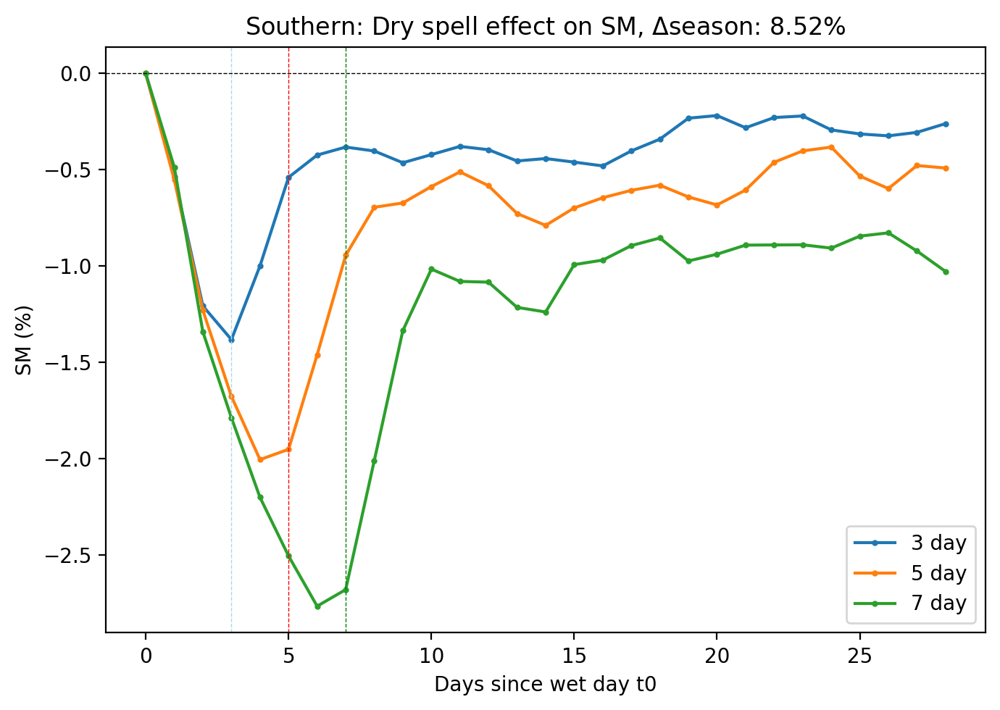

In [97]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)
plt.plot((moving_average(np.nanmean(smerrv3_so,axis=0),2)-moving_average(np.nanmean(smerrv3_so,axis=0), 2)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_so,axis=0),2)-moving_average(np.nanmean(smerrv5_so,axis=0), 2)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_so,axis=0),2)-moving_average(np.nanmean(smerrv7_so,axis=0), 2)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Southern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['southern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_southern_testv2.jpg')

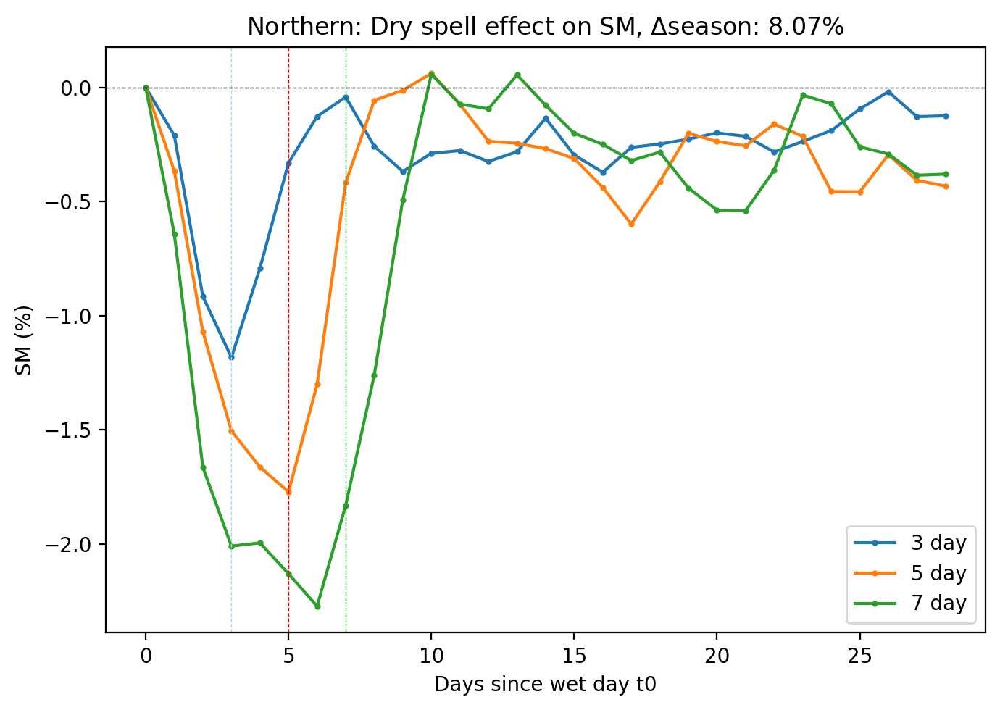

In [71]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)
plt.plot((moving_average(np.nanmean(smerrv3_eq,axis=0),2)-moving_average(np.nanmean(smerrv3_eq,axis=0), 2)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_eq,axis=0),2)-moving_average(np.nanmean(smerrv5_eq,axis=0), 2)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_eq,axis=0),2)-moving_average(np.nanmean(smerrv7_eq,axis=0), 2)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Northern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['northern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_northern_testv2.jpg')

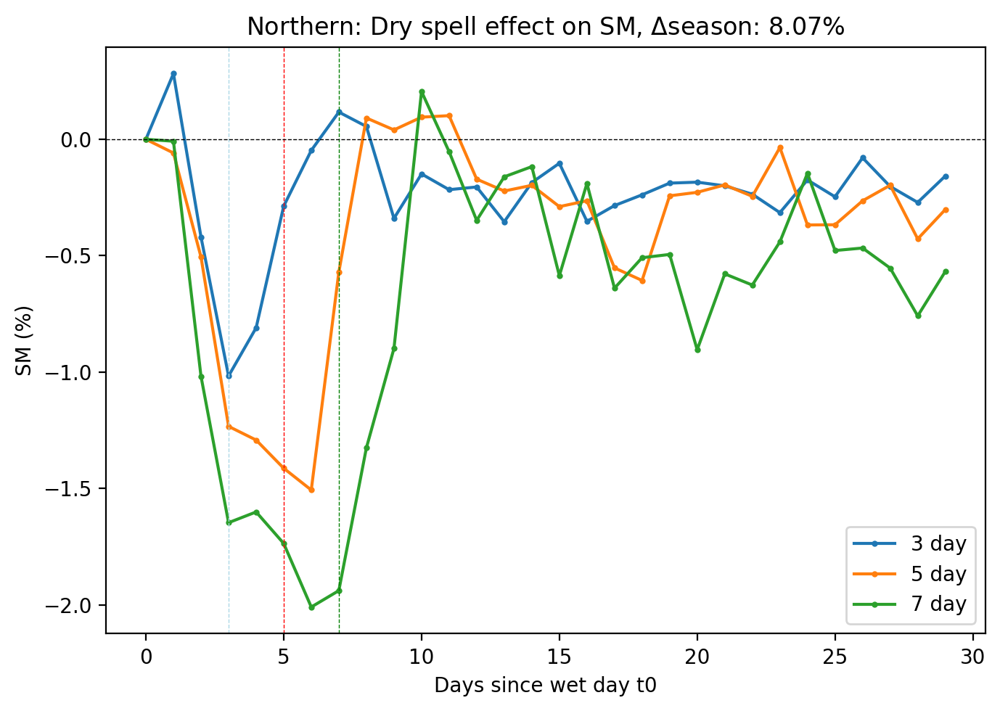

In [150]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)
plt.plot((moving_average(np.nanmean(smerrv3_eq,axis=0),1)-moving_average(np.nanmean(smerrv3_eq,axis=0), 1)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_eq,axis=0),1)-moving_average(np.nanmean(smerrv5_eq,axis=0), 1)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_eq,axis=0),1)-moving_average(np.nanmean(smerrv7_eq,axis=0), 1)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Northern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['northern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_northern_testv2.jpg')

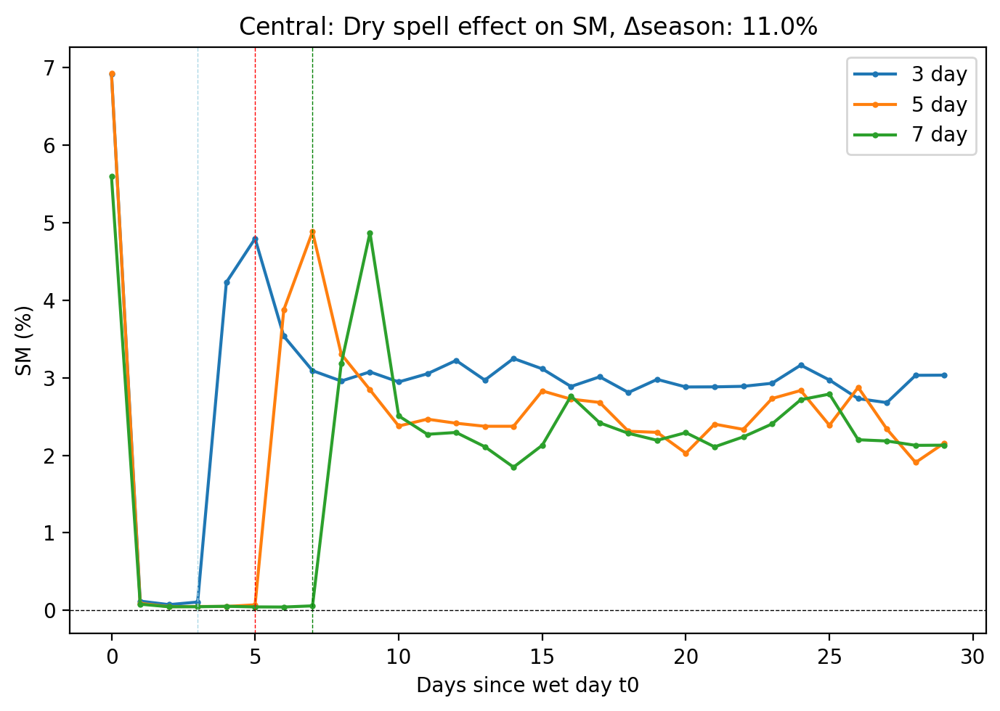

In [56]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)
plt.plot((np.nanmean(smerrc3_hua,axis=0)), label='3 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrc5_hua,axis=0)), label='5 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrc7_hua,axis=0)), label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['RioSanta'].values,2)*100)+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/rioS_central_testv2.jpg')

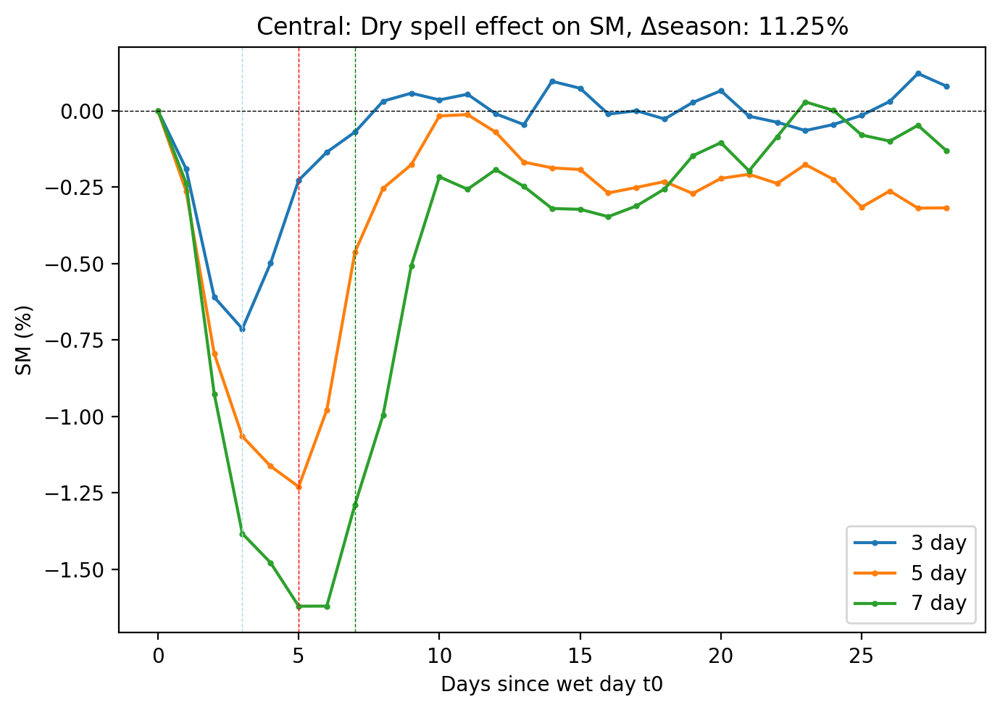

In [73]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)

plt.plot((moving_average(np.nanmean(smerrv3,axis=0),2)-moving_average(np.nanmean(smerrv3,axis=0), 2)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5,axis=0),2)-moving_average(np.nanmean(smerrv5,axis=0), 2)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7,axis=0),2)-moving_average(np.nanmean(smerrv7,axis=0), 2)[0])*100, label='7 day', marker='o', markersize=2)

plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['central'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_riosanta_testv3.jpg')

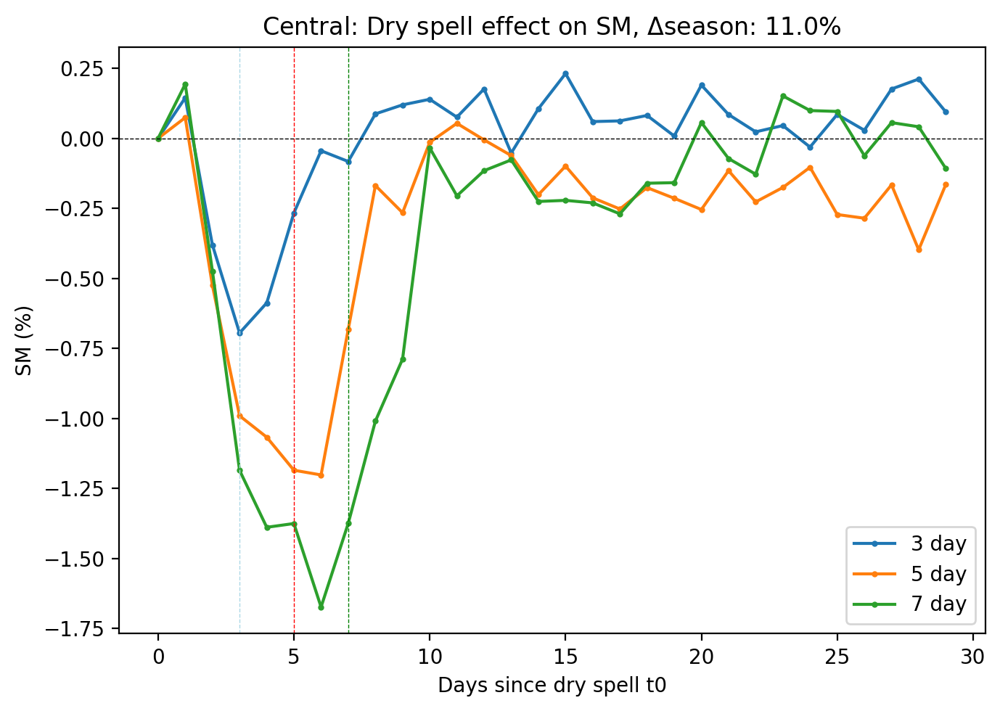

In [57]:
f = plt.figure(figsize=(7,5), dpi=200)
ax = f.add_subplot(111)
plt.plot((np.nanmean(smerrv3,axis=0)-np.nanmean(smerrv3,axis=0)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv5,axis=0)-np.nanmean(smerrv5,axis=0)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv7,axis=0)-np.nanmean(smerrv7,axis=0)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['central'].values,2)*100)+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since dry spell t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
plt.tight_layout()
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_central_testv2.jpg')

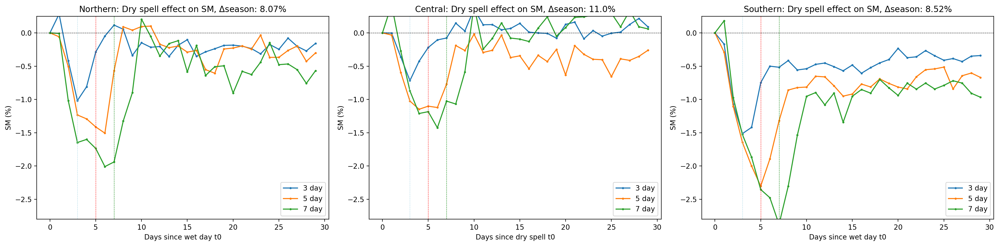

In [153]:
f = plt.figure(figsize=(20,5), dpi=200)

mv=1

ax = f.add_subplot(131)
plt.plot((moving_average(np.nanmean(smerrv3_eq,axis=0),mv)-moving_average(np.nanmean(smerrv3_eq,axis=0), mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_eq,axis=0),mv)-moving_average(np.nanmean(smerrv5_eq,axis=0), mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_eq,axis=0),mv)-moving_average(np.nanmean(smerrv7_eq,axis=0), mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Northern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['northern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_northern_testv2.jpg')

ax = f.add_subplot(132)
plt.plot((np.nanmean(smerrv3,axis=0)-np.nanmean(smerrv3,axis=0)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv5,axis=0)-np.nanmean(smerrv5,axis=0)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv7,axis=0)-np.nanmean(smerrv7,axis=0)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['central'].values,2)*100)+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since dry spell t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_central_testv2.jpg')

ax = f.add_subplot(133)
plt.plot((moving_average(np.nanmean(smerrv3_so,axis=0),mv)-moving_average(np.nanmean(smerrv3_so,axis=0), mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_so,axis=0),mv)-moving_average(np.nanmean(smerrv5_so,axis=0), mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_so,axis=0),mv)-moving_average(np.nanmean(smerrv7_so,axis=0), mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Southern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['southern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)

plt.tight_layout()

In [64]:
ch3_hua, chcnt3_hua, vod3_hua, vodcnt3_hua, vodclim3_hua, voddiff3_hua, vodclimcnt3_hua, voddiffcnt3_hua, errv3_hua, errc3_hua = vod_composite(dat, vod, vod_clim, chdat, 3, topo_on_g, region='RioSanta')
ch5_hua, chcnt5_hua, vod5_hua, vodcnt5_hua, vodclim5_hua, voddiff5_hua, vodclimcnt5_hua, voddiffcnt5_hua, errv5_hua, errc5_hua = vod_composite(dat, vod, vod_clim, chdat, 5, topo_on_g, region='RioSanta')
ch7_hua, chcnt7_hua, vod7_hua, vodcnt7_hua, vodclim7_hua, voddiff7_hua, vodclimcnt7_hua, voddiffcnt7_hua, errv7_hua, errc7_hua = vod_composite(dat, vod, vod_clim, chdat, 7, topo_on_g, region='RioSanta')

Doing -80.0 -12.0
Doing -80.0 -11.75
Doing -80.0 -11.5
Doing -80.0 -11.25
Doing -80.0 -11.0
Doing -80.0 -10.75
Doing -80.0 -10.5
Doing -80.0 -10.25
Doing -80.0 -10.0
Doing -80.0 -9.75
Doing -80.0 -9.5
Doing -80.0 -9.25
Doing -80.0 -9.0
Doing -80.0 -8.75
Doing -80.0 -8.5
Doing -80.0 -8.25
Doing -80.0 -8.0
Doing -79.75 -12.0
Doing -79.75 -11.75
Doing -79.75 -11.5
Doing -79.75 -11.25
Doing -79.75 -11.0
Doing -79.75 -10.75
Doing -79.75 -10.5
Doing -79.75 -10.25
Doing -79.75 -10.0
Doing -79.75 -9.75
Doing -79.75 -9.5
Doing -79.75 -9.25
Doing -79.75 -9.0
Doing -79.75 -8.75
Doing -79.75 -8.5
Doing -79.75 -8.25
Doing -79.75 -8.0
Doing -79.5 -12.0
Doing -79.5 -11.75
Doing -79.5 -11.5
Doing -79.5 -11.25
Doing -79.5 -11.0
Doing -79.5 -10.75
Doing -79.5 -10.5
Doing -79.5 -10.25
Doing -79.5 -10.0
Doing -79.5 -9.75
Doing -79.5 -9.5
Doing -79.5 -9.25
Doing -79.5 -9.0
Doing -79.5 -8.75
Doing -79.5 -8.5
Doing -79.5 -8.25
Doing -79.5 -8.0
Doing -79.25 -12.0
Doing -79.25 -11.75
Doing -79.25 -11.5
Doing -

Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
something wrong
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
something wrong
Doing 378
Doing 379
Doing 380
something wrong
Doing 381
Doing 382
Doing 383
Doing 384
something wrong
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
something wrong
Doing 397
Doing 398
Doing 399
Doing 400
something wrong
Doing 401
Doing 402
Doing 403
something wrong
Doing 404
Doing 405
Doing 406
something wrong
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
something wrong
Doing -77.5 -9.25
Doing -77.5 -9.0
Doing -77.5 -8.75
Doing -77.5 -8.5
Doing -77.5 -8.25
Doing -77.5 -8.0
Doing -77.25 -12.0
Doing -77.25 -11.75
Doing -77.25 -11.5
Doing -77.25 -11.25
Doing -77.25 -11.0
Doing -77.25 -10.75
Doing -77.25 -10.5
Doing -77.25 -10.25
Doing -77.25 -10.0
Doing 412
Doing 413
something wrong
Doing 414
Doing 415
Doing 416
Doing 417
something wrong
Doin

Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
something wrong
something wrong
Doing 69
something wrong
Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
something wrong
Doing 75
Doing 76
Doing 77
Doing 78
Doing -77.75 -8.5
Doing -77.75 -8.25
Doing -77.75 -8.0
Doing -77.5 -12.0
Doing -77.5 -11.75
Doing -77.5 -11.5
Doing -77.5 -11.25
Doing -77.5 -11.0
Doing -77.5 -10.75
Doing -77.5 -10.5
Doing -77.5 -10.25
Doing -77.5 -10.0
Doing -77.5 -9.75
Doing 79
something wrong
Doing 80
something wrong
Doing 81
Doing 82
Doing 83
Doing 84
something wrong
Doing 85
Doing 86
Doing 87
Doing 88
something wrong
Doing 89
something wrong
Doing 90
Doing -77.5 -9.5
Doing 91
something wrong
Doing 92
Doing 93
Doing 94
something wrong
Doing 95
something wrong
Doing 96
Doing 97
something wrong
something wrong
Doing 98
something wrong
Doing 99
Doing 100
Doing 101
something wrong
something wrong
Doing 102
Doing 103
Doing 104
Doing 105
something wrong
Doing 106
Doing 107
Doing 108
Doing 

Doing -76.5 -10.75
Doing -76.5 -10.5
Doing -76.5 -10.25
Doing -76.5 -10.0
Doing -76.5 -9.75
Doing -76.5 -9.5
Doing -76.5 -9.25
Doing -76.5 -9.0
Doing -76.5 -8.75
Doing -76.5 -8.5
Doing -76.5 -8.25
Doing -76.5 -8.0
Doing -76.25 -12.0
Doing -76.25 -11.75
Doing -76.25 -11.5
Doing -76.25 -11.25
Doing -76.25 -11.0
Doing -76.25 -10.75
Doing -76.25 -10.5
Doing -76.25 -10.25
Doing -76.25 -10.0
Doing -76.25 -9.75
Doing -76.25 -9.5
Doing -76.25 -9.25
Doing -76.25 -9.0
Doing -76.25 -8.75
Doing -76.25 -8.5
Doing -76.25 -8.25
Doing -76.25 -8.0
Doing -76.0 -12.0
Doing -76.0 -11.75
Doing -76.0 -11.5
Doing -76.0 -11.25
Doing -76.0 -11.0
Doing -76.0 -10.75
Doing -76.0 -10.5
Doing -76.0 -10.25
Doing -76.0 -10.0
Doing -76.0 -9.75
Doing -76.0 -9.5
Doing -76.0 -9.25
Doing -76.0 -9.0
Doing -76.0 -8.75
Doing -76.0 -8.5
Doing -76.0 -8.25
Doing -76.0 -8.0


In [65]:
ch3, chcnt3, vod3, vodcnt3, vodclim3, voddiff3, vodclimcnt3, voddiffcnt3, errv3, errc3 = vod_composite(dat, vod, vod_clim, chdat, 3, topo_on_g, region='central')
ch5, chcnt5, vod5, vodcnt5, vodclim5, voddiff5, vodclimcnt5, voddiffcnt5, errv5, errc5 = vod_composite(dat, vod, vod_clim, chdat, 5, topo_on_g, region='central')
ch7, chcnt7, vod7, vodcnt7, vodclim7, voddiff7, vodclimcnt7, voddiffcnt7, errv7, errc7 = vod_composite(dat, vod, vod_clim, chdat, 7, topo_on_g, region='central')

Doing -81.0 -12.0
Doing -81.0 -11.75
Doing -81.0 -11.5
Doing -81.0 -11.25
Doing -81.0 -11.0
Doing -81.0 -10.75
Doing -81.0 -10.5
Doing -81.0 -10.25
Doing -81.0 -10.0
Doing -81.0 -9.75
Doing -81.0 -9.5
Doing -81.0 -9.25
Doing -81.0 -9.0
Doing -81.0 -8.75
Doing -81.0 -8.5
Doing -81.0 -8.25
Doing -81.0 -8.0
Doing -80.75 -12.0
Doing -80.75 -11.75
Doing -80.75 -11.5
Doing -80.75 -11.25
Doing -80.75 -11.0
Doing -80.75 -10.75
Doing -80.75 -10.5
Doing -80.75 -10.25
Doing -80.75 -10.0
Doing -80.75 -9.75
Doing -80.75 -9.5
Doing -80.75 -9.25
Doing -80.75 -9.0
Doing -80.75 -8.75
Doing -80.75 -8.5
Doing -80.75 -8.25
Doing -80.75 -8.0
Doing -80.5 -12.0
Doing -80.5 -11.75
Doing -80.5 -11.5
Doing -80.5 -11.25
Doing -80.5 -11.0
Doing -80.5 -10.75
Doing -80.5 -10.5
Doing -80.5 -10.25
Doing -80.5 -10.0
Doing -80.5 -9.75
Doing -80.5 -9.5
Doing -80.5 -9.25
Doing -80.5 -9.0
Doing -80.5 -8.75
Doing -80.5 -8.5
Doing -80.5 -8.25
Doing -80.5 -8.0
Doing -80.25 -12.0
Doing -80.25 -11.75
Doing -80.25 -11.5
Doing -

something wrong
Doing 343
Doing 344
Doing 345
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
Doing 352
Doing 353
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
something wrong
Doing 359
Doing 360
Doing 361
Doing 362
Doing 363
Doing 364
Doing 365
something wrong
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
something wrong
Doing 375
Doing 376
Doing 377
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
Doing 384
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
something wrong
Doing 394
Doing 395
Doing 396
something wrong
Doing -78.0 -12.0
Doing -78.0 -11.75
Doing -78.0 -11.5
Doing -78.0 -11.25
Doing -78.0 -11.0
Doing -78.0 -10.75
Doing -78.0 -10.5
Doing -78.0 -10.25
Doing -78.0 -10.0
Doing -78.0 -9.75
Doing -78.0 -9.5
Doing -78.0 -9.25
Doing 397
something wrong
something wrong
Doing 398
Doing 399
Doing 400
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
something wrong
somethi

Doing 924
Doing 925
Doing 926
Doing 927
something wrong
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
something wrong
something wrong
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
something wrong
something wrong
Doing 946
Doing 947
Doing 948
Doing 949
something wrong
something wrong
Doing 950
Doing 951
Doing 952
Doing 953
something wrong
something wrong
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
something wrong
Doing 960
Doing 961
Doing 962
Doing 963
something wrong
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
something wrong
something wrong
something wrong
something wrong
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
something wrong
something wrong
something wrong
something wrong
something wrong
Doing 982
Doing 983
Doing 984
Doing 985
something wrong
something wrong
Doing 986
Doing 987
Doing 98

Doing 1477
Doing 1478
Doing 1479
Doing 1480
something wrong
something wrong
something wrong
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
something wrong
Doing 1487
Doing 1488
Doing 1489
Doing 1490
something wrong
Doing 1491
Doing 1492
something wrong
something wrong
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
something wrong
something wrong
something wrong
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
something wrong
something wrong
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
something wrong
something wrong
Doing -77.75 -8.0
Doing 1543
Doing 1544
Doing 1545

Doing 2021
Doing 2022
Doing 2023
Doing 2024
Doing 2025
Doing 2026
Doing 2027
Doing 2028
something wrong
Doing 2029
Doing 2030
Doing 2031
Doing 2032
Doing 2033
Doing 2034
Doing 2035
Doing 2036
Doing 2037
something wrong
Doing 2038
Doing 2039
Doing 2040
Doing 2041
Doing 2042
Doing 2043
Doing 2044
something wrong
something wrong
Doing 2045
Doing 2046
Doing 2047
Doing 2048
something wrong
Doing 2049
Doing 2050
Doing 2051
Doing 2052
Doing 2053
Doing 2054
Doing 2055
Doing 2056
Doing 2057
something wrong
Doing 2058
Doing 2059
Doing 2060
Doing 2061
Doing 2062
Doing 2063
Doing 2064
something wrong
something wrong
Doing 2065
Doing 2066
Doing 2067
Doing 2068
something wrong
Doing 2069
Doing 2070
Doing 2071
Doing 2072
something wrong
something wrong
Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
something wrong
Doing 2078
Doing 2079
Doing 2080
Doing 2081
Doing 2082
something wrong
Doing 2083
Doing 2084
Doing 2085
something wrong
something wrong
Doing 2086
Doing 2087
Doing 2088
Doing 2089
D

Doing 2581
Doing 2582
Doing 2583
something wrong
something wrong
something wrong
Doing 2584
Doing 2585
Doing 2586
Doing 2587
Doing 2588
Doing 2589
Doing 2590
Doing 2591
something wrong
something wrong
Doing 2592
something wrong
something wrong
something wrong
Doing 2593
Doing 2594
something wrong
something wrong
something wrong
Doing 2595
Doing 2596
Doing 2597
something wrong
something wrong
Doing 2598
Doing 2599
something wrong
something wrong
something wrong
Doing 2600
Doing 2601
Doing 2602
Doing 2603
Doing 2604
Doing 2605
something wrong
Doing 2606
Doing 2607
Doing 2608
something wrong
something wrong
Doing 2609
Doing 2610
Doing 2611
Doing 2612
Doing -77.25 -10.25
Doing 2613
Doing 2614
something wrong
Doing 2615
Doing 2616
Doing 2617
Doing 2618
Doing 2619
Doing 2620
Doing 2621
Doing 2622
something wrong
Doing 2623
something wrong
Doing 2624
Doing 2625
Doing 2626
Doing 2627
Doing 2628
Doing 2629
Doing 2630
Doing 2631
Doing 2632
Doing 2633
Doing 2634
Doing 2635
something wrong
somethi

Doing 3139
Doing 3140
something wrong
something wrong
something wrong
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
something wrong
Doing 3146
Doing 3147
Doing 3148
something wrong
Doing 3149
Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
something wrong
Doing 3155
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
something wrong
something wrong
Doing -77.25 -8.5
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
something wrong
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
something wrong
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
something wrong
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
something wrong
something wrong
Doing 3186
Doing 3187
Doing 3188
Doing 3189
something wrong
something wrong
something wrong
Doing 3190
Doing 3191
Doing 3192
something wrong
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
something wrong
something wrong
something wrong
Do

Doing 3687
Doing 3688
Doing 3689
Doing 3690
something wrong
something wrong
Doing 3691
Doing 3692
Doing 3693
Doing 3694
something wrong
something wrong
Doing 3695
Doing 3696
Doing 3697
Doing 3698
Doing 3699
Doing 3700
Doing 3701
Doing 3702
Doing 3703
Doing 3704
something wrong
something wrong
Doing 3705
Doing 3706
Doing 3707
Doing 3708
Doing 3709
Doing 3710
Doing 3711
Doing 3712
something wrong
something wrong
something wrong
Doing 3713
Doing 3714
Doing 3715
Doing 3716
Doing 3717
Doing 3718
something wrong
something wrong
Doing 3719
Doing 3720
Doing 3721
Doing 3722
something wrong
something wrong
Doing 3723
Doing 3724
Doing -77.0 -10.25
Doing 3725
Doing 3726
Doing 3727
Doing 3728
something wrong
something wrong
Doing 3729
Doing 3730
something wrong
Doing 3731
Doing 3732
Doing 3733
Doing 3734
something wrong
something wrong
Doing 3735
Doing 3736
Doing 3737
Doing 3738
Doing 3739
something wrong
Doing 3740
Doing 3741
Doing 3742
Doing 3743
Doing 3744
Doing 3745
Doing 3746
Doing 3747
someth

Doing 4227
Doing 4228
something wrong
Doing 4229
Doing 4230
Doing 4231
Doing 4232
Doing 4233
Doing 4234
Doing 4235
Doing 4236
something wrong
something wrong
Doing 4237
Doing 4238
Doing 4239
Doing 4240
Doing 4241
Doing 4242
Doing 4243
Doing 4244
Doing 4245
Doing 4246
Doing 4247
Doing 4248
Doing 4249
something wrong
Doing 4250
Doing 4251
Doing 4252
Doing 4253
Doing 4254
something wrong
Doing 4255
Doing 4256
Doing 4257
something wrong
Doing -77.0 -8.5
Doing 4258
Doing 4259
Doing 4260
Doing 4261
Doing 4262
Doing 4263
Doing 4264
Doing 4265
Doing 4266
something wrong
Doing 4267
Doing 4268
Doing 4269
something wrong
something wrong
something wrong
Doing 4270
Doing 4271
Doing 4272
Doing 4273
Doing 4274
Doing 4275
Doing 4276
something wrong
something wrong
Doing 4277
Doing 4278
Doing 4279
Doing 4280
Doing 4281
something wrong
Doing 4282
something wrong
Doing 4283
Doing 4284
Doing 4285
Doing 4286
Doing 4287
Doing 4288
something wrong
something wrong
Doing 4289
Doing 4290
something wrong
Doing 4

Doing 4748
Doing 4749
Doing 4750
something wrong
something wrong
something wrong
Doing 4751
Doing 4752
Doing 4753
Doing 4754
something wrong
something wrong
something wrong
Doing 4755
Doing 4756
Doing 4757
Doing 4758
Doing -76.75 -10.75
Doing 4759
Doing 4760
Doing 4761
Doing 4762
Doing 4763
Doing 4764
Doing 4765
Doing 4766
Doing 4767
Doing 4768
Doing 4769
Doing 4770
Doing 4771
Doing 4772
Doing 4773
Doing 4774
something wrong
something wrong
Doing 4775
Doing 4776
Doing 4777
Doing 4778
something wrong
Doing 4779
Doing 4780
something wrong
Doing 4781
Doing 4782
Doing 4783
Doing 4784
Doing 4785
Doing 4786
Doing 4787
Doing 4788
Doing 4789
Doing 4790
Doing 4791
Doing 4792
Doing 4793
something wrong
Doing 4794
Doing 4795
Doing 4796
Doing 4797
Doing 4798
Doing 4799
Doing 4800
Doing 4801
Doing 4802
Doing 4803
Doing 4804
Doing 4805
Doing 4806
Doing 4807
Doing 4808
Doing 4809
Doing 4810
Doing 4811
Doing 4812
Doing 4813
Doing 4814
Doing 4815
something wrong
something wrong
Doing 4816
Doing 4817
Do

Doing 5316
something wrong
something wrong
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing 5327
something wrong
something wrong
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
something wrong
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
something wrong
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
something wrong
Doing 5347
Doing 5348
Doing 5349
Doing 5350
something wrong
Doing 5351
Doing 5352
something wrong
Doing 5353
Doing 5354
Doing 5355
Doing 5356
something wrong
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 5373
something wrong
something wrong
something wrong
something wrong
Doing 5374
Doing 5375
Doing 5376
something wrong
something wrong
Doing 5377
Doing 5378
Doing 5379
Doing 5380
Doing 5381
Doing 5382
Doing 5

something wrong
something wrong
Doing 5880
Doing 5881
Doing 5882
something wrong
something wrong
Doing 5883
Doing 5884
Doing 5885
Doing 5886
Doing 5887
Doing 5888
Doing 5889
Doing 5890
Doing 5891
Doing 5892
something wrong
something wrong
Doing 5893
Doing 5894
Doing 5895
Doing 5896
Doing 5897
Doing 5898
Doing 5899
Doing 5900
Doing 5901
Doing 5902
Doing 5903
Doing 5904
Doing 5905
Doing 5906
Doing 5907
Doing 5908
Doing 5909
Doing 5910
Doing 5911
Doing 5912
Doing 5913
Doing 5914
Doing 5915
something wrong
Doing 5916
Doing 5917
Doing 5918
something wrong
something wrong
Doing 5919
Doing 5920
Doing 5921
Doing 5922
Doing 5923
Doing 5924
Doing 5925
Doing 5926
Doing 5927
Doing 5928
Doing 5929
Doing 5930
something wrong
something wrong
Doing 5931
Doing 5932
Doing 5933
Doing 5934
something wrong
Doing 5935
Doing 5936
Doing 5937
Doing 5938
Doing 5939
Doing 5940
Doing 5941
Doing 5942
Doing 5943
Doing 5944
Doing 5945
Doing 5946
Doing 5947
Doing 5948
something wrong
Doing 5949
Doing 5950
Doing 5951


Doing 6473
Doing 6474
Doing 6475
Doing 6476
Doing 6477
Doing 6478
Doing 6479
something wrong
Doing 6480
something wrong
Doing 6481
Doing 6482
Doing 6483
Doing 6484
Doing 6485
Doing 6486
Doing 6487
Doing 6488
Doing 6489
Doing 6490
Doing 6491
Doing 6492
Doing 6493
Doing 6494
something wrong
something wrong
Doing 6495
Doing 6496
Doing 6497
Doing 6498
something wrong
Doing 6499
Doing 6500
Doing 6501
something wrong
Doing 6502
something wrong
Doing -76.5 -8.5
Doing -76.5 -8.25
Doing -76.5 -8.0
Doing -76.25 -12.0
Doing 6503
something wrong
Doing 6504
Doing 6505
Doing 6506
Doing 6507
Doing 6508
Doing 6509
something wrong
Doing 6510
Doing 6511
Doing 6512
Doing 6513
something wrong
Doing 6514
Doing 6515
Doing 6516
Doing 6517
Doing 6518
Doing 6519
Doing 6520
Doing 6521
Doing 6522
Doing 6523
Doing 6524
Doing 6525
Doing 6526
Doing 6527
something wrong
Doing 6528
Doing 6529
something wrong
something wrong
Doing 6530
Doing 6531
Doing 6532
Doing 6533
Doing 6534
something wrong
Doing 6535
Doing 6536
D

Doing 7068
Doing 7069
Doing 7070
Doing 7071
Doing 7072
Doing 7073
Doing 7074
Doing 7075
something wrong
Doing 7076
Doing 7077
Doing 7078
Doing 7079
something wrong
Doing 7080
Doing 7081
Doing 7082
Doing 7083
Doing 7084
Doing 7085
Doing 7086
Doing 7087
Doing 7088
something wrong
Doing 7089
Doing 7090
Doing 7091
Doing 7092
something wrong
something wrong
Doing 7093
Doing 7094
Doing 7095
Doing 7096
something wrong
Doing 7097
Doing 7098
Doing 7099
Doing 7100
Doing 7101
Doing 7102
something wrong
something wrong
Doing 7103
Doing 7104
something wrong
something wrong
Doing 7105
Doing 7106
Doing 7107
Doing 7108
Doing 7109
Doing 7110
Doing 7111
something wrong
something wrong
Doing -76.25 -10.0
Doing 7112
Doing 7113
Doing 7114
something wrong
Doing 7115
Doing 7116
Doing 7117
Doing 7118
Doing 7119
something wrong
Doing 7120
Doing 7121
Doing 7122
Doing 7123
Doing 7124
Doing 7125
Doing 7126
Doing 7127
something wrong
something wrong
Doing 7128
Doing 7129
Doing 7130
Doing 7131
Doing 7132
something 

Doing 7625
something wrong
Doing 7626
Doing 7627
Doing 7628
something wrong
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
Doing 7635
Doing 7636
Doing 7637
Doing 7638
something wrong
something wrong
Doing 7639
Doing 7640
Doing 7641
Doing 7642
Doing 7643
Doing 7644
Doing 7645
Doing 7646
Doing 7647
Doing 7648
Doing 7649
Doing 7650
Doing 7651
something wrong
Doing 7652
Doing 7653
Doing 7654
Doing 7655
Doing 7656
something wrong
Doing 7657
Doing 7658
Doing 7659
Doing 7660
something wrong
Doing 7661
Doing 7662
Doing 7663
Doing 7664
something wrong
Doing 7665
Doing 7666
Doing 7667
Doing 7668
something wrong
Doing 7669
Doing 7670
Doing 7671
something wrong
Doing 7672
Doing 7673
Doing 7674
Doing 7675
Doing 7676
Doing 7677
Doing 7678
Doing 7679
Doing 7680
Doing 7681
Doing 7682
Doing 7683
Doing 7684
Doing 7685
Doing 7686
something wrong
Doing 7687
Doing 7688
Doing 7689
Doing 7690
Doing 7691
something wrong
Doing 7692
Doing 7693
Doing 7694
Doing 7695
Doing 7696
Doing 7697
Doing

something wrong
Doing 8170
Doing 8171
Doing 8172
Doing 8173
something wrong
something wrong
something wrong
Doing 8174
Doing 8175
Doing 8176
Doing 8177
Doing 8178
something wrong
something wrong
Doing 8179
Doing 8180
Doing 8181
Doing -75.75 -11.0
Doing 8182
Doing 8183
Doing 8184
Doing 8185
Doing 8186
something wrong
something wrong
Doing 8187
Doing 8188
Doing 8189
Doing 8190
Doing 8191
Doing 8192
something wrong
Doing 8193
Doing 8194
Doing 8195
Doing 8196
Doing 8197
Doing 8198
Doing 8199
something wrong
Doing 8200
Doing 8201
Doing 8202
something wrong
Doing 8203
Doing 8204
Doing 8205
Doing 8206
something wrong
Doing 8207
Doing 8208
something wrong
something wrong
something wrong
something wrong
Doing 8209
Doing 8210
something wrong
Doing 8211
Doing 8212
Doing 8213
Doing 8214
Doing 8215
something wrong
Doing 8216
Doing 8217
Doing 8218
Doing 8219
Doing 8220
Doing 8221
Doing 8222
something wrong
something wrong
Doing 8223
Doing 8224
Doing 8225
Doing 8226
Doing 8227
Doing 8228
something wr

Doing 8710
Doing 8711
Doing 8712
something wrong
Doing 8713
Doing 8714
Doing 8715
something wrong
something wrong
Doing 8716
Doing 8717
Doing 8718
Doing 8719
Doing 8720
Doing 8721
Doing 8722
Doing 8723
Doing 8724
something wrong
Doing 8725
Doing 8726
Doing 8727
Doing 8728
something wrong
something wrong
Doing 8729
Doing 8730
Doing 8731
Doing 8732
Doing 8733
Doing 8734
Doing 8735
something wrong
Doing 8736
Doing 8737
Doing 8738
Doing 8739
Doing 8740
something wrong
something wrong
Doing 8741
Doing 8742
Doing 8743
Doing 8744
something wrong
something wrong
Doing 8745
something wrong
Doing 8746
Doing 8747
Doing 8748
Doing 8749
Doing 8750
Doing 8751
Doing 8752
Doing 8753
Doing 8754
Doing 8755
Doing 8756
Doing 8757
Doing 8758
something wrong
Doing 8759
Doing 8760
Doing 8761
something wrong
Doing 8762
Doing 8763
Doing 8764
Doing 8765
something wrong
Doing 8766
Doing 8767
Doing 8768
Doing 8769
Doing 8770
Doing 8771
Doing 8772
something wrong
something wrong
Doing 8773
Doing 8774
Doing 8775
Do

Doing 9216
Doing 9217
Doing 9218
Doing 9219
Doing 9220
Doing 9221
something wrong
Doing 9222
Doing 9223
Doing 9224
Doing 9225
something wrong
Doing 9226
Doing 9227
Doing 9228
something wrong
Doing 9229
Doing 9230
Doing 9231
Doing 9232
Doing 9233
Doing 9234
Doing 9235
Doing 9236
Doing 9237
Doing 9238
Doing 9239
Doing 9240
Doing 9241
Doing 9242
Doing 9243
Doing 9244
Doing 9245
something wrong
Doing 9246
Doing 9247
Doing 9248
Doing 9249
Doing 9250
Doing 9251
Doing 9252
Doing 9253
Doing 9254
Doing 9255
Doing 9256
Doing 9257
Doing 9258
something wrong
Doing 9259
Doing 9260
Doing 9261
Doing 9262
Doing 9263
Doing 9264
Doing 9265
Doing 9266
Doing 9267
Doing 9268
something wrong
Doing 9269
Doing 9270
Doing 9271
Doing 9272
Doing 9273
Doing 9274
Doing 9275
Doing 9276
Doing 9277
Doing 9278
Doing 9279
Doing 9280
Doing 9281
something wrong
something wrong
something wrong
Doing 9282
something wrong
Doing 9283
Doing 9284
Doing 9285
Doing 9286
something wrong
Doing -74.75 -11.75
Doing 9287
Doing 9288
D

Doing -72.0 -10.75
Doing -72.0 -10.5
Doing -72.0 -10.25
Doing -72.0 -10.0
Doing -72.0 -9.75
Doing -72.0 -9.5
Doing -72.0 -9.25
Doing -72.0 -9.0
Doing -72.0 -8.75
Doing -72.0 -8.5
Doing -72.0 -8.25
Doing -72.0 -8.0
Doing -71.75 -12.0
Doing -71.75 -11.75
Doing -71.75 -11.5
Doing -71.75 -11.25
Doing -71.75 -11.0
Doing -71.75 -10.75
Doing -71.75 -10.5
Doing -71.75 -10.25
Doing -71.75 -10.0
Doing -71.75 -9.75
Doing -71.75 -9.5
Doing -71.75 -9.25
Doing -71.75 -9.0
Doing -71.75 -8.75
Doing -71.75 -8.5
Doing -71.75 -8.25
Doing -71.75 -8.0
Doing -71.5 -12.0
Doing -71.5 -11.75
Doing -71.5 -11.5
Doing -71.5 -11.25
Doing -71.5 -11.0
Doing -71.5 -10.75
Doing -71.5 -10.5
Doing -71.5 -10.25
Doing -71.5 -10.0
Doing -71.5 -9.75
Doing -71.5 -9.5
Doing -71.5 -9.25
Doing -71.5 -9.0
Doing -71.5 -8.75
Doing -71.5 -8.5
Doing -71.5 -8.25
Doing -71.5 -8.0
Doing -71.25 -12.0
Doing -71.25 -11.75
Doing -71.25 -11.5
Doing -71.25 -11.25
Doing -71.25 -11.0
Doing -71.25 -10.75
Doing -71.25 -10.5
Doing -71.25 -10.25
D

Doing -81.0 -12.0
Doing -81.0 -11.75
Doing -81.0 -11.5
Doing -81.0 -11.25
Doing -81.0 -11.0
Doing -81.0 -10.75
Doing -81.0 -10.5
Doing -81.0 -10.25
Doing -81.0 -10.0
Doing -81.0 -9.75
Doing -81.0 -9.5
Doing -81.0 -9.25
Doing -81.0 -9.0
Doing -81.0 -8.75
Doing -81.0 -8.5
Doing -81.0 -8.25
Doing -81.0 -8.0
Doing -80.75 -12.0
Doing -80.75 -11.75
Doing -80.75 -11.5
Doing -80.75 -11.25
Doing -80.75 -11.0
Doing -80.75 -10.75
Doing -80.75 -10.5
Doing -80.75 -10.25
Doing -80.75 -10.0
Doing -80.75 -9.75
Doing -80.75 -9.5
Doing -80.75 -9.25
Doing -80.75 -9.0
Doing -80.75 -8.75
Doing -80.75 -8.5
Doing -80.75 -8.25
Doing -80.75 -8.0
Doing -80.5 -12.0
Doing -80.5 -11.75
Doing -80.5 -11.5
Doing -80.5 -11.25
Doing -80.5 -11.0
Doing -80.5 -10.75
Doing -80.5 -10.5
Doing -80.5 -10.25
Doing -80.5 -10.0
Doing -80.5 -9.75
Doing -80.5 -9.5
Doing -80.5 -9.25
Doing -80.5 -9.0
Doing -80.5 -8.75
Doing -80.5 -8.5
Doing -80.5 -8.25
Doing -80.5 -8.0
Doing -80.25 -12.0
Doing -80.25 -11.75
Doing -80.25 -11.5
Doing -

Doing 291
something wrong
something wrong
Doing 292
Doing 293
Doing 294
Doing 295
Doing 296
Doing 297
Doing 298
Doing 299
Doing 300
Doing 301
Doing 302
Doing 303
something wrong
Doing 304
something wrong
Doing 305
something wrong
Doing 306
Doing 307
Doing 308
Doing -78.0 -8.25
Doing 309
Doing 310
Doing 311
Doing 312
something wrong
Doing 313
Doing 314
Doing 315
something wrong
something wrong
Doing 316
Doing 317
something wrong
something wrong
Doing 318
Doing 319
Doing 320
Doing 321
Doing 322
Doing 323
Doing 324
Doing 325
something wrong
Doing 326
something wrong
Doing 327
Doing 328
something wrong
Doing 329
Doing 330
Doing 331
something wrong
Doing 332
something wrong
something wrong
Doing 333
Doing 334
something wrong
Doing 335
Doing 336
Doing 337
something wrong
Doing 338
Doing 339
something wrong
something wrong
something wrong
Doing -78.0 -8.0
Doing 340
Doing 341
Doing 342
Doing 343
Doing 344
something wrong
something wrong
Doing 345
Doing 346
something wrong
Doing 347
Doing 348
D

something wrong
Doing 806
Doing 807
something wrong
Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
something wrong
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
something wrong
Doing 819
Doing 820
Doing 821
Doing 822
Doing 823
Doing 824
Doing -77.5 -8.0
Doing 825
Doing 826
something wrong
Doing 827
Doing 828
Doing 829
something wrong
Doing 830
Doing 831
something wrong
something wrong
something wrong
Doing 832
something wrong
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
something wrong
Doing 839
something wrong
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
something wrong
Doing 847
Doing 848
something wrong
Doing 849
Doing 850
Doing 851
Doing 852
something wrong
Doing 853
Doing 854
Doing 855
Doing -77.25 -12.0
Doing -77.25 -11.75
Doing -77.25 -11.5
Doing -77.25 -11.25
Doing -77.25 -11.0
Doing -77.25 -10.75
Doing 856
Doing 857
something wrong
something wrong
Doing 858
Doing 859
Doing 860
Doing 861
something wrong
something wrong
Do

Doing 1319
Doing 1320
Doing 1321
Doing 1322
Doing 1323
Doing 1324
Doing 1325
Doing 1326
Doing 1327
Doing 1328
Doing 1329
Doing 1330
something wrong
something wrong
something wrong
Doing 1331
Doing 1332
Doing 1333
Doing -77.0 -9.5
Doing 1334
Doing 1335
Doing 1336
something wrong
Doing 1337
Doing 1338
Doing 1339
Doing 1340
Doing 1341
Doing 1342
Doing 1343
Doing 1344
Doing 1345
something wrong
Doing 1346
Doing 1347
Doing 1348
Doing 1349
Doing 1350
Doing 1351
Doing 1352
Doing 1353
Doing 1354
Doing 1355
Doing -77.0 -9.25
something wrong
Doing 1356
Doing 1357
Doing 1358
Doing 1359
something wrong
Doing 1360
Doing 1361
Doing 1362
something wrong
Doing 1363
Doing 1364
Doing 1365
Doing 1366
something wrong
Doing 1367
Doing 1368
Doing 1369
Doing 1370
Doing 1371
Doing 1372
Doing 1373
something wrong
something wrong
Doing 1374
Doing 1375
Doing 1376
something wrong
Doing 1377
Doing 1378
something wrong
something wrong
Doing 1379
Doing -77.0 -9.0
Doing 1380
Doing 1381
Doing 1382
Doing 1383
Doing 138

Doing 1833
something wrong
Doing 1834
Doing 1835
something wrong
Doing 1836
Doing 1837
something wrong
Doing 1838
something wrong
Doing 1839
something wrong
something wrong
Doing 1840
Doing 1841
something wrong
something wrong
something wrong
something wrong
Doing 1842
something wrong
Doing 1843
Doing 1844
Doing 1845
something wrong
Doing 1846
Doing 1847
something wrong
something wrong
Doing 1848
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing -76.5 -11.75
something wrong
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
something wrong
Doing 1863
something wrong
Doing 1864
Doing 1865
Doing 1866
Doing 1867
something wrong
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing 1873
Doing 1874
Doing -76.5 -11.5
something wrong
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
Doing 1882
Doing 1883
something wrong
Doing 1884
Doing 1885
Doing 1886
something wrong
Doing 1887
Doing 1888
Doing 1889


Doing 2352
Doing 2353
something wrong
something wrong
Doing 2354
Doing 2355
Doing 2356
Doing -76.0 -11.75
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
something wrong
Doing 2363
something wrong
Doing 2364
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing 2369
Doing 2370
something wrong
Doing 2371
Doing 2372
Doing 2373
Doing 2374
something wrong
Doing 2375
Doing -76.0 -11.5
something wrong
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
something wrong
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
something wrong
Doing 2396
Doing 2397
Doing 2398
Doing -76.0 -11.25
Doing -76.0 -11.0
Doing -76.0 -10.75
Doing 2399
Doing 2400
Doing 2401
Doing 2402
something wrong
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing 2408
something wrong
Doing 2409
Doing 2410
Doing 2411
Doing -76.0 -10.5
Doing 2412
Doing 2413
something wrong
Doing 2414
Doin

Doing 2833
Doing 2834
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
Doing 2840
Doing -74.75 -11.5
something wrong
Doing 2841
Doing 2842
Doing 2843
Doing 2844
Doing 2845
Doing 2846
something wrong
Doing 2847
Doing 2848
Doing 2849
Doing 2850
Doing -74.75 -11.25
Doing -74.75 -11.0
Doing -74.75 -10.75
Doing -74.75 -10.5
Doing -74.75 -10.25
Doing -74.75 -10.0
Doing -74.75 -9.75
Doing -74.75 -9.5
Doing -74.75 -9.25
Doing -74.75 -9.0
Doing -74.75 -8.75
Doing -74.75 -8.5
Doing -74.75 -8.25
Doing -74.75 -8.0
Doing -74.5 -12.0
Doing 2851
something wrong
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
something wrong
Doing 2866
Doing 2867
Doing -74.5 -11.75
Doing 2868
Doing 2869
Doing 2870
Doing 2871
Doing 2872
Doing 2873
Doing 2874
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing -74.5 -11.5
Doing -74.5 -1

Doing -68.25 -10.75
Doing -68.25 -10.5
Doing -68.25 -10.25
Doing -68.25 -10.0
Doing -68.25 -9.75
Doing -68.25 -9.5
Doing -68.25 -9.25
Doing -68.25 -9.0
Doing -68.25 -8.75
Doing -68.25 -8.5
Doing -68.25 -8.25
Doing -68.25 -8.0
Doing -68.0 -12.0
Doing -68.0 -11.75
Doing -68.0 -11.5
Doing -68.0 -11.25
Doing -68.0 -11.0
Doing -68.0 -10.75
Doing -68.0 -10.5
Doing -68.0 -10.25
Doing -68.0 -10.0
Doing -68.0 -9.75
Doing -68.0 -9.5
Doing -68.0 -9.25
Doing -68.0 -9.0
Doing -68.0 -8.75
Doing -68.0 -8.5
Doing -68.0 -8.25
Doing -68.0 -8.0
Doing -67.75 -12.0
Doing -67.75 -11.75
Doing -67.75 -11.5
Doing -67.75 -11.25
Doing -67.75 -11.0
Doing -67.75 -10.75
Doing -67.75 -10.5
Doing -67.75 -10.25
Doing -67.75 -10.0
Doing -67.75 -9.75
Doing -67.75 -9.5
Doing -67.75 -9.25
Doing -67.75 -9.0
Doing -67.75 -8.75
Doing -67.75 -8.5
Doing -67.75 -8.25
Doing -67.75 -8.0
Doing -67.5 -12.0
Doing -67.5 -11.75
Doing -67.5 -11.5
Doing -67.5 -11.25
Doing -67.5 -11.0
Doing -67.5 -10.75
Doing -67.5 -10.5
Doing -67.5 -10.

Doing -78.25 -8.75
Doing -78.25 -8.5
something wrong
Doing 40
Doing 41
something wrong
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
something wrong
something wrong
Doing 52
something wrong
something wrong
something wrong
Doing 53
Doing -78.25 -8.25
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
something wrong
something wrong
Doing 65
something wrong
something wrong
Doing 66
Doing 67
Doing 68
Doing 69
Doing -78.25 -8.0
Doing 70
Doing 71
something wrong
Doing 72
something wrong
Doing 73
Doing 74
Doing 75
Doing 76
Doing 77
Doing 78
Doing 79
Doing 80
something wrong
something wrong
something wrong
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
something wrong
Doing 87
Doing -78.0 -12.0
Doing -78.0 -11.75
Doing -78.0 -11.5
Doing -78.0 -11.25
Doing -78.0 -11.0
Doing -78.0 -10.75
Doing -78.0 -10.5
Doing -78.0 -10.25
Doing -78.0 -10.0
Doing -78.0 -9.75
Doing -78.0 -9.5
Doing -78.0 -9.25
Doi

Doing 539
something wrong
something wrong
Doing 540
Doing -77.25 -9.25
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
something wrong
Doing 547
something wrong
Doing -77.25 -9.0
something wrong
Doing 548
Doing 549
Doing 550
Doing 551
Doing 552
Doing 553
Doing 554
Doing 555
Doing 556
Doing 557
Doing 558
Doing 559
Doing 560
something wrong
Doing 561
Doing 562
Doing 563
Doing 564
Doing -77.25 -8.75
Doing 565
Doing 566
Doing 567
Doing 568
Doing 569
Doing 570
Doing 571
Doing 572
Doing 573
Doing 574
Doing 575
Doing 576
Doing 577
Doing 578
Doing 579
Doing 580
Doing 581
Doing -77.25 -8.5
Doing 582
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing 588
Doing 589
Doing 590
Doing 591
something wrong
Doing 592
Doing 593
Doing 594
Doing 595
Doing 596
Doing 597
Doing 598
Doing 599
something wrong
Doing -77.25 -8.25
Doing 600
Doing 601
Doing 602
Doing 603
Doing 604
Doing 605
Doing 606
something wrong
Doing 607
Doing 608
something wrong
Doing 609
Doing 610
Doing 611
Doing 612
Doing 6

Doing 1098
Doing 1099
Doing 1100
something wrong
Doing 1101
Doing 1102
Doing -76.25 -10.0
something wrong
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
something wrong
Doing 1110
something wrong
Doing -76.25 -9.75
Doing 1111
Doing 1112
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing -76.25 -9.5
Doing 1117
Doing 1118
something wrong
Doing 1119
Doing 1120
Doing -76.25 -9.25
Doing -76.25 -9.0
Doing -76.25 -8.75
Doing -76.25 -8.5
Doing -76.25 -8.25
Doing -76.25 -8.0
Doing -76.0 -12.0
something wrong
something wrong
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
something wrong
Doing 1126
Doing 1127
Doing 1128
Doing 1129
something wrong
Doing 1130
Doing 1131
Doing 1132
Doing -76.0 -11.75
something wrong
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
Doing 1140
Doing 1141
Doing 1142
Doing -76.0 -11.5
Doing 1143
Doing 1144
Doing 1145
Doing 1146
Doing 1147
Doing 1148
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing -76.0 -

Doing -71.25 -9.75
Doing -71.25 -9.5
Doing -71.25 -9.25
Doing -71.25 -9.0
Doing -71.25 -8.75
Doing -71.25 -8.5
Doing -71.25 -8.25
Doing -71.25 -8.0
Doing -71.0 -12.0
Doing -71.0 -11.75
Doing -71.0 -11.5
Doing -71.0 -11.25
Doing -71.0 -11.0
Doing -71.0 -10.75
Doing -71.0 -10.5
Doing -71.0 -10.25
Doing -71.0 -10.0
Doing -71.0 -9.75
Doing -71.0 -9.5
Doing -71.0 -9.25
Doing -71.0 -9.0
Doing -71.0 -8.75
Doing -71.0 -8.5
Doing -71.0 -8.25
Doing -71.0 -8.0
Doing -70.75 -12.0
Doing -70.75 -11.75
Doing -70.75 -11.5
Doing -70.75 -11.25
Doing -70.75 -11.0
Doing -70.75 -10.75
Doing -70.75 -10.5
Doing -70.75 -10.25
Doing -70.75 -10.0
Doing -70.75 -9.75
Doing -70.75 -9.5
Doing -70.75 -9.25
Doing -70.75 -9.0
Doing -70.75 -8.75
Doing -70.75 -8.5
Doing -70.75 -8.25
Doing -70.75 -8.0
Doing -70.5 -12.0
Doing -70.5 -11.75
Doing -70.5 -11.5
Doing -70.5 -11.25
Doing -70.5 -11.0
Doing -70.5 -10.75
Doing -70.5 -10.5
Doing -70.5 -10.25
Doing -70.5 -10.0
Doing -70.5 -9.75
Doing -70.5 -9.5
Doing -70.5 -9.25
Doin

In [103]:
ch3_eq, chcnt3_eq, vod3_eq, vodcnt3_eq, vodclim3_eq, voddiff3_eq, vodclimcnt3_eq, voddiffcnt3_eq, errv3_eq, errc3_eq = vod_composite(dat, vod, vod_clim, chdat, 3, topo_on_g, region='northern')
ch5_eq, chcnt5_eq, vod5_eq, vodcnt5_eq, vodclim5_eq, voddiff5_eq, vodclimcnt5_eq, voddiffcnt5_eq, errv5_eq, errc5_eq = vod_composite(dat, vod, vod_clim, chdat, 5, topo_on_g, region='northern')
ch7_eq, chcnt7_eq, vod7_eq, vodcnt7_eq, vodclim7_eq, voddiff7_eq, vodclimcnt7_eq, voddiffcnt7_eq, errv7_eq, errc7_eq = vod_composite(dat, vod, vod_clim, chdat, 7, topo_on_g, region='northern')

Doing -81.0 -8.0
Doing -81.0 -7.75
Doing -81.0 -7.5
Doing -81.0 -7.25
Doing -81.0 -7.0
Doing -81.0 -6.75
Doing -81.0 -6.5
Doing -81.0 -6.25
Doing -81.0 -6.0
Doing -81.0 -5.75
Doing -81.0 -5.5
Doing -81.0 -5.25
Doing -81.0 -5.0
Doing -81.0 -4.75
Doing -81.0 -4.5
Doing -81.0 -4.25
Doing -81.0 -4.0
Doing -81.0 -3.75
Doing -81.0 -3.5
Doing -81.0 -3.25
Doing -81.0 -3.0
Doing -81.0 -2.75
Doing -81.0 -2.5
Doing -81.0 -2.25
Doing -81.0 -2.0
Doing -81.0 -1.75
Doing -81.0 -1.5
Doing -81.0 -1.25
Doing -81.0 -1.0
Doing -81.0 -0.75
Doing -81.0 -0.5
Doing -81.0 -0.25
Doing -81.0 0.0
Doing -80.75 -8.0
Doing -80.75 -7.75
Doing -80.75 -7.5
Doing -80.75 -7.25
Doing -80.75 -7.0
Doing -80.75 -6.75
Doing -80.75 -6.5
Doing -80.75 -6.25
Doing -80.75 -6.0
Doing -80.75 -5.75
Doing -80.75 -5.5
Doing -80.75 -5.25
Doing -80.75 -5.0
Doing -80.75 -4.75
Doing -80.75 -4.5
Doing -80.75 -4.25
Doing -80.75 -4.0
Doing -80.75 -3.75
Doing -80.75 -3.5
Doing -80.75 -3.25
Doing -80.75 -3.0
Doing -80.75 -2.75
Doing -80.75 -2.5

Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
something wrong
Doing 369
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
Doing -79.5 -4.5
Doing -79.5 -4.25
Doing -79.5 -4.0
Doing -79.5 -3.75
Doing -79.5 -3.5
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
something wrong
Doing 384
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
something wrong
something wrong
Doing 415
Doing 416
something wrong
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
something wrong
Doing 425
Doing 426
Doing 427
something wrong
Doing 428
Doing 429
Doing 430
something wrong
something wrong
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438

Doing 951
Doing 952
Doing 953
something wrong
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
something wrong
something wrong
something wrong
Doing 962
Doing 963
Doing 964
something wrong
Doing 965
something wrong
Doing 966
Doing 967
something wrong
something wrong
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
something wrong
Doing -79.25 -5.0
Doing -79.25 -4.75
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
something wrong
something wrong
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
something wrong
something wrong
Doing 993
Doing 994
Doing 995
something wrong
Doing 996
Doing 997
Doing 998
Doing 999
something wrong
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
something wrong
something wrong
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
something wrong
something wrong
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doin

Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
something wrong
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
something wrong
something wrong
something wrong
Doing -79.25 -3.0
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
something wrong
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
something wrong
Doing 1549
Doing 1550
something wrong
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
something wrong
Doing 1563
Doing 1564
Doing 1565
Doing 1566
something wrong
Doing 1567
Doing 1568
Doing 1569
Doing 1570
something wrong
Doing 1571
something wrong
Doing 1572
Doing 1573
Doing 1574
something wrong
Doing 157

Doing 2052
Doing 2053
something wrong
Doing 2054
Doing 2055
Doing 2056
Doing 2057
Doing 2058
Doing 2059
Doing 2060
something wrong
Doing 2061
Doing 2062
something wrong
something wrong
something wrong
Doing 2063
Doing 2064
Doing 2065
Doing 2066
Doing 2067
Doing 2068
something wrong
Doing 2069
Doing 2070
Doing 2071
Doing 2072
something wrong
something wrong
something wrong
something wrong
Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
Doing 2078
Doing 2079
Doing 2080
Doing 2081
Doing 2082
Doing 2083
Doing 2084
Doing 2085
Doing 2086
something wrong
Doing -79.0 -4.0
Doing -79.0 -3.75
Doing 2087
Doing 2088
Doing 2089
Doing 2090
Doing 2091
Doing 2092
Doing 2093
Doing 2094
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
Doing 2100
Doing 2101
something wrong
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
something wrong
Doing 2107
something wrong
Doing 2108
Doing 2109
Doing 2110
Doing 2111
something wrong
Doing 2112
Doing 2113
Doing 2114
something wrong
Doing 2115
Doing

Doing 2615
Doing 2616
Doing 2617
something wrong
Doing 2618
Doing 2619
Doing 2620
Doing 2621
Doing 2622
something wrong
Doing 2623
Doing 2624
Doing 2625
Doing 2626
Doing 2627
Doing 2628
Doing 2629
Doing 2630
Doing 2631
Doing 2632
something wrong
something wrong
Doing 2633
something wrong
Doing 2634
Doing 2635
Doing 2636
Doing 2637
Doing 2638
something wrong
something wrong
Doing 2639
Doing 2640
Doing 2641
something wrong
Doing 2642
Doing 2643
Doing 2644
Doing 2645
something wrong
Doing 2646
Doing 2647
Doing 2648
Doing 2649
Doing 2650
Doing 2651
Doing 2652
something wrong
Doing 2653
Doing 2654
Doing 2655
Doing 2656
Doing 2657
something wrong
something wrong
Doing 2658
Doing 2659
Doing 2660
Doing 2661
something wrong
something wrong
something wrong
Doing 2662
Doing 2663
Doing 2664
Doing 2665
Doing 2666
Doing 2667
something wrong
Doing 2668
Doing 2669
Doing 2670
Doing 2671
Doing 2672
Doing 2673
Doing 2674
Doing 2675
Doing 2676
Doing 2677
Doing 2678
Doing 2679
Doing 2680
Doing 2681
Doing 2

Doing 3155
something wrong
something wrong
something wrong
Doing -78.75 -7.0
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
something wrong
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
something wrong
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
something wrong
Doing 3184
Doing 3185
Doing 3186
Doing 3187
something wrong
something wrong
Doing 3188
something wrong
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
something wrong
Doing 3197
Doing 3198
Doing 3199
something wrong
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
something wrong
something wrong
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
something wrong
something wrong
Doing 3217
Doing 3218
Doing 3219
Doing 3220
something wrong


Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing -78.75 -2.75
Doing 3727
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
Doing 3734
Doing 3735
Doing 3736
Doing 3737
Doing 3738
Doing 3739
Doing 3740
something wrong
Doing 3741
Doing 3742
Doing 3743
Doing 3744
something wrong
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
something wrong
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
something wrong
Doing 3759
Doing 3760
Doing 3761
something wrong
something wrong
Doing 3762
Doing 3763
Doing 3764
Doing 3765
Doing 3766
Doing 3767
Doing 3768
Doing 3769
something wrong
Doing 3770
Doing 3771
Doing 3772
something wrong
something wrong
Doing 3773
something wrong
Doing 3774
Doing 3775
Doing 3776
Doing 3777
something wrong
something wrong
Doing 3778
Doing 3779
something wrong
Doing 3780
Doing 3781
Doing 3782
Doing 3783
something wrong
Doing 3784
Doing 3785
Doing 3786
Doing 3787
Doing 378

Doing 4351
Doing 4352
Doing 4353
Doing 4354
Doing 4355
Doing 4356
Doing 4357
something wrong
Doing 4358
Doing 4359
Doing 4360
Doing 4361
Doing 4362
Doing 4363
something wrong
Doing 4364
Doing 4365
Doing 4366
Doing 4367
Doing 4368
Doing 4369
Doing 4370
Doing 4371
something wrong
Doing 4372
Doing 4373
Doing 4374
Doing 4375
Doing 4376
Doing 4377
Doing 4378
Doing 4379
something wrong
Doing 4380
something wrong
Doing 4381
Doing 4382
something wrong
something wrong
Doing 4383
Doing 4384
Doing 4385
Doing 4386
Doing 4387
Doing 4388
Doing 4389
Doing 4390
Doing 4391
Doing 4392
Doing 4393
something wrong
Doing 4394
Doing 4395
Doing 4396
something wrong
something wrong
Doing 4397
Doing 4398
Doing 4399
Doing 4400
Doing 4401
Doing 4402
something wrong
something wrong
Doing 4403
Doing 4404
something wrong
Doing 4405
Doing 4406
Doing 4407
Doing 4408
Doing 4409
Doing 4410
Doing 4411
Doing 4412
Doing 4413
Doing 4414
Doing 4415
Doing 4416
Doing 4417
Doing 4418
Doing 4419
Doing 4420
Doing 4421
Doing 4422


Doing 4913
Doing 4914
Doing 4915
Doing 4916
Doing 4917
Doing 4918
Doing 4919
Doing 4920
Doing 4921
Doing 4922
Doing 4923
Doing 4924
Doing 4925
Doing 4926
Doing 4927
Doing 4928
Doing 4929
something wrong
something wrong
something wrong
Doing 4930
Doing 4931
Doing 4932
Doing 4933
Doing 4934
Doing 4935
Doing 4936
Doing 4937
Doing 4938
something wrong
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing 4943
something wrong
something wrong
Doing 4944
Doing 4945
something wrong
something wrong
something wrong
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
something wrong
Doing 4951
Doing 4952
Doing 4953
Doing 4954
something wrong
something wrong
Doing 4955
Doing 4956
Doing 4957
Doing 4958
Doing 4959
Doing 4960
something wrong
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doing 4967
Doing 4968
Doing 4969
Doing 4970
Doing 4971
something wrong
something wrong
something wrong
Doing 4972
Doing 4973
Doing 4974
Doing 4975
Doing 4976
Doing 4977
Doing 4978
Doing 4979
Doing 4

Doing 5489
Doing 5490
Doing 5491
Doing 5492
Doing 5493
Doing 5494
Doing 5495
Doing 5496
Doing 5497
Doing 5498
Doing 5499
Doing 5500
Doing 5501
something wrong
Doing 5502
Doing 5503
Doing 5504
Doing 5505
Doing 5506
Doing 5507
something wrong
Doing 5508
Doing 5509
Doing 5510
Doing 5511
Doing 5512
Doing 5513
Doing 5514
Doing 5515
Doing 5516
Doing 5517
Doing 5518
Doing 5519
Doing 5520
Doing 5521
Doing 5522
something wrong
something wrong
something wrong
Doing 5523
Doing 5524
Doing 5525
something wrong
Doing 5526
Doing 5527
Doing 5528
Doing 5529
Doing 5530
Doing 5531
Doing 5532
something wrong
Doing 5533
Doing 5534
Doing 5535
Doing 5536
Doing 5537
something wrong
Doing 5538
Doing 5539
Doing 5540
Doing 5541
Doing 5542
something wrong
Doing 5543
Doing 5544
Doing 5545
something wrong
something wrong
Doing 5546
Doing 5547
Doing 5548
Doing 5549
Doing 5550
Doing 5551
Doing 5552
Doing 5553
Doing 5554
Doing 5555
Doing 5556
Doing 5557
Doing 5558
Doing 5559
Doing 5560
something wrong
Doing 5561
Doing

Doing 6130
Doing 6131
Doing 6132
Doing 6133
Doing 6134
Doing 6135
Doing 6136
Doing 6137
something wrong
Doing 6138
Doing 6139
Doing 6140
Doing 6141
Doing 6142
something wrong
something wrong
something wrong
something wrong
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
Doing 6148
Doing 6149
Doing 6150
something wrong
something wrong
Doing 6151
Doing 6152
Doing 6153
Doing 6154
Doing 6155
Doing 6156
Doing 6157
Doing 6158
Doing 6159
Doing 6160
something wrong
Doing 6161
Doing 6162
Doing 6163
Doing 6164
Doing 6165
Doing 6166
Doing 6167
Doing 6168
Doing -78.5 0.0
Doing 6169
Doing 6170
Doing 6171
Doing 6172
something wrong
Doing 6173
Doing 6174
Doing 6175
Doing 6176
Doing 6177
Doing 6178
something wrong
something wrong
Doing 6179
Doing 6180
Doing 6181
Doing 6182
Doing 6183
Doing 6184
Doing 6185
Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Doing 6193
Doing 6194
Doing 6195
Doing 6196
Doing 6197
Doing 6198
Doing 6199
something wrong
Doing 6200
Doing 6201


Doing 6717
Doing 6718
Doing 6719
something wrong
Doing 6720
Doing 6721
Doing 6722
Doing 6723
Doing 6724
Doing 6725
something wrong
Doing 6726
Doing 6727
Doing 6728
Doing 6729
Doing 6730
Doing 6731
something wrong
Doing 6732
Doing 6733
Doing 6734
Doing 6735
Doing 6736
Doing 6737
Doing 6738
something wrong
something wrong
Doing 6739
Doing 6740
Doing 6741
something wrong
Doing 6742
Doing 6743
Doing 6744
Doing 6745
Doing 6746
Doing 6747
Doing 6748
Doing 6749
Doing 6750
Doing 6751
Doing 6752
something wrong
something wrong
Doing 6753
Doing 6754
Doing 6755
Doing 6756
something wrong
something wrong
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
something wrong
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
something wrong
something wrong
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
Doing 6783
Doing 6784
Doing 6785
Doing 6786
something wrong
someth

Doing 7287
Doing 7288
Doing 7289
Doing 7290
Doing 7291
Doing 7292
Doing 7293
Doing -78.25 -1.75
Doing 7294
Doing 7295
Doing 7296
something wrong
Doing 7297
Doing 7298
Doing 7299
Doing 7300
Doing 7301
Doing 7302
Doing 7303
Doing 7304
Doing 7305
Doing 7306
something wrong
Doing 7307
Doing 7308
Doing 7309
Doing 7310
Doing 7311
Doing 7312
Doing 7313
Doing 7314
Doing 7315
Doing 7316
Doing 7317
Doing 7318
Doing 7319
Doing 7320
Doing 7321
Doing 7322
something wrong
Doing 7323
Doing 7324
Doing 7325
Doing 7326
Doing 7327
something wrong
Doing 7328
Doing 7329
Doing 7330
Doing 7331
something wrong
Doing 7332
Doing 7333
Doing 7334
Doing 7335
Doing 7336
Doing 7337
Doing 7338
Doing 7339
something wrong
Doing 7340
Doing 7341
Doing 7342
something wrong
something wrong
Doing 7343
something wrong
something wrong
Doing 7344
Doing 7345
Doing 7346
Doing 7347
something wrong
Doing 7348
Doing 7349
Doing 7350
Doing 7351
Doing 7352
Doing 7353
Doing 7354
Doing 7355
something wrong
Doing 7356
Doing 7357
Doing 73

Doing 7855
Doing 7856
Doing 7857
Doing 7858
Doing 7859
Doing 7860
Doing 7861
Doing 7862
Doing 7863
Doing 7864
Doing 7865
something wrong
Doing 7866
Doing 7867
Doing 7868
Doing 7869
Doing -78.25 0.0
Doing 7870
Doing 7871
Doing 7872
Doing 7873
Doing 7874
Doing 7875
Doing 7876
Doing 7877
Doing 7878
Doing 7879
Doing 7880
Doing 7881
Doing 7882
Doing 7883
Doing 7884
Doing 7885
Doing 7886
something wrong
something wrong
Doing 7887
Doing 7888
Doing 7889
something wrong
Doing 7890
Doing 7891
Doing 7892
Doing 7893
Doing 7894
Doing 7895
Doing 7896
something wrong
Doing 7897
Doing 7898
Doing 7899
Doing 7900
Doing 7901
Doing 7902
Doing 7903
something wrong
something wrong
Doing 7904
Doing 7905
Doing 7906
something wrong
Doing 7907
Doing 7908
Doing 7909
something wrong
Doing 7910
something wrong
something wrong
Doing 7911
Doing 7912
something wrong
Doing 7913
Doing 7914
Doing 7915
Doing 7916
Doing 7917
Doing 7918
Doing 7919
something wrong
Doing 7920
Doing 7921
Doing 7922
Doing 7923
Doing 7924
somet

Doing 8417
Doing 8418
something wrong
Doing 8419
Doing 8420
Doing 8421
Doing 8422
something wrong
Doing 8423
Doing 8424
Doing 8425
Doing 8426
Doing 8427
something wrong
Doing 8428
Doing 8429
Doing 8430
Doing 8431
Doing 8432
Doing 8433
Doing 8434
Doing 8435
something wrong
Doing 8436
something wrong
something wrong
Doing 8437
Doing 8438
Doing 8439
Doing 8440
Doing 8441
Doing 8442
Doing 8443
Doing 8444
something wrong
Doing 8445
Doing 8446
Doing 8447
Doing 8448
Doing 8449
Doing 8450
something wrong
Doing 8451
Doing 8452
Doing 8453
Doing 8454
something wrong
something wrong
Doing 8455
Doing 8456
Doing 8457
Doing 8458
Doing 8459
Doing 8460
Doing 8461
Doing 8462
Doing 8463
something wrong
something wrong
Doing 8464
Doing 8465
Doing 8466
Doing 8467
Doing 8468
Doing 8469
Doing 8470
something wrong
something wrong
something wrong
Doing 8471
Doing 8472
Doing 8473
Doing 8474
Doing 8475
Doing 8476
something wrong
something wrong
something wrong
Doing 8477
Doing 8478
something wrong
something wron

Doing 8948
Doing 8949
Doing 8950
Doing 8951
something wrong
something wrong
something wrong
Doing 8952
Doing 8953
Doing 8954
Doing 8955
something wrong
Doing 8956
Doing 8957
Doing 8958
something wrong
Doing 8959
Doing 8960
Doing 8961
Doing 8962
Doing 8963
Doing 8964
Doing 8965
something wrong
something wrong
Doing 8966
Doing 8967
Doing 8968
something wrong
something wrong
Doing 8969
Doing 8970
Doing 8971
Doing 8972
Doing 8973
Doing 8974
Doing 8975
Doing 8976
something wrong
something wrong
Doing 8977
Doing 8978
Doing 8979
Doing 8980
Doing 8981
Doing 8982
something wrong
Doing 8983
Doing 8984
Doing 8985
Doing 8986
Doing 8987
Doing 8988
Doing 8989
Doing 8990
Doing 8991
Doing 8992
Doing 8993
Doing 8994
Doing 8995
Doing 8996
Doing 8997
Doing 8998
Doing 8999
Doing 9000
Doing 9001
Doing -77.75 -8.0
Doing 9002
Doing 9003
Doing 9004
Doing 9005
Doing 9006
Doing 9007
Doing 9008
Doing 9009
Doing 9010
something wrong
Doing 9011
Doing 9012
Doing 9013
Doing 9014
Doing 9015
something wrong
Doing 9016

Doing 9482
Doing 9483
Doing 9484
something wrong
something wrong
Doing 9485
Doing 9486
Doing 9487
Doing 9488
Doing 9489
something wrong
something wrong
Doing 9490
Doing 9491
Doing 9492
Doing 9493
Doing 9494
Doing 9495
Doing 9496
something wrong
something wrong
Doing 9497
Doing 9498
something wrong
something wrong
something wrong
Doing 9499
Doing 9500
Doing 9501
Doing 9502
something wrong
Doing 9503
Doing 9504
Doing 9505
Doing 9506
Doing 9507
Doing 9508
Doing 9509
Doing 9510
Doing 9511
something wrong
something wrong
Doing 9512
Doing 9513
Doing 9514
Doing 9515
Doing 9516
something wrong
something wrong
Doing 9517
Doing 9518
Doing 9519
Doing 9520
Doing 9521
something wrong
something wrong
Doing 9522
Doing 9523
Doing 9524
something wrong
Doing 9525
Doing 9526
something wrong
Doing 9527
something wrong
Doing 9528
Doing 9529
Doing 9530
Doing 9531
something wrong
something wrong
Doing 9532
Doing 9533
Doing 9534
Doing 9535
something wrong
something wrong
Doing -77.75 -6.5
Doing 9536
Doing 953

Doing 10015
Doing 10016
Doing 10017
Doing 10018
something wrong
Doing 10019
Doing 10020
Doing 10021
Doing 10022
Doing 10023
Doing 10024
Doing 10025
Doing 10026
something wrong
something wrong
Doing 10027
Doing 10028
Doing 10029
Doing 10030
something wrong
something wrong
something wrong
Doing 10031
Doing 10032
Doing 10033
Doing 10034
Doing 10035
Doing 10036
something wrong
Doing 10037
Doing 10038
Doing 10039
Doing 10040
Doing 10041
Doing 10042
Doing 10043
something wrong
something wrong
Doing 10044
Doing 10045
Doing 10046
Doing 10047
Doing 10048
something wrong
Doing 10049
Doing 10050
Doing 10051
Doing 10052
Doing 10053
Doing 10054
Doing 10055
Doing 10056
Doing 10057
Doing 10058
Doing 10059
Doing 10060
Doing 10061
Doing 10062
Doing 10063
something wrong
Doing 10064
Doing 10065
Doing 10066
Doing 10067
Doing 10068
something wrong
something wrong
something wrong
Doing 10069
Doing 10070
Doing 10071
Doing 10072
something wrong
Doing 10073
Doing 10074
Doing 10075
Doing 10076
Doing 10077
Doin

Doing 10476
Doing 10477
Doing 10478
Doing 10479
Doing 10480
something wrong
something wrong
Doing 10481
Doing 10482
something wrong
something wrong
something wrong
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
something wrong
Doing 10490
Doing 10491
Doing 10492
Doing 10493
something wrong
Doing 10494
Doing 10495
Doing 10496
Doing 10497
something wrong
Doing 10498
Doing 10499
Doing 10500
Doing 10501
Doing 10502
Doing 10503
Doing 10504
something wrong
Doing 10505
Doing 10506
Doing 10507
Doing 10508
Doing 10509
Doing 10510
Doing 10511
Doing 10512
something wrong
Doing 10513
Doing 10514
Doing 10515
Doing 10516
Doing 10517
Doing 10518
Doing 10519
Doing 10520
something wrong
something wrong
something wrong
Doing 10521
Doing 10522
something wrong
something wrong
Doing 10523
Doing 10524
Doing 10525
Doing 10526
Doing 10527
Doing 10528
Doing 10529
Doing 10530
Doing 10531
Doing 10532
something wrong
Doing 10533
Doing 10534
Doing 10535
Doing 10536
Doing 10537


Doing -73.75 -7.75
Doing -73.75 -7.5
Doing -73.75 -7.25
Doing -73.75 -7.0
Doing -73.75 -6.75
Doing -73.75 -6.5
Doing -73.75 -6.25
Doing -73.75 -6.0
Doing -73.75 -5.75
Doing -73.75 -5.5
Doing -73.75 -5.25
Doing -73.75 -5.0
Doing -73.75 -4.75
Doing -73.75 -4.5
Doing -73.75 -4.25
Doing -73.75 -4.0
Doing -73.75 -3.75
Doing -73.75 -3.5
Doing -73.75 -3.25
Doing -73.75 -3.0
Doing -73.75 -2.75
Doing -73.75 -2.5
Doing -73.75 -2.25
Doing -73.75 -2.0
Doing -73.75 -1.75
Doing -73.75 -1.5
Doing -73.75 -1.25
Doing -73.75 -1.0
Doing -73.75 -0.75
Doing -73.75 -0.5
Doing -73.75 -0.25
Doing -73.75 0.0
Doing -73.5 -8.0
Doing -73.5 -7.75
Doing -73.5 -7.5
Doing -73.5 -7.25
Doing -73.5 -7.0
Doing -73.5 -6.75
Doing -73.5 -6.5
Doing -73.5 -6.25
Doing -73.5 -6.0
Doing -73.5 -5.75
Doing -73.5 -5.5
Doing -73.5 -5.25
Doing -73.5 -5.0
Doing -73.5 -4.75
Doing -73.5 -4.5
Doing -73.5 -4.25
Doing -73.5 -4.0
Doing -73.5 -3.75
Doing -73.5 -3.5
Doing -73.5 -3.25
Doing -73.5 -3.0
Doing -73.5 -2.75
Doing -73.5 -2.5
Doing -

Doing -70.25 -2.25
Doing -70.25 -2.0
Doing -70.25 -1.75
Doing -70.25 -1.5
Doing -70.25 -1.25
Doing -70.25 -1.0
Doing -70.25 -0.75
Doing -70.25 -0.5
Doing -70.25 -0.25
Doing -70.25 0.0
Doing -70.0 -8.0
Doing -70.0 -7.75
Doing -70.0 -7.5
Doing -70.0 -7.25
Doing -70.0 -7.0
Doing -70.0 -6.75
Doing -70.0 -6.5
Doing -70.0 -6.25
Doing -70.0 -6.0
Doing -70.0 -5.75
Doing -70.0 -5.5
Doing -70.0 -5.25
Doing -70.0 -5.0
Doing -70.0 -4.75
Doing -70.0 -4.5
Doing -70.0 -4.25
Doing -70.0 -4.0
Doing -70.0 -3.75
Doing -70.0 -3.5
Doing -70.0 -3.25
Doing -70.0 -3.0
Doing -70.0 -2.75
Doing -70.0 -2.5
Doing -70.0 -2.25
Doing -70.0 -2.0
Doing -70.0 -1.75
Doing -70.0 -1.5
Doing -70.0 -1.25
Doing -70.0 -1.0
Doing -70.0 -0.75
Doing -70.0 -0.5
Doing -70.0 -0.25
Doing -70.0 0.0
Doing -69.75 -8.0
Doing -69.75 -7.75
Doing -69.75 -7.5
Doing -69.75 -7.25
Doing -69.75 -7.0
Doing -69.75 -6.75
Doing -69.75 -6.5
Doing -69.75 -6.25
Doing -69.75 -6.0
Doing -69.75 -5.75
Doing -69.75 -5.5
Doing -69.75 -5.25
Doing -69.75 -5.0


Doing -66.5 -6.25
Doing -66.5 -6.0
Doing -66.5 -5.75
Doing -66.5 -5.5
Doing -66.5 -5.25
Doing -66.5 -5.0
Doing -66.5 -4.75
Doing -66.5 -4.5
Doing -66.5 -4.25
Doing -66.5 -4.0
Doing -66.5 -3.75
Doing -66.5 -3.5
Doing -66.5 -3.25
Doing -66.5 -3.0
Doing -66.5 -2.75
Doing -66.5 -2.5
Doing -66.5 -2.25
Doing -66.5 -2.0
Doing -66.5 -1.75
Doing -66.5 -1.5
Doing -66.5 -1.25
Doing -66.5 -1.0
Doing -66.5 -0.75
Doing -66.5 -0.5
Doing -66.5 -0.25
Doing -66.5 0.0
Doing -66.25 -8.0
Doing -66.25 -7.75
Doing -66.25 -7.5
Doing -66.25 -7.25
Doing -66.25 -7.0
Doing -66.25 -6.75
Doing -66.25 -6.5
Doing -66.25 -6.25
Doing -66.25 -6.0
Doing -66.25 -5.75
Doing -66.25 -5.5
Doing -66.25 -5.25
Doing -66.25 -5.0
Doing -66.25 -4.75
Doing -66.25 -4.5
Doing -66.25 -4.25
Doing -66.25 -4.0
Doing -66.25 -3.75
Doing -66.25 -3.5
Doing -66.25 -3.25
Doing -66.25 -3.0
Doing -66.25 -2.75
Doing -66.25 -2.5
Doing -66.25 -2.25
Doing -66.25 -2.0
Doing -66.25 -1.75
Doing -66.25 -1.5
Doing -66.25 -1.25
Doing -66.25 -1.0
Doing -66.

Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
something wrong
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
something wrong
Doing 53
Doing 54
Doing 55
something wrong
Doing 56
something wrong
Doing 57
Doing 58
Doing 59
something wrong
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing -79.5 -5.5
Doing -79.5 -5.25
Doing 72
Doing 73
Doing 74
something wrong
Doing 75
Doing 76
Doing 77
Doing 78
Doing 79
Doing 80
Doing 81
something wrong
something wrong
Doing 82
Doing 83
Doing 84
something wrong
Doing 85
Doing 86
Doing 87
something wrong
something wrong
Doing 88
Doing 89
something wrong
something wrong
Doing 90
Doing 91
Doing 92
something wrong
Doing 93
something wrong
Doing 94
Doing 95
Doing 96
something wrong
something wrong
something wrong
Doing 97
Doing 98
Doing 99
Doing 100
Doing 101
Doing 102
Doing 103
something wrong
Doing 104
Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
D

Doing 603
Doing 604
something wrong
something wrong
Doing 605
Doing 606
Doing 607
Doing 608
something wrong
Doing 609
Doing 610
something wrong
Doing 611
Doing 612
Doing 613
Doing 614
something wrong
Doing 615
Doing 616
Doing 617
Doing 618
Doing 619
Doing 620
something wrong
something wrong
Doing 621
Doing 622
Doing -79.25 -4.25
Doing 623
Doing 624
Doing 625
Doing 626
Doing 627
something wrong
Doing 628
Doing 629
something wrong
Doing 630
something wrong
something wrong
Doing 631
Doing 632
Doing 633
something wrong
something wrong
Doing 634
Doing 635
Doing 636
something wrong
Doing 637
Doing 638
Doing 639
Doing 640
Doing 641
Doing 642
Doing 643
something wrong
Doing 644
Doing 645
Doing 646
Doing 647
Doing 648
Doing 649
Doing 650
Doing 651
Doing 652
Doing 653
something wrong
something wrong
Doing 654
something wrong
Doing 655
something wrong
something wrong
Doing 656
Doing 657
Doing 658
Doing -79.25 -4.0
something wrong
Doing 659
Doing 660
Doing 661
Doing 662
Doing 663
Doing 664
somethi

Doing 1133
something wrong
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
something wrong
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
something wrong
Doing 1145
Doing 1146
Doing 1147
Doing 1148
something wrong
Doing -79.0 -3.5
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing 1153
Doing 1154
something wrong
something wrong
Doing 1155
Doing 1156
Doing 1157
Doing 1158
Doing 1159
Doing 1160
something wrong
Doing 1161
Doing 1162
something wrong
Doing 1163
Doing 1164
Doing 1165
something wrong
Doing 1166
Doing 1167
Doing 1168
Doing 1169
Doing 1170
Doing 1171
Doing 1172
something wrong
Doing 1173
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
something wrong
Doing 1184
Doing 1185
Doing 1186
Doing 1187
something wrong
Doing -79.0 -3.25
Doing 1188
Doing 1189
Doing 1190
something wrong
Doing 1191
Doing 1192
something wrong
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
something wrong
Doing 1198

Doing 1674
Doing 1675
something wrong
Doing 1676
Doing 1677
Doing 1678
something wrong
Doing 1679
Doing 1680
Doing 1681
Doing 1682
something wrong
Doing 1683
Doing 1684
Doing 1685
Doing 1686
something wrong
Doing 1687
Doing 1688
something wrong
Doing 1689
Doing 1690
something wrong
Doing 1691
Doing 1692
Doing 1693
Doing -78.75 -6.75
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
something wrong
something wrong
Doing 1702
something wrong
something wrong
Doing 1703
something wrong
Doing 1704
Doing 1705
Doing 1706
Doing 1707
something wrong
something wrong
Doing 1708
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
Doing 1714
something wrong
Doing 1715
Doing 1716
Doing 1717
Doing 1718
Doing 1719
Doing 1720
Doing 1721
something wrong
something wrong
Doing 1722
Doing 1723
something wrong
something wrong
Doing 1724
Doing 1725
something wrong
something wrong
Doing 1726
Doing 1727
Doing 1728
Doing 1729
Doing 1730
something wrong
Doing 1731
Doing 1

Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
something wrong
Doing 2228
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing 2235
Doing 2236
Doing 2237
Doing 2238
Doing 2239
Doing 2240
something wrong
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing 2247
Doing 2248
something wrong
something wrong
Doing -78.75 -0.75
Doing 2249
Doing 2250
Doing 2251
something wrong
Doing 2252
Doing 2253
Doing 2254
Doing 2255
Doing 2256
Doing 2257
Doing 2258
Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doing 2265
Doing 2266
Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 2271
something wrong
Doing 2272
something wrong
Doing 2273
Doing 2274
Doing 2275
Doing 2276
Doing 2277
Doing 2278
Doing 2279
Doing 2280
Doing 2281
something wrong
Doing 2282
Doing 2283
something wrong
Doing 2284
Doing 2285
Doing 2286
Doing 2287
Doing 2288
something wrong
something wrong
Doing 2289
Doing 2290
Doing 2291
so

Doing 2704
Doing 2705
Doing 2706
Doing 2707
Doing 2708
Doing 2709
Doing 2710
something wrong
Doing -78.5 -2.25
Doing 2711
Doing 2712
Doing 2713
Doing 2714
Doing 2715
something wrong
something wrong
Doing 2716
Doing 2717
Doing 2718
something wrong
Doing 2719
Doing 2720
Doing 2721
something wrong
Doing 2722
Doing 2723
Doing 2724
Doing 2725
Doing 2726
Doing 2727
Doing 2728
something wrong
something wrong
Doing 2729
Doing 2730
Doing 2731
something wrong
Doing 2732
Doing 2733
Doing 2734
Doing 2735
Doing 2736
something wrong
Doing 2737
Doing 2738
Doing 2739
something wrong
Doing -78.5 -2.0
Doing 2740
Doing 2741
Doing 2742
Doing 2743
something wrong
something wrong
Doing 2744
something wrong
Doing 2745
Doing 2746
Doing 2747
something wrong
Doing 2748
Doing 2749
Doing 2750
Doing 2751
Doing 2752
Doing 2753
something wrong
Doing 2754
Doing 2755
something wrong
Doing 2756
Doing 2757
Doing 2758
Doing 2759
Doing 2760
something wrong
Doing 2761
Doing 2762
Doing 2763
Doing 2764
Doing 2765
something w

Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
something wrong
Doing 3219
Doing 3220
Doing 3221
something wrong
something wrong
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing -78.25 -7.0
Doing 3227
Doing 3228
something wrong
something wrong
Doing 3229
Doing 3230
something wrong
Doing 3231
Doing 3232
Doing 3233
Doing 3234
something wrong
something wrong
Doing 3235
Doing 3236
something wrong
Doing 3237
something wrong
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
something wrong
something wrong
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
something wrong
Doing 3250
something wrong
Doing 3251
Doing 3252
something wrong
something wrong
something wrong
Doing 3253
Doing 3254
something wrong
Doing 3255
Doing 3256
Doing 3257
something wrong
Doing 3258
Doing 3259
Doing 3260
something wrong
something wrong
Doing -78.25 -6.75
Doing 3261
Doing 3262
Doing 3263
Doing 3264
Doing 3265
something wrong
Doing 3266
Doing 

Doing 3706
something wrong
something wrong
Doing 3707
Doing 3708
Doing 3709
Doing 3710
Doing 3711
Doing 3712
Doing 3713
something wrong
something wrong
Doing 3714
Doing 3715
Doing 3716
something wrong
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
something wrong
Doing 3730
Doing 3731
Doing 3732
something wrong
Doing 3733
Doing 3734
Doing 3735
Doing 3736
Doing -78.25 0.0
Doing 3737
Doing 3738
something wrong
Doing 3739
Doing 3740
Doing 3741
Doing 3742
something wrong
something wrong
something wrong
something wrong
something wrong
Doing 3743
Doing 3744
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
something wrong
something wrong
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing 3761
Doing 3762
Doing 3763
Doing 3764
something wrong
something wrong
Doing 3765
Doing 3766
Doing 3767
something wrong
Doing 3768
so

Doing 4187
something wrong
Doing 4188
Doing 4189
something wrong
Doing 4190
Doing 4191
Doing 4192
Doing 4193
Doing 4194
Doing 4195
something wrong
Doing 4196
something wrong
Doing 4197
Doing 4198
Doing -77.75 -8.0
Doing 4199
Doing 4200
Doing 4201
Doing 4202
Doing 4203
Doing 4204
Doing 4205
Doing 4206
something wrong
something wrong
something wrong
Doing 4207
something wrong
Doing 4208
Doing 4209
Doing 4210
Doing 4211
Doing 4212
Doing 4213
something wrong
something wrong
Doing 4214
Doing 4215
Doing 4216
Doing 4217
Doing 4218
Doing 4219
Doing 4220
something wrong
Doing 4221
Doing 4222
Doing 4223
Doing 4224
Doing 4225
Doing 4226
something wrong
Doing 4227
Doing 4228
something wrong
Doing 4229
Doing 4230
Doing 4231
Doing 4232
Doing 4233
Doing 4234
Doing 4235
something wrong
something wrong
Doing 4236
Doing -77.75 -7.75
Doing 4237
Doing 4238
Doing 4239
something wrong
Doing 4240
Doing 4241
Doing 4242
something wrong
something wrong
Doing 4243
Doing 4244
something wrong
Doing 4245
Doing 4246

Doing 4632
Doing 4633
Doing 4634
Doing 4635
Doing 4636
Doing 4637
something wrong
something wrong
Doing 4638
something wrong
something wrong
Doing 4639
Doing 4640
Doing 4641
Doing 4642
Doing 4643
Doing 4644
something wrong
Doing 4645
Doing 4646
something wrong
Doing 4647
Doing 4648
Doing 4649
something wrong
something wrong
something wrong
Doing 4650
something wrong
Doing -77.25 -7.75
Doing 4651
Doing 4652
Doing 4653
Doing 4654
Doing 4655
Doing 4656
Doing 4657
something wrong
something wrong
Doing 4658
Doing 4659
Doing 4660
Doing 4661
Doing 4662
Doing 4663
Doing 4664
Doing 4665
Doing 4666
Doing 4667
Doing 4668
something wrong
Doing 4669
something wrong
something wrong
Doing 4670
something wrong
Doing 4671
Doing 4672
Doing 4673
something wrong
Doing 4674
something wrong
something wrong
Doing 4675
Doing 4676
Doing 4677
Doing 4678
Doing 4679
Doing 4680
something wrong
Doing -77.25 -7.5
Doing -77.25 -7.25
Doing -77.25 -7.0
Doing -77.25 -6.75
Doing -77.25 -6.5
Doing -77.25 -6.25
Doing -77.2

Doing -74.0 -7.0
Doing -74.0 -6.75
Doing -74.0 -6.5
Doing -74.0 -6.25
Doing -74.0 -6.0
Doing -74.0 -5.75
Doing -74.0 -5.5
Doing -74.0 -5.25
Doing -74.0 -5.0
Doing -74.0 -4.75
Doing -74.0 -4.5
Doing -74.0 -4.25
Doing -74.0 -4.0
Doing -74.0 -3.75
Doing -74.0 -3.5
Doing -74.0 -3.25
Doing -74.0 -3.0
Doing -74.0 -2.75
Doing -74.0 -2.5
Doing -74.0 -2.25
Doing -74.0 -2.0
Doing -74.0 -1.75
Doing -74.0 -1.5
Doing -74.0 -1.25
Doing -74.0 -1.0
Doing -74.0 -0.75
Doing -74.0 -0.5
Doing -74.0 -0.25
Doing -74.0 0.0
Doing -73.75 -8.0
Doing -73.75 -7.75
Doing -73.75 -7.5
Doing -73.75 -7.25
Doing -73.75 -7.0
Doing -73.75 -6.75
Doing -73.75 -6.5
Doing -73.75 -6.25
Doing -73.75 -6.0
Doing -73.75 -5.75
Doing -73.75 -5.5
Doing -73.75 -5.25
Doing -73.75 -5.0
Doing -73.75 -4.75
Doing -73.75 -4.5
Doing -73.75 -4.25
Doing -73.75 -4.0
Doing -73.75 -3.75
Doing -73.75 -3.5
Doing -73.75 -3.25
Doing -73.75 -3.0
Doing -73.75 -2.75
Doing -73.75 -2.5
Doing -73.75 -2.25
Doing -73.75 -2.0
Doing -73.75 -1.75
Doing -73.75 

Doing -70.5 -2.5
Doing -70.5 -2.25
Doing -70.5 -2.0
Doing -70.5 -1.75
Doing -70.5 -1.5
Doing -70.5 -1.25
Doing -70.5 -1.0
Doing -70.5 -0.75
Doing -70.5 -0.5
Doing -70.5 -0.25
Doing -70.5 0.0
Doing -70.25 -8.0
Doing -70.25 -7.75
Doing -70.25 -7.5
Doing -70.25 -7.25
Doing -70.25 -7.0
Doing -70.25 -6.75
Doing -70.25 -6.5
Doing -70.25 -6.25
Doing -70.25 -6.0
Doing -70.25 -5.75
Doing -70.25 -5.5
Doing -70.25 -5.25
Doing -70.25 -5.0
Doing -70.25 -4.75
Doing -70.25 -4.5
Doing -70.25 -4.25
Doing -70.25 -4.0
Doing -70.25 -3.75
Doing -70.25 -3.5
Doing -70.25 -3.25
Doing -70.25 -3.0
Doing -70.25 -2.75
Doing -70.25 -2.5
Doing -70.25 -2.25
Doing -70.25 -2.0
Doing -70.25 -1.75
Doing -70.25 -1.5
Doing -70.25 -1.25
Doing -70.25 -1.0
Doing -70.25 -0.75
Doing -70.25 -0.5
Doing -70.25 -0.25
Doing -70.25 0.0
Doing -70.0 -8.0
Doing -70.0 -7.75
Doing -70.0 -7.5
Doing -70.0 -7.25
Doing -70.0 -7.0
Doing -70.0 -6.75
Doing -70.0 -6.5
Doing -70.0 -6.25
Doing -70.0 -6.0
Doing -70.0 -5.75
Doing -70.0 -5.5
Doing -7

Doing -66.5 -6.75
Doing -66.5 -6.5
Doing -66.5 -6.25
Doing -66.5 -6.0
Doing -66.5 -5.75
Doing -66.5 -5.5
Doing -66.5 -5.25
Doing -66.5 -5.0
Doing -66.5 -4.75
Doing -66.5 -4.5
Doing -66.5 -4.25
Doing -66.5 -4.0
Doing -66.5 -3.75
Doing -66.5 -3.5
Doing -66.5 -3.25
Doing -66.5 -3.0
Doing -66.5 -2.75
Doing -66.5 -2.5
Doing -66.5 -2.25
Doing -66.5 -2.0
Doing -66.5 -1.75
Doing -66.5 -1.5
Doing -66.5 -1.25
Doing -66.5 -1.0
Doing -66.5 -0.75
Doing -66.5 -0.5
Doing -66.5 -0.25
Doing -66.5 0.0
Doing -66.25 -8.0
Doing -66.25 -7.75
Doing -66.25 -7.5
Doing -66.25 -7.25
Doing -66.25 -7.0
Doing -66.25 -6.75
Doing -66.25 -6.5
Doing -66.25 -6.25
Doing -66.25 -6.0
Doing -66.25 -5.75
Doing -66.25 -5.5
Doing -66.25 -5.25
Doing -66.25 -5.0
Doing -66.25 -4.75
Doing -66.25 -4.5
Doing -66.25 -4.25
Doing -66.25 -4.0
Doing -66.25 -3.75
Doing -66.25 -3.5
Doing -66.25 -3.25
Doing -66.25 -3.0
Doing -66.25 -2.75
Doing -66.25 -2.5
Doing -66.25 -2.25
Doing -66.25 -2.0
Doing -66.25 -1.75
Doing -66.25 -1.5
Doing -66.25

Doing 38
Doing 39
something wrong
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
something wrong
something wrong
something wrong
Doing -79.5 -5.5
Doing -79.5 -5.25
Doing 47
something wrong
Doing 48
something wrong
Doing 49
something wrong
something wrong
Doing 50
Doing 51
something wrong
something wrong
Doing 52
Doing 53
something wrong
Doing 54
Doing 55
Doing 56
something wrong
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
something wrong
Doing -79.5 -5.0
something wrong
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
something wrong
Doing 68
Doing 69
something wrong
Doing 70
Doing 71
Doing 72
Doing 73
something wrong
Doing 74
something wrong
something wrong
Doing 75
something wrong
Doing 76
Doing 77
Doing 78
Doing 79
something wrong
Doing 80
Doing 81
Doing 82
something wrong
Doing -79.5 -4.75
Doing 83
something wrong
something wrong
Doing 84
Doing 85
something wrong
Doing 86
Doing 87
Doing 88
Doing 89
Doing 90
Doing 91
something wrong
Doing 92
Doing 93
Doing 94
s

Doing 553
something wrong
Doing 554
Doing 555
Doing 556
Doing 557
something wrong
Doing 558
Doing 559
Doing 560
Doing 561
Doing 562
Doing 563
something wrong
something wrong
Doing 564
Doing 565
Doing 566
something wrong
something wrong
Doing 567
Doing 568
Doing 569
Doing 570
Doing 571
Doing 572
Doing 573
Doing 574
Doing 575
Doing 576
Doing 577
Doing 578
Doing 579
something wrong
Doing 580
Doing 581
Doing -79.0 -6.25
Doing -79.0 -6.0
Doing -79.0 -5.75
Doing 582
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing 588
Doing 589
something wrong
something wrong
Doing 590
Doing 591
Doing 592
something wrong
something wrong
Doing 593
Doing 594
something wrong
Doing 595
Doing 596
Doing 597
Doing 598
Doing 599
Doing 600
Doing 601
Doing 602
something wrong
Doing 603
Doing 604
Doing 605
Doing 606
Doing 607
Doing 608
Doing 609
Doing -79.0 -5.5
Doing -79.0 -5.25
Doing -79.0 -5.0
Doing -79.0 -4.75
Doing -79.0 -4.5
Doing -79.0 -4.25
Doing 610
Doing 611
Doing 612
Doing 613
something wrong
Doing 61

Doing 1059
something wrong
Doing 1060
Doing 1061
Doing 1062
Doing 1063
Doing 1064
Doing 1065
Doing 1066
Doing 1067
Doing 1068
Doing 1069
Doing 1070
something wrong
Doing 1071
Doing 1072
Doing 1073
something wrong
Doing 1074
Doing 1075
Doing 1076
Doing 1077
Doing 1078
Doing 1079
Doing 1080
Doing 1081
Doing 1082
Doing 1083
Doing -78.75 -2.75
Doing 1084
Doing 1085
Doing 1086
Doing 1087
something wrong
Doing 1088
Doing 1089
Doing 1090
Doing 1091
something wrong
Doing 1092
Doing 1093
Doing 1094
something wrong
something wrong
Doing 1095
Doing 1096
Doing 1097
Doing 1098
something wrong
Doing 1099
Doing 1100
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
Doing 1110
Doing -78.75 -2.5
Doing 1111
Doing 1112
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117
something wrong
Doing 1118
something wrong
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
something wrong
Doing 1126
Doing 1127
something wrong
Doing 1128
D

Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 1580
something wrong
Doing 1581
Doing 1582
Doing 1583
Doing 1584
Doing -78.5 -1.75
Doing 1585
something wrong
something wrong
Doing 1586
something wrong
Doing 1587
Doing 1588
something wrong
Doing 1589
Doing 1590
something wrong
Doing 1591
Doing 1592
Doing 1593
Doing 1594
something wrong
Doing 1595
Doing 1596
Doing 1597
Doing 1598
Doing -78.5 -1.5
Doing 1599
Doing 1600
Doing 1601
Doing 1602
something wrong
Doing 1603
something wrong
Doing 1604
Doing 1605
something wrong
something wrong
Doing 1606
Doing 1607
Doing 1608
something wrong
Doing 1609
something wrong
Doing 1610
Doing 1611
Doing 1612
Doing 1613
Doing 1614
something wrong
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing -78.5 -1.25
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
something wrong
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
something wrong
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 163

Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
something wrong
Doing 2071
Doing 2072
something wrong
something wrong
Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
Doing 2078
something wrong
Doing 2079
Doing 2080
Doing -78.25 -0.25
something wrong
Doing 2081
Doing 2082
Doing 2083
Doing 2084
Doing 2085
Doing 2086
Doing 2087
Doing 2088
something wrong
something wrong
Doing 2089
Doing 2090
Doing 2091
Doing 2092
something wrong
something wrong
Doing 2093
Doing 2094
something wrong
something wrong
Doing -78.25 0.0
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
something wrong
Doing 2100
Doing 2101
Doing 2102
Doing 2103
something wrong
Doing 2104
Doing 2105
Doing 2106
something wrong
Doing 2107
Doing 2108
Doing 2109
Doing 2110
Doing 2111
Doing 2112
Doing 2113
Doing 2114
something wrong
Doing 2115
Doing 2116
Doing 2117
something wrong
Doing 2118
Doing 2119
something wrong
Doing -78.0 -8.0
Doing 2120
something wrong
Doing 2121
something wrong
Doing 2122
Doing

Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
something wrong
Doing 2558
something wrong
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing -77.5 -7.5
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
something wrong
Doing 2577
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing 2582
Doing -77.5 -7.25
Doing 2583
Doing 2584
Doing 2585
Doing 2586
Doing 2587
Doing 2588
Doing 2589
Doing 2590
Doing 2591
something wrong
Doing 2592
Doing 2593
Doing 2594
Doing 2595
Doing 2596
Doing 2597
Doing -77.5 -7.0
Doing -77.5 -6.75
Doing -77.5 -6.5
Doing -77.5 -6.25
Doing -77.5 -6.0
something wrong
Doing 2598
something wrong
Doing 2599
Doing 2600
Doing 2601
Doing 2602
something wrong
Doing 2603
Doing 2604
Doing 2605
Doing 2606
Doing 2607
Doing 2608
something wrong
Doing 2609
Doing 2610
Doing 2611
Doing 2612
Doing 2613
something wro

Doing -74.5 -3.0
Doing -74.5 -2.75
Doing -74.5 -2.5
Doing -74.5 -2.25
Doing -74.5 -2.0
Doing -74.5 -1.75
Doing -74.5 -1.5
Doing -74.5 -1.25
Doing -74.5 -1.0
Doing -74.5 -0.75
Doing -74.5 -0.5
Doing -74.5 -0.25
Doing -74.5 0.0
Doing -74.25 -8.0
Doing -74.25 -7.75
Doing -74.25 -7.5
Doing -74.25 -7.25
Doing -74.25 -7.0
Doing -74.25 -6.75
Doing -74.25 -6.5
Doing -74.25 -6.25
Doing -74.25 -6.0
Doing -74.25 -5.75
Doing -74.25 -5.5
Doing -74.25 -5.25
Doing -74.25 -5.0
Doing -74.25 -4.75
Doing -74.25 -4.5
Doing -74.25 -4.25
Doing -74.25 -4.0
Doing -74.25 -3.75
Doing -74.25 -3.5
Doing -74.25 -3.25
Doing -74.25 -3.0
Doing -74.25 -2.75
Doing -74.25 -2.5
Doing -74.25 -2.25
Doing -74.25 -2.0
Doing -74.25 -1.75
Doing -74.25 -1.5
Doing -74.25 -1.25
Doing -74.25 -1.0
Doing -74.25 -0.75
Doing -74.25 -0.5
Doing -74.25 -0.25
Doing -74.25 0.0
Doing -74.0 -8.0
Doing -74.0 -7.75
Doing -74.0 -7.5
Doing -74.0 -7.25
Doing -74.0 -7.0
Doing -74.0 -6.75
Doing -74.0 -6.5
Doing -74.0 -6.25
Doing -74.0 -6.0
Doing -7

Doing -71.0 -0.75
Doing -71.0 -0.5
Doing -71.0 -0.25
Doing -71.0 0.0
Doing -70.75 -8.0
Doing -70.75 -7.75
Doing -70.75 -7.5
Doing -70.75 -7.25
Doing -70.75 -7.0
Doing -70.75 -6.75
Doing -70.75 -6.5
Doing -70.75 -6.25
Doing -70.75 -6.0
Doing -70.75 -5.75
Doing -70.75 -5.5
Doing -70.75 -5.25
Doing -70.75 -5.0
Doing -70.75 -4.75
Doing -70.75 -4.5
Doing -70.75 -4.25
Doing -70.75 -4.0
Doing -70.75 -3.75
Doing -70.75 -3.5
Doing -70.75 -3.25
Doing -70.75 -3.0
Doing -70.75 -2.75
Doing -70.75 -2.5
Doing -70.75 -2.25
Doing -70.75 -2.0
Doing -70.75 -1.75
Doing -70.75 -1.5
Doing -70.75 -1.25
Doing -70.75 -1.0
Doing -70.75 -0.75
Doing -70.75 -0.5
Doing -70.75 -0.25
Doing -70.75 0.0
Doing -70.5 -8.0
Doing -70.5 -7.75
Doing -70.5 -7.5
Doing -70.5 -7.25
Doing -70.5 -7.0
Doing -70.5 -6.75
Doing -70.5 -6.5
Doing -70.5 -6.25
Doing -70.5 -6.0
Doing -70.5 -5.75
Doing -70.5 -5.5
Doing -70.5 -5.25
Doing -70.5 -5.0
Doing -70.5 -4.75
Doing -70.5 -4.5
Doing -70.5 -4.25
Doing -70.5 -4.0
Doing -70.5 -3.75
Doing -

Doing -67.25 -5.75
Doing -67.25 -5.5
Doing -67.25 -5.25
Doing -67.25 -5.0
Doing -67.25 -4.75
Doing -67.25 -4.5
Doing -67.25 -4.25
Doing -67.25 -4.0
Doing -67.25 -3.75
Doing -67.25 -3.5
Doing -67.25 -3.25
Doing -67.25 -3.0
Doing -67.25 -2.75
Doing -67.25 -2.5
Doing -67.25 -2.25
Doing -67.25 -2.0
Doing -67.25 -1.75
Doing -67.25 -1.5
Doing -67.25 -1.25
Doing -67.25 -1.0
Doing -67.25 -0.75
Doing -67.25 -0.5
Doing -67.25 -0.25
Doing -67.25 0.0
Doing -67.0 -8.0
Doing -67.0 -7.75
Doing -67.0 -7.5
Doing -67.0 -7.25
Doing -67.0 -7.0
Doing -67.0 -6.75
Doing -67.0 -6.5
Doing -67.0 -6.25
Doing -67.0 -6.0
Doing -67.0 -5.75
Doing -67.0 -5.5
Doing -67.0 -5.25
Doing -67.0 -5.0
Doing -67.0 -4.75
Doing -67.0 -4.5
Doing -67.0 -4.25
Doing -67.0 -4.0
Doing -67.0 -3.75
Doing -67.0 -3.5
Doing -67.0 -3.25
Doing -67.0 -3.0
Doing -67.0 -2.75
Doing -67.0 -2.5
Doing -67.0 -2.25
Doing -67.0 -2.0
Doing -67.0 -1.75
Doing -67.0 -1.5
Doing -67.0 -1.25
Doing -67.0 -1.0
Doing -67.0 -0.75
Doing -67.0 -0.5
Doing -67.0 -0.

In [67]:
ch3_so, chcnt3_so, vod3_so, vodcnt3_so, vodclim3_so, voddiff3_so, vodclimcnt3_so, voddiffcnt3_so, errv3_so, errc3_so = vod_composite(dat, vod, vod_clim, chdat, 3, topo_on_g, region='southern')
ch5_so, chcnt5_so, vod5_so, vodcnt5_so, vodclim5_so, voddiff5_so, vodclimcnt5_so, voddiffcnt5_so, errv5_so, errc5_so = vod_composite(dat, vod, vod_clim, chdat, 5, topo_on_g, region='southern')
ch7_so, chcnt7_so, vod7_so, vodcnt7_so, vodclim7_so, voddiff7_so, vodclimcnt7_so, voddiffcnt7_so, errv7_so, errc7_so = vod_composite(dat, vod, vod_clim, chdat, 7, topo_on_g, region='southern')

Doing -81.0 -18.0
Doing -81.0 -17.75
Doing -81.0 -17.5
Doing -81.0 -17.25
Doing -81.0 -17.0
Doing -81.0 -16.75
Doing -81.0 -16.5
Doing -81.0 -16.25
Doing -81.0 -16.0
Doing -81.0 -15.75
Doing -81.0 -15.5
Doing -81.0 -15.25
Doing -81.0 -15.0
Doing -80.75 -18.0
Doing -80.75 -17.75
Doing -80.75 -17.5
Doing -80.75 -17.25
Doing -80.75 -17.0
Doing -80.75 -16.75
Doing -80.75 -16.5
Doing -80.75 -16.25
Doing -80.75 -16.0
Doing -80.75 -15.75
Doing -80.75 -15.5
Doing -80.75 -15.25
Doing -80.75 -15.0
Doing -80.5 -18.0
Doing -80.5 -17.75
Doing -80.5 -17.5
Doing -80.5 -17.25
Doing -80.5 -17.0
Doing -80.5 -16.75
Doing -80.5 -16.5
Doing -80.5 -16.25
Doing -80.5 -16.0
Doing -80.5 -15.75
Doing -80.5 -15.5
Doing -80.5 -15.25
Doing -80.5 -15.0
Doing -80.25 -18.0
Doing -80.25 -17.75
Doing -80.25 -17.5
Doing -80.25 -17.25
Doing -80.25 -17.0
Doing -80.25 -16.75
Doing -80.25 -16.5
Doing -80.25 -16.25
Doing -80.25 -16.0
Doing -80.25 -15.75
Doing -80.25 -15.5
Doing -80.25 -15.25
Doing -80.25 -15.0
Doing -80.0 -1

Doing 118
something wrong
something wrong
Doing 119
Doing 120
Doing 121
something wrong
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
something wrong
Doing -74.25 -15.0
Doing 131
Doing 132
Doing 133
Doing 134
something wrong
something wrong
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
something wrong
Doing 141
Doing 142
Doing 143
Doing 144
something wrong
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
something wrong
something wrong
Doing 152
Doing 153
something wrong
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
something wrong
something wrong
Doing 159
something wrong
something wrong
something wrong
something wrong
Doing 160
Doing 161
something wrong
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
something wrong
Doing 169
Doing 170
Doing 171
something wrong
Doing 172
Doing 173
Doing 174
something wrong
Doing -74.0 -18.0
Doing -74.0 -17.75
Doing -74.0 -17.5
Doing -74.0 -17.25
D

something wrong
Doing -73.5 -15.0
Doing 689
Doing 690
something wrong
something wrong
Doing 691
Doing 692
Doing 693
Doing 694
something wrong
Doing 695
Doing 696
Doing 697
Doing 698
Doing 699
something wrong
Doing 700
something wrong
Doing 701
Doing 702
Doing 703
Doing 704
something wrong
Doing 705
something wrong
Doing 706
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
something wrong
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
something wrong
Doing 718
Doing 719
something wrong
Doing 720
Doing 721
Doing 722
Doing 723
Doing 724
Doing 725
something wrong
something wrong
Doing 726
Doing 727
Doing -73.25 -18.0
Doing -73.25 -17.75
Doing -73.25 -17.5
Doing -73.25 -17.25
Doing -73.25 -17.0
Doing -73.25 -16.75
Doing -73.25 -16.5
Doing -73.25 -16.25
Doing -73.25 -16.0
Doing -73.25 -15.75
Doing 728
Doing 729
Doing 730
Doing 731
Doing 732
Doing 733
something wrong
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
something wrong
somethi

Doing 1195
Doing 1196
Doing 1197
Doing 1198
Doing 1199
Doing 1200
something wrong
something wrong
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing 1205
something wrong
Doing -72.75 -15.5
Doing 1206
Doing 1207
Doing 1208
something wrong
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing 1213
Doing 1214
Doing 1215
Doing 1216
Doing 1217
Doing 1218
Doing 1219
something wrong
Doing 1220
Doing 1221
Doing 1222
Doing 1223
something wrong
Doing 1224
Doing 1225
Doing 1226
Doing 1227
something wrong
something wrong
Doing 1228
Doing 1229
something wrong
Doing 1230
Doing 1231
Doing 1232
Doing 1233
Doing 1234
something wrong
something wrong
Doing 1235
Doing 1236
Doing 1237
something wrong
something wrong
something wrong
Doing 1238
Doing 1239
something wrong
Doing 1240
Doing 1241
Doing 1242
something wrong
Doing 1243
Doing 1244
something wrong
Doing 1245
Doing 1246
Doing 1247
Doing 1248
Doing 1249
Doing 1250
something wrong
something wrong
Doing 1251
Doing 1252
Doing 1253
Doing 1254
Doing 1255
Doing 

Doing 1672
Doing 1673
something wrong
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing -72.25 -15.25
Doing 1678
Doing 1679
something wrong
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
something wrong
Doing 1685
Doing 1686
something wrong
Doing 1687
something wrong
Doing 1688
Doing 1689
Doing 1690
Doing 1691
something wrong
Doing 1692
something wrong
something wrong
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
something wrong
something wrong
something wrong
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing 1705
something wrong
Doing 1706
Doing 1707
Doing 1708
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
something wrong
Doing 1714
Doing 1715
Doing 1716
Doing 1717
something wrong
Doing -72.25 -15.0
Doing 1718
Doing 1719
Doing 1720
something wrong
Doing 1721
something wrong
Doing 1722
Doing 1723
Doing 1724
Doing 1725
Doing 1726
Doing 1727
something wrong
Doing 1728
Doing 1729
Doing 1730
Doing 1731
Doing 1732
Doing 1733
Doing 1

Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing -71.75 -15.25
Doing 2181
something wrong
Doing 2182
Doing 2183
something wrong
something wrong
something wrong
Doing 2184
Doing 2185
Doing 2186
something wrong
Doing 2187
Doing 2188
Doing 2189
something wrong
Doing 2190
Doing 2191
Doing 2192
something wrong
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
something wrong
Doing 2199
Doing 2200
Doing 2201
something wrong
something wrong
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
something wrong
Doing 2213
Doing 2214
Doing 2215
Doing 2216
something wrong
something wrong
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
something wrong
Doing 2224
Doing 2225
something wrong
Doing -71.75 -15.0
Doing 2226
something wrong
Doing 2227
Doing 2228
something wrong
something wrong
Do

Doing 2675
Doing 2676
Doing 2677
something wrong
something wrong
Doing 2678
Doing 2679
Doing 2680
Doing 2681
something wrong
something wrong
something wrong
something wrong
Doing 2682
Doing 2683
Doing 2684
something wrong
something wrong
Doing 2685
something wrong
Doing 2686
Doing 2687
Doing 2688
Doing 2689
Doing 2690
something wrong
Doing 2691
Doing 2692
something wrong
Doing 2693
Doing 2694
Doing 2695
Doing -71.25 -16.25
Doing 2696
Doing 2697
Doing 2698
Doing 2699
Doing 2700
something wrong
Doing 2701
Doing 2702
Doing 2703
something wrong
Doing 2704
something wrong
Doing 2705
Doing 2706
Doing 2707
something wrong
Doing 2708
Doing 2709
something wrong
Doing 2710
Doing 2711
Doing 2712
Doing 2713
Doing 2714
something wrong
something wrong
something wrong
Doing 2715
Doing 2716
Doing 2717
Doing 2718
Doing 2719
Doing 2720
Doing 2721
Doing 2722
Doing 2723
something wrong
Doing 2724
Doing 2725
Doing 2726
Doing 2727
something wrong
something wrong
something wrong
Doing 2728
Doing 2729
Doing 2

Doing 3180
Doing 3181
something wrong
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
something wrong
something wrong
Doing 3192
something wrong
Doing 3193
Doing 3194
something wrong
Doing 3195
Doing 3196
Doing 3197
something wrong
Doing 3198
Doing 3199
Doing 3200
something wrong
Doing 3201
Doing 3202
something wrong
Doing 3203
Doing 3204
Doing 3205
something wrong
something wrong
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
something wrong
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
something wrong
something wrong
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
something wrong
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
something wrong
something wrong
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing -71.0 -15.75
something wrong
something wrong
something wrong
Doing 3238
Doing 3239
Doing 3240
Doing 

Doing 3712
Doing 3713
Doing 3714
Doing 3715
Doing 3716
something wrong
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
something wrong
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
something wrong
Doing 3734
Doing 3735
Doing -70.75 -15.75
Doing 3736
Doing 3737
Doing 3738
Doing 3739
something wrong
something wrong
something wrong
Doing 3740
Doing 3741
Doing 3742
Doing 3743
Doing 3744
Doing 3745
something wrong
Doing 3746
Doing 3747
Doing 3748
Doing 3749
something wrong
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
something wrong
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
something wrong
Doing 3761
Doing 3762
Doing 3763
Doing 3764
something wrong
Doing 3765
Doing 3766
Doing 3767
something wrong
Doing 3768
Doing 3769
Doing 3770
Doing 3771
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing 3776
Doing 3777
Doing 3778
Doing 3779
Doing 3780
something wrong
Doing 3781
Do

something wrong
something wrong
Doing 4246
Doing 4247
something wrong
Doing 4248
Doing 4249
Doing 4250
Doing 4251
Doing 4252
Doing 4253
something wrong
something wrong
Doing 4254
something wrong
Doing 4255
Doing 4256
Doing 4257
something wrong
Doing 4258
Doing 4259
Doing 4260
Doing 4261
something wrong
something wrong
Doing 4262
Doing 4263
something wrong
something wrong
something wrong
Doing 4264
Doing 4265
Doing 4266
Doing 4267
Doing 4268
Doing 4269
Doing 4270
Doing 4271
something wrong
Doing 4272
something wrong
something wrong
something wrong
Doing 4273
Doing 4274
something wrong
Doing 4275
Doing 4276
Doing 4277
Doing 4278
Doing 4279
Doing 4280
Doing -70.5 -15.5
Doing 4281
Doing 4282
something wrong
Doing 4283
something wrong
Doing 4284
something wrong
Doing 4285
Doing 4286
Doing 4287
Doing 4288
something wrong
something wrong
Doing 4289
Doing 4290
Doing 4291
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doi

something wrong
something wrong
something wrong
Doing 4755
Doing 4756
Doing 4757
Doing 4758
Doing 4759
something wrong
something wrong
Doing 4760
Doing 4761
Doing 4762
Doing 4763
something wrong
Doing -70.25 -15.75
Doing -70.25 -15.5
Doing 4764
something wrong
Doing 4765
something wrong
Doing 4766
Doing 4767
Doing 4768
Doing 4769
Doing 4770
Doing 4771
something wrong
something wrong
Doing 4772
Doing 4773
Doing 4774
Doing 4775
something wrong
Doing 4776
Doing 4777
Doing 4778
Doing 4779
Doing 4780
Doing 4781
Doing 4782
Doing 4783
Doing 4784
Doing 4785
Doing 4786
something wrong
Doing 4787
Doing 4788
something wrong
something wrong
something wrong
Doing 4789
Doing 4790
Doing 4791
Doing 4792
Doing 4793
Doing 4794
Doing 4795
Doing 4796
Doing 4797
Doing 4798
Doing 4799
something wrong
something wrong
Doing 4800
Doing 4801
Doing 4802
Doing 4803
Doing 4804
Doing 4805
something wrong
Doing 4806
something wrong
Doing 4807
Doing 4808
Doing 4809
Doing 4810
something wrong
Doing -70.25 -15.25
Doing

Doing 5270
Doing 5271
Doing 5272
Doing 5273
Doing 5274
Doing 5275
Doing 5276
Doing 5277
Doing 5278
something wrong
something wrong
Doing 5279
Doing 5280
something wrong
Doing 5281
Doing 5282
Doing 5283
something wrong
something wrong
Doing 5284
Doing 5285
Doing 5286
Doing 5287
Doing 5288
something wrong
Doing 5289
Doing 5290
Doing 5291
Doing -69.75 -18.0
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
something wrong
Doing 5301
Doing 5302
Doing 5303
Doing 5304
something wrong
Doing 5305
Doing 5306
Doing 5307
something wrong
Doing 5308
Doing 5309
Doing 5310
Doing 5311
something wrong
something wrong
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
something wrong
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
something wrong
something wrong
Doing 5323
something wrong
Doing 5324
Doing 5325
Doing 5326
something wrong
Doing 5327
Doing 5328
Doing 5329
something wrong
Doing -69.75 -17.75
Doing 5330
Doing 5331
Doing 5

Doing 5785
Doing 5786
something wrong
Doing 5787
Doing 5788
something wrong
Doing -69.5 -17.5
Doing 5789
Doing 5790
Doing 5791
Doing 5792
Doing 5793
something wrong
Doing 5794
Doing 5795
Doing 5796
something wrong
Doing 5797
Doing 5798
Doing 5799
Doing 5800
Doing 5801
Doing 5802
Doing 5803
Doing 5804
something wrong
Doing 5805
Doing 5806
Doing 5807
Doing 5808
Doing 5809
Doing 5810
Doing 5811
Doing 5812
something wrong
Doing 5813
Doing 5814
Doing 5815
Doing 5816
Doing 5817
Doing 5818
something wrong
something wrong
Doing 5819
Doing 5820
Doing 5821
Doing 5822
something wrong
Doing 5823
Doing 5824
something wrong
Doing 5825
Doing 5826
Doing 5827
something wrong
Doing 5828
Doing 5829
Doing 5830
something wrong
Doing 5831
something wrong
something wrong
Doing 5832
Doing 5833
Doing 5834
Doing 5835
Doing 5836
Doing 5837
something wrong
Doing 5838
Doing 5839
something wrong
something wrong
Doing 5840
Doing 5841
Doing 5842
something wrong
something wrong
Doing 5843
something wrong
Doing -69.5 -

Doing 6290
something wrong
Doing 6291
Doing 6292
Doing 6293
something wrong
Doing 6294
Doing 6295
Doing 6296
Doing 6297
Doing 6298
Doing 6299
Doing 6300
something wrong
Doing 6301
Doing 6302
Doing 6303
Doing 6304
Doing 6305
Doing 6306
Doing 6307
Doing 6308
Doing 6309
Doing 6310
Doing -69.25 -17.25
Doing 6311
something wrong
Doing 6312
something wrong
something wrong
something wrong
something wrong
Doing 6313
Doing 6314
Doing 6315
Doing 6316
Doing 6317
Doing 6318
Doing 6319
Doing 6320
Doing 6321
Doing 6322
something wrong
Doing 6323
Doing 6324
Doing 6325
Doing 6326
Doing 6327
Doing 6328
Doing 6329
Doing 6330
Doing 6331
something wrong
something wrong
Doing 6332
Doing 6333
something wrong
something wrong
something wrong
Doing 6334
Doing 6335
Doing 6336
Doing 6337
Doing 6338
Doing 6339
Doing 6340
Doing 6341
Doing 6342
Doing 6343
Doing 6344
Doing 6345
Doing 6346
Doing 6347
Doing 6348
Doing 6349
Doing 6350
something wrong
Doing 6351
Doing 6352
Doing 6353
Doing 6354
something wrong
Doing 635

Doing 6797
Doing 6798
Doing 6799
Doing 6800
Doing 6801
Doing 6802
Doing 6803
something wrong
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
something wrong
Doing 6814
something wrong
something wrong
Doing 6815
something wrong
Doing 6816
Doing 6817
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
Doing 6823
Doing 6824
Doing 6825
Doing 6826
Doing 6827
Doing 6828
Doing 6829
Doing 6830
Doing 6831
Doing 6832
Doing 6833
Doing 6834
Doing 6835
Doing 6836
something wrong
Doing 6837
Doing 6838
Doing 6839
Doing -69.0 -17.0
Doing 6840
Doing 6841
Doing 6842
something wrong
Doing 6843
something wrong
Doing 6844
Doing 6845
something wrong
Doing 6846
Doing 6847
Doing 6848
Doing 6849
Doing 6850
Doing 6851
Doing 6852
Doing 6853
Doing 6854
Doing 6855
Doing 6856
Doing 6857
Doing 6858
Doing 6859
Doing 6860
Doing 6861
Doing 6862
Doing 6863
Doing 6864
Doing 6865
Doing 6866
something wrong
Doing 6867
something wrong
something wrong
Doing 686

Doing 7329
Doing 7330
something wrong
Doing 7331
Doing 7332
Doing 7333
something wrong
Doing 7334
Doing 7335
Doing 7336
something wrong
something wrong
Doing 7337
Doing 7338
Doing 7339
Doing 7340
Doing 7341
Doing 7342
Doing 7343
Doing 7344
Doing 7345
Doing 7346
Doing 7347
Doing 7348
Doing 7349
something wrong
Doing 7350
something wrong
Doing -68.75 -17.75
Doing 7351
Doing 7352
something wrong
something wrong
Doing 7353
Doing 7354
Doing 7355
something wrong
something wrong
something wrong
Doing 7356
something wrong
Doing 7357
Doing 7358
something wrong
Doing 7359
Doing 7360
Doing 7361
Doing 7362
Doing 7363
something wrong
Doing 7364
Doing 7365
Doing 7366
Doing 7367
Doing 7368
Doing 7369
Doing 7370
something wrong
something wrong
Doing 7371
Doing 7372
Doing 7373
Doing 7374
Doing 7375
something wrong
Doing 7376
Doing 7377
Doing 7378
Doing 7379
Doing 7380
Doing 7381
Doing 7382
Doing 7383
Doing 7384
Doing 7385
Doing 7386
Doing 7387
something wrong
Doing 7388
Doing 7389
Doing 7390
Doing 7391

Doing 7870
something wrong
Doing 7871
Doing 7872
something wrong
something wrong
Doing 7873
Doing 7874
Doing 7875
Doing 7876
Doing 7877
something wrong
Doing 7878
Doing 7879
something wrong
Doing 7880
Doing 7881
Doing 7882
Doing 7883
Doing 7884
Doing 7885
Doing 7886
Doing 7887
Doing 7888
something wrong
Doing 7889
Doing 7890
Doing 7891
Doing 7892
Doing 7893
Doing -68.75 -15.25
something wrong
Doing 7894
something wrong
Doing 7895
Doing 7896
Doing 7897
something wrong
something wrong
Doing 7898
Doing 7899
Doing 7900
something wrong
something wrong
Doing 7901
Doing 7902
Doing 7903
Doing 7904
something wrong
Doing 7905
Doing 7906
Doing 7907
Doing 7908
something wrong
Doing 7909
Doing 7910
Doing 7911
Doing 7912
Doing 7913
Doing 7914
Doing 7915
Doing 7916
something wrong
Doing 7917
Doing 7918
Doing 7919
Doing 7920
Doing 7921
Doing 7922
Doing 7923
Doing 7924
Doing 7925
something wrong
Doing 7926
Doing 7927
something wrong
Doing 7928
Doing 7929
Doing 7930
Doing 7931
Doing 7932
Doing 7933
Doin

Doing 8385
something wrong
something wrong
Doing 8386
something wrong
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
Doing 8396
Doing 8397
Doing 8398
Doing 8399
Doing 8400
Doing 8401
Doing 8402
Doing 8403
Doing 8404
Doing 8405
Doing 8406
Doing 8407
Doing 8408
Doing 8409
Doing 8410
Doing 8411
Doing 8412
Doing 8413
something wrong
Doing 8414
Doing 8415
Doing 8416
Doing 8417
Doing 8418
Doing 8419
something wrong
something wrong
Doing 8420
Doing 8421
Doing 8422
Doing 8423
Doing 8424
Doing 8425
something wrong
Doing 8426
Doing 8427
Doing 8428
Doing 8429
Doing 8430
Doing 8431
something wrong
Doing 8432
Doing 8433
Doing 8434
Doing 8435
something wrong
Doing 8436
Doing 8437
Doing 8438
Doing 8439
Doing 8440
something wrong
something wrong
Doing 8441
Doing 8442
Doing 8443
something wrong
Doing 8444
Doing 8445
Doing 8446
something wrong
something wrong
Doing 8447
Doing 8448
Doing 8449
Doing 8450
something wrong
Doing -68.5 -15.75
Doing 8451
some

Doing 8909
Doing 8910
Doing 8911
Doing 8912
something wrong
Doing 8913
Doing 8914
Doing 8915
Doing 8916
something wrong
Doing 8917
Doing 8918
Doing 8919
Doing 8920
Doing 8921
Doing 8922
Doing 8923
Doing 8924
something wrong
something wrong
Doing 8925
Doing 8926
Doing 8927
something wrong
Doing 8928
Doing 8929
Doing 8930
something wrong
Doing 8931
Doing 8932
Doing 8933
something wrong
Doing 8934
Doing 8935
something wrong
Doing 8936
Doing 8937
Doing 8938
Doing 8939
Doing 8940
Doing -68.25 -15.75
Doing 8941
something wrong
Doing 8942
Doing 8943
Doing 8944
Doing 8945
something wrong
Doing 8946
Doing 8947
Doing 8948
something wrong
Doing 8949
Doing 8950
Doing 8951
Doing 8952
Doing 8953
Doing 8954
Doing 8955
Doing 8956
Doing 8957
Doing 8958
Doing 8959
Doing 8960
Doing 8961
Doing 8962
something wrong
Doing 8963
Doing 8964
Doing 8965
something wrong
Doing 8966
Doing 8967
Doing 8968
Doing 8969
Doing 8970
Doing 8971
Doing 8972
Doing 8973
Doing 8974
something wrong
something wrong
Doing 8975
Doi

Doing 9425
Doing 9426
Doing 9427
something wrong
something wrong
Doing 9428
Doing 9429
Doing 9430
something wrong
something wrong
something wrong
Doing 9431
Doing 9432
Doing 9433
something wrong
Doing 9434
Doing 9435
Doing 9436
Doing 9437
Doing 9438
Doing 9439
Doing 9440
something wrong
Doing 9441
Doing 9442
Doing 9443
Doing 9444
something wrong
Doing 9445
Doing 9446
Doing 9447
Doing 9448
Doing 9449
something wrong
Doing 9450
Doing 9451
something wrong
Doing 9452
Doing 9453
Doing 9454
Doing 9455
Doing 9456
Doing 9457
Doing 9458
Doing 9459
Doing 9460
Doing 9461
Doing 9462
Doing 9463
Doing 9464
Doing 9465
Doing -67.75 -17.5
Doing 9466
Doing 9467
Doing 9468
Doing 9469
Doing 9470
Doing 9471
something wrong
something wrong
Doing 9472
Doing 9473
something wrong
something wrong
something wrong
Doing 9474
Doing 9475
something wrong
Doing 9476
Doing 9477
Doing 9478
Doing 9479
Doing 9480
Doing 9481
something wrong
Doing 9482
Doing 9483
Doing 9484
something wrong
something wrong
something wrong
D

Doing 9930
something wrong
Doing 9931
Doing 9932
Doing 9933
Doing 9934
Doing 9935
something wrong
something wrong
Doing 9936
Doing 9937
Doing 9938
something wrong
Doing 9939
Doing 9940
Doing 9941
Doing 9942
Doing 9943
something wrong
Doing 9944
Doing 9945
Doing 9946
something wrong
Doing 9947
Doing 9948
Doing 9949
Doing 9950
Doing 9951
Doing 9952
Doing 9953
something wrong
something wrong
Doing 9954
Doing 9955
Doing 9956
Doing 9957
Doing 9958
Doing 9959
Doing 9960
Doing 9961
Doing 9962
Doing 9963
Doing -67.5 -17.25
Doing 9964
something wrong
something wrong
Doing 9965
something wrong
Doing 9966
Doing 9967
Doing 9968
Doing 9969
Doing 9970
Doing 9971
Doing 9972
Doing 9973
something wrong
something wrong
something wrong
Doing 9974
Doing 9975
Doing 9976
Doing 9977
something wrong
Doing 9978
Doing 9979
Doing 9980
Doing 9981
Doing 9982
Doing 9983
Doing 9984
Doing 9985
something wrong
something wrong
Doing 9986
Doing 9987
something wrong
Doing 9988
Doing 9989
Doing 9990
Doing 9991
Doing 9992


Doing 10403
Doing 10404
Doing 10405
something wrong
Doing 10406
Doing 10407
Doing 10408
Doing 10409
Doing 10410
something wrong
something wrong
Doing 10411
Doing 10412
Doing 10413
something wrong
something wrong
Doing 10414
Doing 10415
Doing 10416
Doing 10417
Doing 10418
Doing 10419
something wrong
Doing 10420
Doing 10421
Doing 10422
Doing 10423
Doing 10424
Doing 10425
something wrong
something wrong
Doing 10426
Doing 10427
Doing 10428
Doing 10429
something wrong
something wrong
something wrong
Doing 10430
Doing 10431
something wrong
Doing 10432
Doing 10433
Doing 10434
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing 10440
Doing 10441
Doing 10442
Doing 10443
something wrong
something wrong
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing 10448
something wrong
Doing 10449
Doing 10450
Doing 10451
Doing 10452
something wrong
Doing 10453
Doing 10454
Doing 10455
Doing 10456
something wrong
Doing 10457
Doing 10458
Doing 10459
Doing 10460
Doing 10461
something wrong
some

Doing 10890
something wrong
Doing 10891
Doing 10892
Doing 10893
Doing 10894
Doing 10895
Doing 10896
something wrong
something wrong
Doing 10897
Doing 10898
Doing 10899
Doing 10900
something wrong
something wrong
Doing 10901
Doing 10902
Doing 10903
Doing 10904
Doing 10905
something wrong
something wrong
Doing 10906
Doing 10907
Doing 10908
Doing 10909
Doing 10910
Doing 10911
Doing 10912
Doing -67.0 -17.0
Doing 10913
Doing 10914
Doing 10915
Doing 10916
Doing 10917
Doing 10918
Doing 10919
Doing 10920
something wrong
something wrong
Doing 10921
Doing 10922
Doing 10923
Doing 10924
something wrong
something wrong
Doing 10925
Doing 10926
Doing 10927
Doing 10928
Doing 10929
Doing 10930
Doing 10931
Doing 10932
Doing 10933
Doing 10934
Doing 10935
Doing 10936
something wrong
something wrong
Doing 10937
Doing 10938
Doing 10939
something wrong
something wrong
Doing 10940
Doing 10941
Doing 10942
Doing 10943
Doing 10944
Doing 10945
Doing 10946
Doing 10947
Doing 10948
Doing 10949
Doing 10950
something 

Doing 11395
Doing 11396
Doing 11397
Doing 11398
Doing 11399
something wrong
something wrong
Doing 11400
Doing 11401
Doing 11402
Doing 11403
Doing 11404
Doing 11405
something wrong
Doing 11406
Doing 11407
Doing 11408
something wrong
something wrong
something wrong
Doing 11409
Doing 11410
Doing 11411
something wrong
something wrong
Doing 11412
something wrong
Doing 11413
Doing 11414
Doing 11415
Doing 11416
Doing 11417
Doing 11418
something wrong
Doing 11419
Doing 11420
Doing 11421
something wrong
something wrong
Doing 11422
Doing 11423
Doing 11424
Doing 11425
something wrong
Doing 11426
Doing 11427
Doing 11428
Doing 11429
Doing 11430
something wrong
something wrong
Doing 11431
Doing 11432
Doing 11433
Doing 11434
something wrong
something wrong
Doing 11435
Doing 11436
Doing 11437
Doing 11438
Doing 11439
Doing 11440
Doing 11441
something wrong
something wrong
Doing 11442
Doing 11443
something wrong
something wrong
something wrong
Doing 11444
Doing 11445
Doing 11446
Doing 11447
Doing 11448


Doing 11933
Doing 11934
Doing 11935
Doing 11936
Doing 11937
Doing 11938
something wrong
something wrong
Doing 11939
Doing 11940
Doing 11941
Doing 11942
Doing 11943
something wrong
something wrong
Doing 11944
Doing 11945
Doing 11946
Doing 11947
Doing 11948
Doing 11949
Doing 11950
Doing 11951
Doing 11952
something wrong
Doing 11953
Doing 11954
Doing 11955
Doing 11956
Doing 11957
Doing 11958
Doing 11959
Doing 11960
Doing 11961
Doing 11962
Doing 11963
Doing 11964
something wrong
Doing 11965
Doing 11966
Doing 11967
Doing 11968
Doing 11969
something wrong
something wrong
Doing 11970
Doing 11971
Doing 11972
Doing 11973
Doing 11974
Doing 11975
Doing 11976
Doing 11977
something wrong
Doing -66.5 -17.25
Doing 11978
Doing 11979
Doing 11980
Doing 11981
something wrong
Doing 11982
Doing 11983
Doing 11984
something wrong
something wrong
Doing 11985
Doing 11986
Doing 11987
Doing 11988
something wrong
Doing 11989
Doing 11990
Doing 11991
Doing 11992
Doing 11993
Doing 11994
Doing 11995
Doing 11996
Doing

Doing 12469
Doing 12470
Doing 12471
Doing 12472
something wrong
something wrong
something wrong
Doing 12473
Doing 12474
Doing 12475
Doing 12476
Doing 12477
Doing 12478
something wrong
Doing 12479
Doing 12480
Doing 12481
Doing 12482
Doing 12483
Doing 12484
Doing 12485
Doing 12486
Doing 12487
Doing 12488
Doing 12489
Doing 12490
Doing 12491
Doing 12492
something wrong
something wrong
Doing 12493
Doing 12494
Doing 12495
Doing 12496
Doing 12497
Doing 12498
something wrong
Doing 12499
Doing 12500
something wrong
something wrong
Doing 12501
Doing 12502
Doing 12503
Doing 12504
Doing 12505
Doing -66.25 -17.25
Doing 12506
Doing 12507
Doing 12508
Doing 12509
Doing 12510
Doing 12511
Doing 12512
Doing 12513
Doing 12514
Doing 12515
Doing 12516
something wrong
something wrong
Doing 12517
Doing 12518
something wrong
Doing 12519
Doing 12520
Doing 12521
Doing 12522
Doing 12523
Doing 12524
Doing 12525
Doing 12526
Doing 12527
Doing 12528
Doing 12529
Doing 12530
Doing 12531
something wrong
something wrong


Doing 12993
Doing 12994
Doing 12995
Doing 12996
Doing 12997
Doing 12998
Doing 12999
Doing 13000
Doing 13001
Doing 13002
Doing 13003
Doing 13004
Doing 13005
Doing 13006
Doing 13007
Doing 13008
Doing 13009
Doing 13010
Doing 13011
something wrong
Doing 13012
Doing 13013
Doing 13014
Doing 13015
Doing 13016
Doing 13017
something wrong
Doing 13018
something wrong
Doing 13019
Doing 13020
Doing 13021
Doing 13022
Doing 13023
Doing 13024
Doing 13025
Doing 13026
Doing 13027
Doing 13028
Doing 13029
Doing 13030
Doing 13031
something wrong
Doing 13032
Doing 13033
Doing 13034
Doing 13035
Doing 13036
Doing 13037
Doing 13038
Doing 13039
Doing 13040
Doing 13041
Doing 13042
Doing 13043
Doing 13044
Doing 13045
Doing 13046
something wrong
Doing 13047
Doing 13048
Doing 13049
Doing 13050
Doing 13051
Doing 13052
Doing 13053
Doing 13054
Doing 13055
Doing -66.0 -16.75
Doing -66.0 -16.5
Doing -66.0 -16.25
Doing -66.0 -16.0
Doing -66.0 -15.75
Doing -66.0 -15.5
Doing -66.0 -15.25
Doing -66.0 -15.0
Doing -65.75 -18

Doing 13504
something wrong
Doing 13505
Doing 13506
Doing 13507
Doing 13508
something wrong
something wrong
Doing 13509
Doing 13510
Doing 13511
Doing -65.25 -17.25
Doing -65.25 -17.0
Doing -65.25 -16.75
Doing -65.25 -16.5
Doing -65.25 -16.25
Doing -65.25 -16.0
Doing -65.25 -15.75
Doing -65.25 -15.5
Doing -65.25 -15.25
Doing -65.25 -15.0
Doing -65.0 -18.0
Doing -65.0 -17.75
Doing 13512
Doing 13513
Doing 13514
something wrong
something wrong
Doing 13515
Doing 13516
Doing 13517
Doing 13518
Doing 13519
Doing 13520
Doing 13521
Doing 13522
Doing 13523
something wrong
something wrong
Doing 13524
Doing 13525
Doing 13526
something wrong
Doing 13527
Doing 13528
Doing 13529
Doing 13530
Doing 13531
something wrong
Doing 13532
Doing 13533
something wrong
something wrong
Doing 13534
Doing 13535
Doing 13536
Doing 13537
Doing 13538
Doing 13539
Doing 13540
something wrong
Doing 13541
Doing 13542
Doing 13543
Doing 13544
Doing 13545
Doing 13546
Doing 13547
Doing 13548
Doing 13549
something wrong
somethin

Doing -75.75 -17.25
Doing -75.75 -17.0
Doing -75.75 -16.75
Doing -75.75 -16.5
Doing -75.75 -16.25
Doing -75.75 -16.0
Doing -75.75 -15.75
Doing -75.75 -15.5
Doing -75.75 -15.25
Doing -75.75 -15.0
Doing -75.5 -18.0
Doing -75.5 -17.75
Doing -75.5 -17.5
Doing -75.5 -17.25
Doing -75.5 -17.0
Doing -75.5 -16.75
Doing -75.5 -16.5
Doing -75.5 -16.25
Doing -75.5 -16.0
Doing -75.5 -15.75
Doing -75.5 -15.5
Doing -75.5 -15.25
Doing -75.5 -15.0
Doing -75.25 -18.0
Doing -75.25 -17.75
Doing -75.25 -17.5
Doing -75.25 -17.25
Doing -75.25 -17.0
Doing -75.25 -16.75
Doing -75.25 -16.5
Doing -75.25 -16.25
Doing -75.25 -16.0
Doing -75.25 -15.75
Doing -75.25 -15.5
Doing -75.25 -15.25
Doing -75.25 -15.0
Doing -75.0 -18.0
Doing -75.0 -17.75
Doing -75.0 -17.5
Doing -75.0 -17.25
Doing -75.0 -17.0
Doing -75.0 -16.75
Doing -75.0 -16.5
Doing -75.0 -16.25
Doing -75.0 -16.0
Doing -75.0 -15.75
Doing -75.0 -15.5
Doing -75.0 -15.25
Doing -75.0 -15.0
Doing -74.75 -18.0
Doing -74.75 -17.75
Doing -74.75 -17.5
Doing -74.75 -

Doing 803
Doing 804
something wrong
Doing 805
Doing 806
something wrong
Doing 807
Doing 808
Doing -72.0 -15.75
something wrong
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
something wrong
something wrong
Doing 818
Doing 819
something wrong
something wrong
Doing 820
something wrong
Doing 821
something wrong
something wrong
Doing 822
Doing 823
Doing 824
Doing 825
something wrong
Doing -72.0 -15.5
something wrong
something wrong
Doing 826
Doing 827
something wrong
Doing 828
Doing 829
Doing 830
something wrong
Doing 831
something wrong
Doing 832
something wrong
something wrong
Doing 833
Doing 834
Doing 835
something wrong
Doing 836
Doing 837
Doing 838
something wrong
Doing -72.0 -15.25
something wrong
Doing 839
something wrong
Doing 840
Doing 841
Doing 842
Doing 843
something wrong
Doing 844
Doing 845
Doing 846
something wrong
Doing 847
Doing 848
Doing 849
something wrong
something wrong
Doing -72.0 -15.0
Doing 850
Doing 851
Doing 852
Doing 853


Doing 1262
Doing 1263
Doing 1264
something wrong
Doing 1265
Doing 1266
Doing 1267
Doing 1268
Doing 1269
Doing 1270
Doing 1271
Doing 1272
something wrong
Doing 1273
Doing 1274
Doing 1275
Doing 1276
Doing -71.0 -16.25
Doing 1277
something wrong
Doing 1278
Doing 1279
Doing 1280
something wrong
Doing 1281
Doing 1282
Doing 1283
something wrong
something wrong
Doing 1284
Doing 1285
something wrong
Doing 1286
Doing 1287
Doing 1288
something wrong
something wrong
something wrong
Doing 1289
Doing 1290
Doing 1291
something wrong
Doing 1292
Doing 1293
Doing -71.0 -16.0
something wrong
Doing 1294
something wrong
Doing 1295
Doing 1296
Doing 1297
Doing 1298
Doing 1299
Doing 1300
Doing 1301
something wrong
Doing 1302
Doing 1303
something wrong
something wrong
Doing 1304
something wrong
something wrong
Doing 1305
something wrong
Doing 1306
Doing 1307
Doing 1308
something wrong
Doing -71.0 -15.75
Doing 1309
Doing 1310
something wrong
Doing 1311
Doing 1312
Doing 1313
Doing 1314
Doing 1315
something wron

Doing 1767
Doing 1768
Doing 1769
Doing 1770
Doing 1771
Doing 1772
Doing 1773
Doing 1774
something wrong
something wrong
Doing 1775
Doing 1776
something wrong
something wrong
Doing -70.5 -15.75
Doing 1777
Doing 1778
Doing 1779
Doing 1780
Doing 1781
Doing 1782
something wrong
something wrong
Doing 1783
Doing 1784
Doing 1785
Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing 1794
something wrong
Doing 1795
something wrong
something wrong
Doing 1796
Doing 1797
something wrong
Doing -70.5 -15.5
Doing 1798
Doing 1799
Doing 1800
Doing 1801
Doing 1802
Doing 1803
Doing 1804
Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
something wrong
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
something wrong
Doing 1817
Doing 1818
something wrong
Doing 1819
Doing 1820
Doing 1821
something wrong
Doing 1822
Doing 1823
Doing 1824
Doing -70.5 -15.25
something wrong
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
something w

Doing 2282
Doing 2283
Doing 2284
something wrong
Doing 2285
Doing 2286
Doing 2287
Doing 2288
Doing -69.75 -18.0
Doing 2289
something wrong
Doing 2290
Doing 2291
Doing 2292
something wrong
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
something wrong
Doing 2304
Doing 2305
Doing 2306
something wrong
Doing 2307
something wrong
Doing 2308
something wrong
Doing -69.75 -17.75
Doing 2309
Doing 2310
something wrong
something wrong
Doing 2311
something wrong
Doing 2312
Doing 2313
Doing 2314
Doing 2315
something wrong
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
something wrong
Doing 2321
Doing 2322
something wrong
Doing 2323
Doing 2324
Doing 2325
Doing 2326
something wrong
something wrong
Doing 2327
Doing 2328
Doing 2329
Doing 2330
something wrong
Doing 2331
something wrong
Doing -69.75 -17.5
Doing 2332
something wrong
something wrong
Doing 2333
Doing 2334
something wrong
Doing 2335
Doing 2336
Doing 2337
Doing 

Doing 2775
Doing 2776
something wrong
Doing 2777
Doing 2778
Doing 2779
something wrong
Doing 2780
something wrong
Doing 2781
Doing 2782
Doing 2783
Doing 2784
something wrong
Doing 2785
Doing 2786
something wrong
something wrong
Doing 2787
Doing 2788
something wrong
Doing 2789
Doing 2790
something wrong
Doing -69.25 -17.25
Doing 2791
Doing 2792
Doing 2793
Doing 2794
Doing 2795
Doing 2796
Doing 2797
Doing 2798
Doing 2799
Doing 2800
something wrong
Doing 2801
Doing 2802
Doing 2803
Doing 2804
Doing 2805
something wrong
Doing 2806
Doing 2807
Doing 2808
Doing 2809
Doing 2810
something wrong
Doing 2811
Doing 2812
Doing -69.25 -17.0
Doing 2813
Doing 2814
Doing 2815
Doing 2816
Doing 2817
Doing 2818
Doing 2819
something wrong
Doing 2820
Doing 2821
something wrong
something wrong
Doing 2822
Doing 2823
Doing 2824
Doing 2825
something wrong
Doing 2826
Doing 2827
Doing 2828
something wrong
Doing 2829
Doing 2830
Doing 2831
something wrong
Doing 2832
Doing 2833
Doing -69.25 -16.75
Doing 2834
Doing 283

Doing 3278
Doing 3279
Doing 3280
Doing 3281
Doing 3282
Doing 3283
Doing 3284
something wrong
Doing 3285
Doing 3286
Doing 3287
Doing 3288
something wrong
Doing 3289
Doing 3290
Doing 3291
Doing 3292
Doing 3293
Doing 3294
Doing 3295
something wrong
Doing 3296
Doing 3297
Doing 3298
Doing 3299
Doing 3300
something wrong
something wrong
Doing 3301
Doing 3302
Doing -68.75 -16.75
Doing 3303
Doing 3304
Doing 3305
Doing 3306
Doing 3307
Doing 3308
Doing 3309
Doing 3310
Doing 3311
Doing 3312
Doing 3313
Doing 3314
Doing 3315
Doing 3316
Doing 3317
Doing 3318
Doing 3319
Doing 3320
something wrong
Doing 3321
something wrong
Doing 3322
Doing 3323
Doing 3324
something wrong
Doing 3325
Doing 3326
Doing -68.75 -16.5
Doing 3327
Doing 3328
Doing 3329
Doing 3330
Doing 3331
Doing 3332
Doing 3333
Doing 3334
something wrong
something wrong
Doing 3335
Doing 3336
something wrong
Doing 3337
Doing -68.75 -16.25
something wrong
something wrong
Doing 3338
something wrong
Doing 3339
Doing 3340
something wrong
somethin

Doing 3803
Doing 3804
Doing -68.0 -17.75
Doing 3805
Doing 3806
Doing 3807
Doing 3808
Doing 3809
Doing 3810
something wrong
something wrong
Doing 3811
Doing 3812
something wrong
something wrong
Doing 3813
Doing 3814
Doing 3815
Doing 3816
Doing 3817
Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
something wrong
Doing 3824
Doing -68.0 -17.5
Doing 3825
Doing 3826
Doing 3827
Doing 3828
something wrong
Doing 3829
Doing 3830
Doing 3831
Doing 3832
Doing 3833
something wrong
Doing 3834
something wrong
something wrong
something wrong
Doing 3835
something wrong
Doing 3836
something wrong
something wrong
Doing 3837
Doing 3838
Doing 3839
something wrong
Doing 3840
Doing 3841
something wrong
Doing 3842
something wrong
something wrong
Doing -68.0 -17.25
something wrong
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
something wrong
something wrong
Doing 3850
Doing 3851
Doing 3852
something wrong
Doing 3853
Doing 3854
something wrong
something wrong
Doin

Doing 4255
Doing 4256
Doing 4257
Doing 4258
Doing 4259
Doing 4260
Doing 4261
Doing 4262
Doing 4263
Doing 4264
Doing 4265
Doing 4266
Doing 4267
Doing 4268
Doing 4269
Doing 4270
Doing 4271
something wrong
Doing 4272
Doing 4273
something wrong
Doing 4274
Doing 4275
something wrong
Doing 4276
something wrong
Doing 4277
Doing 4278
Doing 4279
Doing 4280
Doing 4281
Doing 4282
Doing 4283
Doing 4284
something wrong
Doing 4285
Doing -67.25 -16.75
Doing 4286
something wrong
Doing 4287
Doing 4288
Doing 4289
Doing 4290
Doing 4291
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doing 4303
Doing 4304
Doing 4305
Doing 4306
Doing 4307
something wrong
Doing 4308
Doing 4309
Doing 4310
Doing 4311
Doing 4312
something wrong
Doing 4313
something wrong
Doing 4314
Doing 4315
Doing 4316
Doing 4317
Doing 4318
Doing 4319
something wrong
Doing 4320
Doing 4321
Doing -67.25 -16.5
Doing -67.25 -16.25
Doing -67.25 -16.0
Doing -67.25 -15.75
Doing

Doing 4761
Doing 4762
something wrong
something wrong
Doing 4763
something wrong
Doing 4764
Doing -66.5 -17.25
Doing 4765
Doing 4766
Doing 4767
something wrong
Doing 4768
Doing 4769
Doing 4770
Doing 4771
Doing 4772
Doing 4773
Doing 4774
Doing 4775
Doing 4776
Doing 4777
Doing 4778
Doing 4779
Doing 4780
something wrong
Doing 4781
Doing 4782
something wrong
Doing 4783
Doing 4784
Doing 4785
Doing 4786
Doing 4787
Doing 4788
something wrong
Doing 4789
Doing 4790
Doing 4791
Doing -66.5 -17.0
Doing 4792
something wrong
Doing 4793
Doing 4794
Doing 4795
Doing 4796
Doing 4797
Doing 4798
Doing 4799
Doing 4800
Doing 4801
Doing 4802
Doing 4803
Doing 4804
Doing 4805
Doing 4806
Doing 4807
Doing 4808
Doing 4809
Doing 4810
Doing 4811
Doing 4812
Doing 4813
Doing 4814
Doing 4815
Doing 4816
Doing 4817
something wrong
Doing 4818
Doing 4819
Doing 4820
something wrong
Doing 4821
Doing 4822
Doing 4823
Doing 4824
something wrong
Doing 4825
Doing 4826
Doing 4827
Doing 4828
Doing 4829
Doing 4830
Doing -66.5 -16.7

Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
something wrong
Doing 5335
Doing 5336
something wrong
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
something wrong
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doing 5351
Doing -65.25 -17.5
Doing 5352
Doing 5353
Doing 5354
something wrong
Doing 5355
Doing 5356
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
something wrong
something wrong
Doing 5372
Doing 5373
Doing 5374
Doing 5375
something wrong
Doing 5376
Doing 5377
Doing 5378
something wrong
Doing 5379
something wrong
Doing 5380
Doing 5381
Doing -65.25 -17.25
Doing -65.25 -17.0
Doing -65.25 -16.75
Doing -65.25 -16.5
Doing -65.25 -16.25
Doing -65.25 -16.0
Doing -65.25 -15.75
Doing -65.25 -15.5
Doing -65.25 -15.25
Doing -65.25 -15.0
Doing -65.0 -18.0
Doing -65.0 -17.75


Doing 0
Doing 1
something wrong
Doing 2
Doing 3
Doing 4
Doing 5
something wrong
Doing 6
something wrong
Doing 7
Doing 8
Doing 9
something wrong
Doing 10
Doing 11
Doing 12
Doing -74.25 -18.0
Doing -74.25 -17.75
Doing -74.25 -17.5
Doing -74.25 -17.25
Doing -74.25 -17.0
Doing -74.25 -16.75
Doing -74.25 -16.5
Doing -74.25 -16.25
Doing -74.25 -16.0
Doing -74.25 -15.75
Doing -74.25 -15.5
Doing 13
something wrong
Doing 14
Doing 15
Doing 16
Doing 17
Doing 18
Doing 19
Doing 20
something wrong
Doing 21
Doing 22
Doing 23
Doing 24
Doing 25
Doing 26
something wrong
Doing 27
Doing 28
Doing -74.25 -15.25
Doing 29
Doing 30
Doing 31
Doing 32
something wrong
Doing 33
Doing 34
something wrong
Doing 35
Doing 36
something wrong
something wrong
Doing 37
Doing 38
something wrong
Doing 39
Doing 40
Doing 41
Doing -74.25 -15.0
something wrong
Doing 42
something wrong
Doing 43
something wrong
Doing 44
Doing 45
something wrong
Doing 46
something wrong
Doing 47
Doing 48
Doing 49
Doing 50
something wrong
Doing 51
D

something wrong
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing 426
Doing 427
Doing 428
something wrong
Doing 429
Doing -72.5 -15.0
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
something wrong
Doing 444
Doing 445
Doing 446
Doing 447
Doing -72.25 -18.0
Doing -72.25 -17.75
Doing -72.25 -17.5
Doing -72.25 -17.25
Doing -72.25 -17.0
Doing -72.25 -16.75
Doing -72.25 -16.5
Doing -72.25 -16.25
Doing -72.25 -16.0
Doing 448
something wrong
something wrong
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
Doing 455
Doing 456
something wrong
something wrong
Doing 457
something wrong
Doing 458
Doing 459
Doing -72.25 -15.75
something wrong
Doing 460
something wrong
Doing 461
Doing 462
Doing 463
Doing 464
Doing 465
something wrong
Doing 466
Doing 467
something wrong
Doing 468
Doing 469
something wrong
something wrong
Doing 470
Doing -72.25 -15.5
Doing 471
Doing 472
Doing 473
something wron

Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
something wrong
Doing 939
Doing -71.0 -15.5
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
something wrong
Doing 946
Doing -71.0 -15.25
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing -71.0 -15.0
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing -70.75 -18.0
Doing -70.75 -17.75
Doing -70.75 -17.5
Doing -70.75 -17.25
Doing 966
something wrong
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
something wrong
something wrong
Doing 976
Doing -70.75 -17.0
Doing 977
Doing 978
Doing 979
something wrong
Doing 980
Doing 981
something wrong
something wrong
Doing 982
Doing 983
something wrong
Doing 984
something wrong
Doing 985
Doing 986
something wrong
Doing 987
something wrong
Doing 988
Doing 989
Doing 990
something wrong
Doing 991
Doing 992
something wrong
Doin

Doing 1403
Doing 1404
Doing 1405
Doing 1406
something wrong
Doing -70.0 -16.25
Doing 1407
something wrong
Doing 1408
Doing 1409
Doing 1410
Doing 1411
Doing 1412
Doing 1413
Doing 1414
Doing 1415
Doing 1416
Doing 1417
Doing 1418
something wrong
Doing 1419
something wrong
Doing 1420
Doing 1421
Doing -70.0 -16.0
Doing 1422
something wrong
Doing 1423
something wrong
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
something wrong
Doing 1429
Doing -70.0 -15.75
Doing -70.0 -15.5
Doing -70.0 -15.25
Doing -70.0 -15.0
Doing 1430
Doing 1431
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing -69.75 -18.0
something wrong
Doing 1439
Doing 1440
Doing 1441
something wrong
something wrong
something wrong
Doing 1442
Doing 1443
Doing 1444
something wrong
Doing 1445
Doing 1446
Doing 1447
Doing 1448
something wrong
Doing -69.75 -17.75
Doing 1449
Doing 1450
something wrong
Doing 1451
Doing 1452
Doing 1453
Doing 1454
Doing 1455
Doing 1456
something wrong
Doing 1457
Doing

Doing 1887
Doing 1888
something wrong
Doing 1889
Doing 1890
Doing -69.0 -16.5
Doing 1891
Doing 1892
Doing 1893
Doing 1894
Doing 1895
Doing 1896
Doing 1897
Doing 1898
Doing 1899
Doing 1900
Doing 1901
something wrong
something wrong
Doing -69.0 -16.25
Doing 1902
Doing 1903
Doing 1904
Doing 1905
Doing 1906
Doing 1907
Doing 1908
Doing 1909
something wrong
Doing -69.0 -16.0
Doing 1910
Doing 1911
Doing 1912
Doing 1913
Doing 1914
Doing 1915
Doing 1916
Doing 1917
Doing 1918
Doing 1919
Doing 1920
Doing 1921
Doing 1922
something wrong
Doing -69.0 -15.75
Doing 1923
Doing 1924
Doing 1925
something wrong
Doing 1926
Doing 1927
Doing 1928
Doing 1929
Doing 1930
Doing 1931
Doing 1932
something wrong
something wrong
Doing -69.0 -15.5
Doing 1933
Doing 1934
Doing 1935
Doing 1936
Doing 1937
something wrong
Doing 1938
Doing 1939
Doing 1940
Doing 1941
Doing -69.0 -15.25
Doing 1942
Doing 1943
Doing 1944
Doing 1945
Doing 1946
Doing 1947
Doing 1948
Doing 1949
Doing 1950
Doing 1951
Doing 1952
Doing 1953
Doing 19

Doing 2410
Doing 2411
Doing 2412
something wrong
Doing -67.75 -16.5
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
something wrong
Doing 2418
Doing 2419
Doing -67.75 -16.25
Doing -67.75 -16.0
Doing -67.75 -15.75
Doing -67.75 -15.5
Doing -67.75 -15.25
Doing -67.75 -15.0
Doing -67.5 -18.0
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
something wrong
Doing 2429
Doing 2430
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
something wrong
Doing 2436
Doing -67.5 -17.75
Doing 2437
something wrong
Doing 2438
something wrong
Doing 2439
something wrong
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Doing 2444
Doing 2445
something wrong
Doing -67.5 -17.5
Doing 2446
something wrong
something wrong
Doing 2447
something wrong
something wrong
Doing 2448
Doing 2449
Doing -67.5 -17.25
Doing 2450
Doing 2451
Doing 2452
Doing 2453
Doing 2454
Doing 2455
Doing 2456
Doing 2457
something wrong
Doing -67.5 -17.0
Doing 2458
Doing 2459
Doing 2460
Doi

Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
something wrong
Doing 2922
Doing 2923
Doing 2924
Doing 2925
something wrong
Doing 2926
Doing 2927
Doing 2928
Doing 2929
something wrong
Doing 2930
Doing -66.0 -17.0
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
something wrong
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing -66.0 -16.75
Doing -66.0 -16.5
Doing -66.0 -16.25
Doing -66.0 -16.0
Doing -66.0 -15.75
Doing -66.0 -15.5
Doing -66.0 -15.25
Doing -66.0 -15.0
Doing -65.75 -18.0
Doing -65.75 -17.75
Doing 2943
Doing 2944
something wrong
Doing 2945
something wrong
Doing -65.75 -17.5
Doing -65.75 -17.25
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
something wrong
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Doing 2959
Doing 2960
Doing 2961
something wrong
Doing -65.75 -17.0
Doing -65.75 -16.75
Doing -65.75 -16.5
Doing -65.75 -16.25
Doing -65.75 -16.0
Doing -65.75 -

In [74]:
newerr = []
for er in errv3:
    if 0 in er:
        continue
    newerr.append(er-np.nanmean(er))

/home/ck/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


In [75]:
central_all = []
for ser in [errv3, errv5, errv7]:
    for er in ser:
        newlist = []
        if 0 in er:
            continue
        central_all.append(er-np.nanmean(er))

/home/ck/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


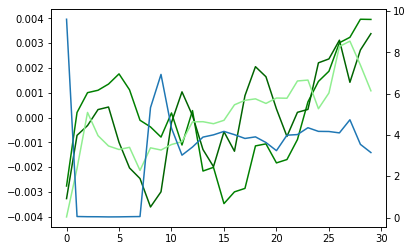

In [76]:
f = plt.figure()
ax = f.add_subplot(111)
ax.plot((np.nanmean(errv5_eq, axis=0)-np.nanmean(errv5_eq)), color='green')
ax.plot(np.nanmean(errv7_eq, axis=0)-np.nanmean(errv7_eq), color='darkgreen')
ax.plot(np.nanmean(errv3_eq, axis=0)-np.nanmean(errv3_eq), color='lightgreen')
ax2 = ax.twinx()
ax2.plot(np.nanmean(errc7_eq, axis=0))

In [77]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

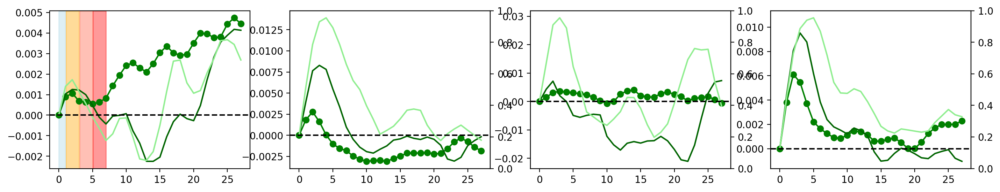

In [104]:
drystart = 1
wetstart = 0
dryend3 = 3
dryend5 = 5
dryend7 = 7

f = plt.figure(figsize=(17,3), dpi=200)


ax = f.add_subplot(141)
e3 = moving_average(np.nanmean(errv3_eq, axis=0),3)
e5 = moving_average(np.nanmean(errv5_eq, axis=0),3)
e7 = moving_average(np.nanmean(errv7_eq, axis=0),3)
ax.plot(e3-e3[0], color='green', marker='o')
ax.plot(e5-e5[0], color='darkgreen')
ax.plot(e7-e7[0], color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')

bottom, top = ax.get_ylim()
ax.add_patch(patches.Rectangle((0, bottom), 1, top-bottom, color='lightblue', alpha=0.4, zorder=0, edgecolor=None))
ax.add_patch(patches.Rectangle((1.1, bottom), 1.9, top-bottom, color='orange', alpha=0.4, zorder=0, edgecolor=None))
ax.add_patch(patches.Rectangle((3.1, bottom), 1.9, top-bottom, color='tomato', alpha=0.4, zorder=0, edgecolor=None))
ax.add_patch(patches.Rectangle((5.1, bottom), 1.9, top-bottom, color='red', alpha=0.4, zorder=0, edgecolor=None))


# ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc5_eq, axis=0))
# ax2.plot(np.nanmean(errc7_eq, axis=0), color='blue')
# ax2.plot(np.nanmean(errc3_eq, axis=0), marker='o', color='lightblue')


ax = f.add_subplot(142)
e3 = moving_average(np.nanmean(errv3, axis=0),3)
e5 = moving_average(np.nanmean(errv5, axis=0),3)
e7 = moving_average(np.nanmean(errv7, axis=0),3)
ax.plot(e3-e3[0], color='green', marker='o')
ax.plot(e5-e5[0], color='darkgreen')
ax.plot(e7-e7[0], color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc5, axis=0))
# ax2.plot(np.nanmean(errc7, axis=0), color='blue')
# ax2.plot(np.nanmean(errc3, axis=0), marker='o', color='lightblue')

ax = f.add_subplot(143)
e3 = moving_average(np.nanmean(errv3_hua, axis=0),3)
e5 = moving_average(np.nanmean(errv5_hua, axis=0),3)
e7 = moving_average(np.nanmean(errv7_hua, axis=0),3)
ax.plot(e3-e3[0], color='green', marker='o')
ax.plot(e5-e5[0], color='darkgreen')
ax.plot(e7-e7[0], color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc5_hua, axis=0))
# ax2.plot(np.nanmean(errc7_hua, axis=0), color='blue')
# ax2.plot(np.nanmean(errc3_hua, axis=0), marker='o', color='lightblue')


ax = f.add_subplot(144)
e3 = moving_average(np.nanmean(errv3_so, axis=0),3)
e5 = moving_average(np.nanmean(errv5_so, axis=0),3)
e7 = moving_average(np.nanmean(errv7_so, axis=0),3)
ax.plot(e3-e3[0], color='green', marker='o')
ax.plot(e5-e5[0], color='darkgreen')
ax.plot(e7-e7[0], color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc5_so, axis=0))
# ax2.plot(np.nanmean(errc7_so, axis=0), color='blue')
# ax2.plot(np.nanmean(errc3_so, axis=0), marker='o', color='lightblue')

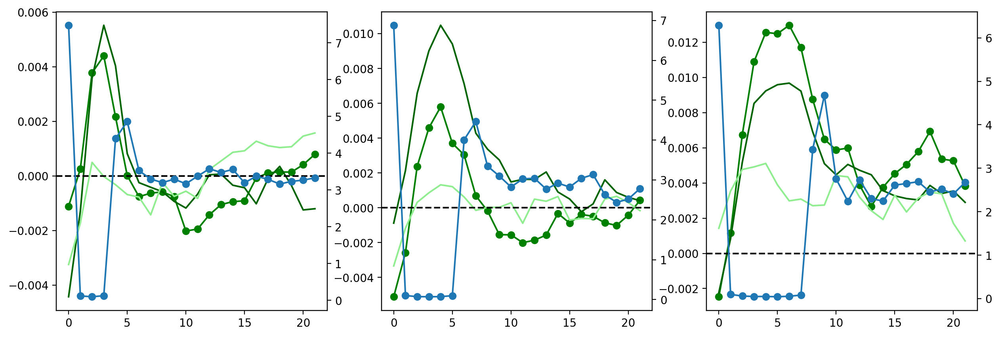

In [274]:
f = plt.figure(figsize=(15,5), dpi=200)
ax = f.add_subplot(131)
ax.plot((np.nanmean(errv3, axis=0)-np.nanmean(errv3)), color='green', marker='o')
ax.plot(np.nanmean(errv3_so, axis=0)-np.nanmean(errv3_so), color='darkgreen')
ax.plot(np.nanmean(errv3_eq, axis=0)-np.nanmean(errv3_eq), color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
#ax2.plot(np.nanmean(errc7_so, axis=0))
# ax2.plot(np.nanmean(errc7_eq, axis=0))
ax2.plot(np.nanmean(errc3, axis=0), marker='o')

ax = f.add_subplot(132)
ax.plot((np.nanmean(errv5, axis=0)-np.nanmean(errv5)), color='green', marker='o')
ax.plot(np.nanmean(errv5_so, axis=0)-vodclim5_so/vodclimcnt5_so, color='darkgreen')
ax.plot(np.nanmean(errv5_eq, axis=0)-np.nanmean(errv5_eq), color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc7_so, axis=0))
# ax2.plot(np.nanmean(errc7_eq, axis=0))
ax2.plot(np.nanmean(errc5, axis=0), marker='o')


ax = f.add_subplot(133)
ax.plot(np.nanmean(errv7, axis=0)-vodclim7/vodclimcnt7, color='green', marker='o')
ax.plot(np.nanmean(errv7_so, axis=0)-np.mean(vodclim7_so/vodclimcnt7_so), color='darkgreen')
ax.plot(np.nanmean(errv7_eq, axis=0)-vodclim7_eq/vodclimcnt7_eq, color='lightgreen')
ax.axhline(0, linestyle='dashed', color='k')
ax2 = ax.twinx()
# ax2.plot(np.nanmean(errc7_so, axis=0))
# ax2.plot(np.nanmean(errc7_eq, axis=0))
ax2.plot(np.nanmean(errc7, axis=0), marker='o')

In [45]:
def lcalc(dat):
    d = np.vstack(dat)
    return np.nanmean(d,axis=0), np.nanmedian(d,axis=0), np.std(d,axis=0)

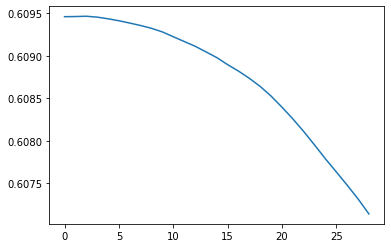

In [46]:
plt.plot((vodclim7/vodclimcnt7))

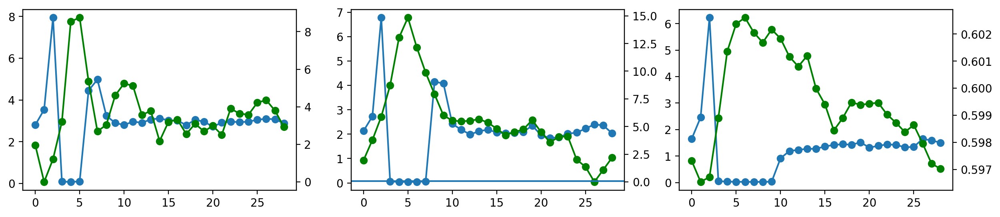

In [47]:
f = plt.figure(figsize=(15,3), dpi=200)


cmean, cmedian, cstd = lcalc(errc3)
vmean, vmedian, vstd = lcalc(errv3)
vdiff = (voddiff3/voddiffcnt3)[0]
ax = f.add_subplot(131)
ax1 = ax.twinx()
# ax.plot(cmean, marker='o')
# ax1.plot( (vmean), color='green', marker='o') #-np.min(vmean))/vdiff*-100
ax.plot(ch3/chcnt3, marker='o')
ax1.plot(((vod3/vodcnt3)-np.min(vod3/vodcnt3))/(voddiff3/voddiffcnt3)[0]*100, color='green', marker='o')  #(vod5/vodcnt5)
#ax1.plot((vod3/vodcnt3), color='green', marker='o')  #(vod5/vodcnt5)
#ax1.plot((vodclim3/vodclimcnt3), color='darkgreen', marker='o')
#ax1.errorbar(np.arange(len(ain)), ain, yerr=errs)                          
#ax1.axhline((voddiff3/voddiffcnt3)[0])


cmean, cmedian, cstd = lcalc(errc5)
vmean, vmedian, vstd = lcalc(errv5)
vdiff = (voddiff5/voddiffcnt5)[0]
ax = f.add_subplot(132)
ax1 = ax.twinx()
#ax1.plot( (vmean-np.min(vmean))/vdiff*-100, color='green', marker='o')
ax.plot(ch5/chcnt5, marker='o')
ax1.plot(((vod5/vodcnt5)-np.min(vod5/vodcnt5))/(voddiff5/voddiffcnt5)[0]*100, color='green', marker='o')  #(vod5/vodcnt5)
ax1.axhline((voddiff5/voddiffcnt5)[0])
#ax1.plot((voddiff5/voddiffcnt5))


cmean, cmedian, cstd = lcalc(errc7)
vmean, vmedian, vstd = lcalc(errv7)
vdiff = (voddiff7/voddiffcnt7)[0]
ax = f.add_subplot(133)
ax1 = ax.twinx()
#ax1.plot( (vmean-np.min(vmean))/vdiff*-100, color='green', marker='o')
ax.plot(ch7/chcnt7, marker='o')
#ax1.plot(((vod7/vodcnt7)-np.min(vod7/vodcnt7))/(voddiff7/voddiffcnt7)[0]*100, color='green', marker='o')
ax1.plot((vod7/vodcnt7), color='green', marker='o') 
#ax1.axhline((voddiff7/voddiffcnt7)[0])

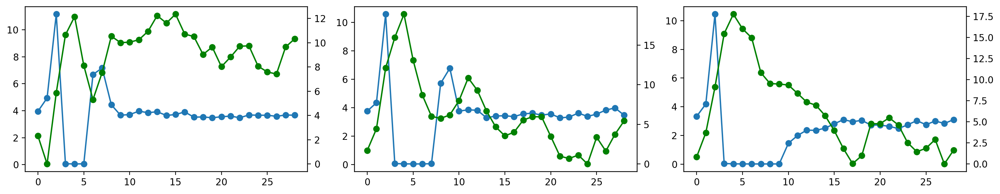

In [182]:
f = plt.figure(figsize=(15,3), dpi=200)
ax = f.add_subplot(131)
ax1 = ax.twinx()
ax.plot(ch3_eq/chcnt3_eq, marker='o')
ax1.plot((vod3_eq/vodcnt3_eq-np.min(vod3_eq/vodcnt3_eq))/(voddiff3_eq/voddiffcnt3_eq)[0]*100, color='green', marker='o')

ax = f.add_subplot(132)
ax1 = ax.twinx()
ax.plot(ch5_eq/chcnt5_eq, marker='o')
ax1.plot((vod5_eq/vodcnt5_eq-np.min(vod5_eq/vodcnt5_eq))/(voddiff5_eq/voddiffcnt5_eq)[0]*100, color='green', marker='o')

ax = f.add_subplot(133)
ax1 = ax.twinx()
ax.plot(ch7_eq/chcnt7_eq, marker='o')
ax1.plot((vod7_eq/vodcnt7_eq-np.min(vod7_eq/vodcnt7_eq))/(voddiff7_eq/voddiffcnt7_eq)[0]*100, color='green', marker='o')
plt.tight_layout()

In [186]:
dic_spells = {'southern' : {'chirps' : [ch3_so, ch5_so, ch7_so], 'chirps_cnt' : [chcnt3_so, chcnt5_so, chcnt7_so], 'vod' : [vod3_so, vod5_so, vod7_so], 'vod_cnt' : [vodcnt3_so, vodcnt5_so, vodcnt7_so], 'vodclim' : [vodclim3_so, vodclim5_so, vodclim7_so], 'vodclim_cnt' : [vodclimcnt3_so, vodclimcnt5_so, vodclimcnt7_so], 'errv' : [errv3_so, errv5_so, errv7_so], 'errc' : [errc3_so, errc5_so, errc7_so]}}

In [187]:
dic_spells['northern'] = {'chirps' : [ch3_eq, ch5_eq, ch7_eq], 'chirps_cnt' : [chcnt3_eq, chcnt5_eq, chcnt7_eq], 'vod' : [vod3_eq, vod5_eq, vod7_eq], 'vod_cnt' : [vodcnt3_eq, vodcnt5_eq, vodcnt7_eq], 'vodclim' : [vodclim3_eq, vodclim5_eq, vodclim7_eq], 'vodclim_cnt' : [vodclimcnt3_eq, vodclimcnt5_eq, vodclimcnt7_eq], 'errv' : [errv3_eq, errv5_eq, errv7_eq], 'errc' : [errc3_eq, errc5_eq, errc7_eq]}

In [188]:
dic_spells['central'] = {'chirps' : [ch3, ch5, ch7], 'chirps_cnt' : [chcnt3, chcnt5, chcnt7], 'vod' : [vod3, vod5, vod7], 'vod_cnt' : [vodcnt3, vodcnt5, vodcnt7], 'vodclim' : [vodclim3, vodclim5, vodclim7], 'errv' : [vodclimcnt3, vodclimcnt5, vodclimcnt7], 'errv' : [errv3, errv5, errv7], 'errc' : [errc3, errc5, errc7]}

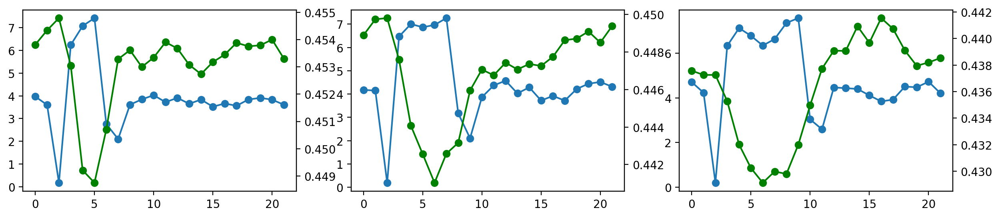

In [82]:
reg = 'central'
indx = 0

f = plt.figure(figsize=(15,3), dpi=200)
ax = f.add_subplot(131)
ax1 = ax.twinx()
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
ax1.plot(dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx], color='green', marker='o')

ax = f.add_subplot(132)
ax1 = ax.twinx()
indx=1
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
ax1.plot(dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx], color='green', marker='o')

ax = f.add_subplot(133)
ax1 = ax.twinx()
indx=2
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
ax1.plot(dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx], color='green', marker='o')

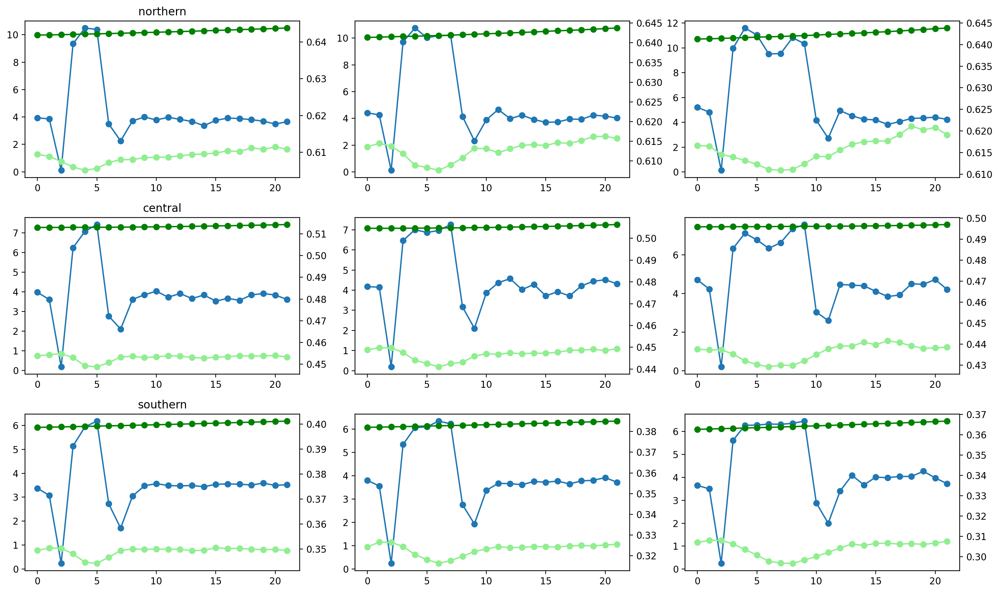

In [89]:
reg = 'northern'


f = plt.figure(figsize=(15,9), dpi=200)
ax = f.add_subplot(331)
ax1 = ax.twinx()
indx = 0
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')
plt.title(reg)

ax = f.add_subplot(332)
ax1 = ax.twinx()
indx=1
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')

ax = f.add_subplot(333)
ax1 = ax.twinx()
indx=2
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')





##################

reg = 'central'
ax = f.add_subplot(334)
ax1 = ax.twinx()
indx = 0
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')
plt.title(reg)

ax = f.add_subplot(335)
ax1 = ax.twinx()
indx=1
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')

ax = f.add_subplot(336)
ax1 = ax.twinx()
indx=2
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')



##################

reg = 'southern'
ax = f.add_subplot(337)
ax1 = ax.twinx()
indx = 0
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')
plt.title(reg)

ax = f.add_subplot(338)
ax1 = ax.twinx()
indx=1
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')

ax = f.add_subplot(339)
ax1 = ax.twinx()
indx=2
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vodp = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot(clim, color='green', marker='o')
ax1.plot(vodp, color='lightgreen', marker='o')

plt.tight_layout()

Text(0.5, 1.0, 'southern')

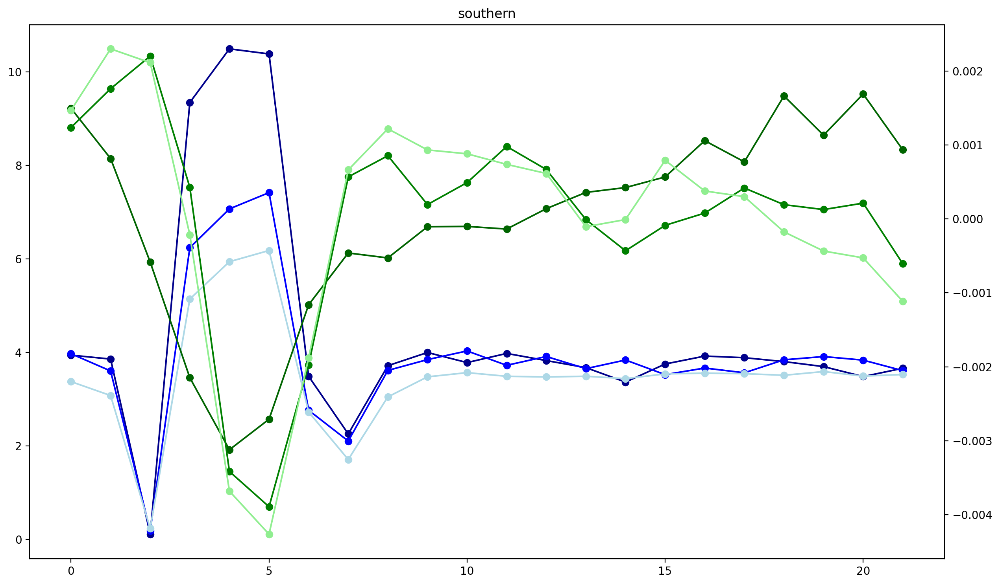

In [83]:


f = plt.figure(figsize=(15,9), dpi=200)
ax = f.add_subplot(111)
reg = 'northern'
ax1 = ax.twinx()
indx = 0
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='darkblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='darkgreen', marker='o')
plt.title(reg)


reg='central'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='blue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='green', marker='o')
plt.title(reg)

reg='southern'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='lightblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='lightgreen', marker='o')
plt.title(reg)

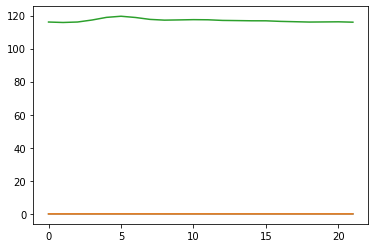

In [67]:
plt.plot((vod-clim)-np.mean(vod-clim))
plt.plot(vod-np.mean(vod))
plt.plot(vod/np.std(vod))

Text(0.5, 1.0, 'southern')

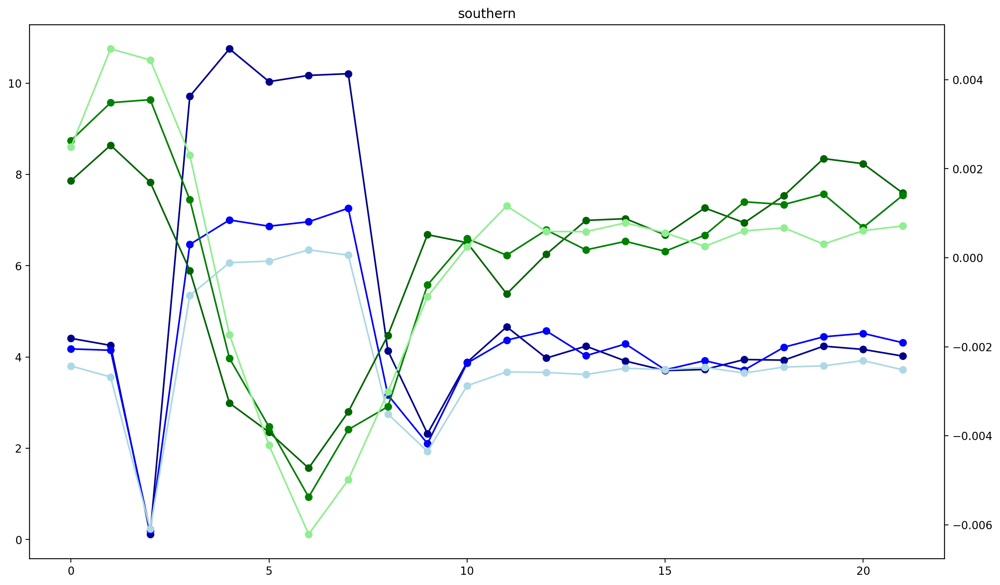

In [84]:


f = plt.figure(figsize=(15,9), dpi=200)
ax = f.add_subplot(111)
reg = 'northern'
ax1 = ax.twinx()
indx = 1
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='darkblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='darkgreen', marker='o')
plt.title(reg)


reg='central'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='blue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='green', marker='o')
plt.title(reg)

reg='southern'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='lightblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='lightgreen', marker='o')
plt.title(reg)

Text(0.5, 1.0, 'southern')

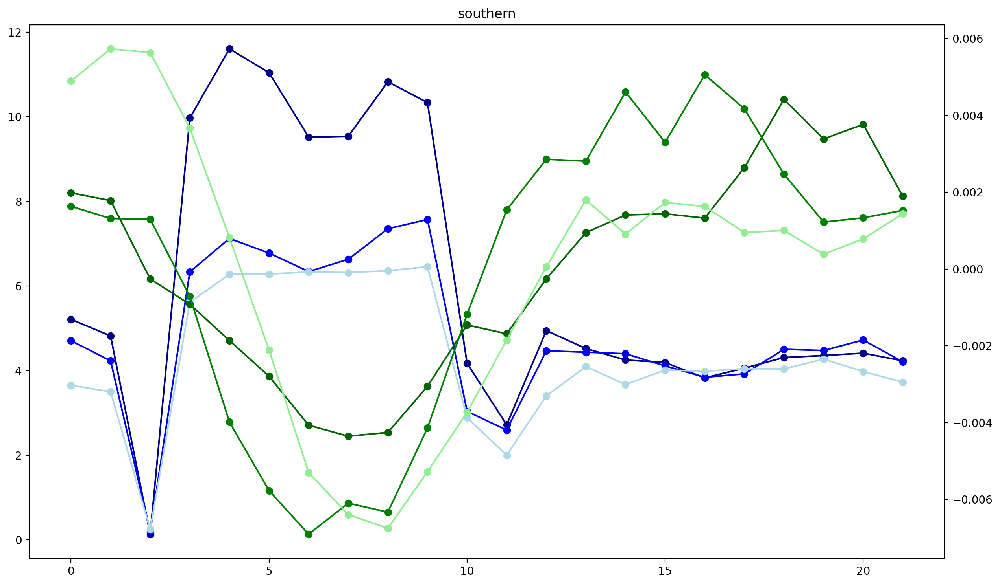

In [85]:

f = plt.figure(figsize=(15,9), dpi=200)
ax = f.add_subplot(111)
reg = 'northern'
ax1 = ax.twinx()
indx = 2
ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='darkblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='darkgreen', marker='o')
plt.title(reg)


reg='central'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='blue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='green', marker='o')
plt.title(reg)

reg='southern'

ax.plot(dic_spells[reg]['chirps'][indx]/dic_spells[reg]['chirps_cnt'][indx], marker='o', color='lightblue')
clim = dic_spells[reg]['vodclim'][indx]/dic_spells[reg]['vodclim_cnt'][indx]
vod = (dic_spells[reg]['vod'][indx]/dic_spells[reg]['vod_cnt'][indx])
ax1.plot((vod-clim)-np.mean(vod-clim), color='lightgreen', marker='o')
plt.title(reg)

In [86]:
# import pickle as pkl
# path = '/media/ck/Elements/SouthAmerica/CHIRPS/'
# pkl.dump(dic_spells, open(path+"wet_spells_dictionary_regions.p", "wb"))